In [9]:
import io
import subprocess
import os
import glob
import sys
import pwd

import pandas as pd
import numpy as np
import scipy
import scipy.stats as stats
from sklearn.decomposition import PCA
import pickle
import re
import math
import plotnine as pn
import seaborn as sns
import glob
import subprocess
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from numpy import log
from collections import defaultdict,Counter
import re
import statsmodels
import warnings
import statsmodels.stats.multitest as smm
import json

from pathlib import Path
from midas import m
from datetime import datetime, date
import altair as alt

# gh specific
sys.path.append('/ghsfa/projects/pharma/shared_scripts/')
import bibp.functions as functions
import hgvslib.pHGVS as pHGVS  ## do a pull on the hgvslib git repo

# !pip install statannotations==0.4.0
# #!pip uninstall statannotations --yes
# from statannotations.Annotator import Annotator

warnings.filterwarnings("ignore")
pd.options.display.max_rows = None
pd.options.display.max_columns=None
pd.options.display.max_colwidth=None
work_dir="/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024"

# Data preocessing

## Pull all RUO/IST data from pharma data warehouse

In [ ]:
# File name list to handle corner case of data readin
header1_list = ["20230627_JNJ_SQ01_17Samples_RevealReport.csv"]
header0_list = [
 '20230928_AstraZeneca_SOW164_46Samples_InfinityReport.csv',
 '20231106_AstraZeneca_SOW164_46Samples_InfinityReport.csv',
 '20231130_BoundlessBio_SOW02_10Samples_InfinityReport.csv',
 '20231207_AstraZeneca_SOW170_188Samples_InfinityReport.csv',
 '20231225_BristolMyersSquibb_SOW29_14Samples_InfinityReport.csv',
 '20231227_CL003_IST01_170Samples_InfinityReport.csv',
 '20240111_AstraZeneca_SOW174_35Samples_InfinityReport.csv',
 '20240116_AstraZeneca_SOW182_40Samples_InfinityReport.csv',
 '20240126_NCC_IST14_35Samples_InfinityReport.csv',
 '20240401_Cyclacel_SOW01_12Samples_InfinityReport.csv',
 '20240422_AstraZeneca_SOW176Monitoring_998Samples_InfinityReport.csv',
 '20221024_SMC_IST_01_198samples_InfinityReport.csv'
]

# Define the folder paths
folders = [
    "/ghsfa/projects/pharma/datawarehouse/Infinity",
    "/ghsfa/projects/pharma/datawarehouse/infinity",
    "/ghsfa/projects/pharma/datawarehouse/data/infinity_ist_report_warehouse",
    "/ghsfa/projects/pharma/datawarehouse/data/infinity_mrd_report_warehouse",
    "/ghsfa/projects/pharma/datawarehouse/data/infinity_report_warehouse"
]

# List to store the dataframes for final merge
dfs = []

# Iterate over each folder
for folder in folders:
    # List all csv files in the folder
    for file in os.listdir(folder):
        file_path = os.path.join(folder, file)
        # Check if the file is a CSV
        if file.endswith('.csv'):
            try:
                # Determine the header row based on the presence of "MRD" in the filename
                # Some corner cases
                if file in header0_list:
                    df = pd.read_csv(file_path, header=0)
                elif file in header1_list:
                    df = pd.read_csv(file_path, header=1)
                elif "MRD" in file.upper():
                    df = pd.read_csv(file_path, header=0)
                elif "Reveal" in file:
                    df = pd.read_csv(file_path, header=0)
                else:
                    df = pd.read_csv(file_path, header=1)

                # Select specified columns, handling cases where some columns might not exist
                columns = ['Study_ID', 'GHRequestID', 'GHSampleID', 'Patient_ID', 'Visit_name', 'Max_percentage', 'Sample_status', 'Sample_comment', 'cfDNA_ng', 'Plasma_ml_input', 'Cancertype']
                df_sub = df.loc[:, df.columns.isin(columns)].copy()

                # Drop duplicates based on 'GHSampleID'
                df_sub_dedup = df_sub.drop_duplicates(subset=["GHSampleID"])

                # Add a column for the CSV file name
                df_sub_dedup['csv_file_name'] = file

                # Get the UID of the file owner and convert it to a username
                file_stats = os.stat(file_path)
                file_uid = file_stats.st_uid
                file_creator = pwd.getpwuid(file_uid).pw_name
                df_sub_dedup['file_creator'] = file_creator

                # Append the processed dataframe to the list
                dfs.append(df_sub_dedup)
            except pd.errors.ParserError:
                print(f"Error reading file: {file_path} - possibly incorrect header.")
            except Exception as e:
                print(f"An unexpected error occurred with file: {file_path} - {str(e)}")

# Merge all dataframes into a final DataFrame
df_merged = pd.concat(dfs, ignore_index=True)
df_merged.head()


In [ ]:
# Filter out rows where GHSampleID is NaN
nan_sample_ids = df_merged[df_merged['GHSampleID'].isna()]
print("Total # of this RUO summary data missing GHSampleID is " + str(nan_sample_ids.shape[0]) + "\n") 

# Group by csv_file_name and take the first row from each group
unique_csv_with_nan = nan_sample_ids.groupby('csv_file_name').first().reset_index()
unique_csv_with_nan

In [ ]:
# Readin samples 
df_merged_1 = df_merged.copy()

# Filter for "Sample_status" == "SUCCESS"
df_merged_1 = df_merged_1[df_merged_1['Sample_status'] == "SUCCESS"]
print("Total size of this RUO summary data is " + str(df_merged_1.shape[0]) + "\n") 
print("Total unique sample size of this RUO/IST summary data is " + str(df_merged_1.GHSampleID.nunique()) + "\n")
print("Total NaN in cancer type of this RUO/IST  summary data is " + str(df_merged_1.Cancertype.isnull().sum()) + "\n")

# Drop duplicates 
df_merged_dedup = df_merged_1.drop_duplicates(subset=["GHSampleID"])
print("Total size of this RUO/IST summary data is " + str(df_merged_dedup.shape[0]) + "\n") 

# Regular expression to extract 'Account' and 'SOW_num'
# pattern = r'_(?P<Account>[^_]+)_SOW(?P<SOW_num>\d+)'
# pattern = r'_(?P<Account>[^_]+?)(?:_.+?)?_SOW(?P<SOW_num>\d+)'

# Regular expression to extract 'Account', 'SOW_num', and 'report_date'
pattern = r'(?P<report_date>^\d+)_?(?P<Account>[^_]+)_([^_]+)'

# Using str.extract() to create new columns in the DataFrame
df_merged_dedup[['report_date', 'Account', 'SOW_num']] = df_merged_dedup['csv_file_name'].str.extract(pattern)

df_merged_dedup.head()

In [ ]:
# Check the edge case the Account name or SOW name is not extractable
df_unextractable = df_merged_dedup[df_merged_dedup.Account.isna()]
print("Total unique unextractable csv files of this RUO/IST summary data is " + str(df_unextractable.csv_file_name.nunique()) + "\n")
df_unextractable.csv_file_name.unique()

In [ ]:
# Merge cancer type information from /ghsfa/projects/pharma/datawarehouse/pdw/raw/latest/fact_accessions.tsv
df_cancer_type_fact = pd.read_table("/ghsfa/projects/pharma/datawarehouse/pdw/raw/latest/fact_accessions.tsv")
df_cancer_type_fact_1 = df_cancer_type_fact.copy()

#merge the "runid" information from the fact_accessions.tsv
df_cancer_type_fact_1.rename(columns={'accn_id': 'GHRequestID'}, inplace=True)
df_merged_1 = df_merged_dedup.merge(df_cancer_type_fact_1[["GHRequestID", "cancer_category", "cancerother", "cancerstage", "cancertype"]], on = "GHRequestID", how = "left")
print("Total sample size of the RUO/IST summary is " + str(df_merged_1.shape[0]) + "\n") 
print('Total NaN in cancer type of the column "cancerother" in this RUO/IST summary data is ' + str(df_merged_1.cancerother.isnull().sum()) + "\n")
df_merged_1.head()

# Save the dataframe
df_merged_1.to_csv(f"{work_dir}/df_merged_warehouse.csv", index = False)

## Pull the latest RUO/IST data from pharma data warehouse (after 6/1/2024)

In [61]:
import pwd
from datetime import datetime

# Define the folder paths
folders = [
    "/ghsfa/projects/pharma/datawarehouse/Infinity",
    "/ghsfa/projects/pharma/datawarehouse/infinity",
    "/ghsfa/projects/pharma/datawarehouse/data/infinity_ist_report_warehouse",
    "/ghsfa/projects/pharma/datawarehouse/data/infinity_mrd_report_warehouse",
    "/ghsfa/projects/pharma/datawarehouse/data/infinity_report_warehouse"
]

# File name lists for different headers
header1_list = ["20230627_JNJ_SQ01_17Samples_RevealReport.csv"]
header0_list = [
    '20230928_AstraZeneca_SOW164_46Samples_InfinityReport.csv',
    '20231106_AstraZeneca_SOW164_46Samples_InfinityReport.csv',
    '20231130_BoundlessBio_SOW02_10Samples_InfinityReport.csv',
    '20231207_AstraZeneca_SOW170_188Samples_InfinityReport.csv',
    '20231225_BristolMyersSquibb_SOW29_14Samples_InfinityReport.csv',
    '20231227_CL003_IST01_170Samples_InfinityReport.csv',
    '20240111_AstraZeneca_SOW174_35Samples_InfinityReport.csv',
    '20240116_AstraZeneca_SOW182_40Samples_InfinityReport.csv',
    '20240126_NCC_IST14_35Samples_InfinityReport.csv',
    '20240401_Cyclacel_SOW01_12Samples_InfinityReport.csv',
    '20240422_AstraZeneca_SOW176Monitoring_998Samples_InfinityReport.csv',
    '20221024_SMC_IST_01_198samples_InfinityReport.csv'
]

# List to store the dataframes for final merge
dfs = []

# Iterate over each folder
for folder in folders:
    # List all csv files in the folder
    for file in os.listdir(folder):
        file_path = os.path.join(folder, file)
        # Check if the file is a CSV
        if file.endswith('.csv'):
            # Filter files based on modification date
            last_modified_time = datetime.fromtimestamp(os.path.getmtime(file_path))
            if last_modified_time > datetime(2024, 6, 1):
                try:
                    # Determine the header row based on the presence of "MRD" in the filename
                    if file in header0_list:
                        df = pd.read_csv(file_path, header=0)
                    elif file in header1_list:
                        df = pd.read_csv(file_path, header=1)
                    elif "MRD" in file.upper():
                        df = pd.read_csv(file_path, header=0)
                    elif "Reveal" in file:
                        df = pd.read_csv(file_path, header=0)
                    else:
                        df = pd.read_csv(file_path, header=1)

                    # Select specified columns, handling cases where some columns might not exist
                    columns = ['Study_ID', 'GHRequestID', 'GHSampleID', 'Patient_ID', 'Visit_name', 'Max_percentage', 'Sample_status', 'Sample_comment', 'cfDNA_ng', 'Plasma_ml_input', 'Cancertype']
                    df_sub = df.loc[:, df.columns.isin(columns)].copy()

                    # Drop duplicates based on 'GHSampleID'
                    df_sub_dedup = df_sub.drop_duplicates(subset=["GHSampleID"])

                    # Add a column for the CSV file name
                    df_sub_dedup['csv_file_name'] = file

                    # Get the UID of the file owner and convert it to a username
                    file_stats = os.stat(file_path)
                    file_uid = file_stats.st_uid
                    file_creator = pwd.getpwuid(file_uid).pw_name
                    df_sub_dedup['file_creator'] = file_creator

                    # Append the processed dataframe to the list
                    dfs.append(df_sub_dedup)
                except pd.errors.ParserError:
                    print(f"Error reading file: {file_path} - possibly incorrect header.")
                except Exception as e:
                    print(f"An unexpected error occurred with file: {file_path} - {str(e)}")

# Merge all dataframes into a final DataFrame
df_merged_latest = pd.concat(dfs, ignore_index=True)
df_merged_latest.head()


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN


In [63]:
# Filter out rows where GHSampleID is NaN
nan_sample_ids = df_merged_latest[df_merged_latest['GHSampleID'].isna()]
print("Total # of this RUO summary data missing GHSampleID is " + str(nan_sample_ids.shape[0]) + "\n") 

# Group by csv_file_name and take the first row from each group
unique_csv_with_nan = nan_sample_ids.groupby('csv_file_name').first().reset_index()
unique_csv_with_nan.head()

Total # of this RUO summary data missing GHSampleID is 17021



,csv_file_name,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,file_creator,Max_percentage
0,20240312_TakedaOncology_SOW03_11Samples_Monitoring_InfinityReport.csv,None,None,None,None,None,None,None,NaN,NaN,None,ayablonovitch,NaN
1,20240312_TakedaOncology_SOW03_11Samples_OnTreatment_InfinityReport.csv,None,None,None,None,None,None,None,NaN,NaN,None,ayablonovitch,NaN
2,20240426_AstraZeneca_SOW187_Monitoring_236Samples_TFv2_InfinityReport.csv,None,None,None,None,None,None,None,NaN,NaN,None,ewarner,NaN
3,20240604_TakedaOncology_SOW04_8Samples_Monitoring_InfinityReport.csv,None,None,None,None,None,None,None,NaN,NaN,None,ayablonovitch,NaN
4,20240604_TakedaOncology_SOW04_8Samples_OnTreatment_InfinityReport.csv,None,None,None,None,None,None,None,NaN,NaN,None,ayablonovitch,NaN


In [64]:
# Readin samples 
df_merged_1 = df_merged_latest.copy()

# Filter for "Sample_status" == "SUCCESS"
df_merged_1 = df_merged_1[df_merged_1['Sample_status'] == "SUCCESS"]
print("Total size of this RUO summary data after 6/1/2024 is " + str(df_merged_1.shape[0]) + "\n") 
print("Total unique sample size of this RUO/IST summary data after 6/1/2024 is " + str(df_merged_1.GHSampleID.nunique()) + "\n")
print("Total NaN in cancer type of this RUO/IST  summary data after 6/1/2024 is " + str(df_merged_1.Cancertype.isnull().sum()) + "\n")

# Drop duplicates 
df_merged_dedup = df_merged_1.drop_duplicates(subset=["GHSampleID"])
print("Total size of this RUO/IST summary data after 6/1/2024 is " + str(df_merged_dedup.shape[0]) + "\n") 

# Regular expression to extract 'Account' and 'SOW_num'
# pattern = r'_(?P<Account>[^_]+)_SOW(?P<SOW_num>\d+)'
# pattern = r'_(?P<Account>[^_]+?)(?:_.+?)?_SOW(?P<SOW_num>\d+)'

# Regular expression to extract 'Account', 'SOW_num', and 'report_date'
pattern = r'(?P<report_date>^\d+)_?(?P<Account>[^_]+)_([^_]+)'

# Using str.extract() to create new columns in the DataFrame
df_merged_dedup[['report_date', 'Account', 'SOW_num']] = df_merged_dedup['csv_file_name'].str.extract(pattern)

df_merged_dedup.head()

Total size of this RUO summary data after 6/1/2024 is 14061

Total unique sample size of this RUO/IST summary data after 6/1/2024 is 6278

Total NaN in cancer type of this RUO/IST  summary data after 6/1/2024 is 9226

Total size of this RUO/IST summary data after 6/1/2024 is 6279



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4


In [65]:
# Check the edge case the Account name or SOW name is not extractable
df_unextractable = df_merged_dedup[df_merged_dedup.Account.isna()]
print("Total unique unextractable csv files of this RUO/IST summary data after 6/1/2024 is " + str(df_unextractable.csv_file_name.nunique()) + "\n")
df_unextractable.csv_file_name.unique()

Total unique unextractable csv files of this RUO/IST summary data after 6/1/2024 is 0



array([], dtype=object)

In [66]:
# Merge cancer type information from /ghsfa/projects/pharma/datawarehouse/pdw/raw/latest/fact_accessions.tsv
df_cancer_type_fact = pd.read_table("/ghsfa/projects/pharma/datawarehouse/pdw/raw/latest/fact_accessions.tsv")
df_cancer_type_fact_1 = df_cancer_type_fact.copy()

#merge the "runid" information from the fact_accessions.tsv
df_cancer_type_fact_1.rename(columns={'accn_id': 'GHRequestID'}, inplace=True)
df_merged_1 = df_merged_dedup.merge(df_cancer_type_fact_1[["GHRequestID", "cancer_category", "cancerother", "cancerstage", "cancertype"]], on = "GHRequestID", how = "left")
print("Total sample size of the RUO/IST summary after 6/1/2024 is " + str(df_merged_1.shape[0]) + "\n") 
print('Total NaN in cancer type of the column "cancerother" in this RUO/IST summary data after 6/1/2024 is ' + str(df_merged_1.cancerother.isnull().sum()) + "\n")
df_merged_1.head()

Total sample size of the RUO/IST summary after 6/1/2024 is 6279

Total NaN in cancer type of the column "cancerother" in this RUO/IST summary data after 6/1/2024 is 4151



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerother,cancerstage,cancertype
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN


In [78]:
# Combine all the cumulative data
# Readin historical data
df_merged_all = pd.read_csv(f"{work_dir}/df_merged_warehouse.csv", header = 0)
df_merged_all.head()

# Concatenate the dataframes with df_merged_1 first so its entries take precedence
df_combined = pd.concat([df_merged_1, df_merged_all])

# Drop duplicates based on the unique identifier, keeping the first occurrence (from df_merged_1)
df_final = df_combined.drop_duplicates(subset=['GHSampleID'], keep='first')
df_final.reset_index(drop=True, inplace=True)

print("Total sample size of the RUO/IST summary after 6/1/2024 by 07/23/2024 is " + str(df_final.shape[0]) + "\n") 
print('Total NaN in cancer type of the column "cancerother" in this RUO/IST summary data after 6/1/2024 by 07/23/2024 is ' + str(df_final.cancerother.isnull().sum()) + "\n")

# Save the dataframe
df_final.to_csv(f"{work_dir}/df_merged_warehouse_by07232024.csv", index = False)

Total sample size of the RUO/IST summary after 6/1/2024 by 07/23/2024 is 27877

Total NaN in cancer type of the column "cancerother" in this RUO/IST summary data after 6/1/2024 by 07/23/2024 is 15681



## Pull data from gh_sample database

In [ ]:
# # Define the IDs you want to query for
# ids = ('B00459143', 'B00459152', 'B00651690')

# # Generate the SQL query string
# query = "SELECT * FROM gh_sample WHERE run_sample_id IN {}".format(ids)
# # query = "SELECT * FROM gh_sample WHERE run_sample_id IN {}".format(tuple(mrd_all_cols_df['run_sample_id'].unique()))

# # Run the query using your existing function
# sample_df = functions.run_sql_query(query)
# sample_df.head()

In [5]:
# SQL query
query = """
SELECT *
FROM gh_sample
WHERE panel LIKE '%Sirius%' AND
      sample_type = 'Research' AND
      product = 'Guardant 360'
"""

# Run the query using your existing function
sample_df = functions.run_sql_query(query)

print("Total size of this RUO summary data is " + str(sample_df.shape[0]) + "\n") 
print("Total unique sample size of this RUO summary data is " + str(sample_df.run_sample_id.nunique()) + "\n")
print("Total NaN in cancer type of this RUO summary data is " + str(sample_df.cancer_type.isnull().sum()) + "\n")

# Drop duplicates 
df_gh_sample_dedup = sample_df.drop_duplicates(subset=["run_sample_id"])
print("Total size of this RUO summary data that pulled from gh_sample database is " + str(df_gh_sample_dedup.shape[0]) + "\n") 
df_gh_sample_dedup.head()

Total size of this RUO summary data is 34062

Total unique sample size of this RUO summary data is 32049

Total NaN in cancer type of this RUO summary data is 32962

Total size of this RUO summary data that pulled from gh_sample database is 32049



,runid,run_sample_id,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case
0,221109_A00770_0586_BHNLGCDSX3,B00226007,ACCTTACTGT,Male,Research,2022-11-11 23:38:12-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,VUM_01_V3,None,68.0,Sirius_v1.0,None,None,None,A0600597,None
1,221109_A01902_0035_AHNLJMDSX3,B00225992,GCTCGGGCCT,Male,Research,2022-11-12 00:13:49-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,BAY_06_G360V3,None,NaN,Sirius_v1.0,None,None,None,A0600999,None
2,221109_A00770_0586_BHNLGCDSX3,B00225969,ATGTGAATGC,Female,Research,2022-11-11 23:38:12-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,VUM_01_V3,None,69.0,Sirius_v1.0,None,None,None,A0600609,None
3,221109_A01902_0035_AHNLJMDSX3,B00226008,CACCCGGGTG,Male,Research,2022-11-12 00:13:54-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,BAY_06_G360V3,None,NaN,Sirius_v1.0,None,None,None,A0601005,None
4,221109_A00770_0587_AHNLKJDSX3,B00226015,ACTTGCCGAC,Female,Research,2022-11-11 23:34:55-08:00,Sirius_v1.0,None,Sirius-1.0.0-RLS,None,None,Guardant 360,VUM_01_V3,None,52.0,Sirius_v1.0,None,None,None,A0600590,None


In [3]:
# For 7/23/2024 update
df_final = pd.read_csv(f"{work_dir}/df_merged_warehouse_by07232024.csv", header = 0)
print(df_final.shape)
df_final.head()

(27877, 20)


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerother,cancerstage,cancertype
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN


In [6]:
# Merge the runid, fc_dir and other information from gh_sample database

#rename the columns to indicate the caller name
df_gh_sample_dedup = df_gh_sample_dedup.rename(columns={"run_sample_id": "GHSampleID"})

df_complete_2 = df_final.merge(df_gh_sample_dedup, on="GHSampleID", how="left")
print(df_complete_2.shape)
df_complete_2.head()

(27877, 40)


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerother,cancerstage,cancertype,runid,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN,240623_A02048_0178_AHG2WKDSXC,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059361,cgp
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN,240623_A02048_0178_AHG2WKDSXC,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059362,cgp
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN,240623_A02048_0178_AHG2WKDSXC,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059363,cgp
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN,240623_A02048_0178_AHG2WKDSXC,TTCGAGCCAG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059364,cgp
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,NaN,240623_A02048_0178_AHG2WKDSXC,CGGAGCAATG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059365,cgp


In [7]:
# Check the samples with missing runid
df_missing_runid = df_complete_2[df_complete_2["runid"].isna()]
df_missing_runid.shape

(4056, 40)

In [8]:
# Query data from "Integration Database" as there are some runid missing in the "Production Database" "gh_sample" database
# This is based on Jessica Kurata's confluence page https://guardanthealth.atlassian.net/wiki/spaces/LUN/pages/1329006199/How+To+Fetch+Data+From+the+Sample+Tracker
import sys
import pandas as pd
import psycopg2 as pg2

# Fetch db credentials
sys.path.append("/ghds/projects/mrd/analyses/notebooks/jkurata/gh_sample_tracker/sampletracker/sampletracker/credentials/")
from env import SAMP_DB_VIEW_USERNAME, SAMP_DB_VIEW_PASSWORD

def sql_query_to_df(query):
    """Run an SQL query on the Guardant PostgreSQL server and return the
    result as a pandas dataframe.
    Args:
        query (str): SQL query string.
    Returns:
        pandas.core.frame.DataFrame: pandas dataframe containing SQL
        query.
    """
    connect = pg2.connect(host="ghbi-live-lunar-sample-metadata-db.clrdmmintk6b.us-west-2.rds.amazonaws.com",
                          database="lunar_sample_metadata_db",
                          user=SAMP_DB_VIEW_USERNAME,
                          password=SAMP_DB_VIEW_PASSWORD)
    df = pd.read_sql_query(query, connect)
    connect.close()
    
    return df

In [9]:
# Drop any NaN values and convert to unique IDs (nan values will be dropped as it will break the SQL query)
unique_ids = df_missing_runid['GHSampleID'].dropna().unique()

# Check if unique_ids is empty to prevent errors
if len(unique_ids) == 0:
    # Handle case with no IDs gracefully
    df_intergration_database = pd.DataFrame()
    print("No valid IDs to query.")
else:
    # Format the tuple correctly for SQL query
    # For a single ID, make it ('ID',) instead of ('ID')
    ids_tuple = tuple(unique_ids)
    if len(ids_tuple) == 1:
        ids_tuple = f"('{ids_tuple[0]}')"
    else:
        ids_tuple = str(ids_tuple)  # This will ensure tuples are formatted with commas

    # Define the SQL query using the formatted tuple
    query = f"SELECT * FROM sample_summary WHERE run_sample_id IN {ids_tuple}"

    # Run the query using your existing function to convert SQL query to DataFrame
    df_intergration_database = sql_query_to_df(query)

print(df_intergration_database.shape)
df_intergration_database.head()

(4047, 29)


,cohort_id,patient_id,cancer_type,cancer_subtype,stage_group,recur,days_to_recurrence,days_to_last_follow_up,visit_name,specimen_type,input_ng,run_sample_id,panel_name,sequenced_sample_qc,mbd_sample_qc,sequenced_sample_description,sequenced_sample_comment,runid,flowcell_qc,sample_id,batch_id,assay_version,patient_comment,extraction_method,fragmentation_method,size_selection,sample_type,sample_well_id,ex_quant_well_id
0,None,None,None,None,None,None,None,None,None,None,30.00,B00143335,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143335,PROD-19,Sirius_EAP,None,,,,clinical,H7,None
1,None,None,None,None,None,None,None,None,None,None,30.00,B00143364,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143364,PROD-19,Sirius_EAP,None,,,,clinical,A6,None
2,None,None,None,None,None,None,None,None,None,None,13.46,B00143313,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143313,PROD-19,Sirius_EAP,None,,,,clinical,H4,None
3,None,None,None,None,None,None,None,None,None,None,30.00,B00143316,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143316,PROD-19,Sirius_EAP,None,,,,clinical,A5,None
4,None,None,None,None,None,None,None,None,None,None,30.00,B00143332,sirius_v1.0,,,,,220622_A01744_0010_BHVJTCDSX3,,B00143332,PROD-19,Sirius_EAP,None,,,,clinical,A8,None


In [10]:
# Merge the runid and other information from sample_summary in Integration database
df_integration_database_selected = df_intergration_database[['run_sample_id', 'runid', 'cancer_type']]

#rename the columns to indicate the caller name
df_integration_database_selected = df_integration_database_selected.rename(columns={"run_sample_id": "GHSampleID", "cancer_type": "cancerother"})

# Merge the runid and other information from sample_summary in Integration database
df_complete_3 = df_complete_2.merge(df_integration_database_selected, on="GHSampleID", how="left")

# Handle the 'runid' and 'cancerother' duplication issue caused by merging
df_complete_3['runid'] = np.where(df_complete_3['runid_y'].notna(), df_complete_3['runid_y'], df_complete_3['runid_x'])
df_complete_3['cancerother'] = np.where(df_complete_3['cancerother_y'].notna(), df_complete_3['cancerother_y'], df_complete_3['cancerother_x'])

# Drop the original 'runid_x', 'runid_y', 'cancerother_x', and 'cancerother_y' columns
df_complete_3 = df_complete_3.drop(columns=['runid_x', 'runid_y', 'cancerother_x', 'cancerother_y'])

# Drop nan
df_complete_3 = df_complete_3[~df_complete_3["runid"].isna()]

print("Total size of the merged data is " + str(df_complete_3.shape[0]) + "\n") 
print("Total size of the merged data with missing runid is " + str(df_complete_3.runid.isnull().sum()) + "\n") 
print("Total size of the merged data with missing GHSampleID is " + str(df_complete_3.GHSampleID.isnull().sum()) + "\n") 

df_complete_3.head()

Total size of the merged data is 27868

Total size of the merged data with missing runid is 0

Total size of the merged data with missing GHSampleID is 0



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059361,cgp,240623_A02048_0178_AHG2WKDSXC,NaN
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059362,cgp,240623_A02048_0178_AHG2WKDSXC,NaN
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059363,cgp,240623_A02048_0178_AHG2WKDSXC,NaN
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TTCGAGCCAG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059364,cgp,240623_A02048_0178_AHG2WKDSXC,NaN
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,CGGAGCAATG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059365,cgp,240623_A02048_0178_AHG2WKDSXC,NaN


In [11]:
# TODO: There are samples with missing runid. Need to check 
df_miss_runid = df_complete_3[df_complete_3["runid"].isna()]
df_miss_runid.csv_file_name.value_counts()
print(df_miss_runid.shape)

df_complete_3 = df_complete_3[~df_complete_3["runid"].isna()]
print("Total size of the merged data with missing runid is " + str(df_complete_3.runid.isnull().sum()) + "\n") 
print("Total size of the merged data with missing GHSampleID is " + str(df_complete_3.GHSampleID.isnull().sum()) + "\n") 

df_complete_3.shape

(0, 40)
Total size of the merged data with missing runid is 0

Total size of the merged data with missing GHSampleID is 0



(27868, 40)

In [12]:
# Prepare the "fc_dir" columns for the data
df_complete_4 = df_complete_3.copy()

# Define the path
# Path to original BIP output dir
fc_dir_all = "/ghsfa/ivd/flowcentral"
fc_dir_omni = "/ghsfa/projects/omni_v2/flowcells"

# Initialize a list to store rows that no BIP ouput found in either of the sources above
rows_no_found = []

# Initialize new columns in the DataFrame
df_complete_4['fc_dir'] = ''

# Iterate over the DataFrame rows
for index, row in df_complete_4.iterrows():
    runid = row["runid"]

    # Find original folder
    pattern_ori = f"{fc_dir_all}/*{runid}*"
    folders = glob.glob(pattern_ori)
    if folders:
        df_complete_4.loc[index, 'fc_dir'] = folders[0]
    else:
        # Search in the alternative directory if no folder found in the first directory
        pattern_omni = f"{fc_dir_omni}/*{runid}*"
        folders_omni = glob.glob(pattern_omni)
        if folders_omni:
            df_complete_4.loc[index, 'fc_dir'] = folders_omni[0]
        else:
            # Print warning if no folder is found in either location
            rows_no_found.append(row)
            # print(f"No suitable folder found for {runid}")
            
# Create a DataFrame with rows where folders were not found in any sources
df_no_fc_dir = pd.DataFrame(rows_no_found)

df_complete_4.head()


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059361,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059362,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059363,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TTCGAGCCAG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059364,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,CGGAGCAATG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,None,Sirius-1.1.4-RLS,None,None,Guardant 360,PFE_46_Infinity_TP4,None,NaN,Sirius_LDT_Soft_v2.0,None,None,None,A1059365,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857


In [13]:
# Save file 
df_complete_4.to_csv(f"{work_dir}/df_complete_4.csv", index=False)
df_no_fc_dir.to_csv(f"{work_dir}/df_no_fc_dir.csv", index=False)

In [14]:
# Drop missing fc_dir
df_complete_4 = pd.read_csv(f"{work_dir}/df_complete_4.csv", header = 0)
df_no_fc_dir = pd.read_csv(f"{work_dir}/df_no_fc_dir.csv", header = 0)

df_complete_4_fc_dir_dropna = df_complete_4[df_complete_4["fc_dir"] != ""]
print("Total size of RUO summary with fc_dir info is " + str(df_complete_4_fc_dir_dropna.shape[0]) + "\n") 
print("Total size of RUO summary with fc_dir missing is " + str(df_no_fc_dir.shape[0]) + "\n") 
df_no_fc_dir.head()

Total size of RUO summary with fc_dir info is 27868

Total size of RUO summary with fc_dir missing is 54



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir
0,C4221015,A0621543,B00258552,10361005,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,51.545,4.0,NaN,20230725_Pfizer_SOW46_TP2_batch2_71Samples_G360Report.csv,clai,NaN,20230725.0,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN
1,C4221015,A0621544,B00258554,10361006,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,50.635,4.0,NaN,20230725_Pfizer_SOW46_TP2_batch2_71Samples_G360Report.csv,clai,NaN,20230725.0,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN
2,C4221015,A0621545,B00258540,10371002,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,18.005,3.0,NaN,20230725_Pfizer_SOW46_TP2_batch2_71Samples_G360Report.csv,clai,NaN,20230725.0,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN
3,C4221015,A0621546,B00258542,10371003,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,29.835,2.0,NaN,20230725_Pfizer_SOW46_TP2_batch2_71Samples_G360Report.csv,clai,NaN,20230725.0,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN
4,C4221015,A0621547,B00258544,10371004,Phase 3: Cycle 1 Day 15,SUCCESS,NaN,41.860,5.0,NaN,20230725_Pfizer_SOW46_TP2_batch2_71Samples_G360Report.csv,clai,NaN,20230725.0,Pfizer,SOW46,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,221220_A01422_0280_AHKWMFDSX5,NaN,NaN


In [15]:
# TODO: Check the samples with missing fc_dir based on its runid
print("Total size of RUO summary with fc_dir missing is " + str(df_no_fc_dir.shape[0]) + "\n") 


Total size of RUO summary with fc_dir missing is 54



## Group cancer type and define baseline samples

In [16]:
# Readin data
df_complete_5 = df_complete_4_fc_dir_dropna.copy()

# Pull the clinical data information from ClinicalTrials.gov https://clinicaltrials.gov/search?cond=Cancer for 'Other IDs', 'Conditions', 'Sponsor' columns
# Readin clinical data that also includes the cancer type information in the column "Conditions"
# df_clinical_trial = pd.read_csv('/ghsfa/projects/pharma/scratch/gyalamanchili/clinical_trial_data_leverage/ctg-studies.csv') # From Geethika
df_clinical_trial = pd.read_csv(f'{work_dir}/ctg_studies_07232024.csv') # From ClinicalTrials.gov by 07/23/2024

df_clinical_trial.head()

,Conditions,Sponsor,Other IDs
0,Esophageal Neoplasms|Stomach Neoplasms|Weight Loss|Malnutrition,"St. James's Hospital, Ireland",CRFSJ 0058|2014-12 CA
1,Atypical Squamous Cells of Undetermined Significance|Cervical Cancer|High-grade Squamous Intraepithelial Lesion|Low-grade Squamous Intraepithelial Lesion,National Cancer Institute (NCI),NCI-2012-02623|UCI#02-55|N01CN25139|CDR0000383786
2,Colorectal Cancer,Norwegian University of Science and Technology,2012/1707
3,"Lymphoma|Lymphoma, Non-Hodgkin|Large B Cell Diffuse Lymphoma",Jonsson Comprehensive Cancer Center,17-001275|SU-07072011-8046|19997|17-001275|JCCCID811
4,Pleural Malignant Mesothelioma,National Cancer Institute (NCI),NCI-2017-00633|NCI-2017-00633|MC1721|10107|10107|UM1CA186686|UM1CA186709


In [ ]:
# # First, we should ensure the 'Other IDs' in df_clinical_trial are in string format
# df_clinical_trial['Other IDs'] = df_clinical_trial['Other IDs'].astype(str)

# # We create a mask to identify matching rows
# mask = df_complete_5['Study_ID'].apply(lambda x: df_clinical_trial['Other IDs'].str.contains(x).any() if pd.notna(x) else False)

# # We then prepare a DataFrame that only includes matching records
# matching_records = df_clinical_trial[df_clinical_trial['Other IDs'].apply(lambda other_ids: any(df_complete_5['Study_ID'].apply(lambda study_id: study_id in other_ids if pd.notna(study_id) else False)))]

# # Merging selected columns based on the mask into df_complete_5
# df_complete_5 = df_complete_5.merge(matching_records[['Other IDs', 'Conditions', 'Sponsor']], left_on='Study_ID', right_on='Other IDs', how='left')

# # Rename 'Other IDs' to 'Other ID' as per your requirement
# df_complete_5.rename(columns={'Other IDs': 'Other ID'}, inplace=True)

# # Fill NaN values for unmatched rows
# df_complete_5[['Conditions', 'Sponsor', 'Other ID']].fillna('nan', inplace=True)

# # Display the updated DataFrame
# df_complete_5.head()


In [17]:
# This step takes around 140min to finish
# Ensure 'Other IDs' is in string format and handle missing values
df_clinical_trial['Other IDs'] = df_clinical_trial['Other IDs'].astype(str)

# Using a case-insensitive and non-regex match for a more flexible and robust search
mask = df_complete_5['Study_ID'].apply(lambda x: df_clinical_trial['Other IDs'].str.contains(r"\b" + re.escape(x) + r"\b", na=False, case=False, regex=True).any() if pd.notna(x) else False)

# Preparing a DataFrame that only includes matching records
matching_records = df_clinical_trial[df_clinical_trial['Other IDs'].apply(
    lambda other_ids: any(
        df_complete_5['Study_ID'].apply(
            lambda study_id: re.search(r"\b" + re.escape(study_id) + r"\b", other_ids, flags=re.IGNORECASE) is not None if pd.notna(study_id) else False
        )
    )
)]

# Merging selected columns based on the mask into df_complete_5
df_complete_5 = df_complete_5.merge(matching_records[['Other IDs', 'Conditions', 'Sponsor']], left_on='Study_ID', right_on='Other IDs', how='left')

# Rename 'Other IDs' to 'Other ID'
df_complete_5.rename(columns={'Other IDs': 'Other ID'}, inplace=True)

# Fill NaN values for unmatched rows
df_complete_5[['Conditions', 'Sponsor', 'Other ID']].fillna('nan', inplace=True)

# Display the updated DataFrame
df_complete_5.head()


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059361,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059362,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059363,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TTCGAGCCAG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059364,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,20240628.0,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,CGGAGCAATG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059365,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN


In [20]:
# Save the data
df_complete_5.to_csv(f"{work_dir}/df_complete_5_07242024.csv", index=False)


In [50]:
# Readin the data
df_complete_5 = pd.read_csv(f"{work_dir}/df_complete_5_07242024.csv", header = 0)

df_complete_5_with_clinical_cancer_type = df_complete_5[~df_complete_5["Conditions"].isna()]
print("Total size of RUO summary with clinical cancer type information is " + str(df_complete_5_with_clinical_cancer_type.shape[0]) + "\n") 

df_complete_5_with_clinical_cancer_type.head()


Total size of RUO summary with clinical cancer type information is 2954



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor
37,M23-385,A1068211,B00702702,9002-011,P2-4C1D1,SUCCESS,NaN,13.88,2.5,SCLC,20240717_AbbVie_SOW18_Batch2_38Samples_InfinityReport.csv,amak,52.57,20240717.0,AbbVie,SOW18,Other,NaN,NaN,CGATAGGAAT,Unknown,Research,2024-07-10 22:50:53-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,ABB_18,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1068211,cgp,240708_A01467_0533_BHG2WNDSXC,SCLC,/ghsfa/ivd/flowcentral/240708_A01467_0533_BHG2WNDSXC.a9405938-1f4c-4d67-ad9f-714f526327d3.20240710154958,M23-385,Advanced Solid Tumors,AbbVie
38,M23-385,A1068212,B00702700,9012-020,P1C1D1,SUCCESS,Low Diversity Warning; Methylation Suppression Warning,1.41,2.5,CNS TUMOR,20240717_AbbVie_SOW18_Batch2_38Samples_InfinityReport.csv,amak,0.00,20240717.0,AbbVie,SOW18,Other,NaN,NaN,TGCTACGCAA,Unknown,Research,2024-07-07 21:51:47-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,ABB_18,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1068212,cgp,240705_A01613_0419_AHG3GCDSXC,CNS TUMOR,/ghsfa/ivd/flowcentral/240705_A01613_0419_AHG3GCDSXC.9c793fe1-3002-430c-8586-750fcf4c2104.20240707145048,M23-385,Advanced Solid Tumors,AbbVie
39,M23-385,A1068213,B00702705,9003-010,P2-4C1D1,SUCCESS,NaN,25.69,2.5,SCLC,20240717_AbbVie_SOW18_Batch2_38Samples_InfinityReport.csv,amak,41.54,20240717.0,AbbVie,SOW18,Other,NaN,NaN,CCATCTTTAC,Unknown,Research,2024-07-07 21:51:47-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,ABB_18,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1068213,cgp,240705_A01613_0419_AHG3GCDSXC,SCLC,/ghsfa/ivd/flowcentral/240705_A01613_0419_AHG3GCDSXC.9c793fe1-3002-430c-8586-750fcf4c2104.20240707145048,M23-385,Advanced Solid Tumors,AbbVie
40,M23-385,A1068214,B00702703,9012-010,P1C1D1,SUCCESS,NaN,28.86,3.0,NEC,20240717_AbbVie_SOW18_Batch2_38Samples_InfinityReport.csv,amak,0.32,20240717.0,AbbVie,SOW18,Other,NaN,NaN,GAAGGATCTC,Unknown,Research,2024-07-07 21:51:47-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,ABB_18,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1068214,cgp,240705_A01613_0419_AHG3GCDSXC,NEC,/ghsfa/ivd/flowcentral/240705_A01613_0419_AHG3GCDSXC.9c793fe1-3002-430c-8586-750fcf4c2104.20240707145048,M23-385,Advanced Solid Tumors,AbbVie
41,M23-385,A1068215,B00702707,9003-007,P2-4C1D1,SUCCESS,NaN,55.12,3.0,SCLC,20240717_AbbVie_SOW18_Batch2_38Samples_InfinityReport.csv,amak,44.98,20240717.0,AbbVie,SOW18,Other,NaN,NaN,TGCGAAGTAC,Unknown,Research,2024-07-07 21:51:47-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,ABB_18,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1068215,cgp,240705_A01613_0419_AHG3GCDSXC,SCLC,/ghsfa/ivd/flowcentral/240705_A01613_0419_AHG3GCDSXC.9c793fe1-3002-430c-8586-750fcf4c2104.20240707145048,M23-385,Advanced Solid Tumors,AbbVie


In [51]:
# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
df_complete_5['cancerother'] = df_complete_5.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Further update 'cancerother' by checking 'Conditions'
df_complete_5['cancerother'] = df_complete_5.apply(
    lambda row: row['Conditions'] if (pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown') and pd.notnull(row['Conditions']) else row['cancerother'],
    axis=1
)

# Regex patterns for each cancer type
regex_patterns = {
    'breast': r'(?i)\bbreast|DCIS|ductal|infiltrating|Triple\s*Negative|TNBC',
    'prostate': r'(?i)\bprostate|Castration-Resistant|mCRPC',
    'esophageal': r'(?i)\besophagus|esophageal',
    'ovarian': r'(?i)\bovarian|BRCA1|Sertoli-Leydig',
    'lung': r'(?i)\blung|NSCLC|SCLC|ADC|SCC|ALK-expressing|adenosquamous|bronchioloalveolar|mixed subtype|papillary type|invasive|small cell|non[-\s]*small[-\s]*cell',
    'bladder': r'(?i)\bbladder|urothelial|transitional\s*cell',
    'pancreatic': r'(?i)\bpancreas|pancreatic|adenocarcinoma',
    'hepatocellular': r'(?i)\bhepatocellular|cholangiocarcinoma|hepatocholangiocarcinoma|intrahepatic',
    'crc': r'(?i)\bcrc|colorectal|colon|rectal|mucinous|rectum',
    'Head_and_Neck': r'(?i)\bhead\s*and\s*neck|HNSCC|adenocarcinoma\sof\ssalivary\sgland',
    'renal': r'(?i)\brenal|kidney',
    'gastric': r'(?i)\bgastric|stomach',
    'endometrial': r'(?i)\bendometrial|uterine|leiomyosarcoma|endometrium',
    'melanoma': r'(?i)\bmelanoma',
    'Gastrointestinal': r'(?i)\bgastrointestinal|gastrooesophageal|gastroesophageal\sjunction|small\sbowel'
}

# Function to categorize cancer based on regex patterns
def categorize_cancer(text):
    if pd.isnull(text):
        return 'unknown'
    for cancer_type, pattern in regex_patterns.items():
        if re.search(pattern, text):
            return cancer_type
    if re.search(r'(?i)unknown', text):  # Check if 'unknown' is anywhere in the text
        return 'unknown'
    return 'other'  # Assign 'other' if no patterns match and it's not 'unknown'

# Apply the categorization function to the 'cancerother' column
df_complete_5['new_defined_cancer_type'] = df_complete_5['cancerother'].apply(categorize_cancer)

# Output the results
df_complete_5['new_defined_cancer_type'].value_counts()


unknown             12199
lung                 5045
breast               2605
endometrial          2146
other                1309
crc                  1219
melanoma              671
bladder               443
gastric               381
renal                 375
pancreatic            361
ovarian               352
prostate              332
esophageal            227
hepatocellular        172
Head_and_Neck          19
Gastrointestinal       12
Name: new_defined_cancer_type, dtype: int64

In [ ]:
# import re

# df_complete_5 = df_complete_4_fc_dir_dropna.copy()

# # Combine 'cancerother' and 'Cancertype' columns
# df_complete_5['cancerother'] = df_complete_5.apply(
#     lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
#     axis=1
# )

# # Regex patterns for each cancer type
# regex_patterns = {
#     'breast': r'(?i)\bbreast|DCIS|ductal|infiltrating|Triple\s*Negative|TNBC',
#     'prostate': r'(?i)\bprostate|Castration-Resistant|mCRPC',
#     'esophageal': r'(?i)\besophagus|esophageal',
#     'ovarian': r'(?i)\bovarian|BRCA1|Sertoli-Leydig',
#     'lung': r'(?i)\blung|NSCLC|SCLC|ADC|SCC|ALK-expressing|adenosquamous|bronchioloalveolar|mixed subtype|papillary type|invasive|small cell|non[-\s]*small[-\s]*cell',
#     'bladder': r'(?i)\bbladder|urothelial|transitional\s*cell',
#     'pancreatic': r'(?i)\bpancreas|pancreatic|adenocarcinoma',
#     'hepatocellular': r'(?i)\bhepatocellular|cholangiocarcinoma|hepatocholangiocarcinoma|intrahepatic',
#     'crc': r'(?i)\bcrc|colorectal|colon|rectal|mucinous|rectum',
#     'Head_and_Neck': r'(?i)\bhead\s*and\s*neck|HNSCC|adenocarcinoma\sof\ssalivary\sgland',
#     'renal': r'(?i)\brenal|kidney',
#     'gastric': r'(?i)\bgastric|stomach',
#     'endometrial': r'(?i)\bendometrial|uterine|leiomyosarcoma|endometrium',
#     'melanoma': r'(?i)\bmelanoma',
#     'Gastrointestinal': r'(?i)\bgastrointestinal|gastrooesophageal|gastroesophageal\sjunction|small\sbowel'
# }

# # Function to categorize cancer based on regex patterns
# def categorize_cancer(text):
#     if pd.isnull(text):
#         return 'unknown'
#     for cancer_type, pattern in regex_patterns.items():
#         if re.search(pattern, text):
#             return cancer_type
#     if re.search(r'(?i)unknown', text):  # Check if 'unknown' is anywhere in the text
#         return 'unknown'
#     return 'other'  # Assign 'other' if no patterns match and it's not 'unknown'

# # Apply the categorization function to the cancerother column
# df_complete_5['new_defined_cancer_type'] = df_complete_5['cancerother'].apply(categorize_cancer)


# df_complete_5['new_defined_cancer_type'].value_counts()


In [52]:
# Check the cancer category for "other"
df_complete_other_cancer = df_complete_5[df_complete_5["new_defined_cancer_type"] == "other"]
df_complete_other_cancer.shape

unique_other_cancer_values = df_complete_other_cancer['cancerother'].unique()
unique_other_cancer_values_list = unique_other_cancer_values.tolist()
print(unique_other_cancer_values_list)

['CNS TUMOR', 'NEC', 'Advanced Solid Tumor, Adult', 'Solid Tumor', 'biliary tract cancer', 'Advanced Solid Tumors', 'Solid Tumors', 'Glioblastoma multiforme', 'Cervical cancer', 'Gallbladder cancer', 'Other', 'Adrenal carcinoma', 'Soft tissue sarcoma', 'EGFR Mutation-Related Tumors', 'Advanced Solid Tumor', 'Solid Tumor, Adult', 'non-squamous cell carcinoma', 'squamous cell carcinoma', 'urachal cancer', 'Advanced Solid Tumor Cancer', 'GEA', 'Merkel cell carcinoma (MCC)', 'Acinic cell carcinoma', 'Solid Tumor, Adult|Lymphoma', 'MTC', 'Papillary thyroid', 'Solid Tumor, Adult|Brain Tumor, Primary|Desmoplastic Small Round Cell Tumor', 'Metastatic Uveal', 'Metastatic Sertoli Cell Testicular Tumor', 'Solid Tumor, Adult|Mesothelioma', 'Large Cell Neuroendocrine', 'Squamous cell carcinoma', 'Synovial sarcoma', 'Large cell neuroendocrine carcinoma', 'Granuloma', 'Benign tumor', 'Carcinoid tumor', 'NUT CARCINOMA', 'Pleomorphic carcinoma', 'Endobronchial carcinoid tumor', 'ASC', 'Pleomorphic aden

In [ ]:
# # Baseline defination is based on Kyle's script: /ghsfa/projects/omni_v2/users/kchang/pancancerTF/clean_visit_name.py
# import re

# def categorize_visit(visit_name):
#     if pd.isna(visit_name):
#         return 'unknown'
    
#     visit_name_clean = str(visit_name).strip().upper()

#     # Consolidated Baseline pattern using regular expression
#     baseline_pattern = r'\b(pre-op|pre[- ]surgery|pre[- ]op|pre[- ]treatment|pre[- ]treatment|baseline|base|screen|screening|prescreening|scr|scrn|phase 3: cycle 1 day 1|c1d1|c1d1pre|c1d1 part 2-4|p1c1d1|v001d1|0|1|timepoint1|v001d1uso|t1|scrn|c1d1$|c1$|^w1$|week0$|week1$|wk0$|visit01|^v1$|pretreat|^c0$|^c0d1$|^1d1$|^d1$|^d1week1$|^d1visit1$)\b'
#     if re.search(baseline_pattern, visit_name_clean, re.IGNORECASE):
#         return 'Baseline'

#     # Treatment categorization rules using regular expressions
#     treatment_pattern = r'\b(treatment|escalation|c\d+d\d+|mono|ccrt|maintc|tx naïve|maintc1d1|maintc8d1|maint|BC2D1|AC2D1)\b'
#     if re.search(treatment_pattern, visit_name_clean, re.IGNORECASE):
#         return 'Treatment'

#     # Post-op categorization rules using regular expressions
#     post_op_pattern = r'\b(post-op|post-surgery|post-resection)\b'
#     if re.search(post_op_pattern, visit_name_clean, re.IGNORECASE):
#         return 'Post-op'

#     # Patterns for unknown category
#     unknown_pattern = r'\b(progression|pd|unknown|discontinuation|end of treatment)\b'
#     if re.search(unknown_pattern, visit_name_clean, re.IGNORECASE):
#         return 'unknown'

#     # Catch-all other category for unmatched cases
#     return 'other'

# # Apply the categorize_visit function to the 'Visit_name' column
# df_complete_5['treatment'] = df_complete_5['Visit_name'].apply(categorize_visit)

# # Verify mapping and count values
# df_complete_5['treatment'].value_counts()


In [53]:
# Baseline defination is based on Kyle's script: /ghsfa/projects/omni_v2/users/kchang/pancancerTF/clean_visit_name.py
import re

def categorize_visit(visit_name):
    if pd.isna(visit_name):
        return 'unknown'
    
    visit_name_clean = str(visit_name).strip().upper()

    # Explicitly handle corner cases
    if '30-DAY FOLLOW-UP ESCALATION' in visit_name_clean:
        return 'other'

    # Consolidated Baseline pattern using regular expression
    baseline_pattern = r'\b(pre-op|pre[- ]surgery|pre[- ]op|pre[- ]treatment|baseline|base|screen|screening|prescreening|scr|scrn|phase 3: cycle 1 day 1|c1d1|c1d1pre|c1d1 part 2-4|p1c1d1|v001d1|0|1|timepoint1|v001d1uso|t1|scrn|c1d1$|c1$|^w1$|week0$|week1$|wk0$|visit01|^v1$|pretreat|^c0$|^c0d1$|^1d1$|^d1$|^d1week1$|^d1visit1|CCRTC1D1)\b'
    if re.search(baseline_pattern, visit_name_clean, re.IGNORECASE):
        return 'Baseline'

    # Adjusted Treatment categorization rules using regular expressions
    treatment_pattern = r'\b(treatment|escalation|mono|ccrt\w*|maint\w*|tx naïve|BC2D1|AC2D1|c\d+d\d+)\b'
    if re.search(treatment_pattern, visit_name_clean, re.IGNORECASE) and not re.search(r'\b(maintenance \(post\)|30-day follow-up escalation)\b', visit_name_clean, re.IGNORECASE):
        return 'Treatment'

    # Post-op categorization rules using regular expressions
    post_op_pattern = r'\b(post-op|post-surgery|post-resection)\b'
    if re.search(post_op_pattern, visit_name_clean, re.IGNORECASE):
        return 'Post-op'

    # Patterns for unknown category
    unknown_pattern = r'\b(progression|pd|unknown|discontinuation|end of treatment|End of Treatment)\b'
    if re.search(unknown_pattern, visit_name_clean, re.IGNORECASE):
        return 'unknown'

    # Catch-all other category for unmatched cases
    return 'other'

# Example of applying the categorize_visit function to the 'Visit_name' column
# Assuming you have a DataFrame df_complete_5 with a column 'Visit_name'
df_complete_5['treatment'] = df_complete_5['Visit_name'].apply(categorize_visit)

# Verify mapping and count values
df_complete_5['treatment'].value_counts()


Baseline     11715
Treatment     7243
other         6523
unknown       1705
Post-op        682
Name: treatment, dtype: int64

In [54]:
# Check the treatment category for "Treatment"
df_complete_treatment = df_complete_5[df_complete_5["treatment"] == "Treatment"]

unique_visit_other_values = df_complete_treatment['Visit_name'].unique()
unique_visit_other_values_list = unique_visit_other_values.tolist()
print(unique_visit_other_values_list)

['C2D1', 'End of Treatment', 'on-treatment', 'C3D1', 'C04D1', 'C4D1', 'C1D15', 'C2D15', 'C2D3-10P1G', 'C2D1 ctDNA/ctRNA', 'C5D1', 'C1D28', 'C9D1', 'C01D01', 'C02D01', 'C03D01', 'C06D01', 'C04D01', 'C05D01', 'C11D1', 'C6D1', 'C7D1', 'C8D1', 'C4D1 PRE', 'C2D1 PRE', 'C3D1 PRE', 'C3D1 PART 2-4', 'C3D1 EXPANSION', 'C3D1 ESCALATION', 'C3D1 PART 2-4*', 'C05D1', 'C3D1*', 'C2D1*', 'QD: C2D1', 'C2D1 PREDOSE', 'AMD2 C5D1', 'ON-TREATMENT', 'On-treatment', 'TREATMENT CHG/ PROGESSION', 'C13D1', 'C07D01', 'C2D8', 'C07D1', 'C16D1', 'C44D1', 'C47D1', 'C18D1', 'C22D1', 'C25D1', 'C29D1', 'C34D1', 'C38D1', 'C42D1', 'C50D1', 'C55D1', 'C59D1', 'C17D1', 'C1D8', 'C23D1', 'C28D1', 'C31D1', 'C35D1', 'C39D1', 'Tx Naïve', 'C2D1 7dy+/7dy PREDOSE', 'B1 C2D1 PREDOSE', 'C10D1', 'C14D1', '3 weeks post treatment', 'C15D1', 'CCRTC2D1', 'MAINTC3D1', 'CCRTC3D1', 'MAINTC2D1', 'MAINTC8D1', 'MAINTC1D1', 'ARM C MAINT C1/8 D1', 'MAINT C1/8 D1', 'MAINT C3 D1', 'C4D1 PREDOSE', 'mainternance (post)', 'AC2D1', 'BC2D1', 'C1D22', 'C

In [55]:
# Generate a cohort-level dataset for cancer-type filling 
print("Total # of this RUO summary data missing cancer type is " + str(df_complete_5.cancerother.isnull().sum()) + "\n") 

df_cancer_missing = df_complete_5[df_complete_5["new_defined_cancer_type"] == "unknown"]

df_cancer_missing_cohort = df_cancer_missing.drop_duplicates(subset = "csv_file_name")
print(df_cancer_missing_cohort.shape)

df_cancer_missing_cohort.to_csv(f"{work_dir}/df_cancer_type_missing_by_cohort.csv", index=False)


Total # of this RUO summary data missing cancer type is 12192

(215, 46)


## Prepare the MBD path where saves ....msre_caller_mr_features.hdr.tsv file 

### Note that: 
1. ....msre_caller_mr_features.hdr.tsv region_id should be labeled as merge_0, merge_1.... Only BIP output after 04/2024 has the correct version of ....msre_caller_mr_features.hdr.tsv file
2. In Sai's MB caller rerun folder, some old batches were generated with the correct ....msre_caller_mr_features.hdr.tsv file. This is the dir:  "/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular"
3. For the samples whose ....msre_caller_mr_features.hdr.tsv file could not be found either of the above 2 sources. MB caller will be applied on those to generate the ...msre_caller_mr_features.hdr.tsv file. The output dir is: output_dir = f"{workdir}/MB_lung_v4_all_output"

### Rerun MB caller to generate the ...msre_caller_mr_features.hdr.tsv file (For some samples that miss msre_caller_mr_features.hdr.tsv file) 

In [ ]:
import epicaller
import epicaller.methylation.methyl_caller

def run_mb_lung_v4_caller_wrapper_slurm(sample_meta_df, mr_model_file, workdir):
    region_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/v05_classification_space.tsv'
    control_region_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/v05_positive_control_regions.tsv'
    lr_model_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/mafband_v2023_06_30/msre_lr_model.tsv'

    jobs_dir = f"{workdir}/MB_lung_v4_all_jobs"
    output_dir = f"{workdir}/MB_lung_v4_all_output"

    # Check and create directories if not exists
    if not os.path.exists(jobs_dir):
        os.makedirs(jobs_dir)

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for _, row in sample_meta_df.iterrows():
        run_sample_id = row["GHSampleID"]
        fc_dir = row["fc_dir"]
        flowcell_id = row["runid"]
        mbd_hyper_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_hyper_molecules.tsv"
        mbd_residual_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_residual_molecules.tsv"
        
        # Check if the molecule file exists
        if not os.path.exists(mbd_hyper_molecules):
            continue

        job_file = f"{jobs_dir}/MB_call_{run_sample_id}.job"
        shebang_content = (f"#!/bin/bash\n"
                           f"#SBATCH --job-name=MB_call_{run_sample_id}\n"
                           f"#SBATCH --nodes=1\n"
                           f"#SBATCH --ntasks=1\n"
                           f"#SBATCH --cpus-per-task=1\n"
                           f"#SBATCH --mem=30gb\n"
                           f"#SBATCH --partition=dev\n"
                           f"#SBATCH --time=00:10:00\n"
                           f"#SBATCH --output={jobs_dir}/MB_call_{run_sample_id}.log\n\n")
        
        with open(job_file, "w") as job_output:
            job_output.write(shebang_content)
            job_output.write("python3 -m epicaller.methylation.methyl_caller " + 
                             f"--hyper-molecule-file {mbd_hyper_molecules} " + 
                             f"--residual-molecule-file {mbd_residual_molecules} " + 
                             f"--region-file {region_file} " +
                             f"--control-region-file {control_region_file} " + 
                             f"--lr-model-file {lr_model_file} " + 
                             f"--mr-model-file {mr_model_file} " +
                             "--min-frag-len 120 --max-frag-len 240 --min-cg-count 12 --max-cg-count 30 --cutsite-count-cutoff 1 --min-mapq 60 " + 
                             f"--sample-id {run_sample_id} --flowcell-id {flowcell_id} --outdir {output_dir}/")
            # print(job_output)    
        os.system(f"sbatch {job_file}")


In [ ]:
#run the function to generate all the MB Lung v4 caller ouputs for df_complete_MB_rerun
# df_complete_MB_rerun was generated based on 05062024 run where all the samples were reran MB caller as long as the MBD file was not found in Sai's rerun folder
run_mb_lung_v4_caller_wrapper_slurm(df_complete_MB_rerun, 
                      "/home/byounggreenwald/LungPan_v4_Caller.model_file.98_spec.tsv", 
                      f"{work_dir}")

In [ ]:
#run the function to generate all the MB Lung v4 caller ouputs for df_complete_MB_rerun
# df_no_mbd_dir was generated from the next block of cells to complete the MBD files list in the folder f"{workdir}/MB_lung_v4_all_output"
run_mb_lung_v4_caller_wrapper_slurm(df_no_mbd_dir, 
                      "/home/byounggreenwald/LungPan_v4_Caller.model_file.98_spec.tsv", 
                      f"{work_dir}")

### Identify MBD path for CSO caller methly data prep

In [56]:
from datetime import datetime

# Prepare the "mbd_dir" columns for the data and need to make sure not only the mbd_dir exits but also it include the ....msre_caller_mr_features.hdr.tsv file
df_complete_6 = df_complete_5.copy()

# Path setup
# Path to MB caller rerun by Sai which include the correct "....msre_caller_mr_features.hdr.tsv" for CSO caller and the path to MB rerun dir for this project fc_dir_mb_rerun = "/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular"
fc_dir_mb_rerun = "/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular" # Sai's MB rerun folder
mb_rerun_new = f"{work_dir}/MB_lung_v4_all_output" # Haiyang's

# Initialize a list to store rows that no ....msre_caller_mr_features.hdr.tsv file found in either of the sources above
rows_no_found_mbd = []

# Initialize new columns in the DataFrame
df_complete_6['mbd_dir'] = ''
df_complete_6['unique_sample_id'] = ''

# Date handling
# If the "report_date" is later than April 2024, the original BIP fc_dir should include the correct ....msre_caller_mr_features.hdr.tsv file to use
df_complete_6['report_date'] = pd.to_datetime(df_complete_6['report_date'], format='%Y%m%d', errors='coerce')
target_date = pd.Timestamp('2024-04-01')

for index, row in df_complete_6.iterrows():
    runid = row["runid"]
    unique_sample_id = row["GHSampleID"] + "_" + runid
    df_complete_6.loc[index, 'unique_sample_id'] = unique_sample_id

    # File checks to make sure not only the folder exists but also the MBD file. Some folders has .gz version
    mbd_file = f"{row['GHSampleID']}.msre_caller_mr_features.hdr.tsv"
    mbd_file_gz = f"{mbd_file}.gz"
    found = False

    # If the "report_date" is later than April 2024, the original BIP fc_dir should include the correct ....msre_caller_mr_features.hdr.tsv file to use
    if pd.notna(row['report_date']):
        if row['report_date'] > target_date:
            # Check original BIP fc_dir
            mbd_path = f"{row['fc_dir']}/{row['GHSampleID']}/{mbd_file}"
            mbd_path_gz = f"{row['fc_dir']}/{row['GHSampleID']}/{mbd_file_gz}"
            if glob.glob(mbd_path) or glob.glob(mbd_path_gz):
                df_complete_6.loc[index, "mbd_dir"] = row['fc_dir'] + "/" + row['GHSampleID']
                found = True
        else:
            # Check mb_rerun_new directory
            mbd_path_new = f"{mb_rerun_new}/{mbd_file}"
            mbd_path_new_gz = f"{mb_rerun_new}/{mbd_file_gz}"
            if glob.glob(mbd_path_new) or glob.glob(mbd_path_new_gz):
                df_complete_6.loc[index, "mbd_dir"] = mb_rerun_new
                found = True

            # Check fc_dir_mb_rerun directory if not found
            if not found:
                pattern_rerun = f"{fc_dir_mb_rerun}/*{runid}*"
                folders = glob.glob(pattern_rerun)
                if folders:
                    mbd_path_rerun = f"{folders[0]}/{mbd_file}"
                    mbd_path_rerun_gz = f"{folders[0]}/{mbd_file_gz}"
                    if glob.glob(mbd_path_rerun) or glob.glob(mbd_path_rerun_gz):
                        df_complete_6.loc[index, "mbd_dir"] = folders[0]
                        found = True

        # If no folder or file is found, log the row
        if not found:
            df_complete_6.loc[index, "mbd_dir"] = np.nan
            rows_no_found_mbd.append(row)
            # print(f"No suitable folder or file found for {unique_sample_id}")

# Create a DataFrame with rows where no suitable folder or file was found
df_no_mbd_dir = pd.DataFrame(rows_no_found_mbd)
print("Missing mbd_dir:", df_no_mbd_dir.shape[0])
print("NaN in mbd_dir:", df_complete_6['mbd_dir'].isnull().sum())

df_complete_6.head()


Missing mbd_dir: 789
NaN in mbd_dir: 789


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059361,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697309,B00697309_240623_A02048_0178_AHG2WKDSXC
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059362,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697306,B00697306_240623_A02048_0178_AHG2WKDSXC
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059363,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697324,B00697324_240623_A02048_0178_AHG2WKDSXC
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TTCGAGCCAG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059364,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697321,B00697321_240623_A02048_0178_AHG2WKDSXC
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,CGGAGCAATG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059365,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_

In [ ]:
from datetime import datetime

# Prepare the "mbd_dir" columns for the data and need to make sure not only the mbd_dir exits but also it include the ....msre_caller_mr_features.hdr.tsv file
df_complete_6 = df_complete_5.copy()

# Path setup
# Path to MB caller rerun by Sai which include the correct "....msre_caller_mr_features.hdr.tsv" for CSO caller and the path to MB rerun dir for this project fc_dir_mb_rerun = "/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular"
fc_dir_mb_rerun = "/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular" # Sai's MB rerun folder
mb_rerun_new = f"{work_dir}/MB_lung_v4_all_output" # Haiyang's

# Initialize a list to store rows that no ....msre_caller_mr_features.hdr.tsv file found in either of the sources above
rows_no_found_mbd = []

# Initialize new columns in the DataFrame
df_complete_6['mbd_dir'] = ''
df_complete_6['unique_sample_id'] = ''

# Date handling
# If the "report_date" is later than April 2024, the original BIP fc_dir should include the correct ....msre_caller_mr_features.hdr.tsv file to use
df_complete_6['report_date'] = pd.to_datetime(df_complete_6['report_date'], format='%Y%m%d', errors='coerce')
target_date = pd.Timestamp('2024-04-01')

for index, row in df_complete_6.iterrows():
    runid = row["runid"]
    unique_sample_id = row["GHSampleID"] + "_" + runid
    df_complete_6.loc[index, 'unique_sample_id'] = unique_sample_id

    # File checks to make sure not only the folder exists but also the MBD file. Some folders has .gz version
    mbd_file = f"{row['GHSampleID']}.msre_caller_mr_features.hdr.tsv"
    mbd_file_gz = f"{mbd_file}.gz"
    found = False

    # If the "report_date" is later than April 2024, the original BIP fc_dir should include the correct ....msre_caller_mr_features.hdr.tsv file to use
    if pd.notna(row['report_date']):
        if row['report_date'] > target_date:
            # Check original BIP fc_dir
            mbd_path = f"{row['fc_dir']}/{row['GHSampleID']}/{mbd_file}"
            mbd_path_gz = f"{row['fc_dir']}/{row['GHSampleID']}/{mbd_file_gz}"
            if glob.glob(mbd_path) or glob.glob(mbd_path_gz):
                df_complete_6.loc[index, "mbd_dir"] = row['fc_dir'] + "/" + row['GHSampleID']
                found = True
        else:
            # Check mb_rerun_new directory
            mbd_path_new = f"{mb_rerun_new}/{mbd_file}"
            mbd_path_new_gz = f"{mb_rerun_new}/{mbd_file_gz}"
            if glob.glob(mbd_path_new) or glob.glob(mbd_path_new_gz):
                df_complete_6.loc[index, "mbd_dir"] = mb_rerun_new
                found = True

            # Check fc_dir_mb_rerun directory if not found
            if not found:
                pattern_rerun = f"{fc_dir_mb_rerun}/*{runid}*"
                folders = glob.glob(pattern_rerun)
                if folders:
                    mbd_path_rerun = f"{folders[0]}/{mbd_file}"
                    mbd_path_rerun_gz = f"{folders[0]}/{mbd_file_gz}"
                    if glob.glob(mbd_path_rerun) or glob.glob(mbd_path_rerun_gz):
                        df_complete_6.loc[index, "mbd_dir"] = folders[0]
                        found = True

        # If no folder or file is found, log the row
        if not found:
            df_complete_6.loc[index, "mbd_dir"] = np.nan
            rows_no_found_mbd.append(row)
            # print(f"No suitable folder or file found for {unique_sample_id}")

# Create a DataFrame with rows where no suitable folder or file was found
df_no_mbd_dir = pd.DataFrame(rows_no_found_mbd)
print("Missing mbd_dir:", df_no_mbd_dir.shape[0])
print("NaN in mbd_dir:", df_complete_6['mbd_dir'].isnull().sum())

df_complete_6.head()


In [57]:
# Save data
df_complete_6.to_csv(f"{work_dir}/df_all_ruo_new.csv", index=False)
df_no_mbd_dir.to_csv(f"{work_dir}/df_no_mbd_dir_new.csv", index=False)

df_no_mbd_dir.head()

,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
75,RP-3500-01,A0800770,B00441899,20010508,Cycle 2 Day 16,SUCCESS,NaN,NaN,3.0,NaN,20240607_RepareTherapeutics_RC1plasma_Batch4_16Samples_MonitoringReport.csv,produser,NaN,2024-06-07,RepareTherapeutics,RC1plasma,Other,NaN,NaN,GAAGGATCTC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_RC1plasma,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800770,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,other,,
76,RP-3500-01,A0800772,B00441900,20010526,EOT,SUCCESS,NaN,NaN,4.5,NaN,20240607_RepareTherapeutics_RC1plasma_Batch4_16Samples_MonitoringReport.csv,produser,NaN,2024-06-07,RepareTherapeutics,RC1plasma,Other,NaN,NaN,ATTCACGGTC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_RC1plasma,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800772,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,other,,
77,RP-3500-01,A0800771,B00441901,20010523,Cycle 2 Day 17,SUCCESS,NaN,NaN,2.5,NaN,20240607_RepareTherapeutics_RC1plasma_Batch4_16Samples_MonitoringReport.csv,produser,NaN,2024-06-07,RepareTherapeutics,RC1plasma,Other,NaN,NaN,TGCGAAGTAC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_RC1plasma,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800771,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,other,,
78,RP-3500-01,A0800774,B00441902,30030519,Cycle 2 Day 16,SUCCESS,NaN,NaN,3.5,NaN,20240607_RepareTherapeutics_RC1plasma_Batch4_16Samples_MonitoringReport.csv,produser,NaN,2024-06-07,RepareTherapeutics,RC1plasma,Other,NaN,NaN,ATCAGATCAC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_RC1plasma,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800774,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,other,,
79,RP-3500-01,A0800773,B00441903,20010536,EOT,SUCCESS,NaN,NaN,4.0,NaN,20240607_RepareTherapeutics_RC1plasma_Batch4_16Samples_MonitoringReport.csv,produser,NaN,2024-06-07,RepareTherapeutics,RC1plasma,Other,NaN,NaN,AAATTATGCC,Unknown,Research,2023-08-12 17:37:40-07:00,Sirius_v1.0,NaN,Sirius-1.1.0-RLS,NaN,NaN,Guardant 360,REP_RC1plasma,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0800773,cgp,230810_A01902_0186_AH5VV7DSX7,NaN,/ghsfa/ivd/flowcentral/230810_A01902_0186_AH5VV7DSX7.01df2ec7-cf8c-418b-b0dd-500f5a5a1a60.20230812103230,NaN,NaN,NaN,unknown,other,,


In [ ]:
# # Save data
# df_complete_6.to_csv(f"{work_dir}/df_all_ruo.csv", index=False)
# df_no_mbd_dir.to_csv(f"{work_dir}/df_no_mbd_dir.csv", index=False)

# df_no_mbd_dir.head()

In [67]:
# Readin data and remove missing "mbd_dir"
df_complete_6 = pd.read_csv(f"{work_dir}/df_all_ruo_new.csv", header = 0)

df_complete_7 = df_complete_6[~df_complete_6["mbd_dir"].isna()]
print(df_complete_7.shape)
df_complete_7.head()

(26172, 48)


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059361,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697309,B00697309_240623_A02048_0178_AHG2WKDSXC
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059362,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697306,B00697306_240623_A02048_0178_AHG2WKDSXC
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059363,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697324,B00697324_240623_A02048_0178_AHG2WKDSXC
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TTCGAGCCAG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059364,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697321,B00697321_240623_A02048_0178_AHG2WKDSXC
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,CGGAGCAATG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059365,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_

# CSO Caller

## Data preprocessing

In [65]:
# Generate methylation file for CSO caller
# The wide format file was generated based on "...msre_caller_mr_features.hdr.tsv" for each GHSampleID
# Important NOTE: Keep the naming "unique_sample_id" and leave it as index name as it's suitable for CSO caller

df_methyl_merged = pd.DataFrame()
df_no_parse_data = pd.DataFrame()  # Dataframe for rows with parse errors

for _, row in df_complete_7.iterrows():
    try:
        # Construct both file paths
        msre_mr_file = f"{row['mbd_dir']}/{row['GHSampleID']}.msre_caller_mr_features.hdr.tsv"
        msre_mr_file_gz = f"{msre_mr_file}.gz"
        
        # Determine the correct file to load
        if os.path.exists(msre_mr_file):
            file_to_load = msre_mr_file
        elif os.path.exists(msre_mr_file_gz):
            file_to_load = msre_mr_file_gz
        else:
            raise FileNotFoundError(f"Neither uncompressed nor compressed file found: {msre_mr_file} or {msre_mr_file_gz}")
        
        # Attempt to read the file, handling .gz if necessary
        df_msre_mr_file = pd.read_table(file_to_load)
        
        # Check if the DataFrame is empty or has no columns to parse
        if df_msre_mr_file.empty or df_msre_mr_file.columns.empty:
            raise ValueError(f"File is empty or contains no parsable data: {file_to_load}")
        
        # Pivot the table to wide format
        df_wide = df_msre_mr_file.pivot(index='run_sample_id', columns='region_id', values='region_score')
        
        # Set the index to unique_sample_id
        unique_sample_id = row["unique_sample_id"]
        df_wide.index = [unique_sample_id]
        
        # Concatenate to the merged DataFrame
        df_methyl_merged = pd.concat([df_methyl_merged, df_wide])
    
    except (FileNotFoundError, ValueError) as e:
        print(e)
        # Capture the current row along with the error message in df_no_parse_data
        error_row = row.to_frame().transpose()
        error_row['error_message'] = str(e)
        df_no_parse_data = pd.concat([df_no_parse_data, error_row])

# Set the unique_sample_id as the index without resetting it
df_methyl_merged.index.name = 'unique_sample_id'
print(df_methyl_merged.shape)
df_methyl_merged.head()

# Print details of failed parse attempts
print("Rows with parsing issues:", df_no_parse_data.shape[0])
df_no_parse_data.head()


File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626847/B00626847.msre_caller_mr_features.hdr.tsv.gz
File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626849/B00626849.msre_caller_mr_features.hdr.tsv.gz
File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626844/B00626844.msre_caller_mr_features.hdr.tsv.gz
File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626845/B00626845.msre_caller_mr_features.hdr.tsv.gz
File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626792/B00626792.msre_caller_mr_

,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id,error_message
503,POC3_CDK4_6,A0972942,B00626847,CDK_13,progression,SUCCESS,Methylation Suppression Warning,17.52,3.5,Breast Carcinoma,20240712_FundacinPrivadaInstitutodeInvestigacinOncologicadeVallHebronVHIO_IST01_Batch1_69Samples_InfinityReport.csv,psreedhar,13.84,2024-07-12,FundacinPrivadaInstitutodeInvestigacinOncologicadeVallHebronVHIO,IST01,BREAST,IV,Breast Carcinoma,TAAGACACCC,Unknown,Research,2024-03-23 09:04:34-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,VHI_02,Breast Carcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,breast,A0972942,cgp,240321_A01613_0351_AHTHNVDSX7,Breast Carcinoma,/ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333,NaN,NaN,NaN,breast,unknown,/ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626847,B00626847_240321_A01613_0351_AHTHNVDSX7,File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626847/B00626847.msre_caller_mr_features.hdr.tsv.gz
504,POC3_CDK4_6,A0972943,B00626849,CDK_13,on-treatment,SUCCESS,Methylation Suppression Warning,18.56,3.5,Breast Carcinoma,20240712_FundacinPrivadaInstitutodeInvestigacinOncologicadeVallHebronVHIO_IST01_Batch1_69Samples_InfinityReport.csv,psreedhar,1.49,2024-07-12,FundacinPrivadaInstitutodeInvestigacinOncologicadeVallHebronVHIO,IST01,BREAST,IV,Breast Carcinoma,CTACTAGTAT,Unknown,Research,2024-03-23 09:04:34-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,VHI_02,Breast Carcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,breast,A0972943,cgp,240321_A01613_0351_AHTHNVDSX7,Breast Carcinoma,/ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626849,B00626849_240321_A01613_0351_AHTHNVDSX7,File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626849/B00626849.msre_caller_mr_features.hdr.tsv.gz
509,POC3_CDK4_6,A0972948,B00626844,CDK_17,progression,SUCCESS,Methylation Suppression Warning,9.88,4.0,Breast Carcinoma,20240712_FundacinPrivadaInstitutodeInvestigacinOncologicadeVallHebronVHIO_IST01_Batch1_69Samples_InfinityReport.csv,psreedhar,0.94,2024-07-12,FundacinPrivadaInstitutodeInvestigacinOncologicadeVallHebronVHIO,IST01,BREAST,IV,Breast Carcinoma,AACGGTGGCT,Unknown,Research,2024-03-23 09:04:34-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,VHI_02,Breast Carcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,breast,A0972948,cgp,240321_A01613_0351_AHTHNVDSX7,Breast Carcinoma,/ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333,NaN,NaN,NaN,breast,unknown,/ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626844,B00626844_240321_A01613_0351_AHTHNVDSX7,File is empty or contains no parsable data: /ghsfa/ivd/flowcentral/240321_A01613_0351_AHTHNVDSX7.1fb9633b-d2d6-4813-97a6-06301a5e1d7a.20240323020333/B00626844/B00626844.msre_caller_mr_features.hdr.tsv.gz
510,POC3_CDK4_6,A0972949,B00626845,CDK_17,on-treatment,SUCCESS,Methylation Suppression Warning,8.32,3.0,Breast Carcinoma,20240712_FundacinPrivadaInstitutodeInvestigacinOncologicadeVa

In [66]:
# Save the methylation file to save running time
# df_methyl_merged.to_csv(f"{work_dir}/df_methyl_merged.csv")
df_methyl_merged.to_csv(f"{work_dir}/df_methyl_merged_07242024.csv")

In [2]:
# Readin data
df_methyl_merged = pd.read_csv(f"{work_dir}/df_methyl_merged_07242024.csv", index_col='unique_sample_id')


In [3]:
# Combine all the cumulative methylation data as hpc flowcell only save for 1 year
# Readin historical methylation data
df_methyl_merged_all = pd.read_csv(f"{work_dir}/df_methyl_merged.csv", header = 0)
print('Historical methyl data #: ' + str(df_methyl_merged_all.shape[0]))
df_methyl_merged = pd.read_csv(f"{work_dir}/df_methyl_merged_07242024.csv", header = 0)
print('7/24/24 methyl data #: ' + str(df_methyl_merged.shape[0]))

# Concatenate the dataframes with df_methyl_merged first so its entries take precedence
df_methyl_combined = pd.concat([df_methyl_merged, df_methyl_merged_all])

# Drop duplicates based on the unique identifier, keeping the first occurrence (from df_methyl_merged)
df_methyl_final = df_methyl_combined.drop_duplicates(subset=['unique_sample_id'], keep='first')
df_methyl_final.reset_index(drop=True, inplace=True)

print("Total sample size of the methyl data with 6/1/2024 and all historical data by 07/23/2024 is " + str(df_methyl_final.shape[0]) + "\n") 

Historical methyl data #: 21977
7/24/24 methyl data #: 26060
Total sample size of the methyl data with 6/1/2024 and all historical data by 07/23/2024 is 26475



In [4]:
# Set 'unique_sample_id' as the index of the DataFrame
df_methyl_final.set_index('unique_sample_id', inplace=True, drop=True)  

# Display the head of the DataFrame to verify the new index
df_methyl_final.head()

merged_0  merged_1  merged_10  \
unique_sample_id                                                         
B00697309_240623_A02048_0178_AHG2WKDSXC      -5.0 -5.000000       -5.0   
B00697306_240623_A02048_0178_AHG2WKDSXC      -5.0 -4.096465       -5.0   
B00697324_240623_A02048_0178_AHG2WKDSXC      -5.0 -4.668141       -5.0   
B00697321_240623_A02048_0178_AHG2WKDSXC      -5.0 -5.000000       -5.0   
B00697319_240623_A02048_0178_AHG2WKDSXC      -5.0 -4.296859       -5.0   

                                         merged_100  merged_1000  merged_1001  \
unique_sample_id                                                                
B00697309_240623_A02048_0178_AHG2WKDSXC   -4.467247         -5.0    -3.644168   
B00697306_240623_A02048_0178_AHG2WKDSXC   -4.346392         -5.0    -3.537111   
B00697324_240623_A02048_0178_AHG2WKDSXC   -4.482242         -5.0    -3.664575   
B00697321_240623_A02048_0178_AHG2WKDSXC   -4.439166         -5.0    -3.338738   
B00697319_240623_A02048_0178_AHG2WKDSXC   -4.519400         -5.0    -3.716311   

                                         merged_1002  merged_1003  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC         -5.0    -4.656593   
B00697306_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697324_240623_A02048_0178_AHG2WKDSXC         -5.0    -4.352481   
B00697321_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697319_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   

                                         merged_1004  merged_1005  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC    -5.000000         -5.0   
B00697306_240623_A02048_0178_AHG2WKDSXC    -4.346392         -5.0   
B00697324_240623_A02048_0178_AHG2WKDSXC    -4.044316         -5.0   
B00697321_240623_A02048_0178_AHG2WKDSXC    -4.439166         -5.0   
B00697319_240623_A02048_0178_AHG2WKDSXC    -4.519400         -5.0   

                                         merged_1006  merged_1007  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   
B00697306_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   
B00697324_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   
B00697321_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   
B00697319_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   

                                         merged_1008  merged_1009  merged_101  \
unique_sample_id                                                                
B00697309_240623_A02048_0178_AHG2WKDSXC    -5.000000    -5.000000   -5.000000   
B00697306_240623_A02048_0178_AHG2WKDSXC    -5.000000    -5.000000   -5.000000   
B00697324_240623_A02048_0178_AHG2WKDSXC    -4.668141    -4.482242   -4.668141   
B00697321_240623_A02048_0178_AHG2WKDSXC    -5.000000    -4.439166   -4.202351   
B00697319_240623_A02048_0178_AHG2WKDSXC    -5.000000    -4.696358   -5.000000   

                                         merged_1010  merged_1011  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC    -5.000000    -4.025260   
B00697306_240623_A02048_0178_AHG2WKDSXC    -4.346392    -3.823434   
B00697324_240623_A02048_0178_AHG2WKDSXC    -4.668141    -4.044316   
B00697321_240623_A02048_0178_AHG2WKDSXC    -4.049963    -4.202351   
B00697319_240623_A02048_0178_AHG2WKDSXC    -4.519400    -3.916042   

                                         merged_1012  merged_1013  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697306_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697324_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697321_240623_A02048_0178_AHG2WKDSXC         -5.0    -4.439166   
B00697319_240623_A02048_0178_AHG2WKD

## Load functions and model paths

In [13]:

dict_cancertype_pred = {
    "bladder":["bladder"],
    "prostate":["prostate"],
    "hepatocellular":["hepatocellular"],
    "crc":["digestive"],
    "esophageal":["digestive"],
    "pancreatic":["pancreatic"],
    "ovarian":["ovarian"],
    "lung":["lung"],
    "breast":["breast"]
}


def get_model_params(inputDir):
    modelNameFileDict = {
        '_'.join(i.name.split('_')[3::]).split('.')[0]:i for i in inputDir.glob("*.tsv")
    }
    modelNameFileDict['Pancancer'] = Path('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/pancancer/2024_03_19_pancancer_model.tsv')

    print(modelNameFileDict)
    model_scores_df = {}
    for eachmodel in modelNameFileDict:
        model_scores_df[eachmodel] = pd.read_table(
            modelNameFileDict.get(eachmodel),
            index_col=0
        ).rename(
            columns={"weight":"weights",
                     "coefficients":"weights"}
        )
    return model_scores_df


def get_model_score(X, mc_model_df):
    return X.dot(mc_model_df["weights"].T)  + mc_model_df.bias.iloc[0]

def apply_models(model_parameter_list, 
                df_meth):
    
    _cancerTypeModelScores = pd.DataFrame()
    for eachCancerType in model_parameter_list:
        _cancerTypeModelScores[eachCancerType] = get_model_score(
                X= df_meth, 
                mc_model_df = model_parameter_list.get(eachCancerType),
        )
    
    _cancerTypeModelScores = _cancerTypeModelScores.set_index(['Pancancer'], append=True).melt(
        var_name = "cso_model_type",
        value_name = "cso_score",
        ignore_index=False
    )

    return _cancerTypeModelScores

def get_top_model_scores(df, df_meta, top_n=1):
    this_df = df.sort_values(
        'cso_score', 
        ascending=False
        ).groupby(
            'unique_sample_id'
            ).head(n=top_n).reset_index().merge(
                df_meta,
                how = "left"
    )
    return this_df

def get_contingency(
    cancerTypeModelScores_top,
    metric_type = "sensitivity"):


    contingency_mat = pd.DataFrame(
        # index = cancerTypeNames,
        # columns = cancerTypeNames
    ) 

    for eachrow in cancerTypeModelScores_top.cso_prediction.unique().tolist():
        for eachcol in cancerTypeModelScores_top.sample_group.unique().tolist():
            sample_group_n = cancerTypeModelScores_top[cancerTypeModelScores_top.sample_group==eachcol].shape[0]
            prediction_group_n = cancerTypeModelScores_top[
                cancerTypeModelScores_top.cso_prediction==eachrow].shape[0]
            if metric_type=="sensitivity":
                contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
                                    eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
                                            (cancerTypeModelScores_top.sample_group == eachcol)&
                                            (cancerTypeModelScores_top.cso_prediction == eachrow)
                                            ].shape[0]/sample_group_n
                
            if metric_type=="precision":
                contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
                                    eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
                                            (cancerTypeModelScores_top.sample_group == eachcol)&
                                            (cancerTypeModelScores_top.cso_prediction == eachrow)
                                            ].shape[0]/prediction_group_n
            
    # print(contingency_mat.head())
    mat_plot = contingency_mat.melt(
        ignore_index=False,
        var_name = "sample_group",
        value_name = metric_type,
    ).reset_index()
    mat_plot.columns = ["CSO_prediction","sample_group", metric_type]

            
    return mat_plot

def heatmap_contingency(df, x_col, y_col, color_col, height_fig = 200, width_fig=200, col_scheme='lightgreyteal'):
    base = alt.Chart(df).encode(
        alt.X(x_col+':O', axis=alt.Axis(labelFontSize=14)),
        alt.Y(y_col+':O', axis=alt.Axis(labelFontSize=14)),
    ).properties(
        height=height_fig,
        width=width_fig
    )

    # Configure heatmap
    heatmap = base.mark_rect().encode(
        alt.Color(color_col+':Q', scale=alt.Scale(
            scheme=col_scheme, domain=(0,1)))
    )

    # Configure text
    text = base.mark_text(baseline='middle', size=16).encode(
        alt.Text(color_col+':Q', format=".2f"),
        color=alt.condition(
            alt.datum[color_col] < 0.4,
            alt.value('black'),
            alt.value('white')
        )
    )

    # Draw the chart
    return(heatmap + text)

In [14]:
modelDir = Path(
    "/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/"
)

v6_region_fn = Path(
    "/screening/notebooks/pparsana/pparsana_until_2023/screening/analysis/2023_02_14_data_for_Darya_PP/data/v6_region_annotations_from_Liyang.tsv"
)

s3_pancancer_thresh = -20.439347452871473

possible_cso_calls = ['breast', 'prostate', 'esophageal', 'ovarian', 'lung', 'bladder',
       'pancreatic', 'hepatocellular', 'crc']


In [ ]:
# Next two cells are for S3 data model

In [222]:
dict_cancertype_pred = {
    "bladder":["bladder"],
    "prostate":["prostate"],
    "hepatocellular":["hepatocellular"],
    "crc":["digestive"],
    "esophageal":["digestive"],
    "pancreatic":["pancreatic"],
    "ovarian":["ovarian"],
    "lung":["lung"],
    "breast":["breast"]
}


def get_model_params(inputDir):
    modelNameFileDict = {
        # '_'.join(i.name.split('_')[3::]).split('.')[0]:i for i in inputDir.glob("*.tsv")
        'CSO_' + i.stem: i for i in inputDir.glob("*.tsv")

    }
    modelNameFileDict['Pancancer'] = Path('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/pancancer/2024_03_19_pancancer_model.tsv')
    # modelNameFileDict['Pancancer'] = Path('/screening/analysis/2024_03_28_EP1_LX/bip_update/pancancer_s3_mb_98_spec.tsv')

    print(modelNameFileDict)
    model_scores_df = {}
    # Refine the col rename as new model file is different
    for eachmodel in modelNameFileDict:
        model_scores_df[eachmodel] = pd.read_table(
            modelNameFileDict.get(eachmodel),
            index_col=0
        ).rename(
            columns={"coef":"weights", # column "coefficients" is in old pan-cancer model file; column "weight" in the new one
                     "coefficients":"weights"} # column "coef" is in each cancer type model file
        )
    return model_scores_df


def get_model_score(X, mc_model_df):
    return X.dot(mc_model_df["weights"].T)  + mc_model_df.bias.iloc[0]

def apply_models(model_parameter_list, 
                df_meth):
    
    _cancerTypeModelScores = pd.DataFrame()
    for eachCancerType in model_parameter_list:
        _cancerTypeModelScores[eachCancerType] = get_model_score(
                X= df_meth, 
                mc_model_df = model_parameter_list.get(eachCancerType),
        )
    
    _cancerTypeModelScores = _cancerTypeModelScores.set_index(['Pancancer'], append=True).melt(
        var_name = "cso_model_type",
        value_name = "cso_score",
        ignore_index=False
    )

    return _cancerTypeModelScores

def get_top_model_scores(df, df_meta, top_n=1):
    this_df = df.sort_values(
        'cso_score', 
        ascending=False
        ).groupby(
            'unique_sample_id'
            ).head(n=top_n).reset_index().merge(
                df_meta,
                how = "left"
    )
    return this_df

def get_contingency(
    cancerTypeModelScores_top,
    metric_type = "sensitivity"):


    contingency_mat = pd.DataFrame(
        # index = cancerTypeNames,
        # columns = cancerTypeNames
    ) 

    for eachrow in cancerTypeModelScores_top.cso_prediction.unique().tolist():
        for eachcol in cancerTypeModelScores_top.sample_group.unique().tolist():
            sample_group_n = cancerTypeModelScores_top[cancerTypeModelScores_top.sample_group==eachcol].shape[0]
            prediction_group_n = cancerTypeModelScores_top[
                cancerTypeModelScores_top.cso_prediction==eachrow].shape[0]
            if metric_type=="sensitivity":
                contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
                                    eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
                                            (cancerTypeModelScores_top.sample_group == eachcol)&
                                            (cancerTypeModelScores_top.cso_prediction == eachrow)
                                            ].shape[0]/sample_group_n
                
            if metric_type=="precision":
                contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
                                    eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
                                            (cancerTypeModelScores_top.sample_group == eachcol)&
                                            (cancerTypeModelScores_top.cso_prediction == eachrow)
                                            ].shape[0]/prediction_group_n
            
    # print(contingency_mat.head())
    mat_plot = contingency_mat.melt(
        ignore_index=False,
        var_name = "sample_group",
        value_name = metric_type,
    ).reset_index()
    mat_plot.columns = ["CSO_prediction","sample_group", metric_type]

            
    return mat_plot

def heatmap_contingency(df, x_col, y_col, color_col, height_fig = 200, width_fig=200, col_scheme='lightgreyteal'):
    base = alt.Chart(df).encode(
        alt.X(x_col+':O', axis=alt.Axis(labelFontSize=14)),
        alt.Y(y_col+':O', axis=alt.Axis(labelFontSize=14)),
    ).properties(
        height=height_fig,
        width=width_fig
    )

    # Configure heatmap
    heatmap = base.mark_rect().encode(
        alt.Color(color_col+':Q', scale=alt.Scale(
            scheme=col_scheme, domain=(0,1)))
    )

    # Configure text
    text = base.mark_text(baseline='middle', size=16).encode(
        alt.Text(color_col+':Q', format=".2f"),
        color=alt.condition(
            alt.datum[color_col] < 0.4,
            alt.value('black'),
            alt.value('white')
        )
    )

    # Draw the chart
    return(heatmap + text)

In [218]:
# dict_cancertype_pred = {
#     "bladder":["bladder"],
#     "prostate":["prostate"],
#     "hepatocellular":["hepatocellular"],
#     "crc":["digestive"],
#     "esophageal":["digestive"],
#     "pancreatic":["pancreatic"],
#     "ovarian":["ovarian"],
#     "lung":["lung"],
#     "breast":["breast"]
# }


# def get_model_params(inputDir):
#     modelNameFileDict = {
#         # '_'.join(i.name.split('_')[3::]).split('.')[0]:i for i in inputDir.glob("*.tsv")
#         'CSO_' + i.stem: i for i in inputDir.glob("*.tsv")

#     }
#     # modelNameFileDict['Pancancer'] = Path('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/pancancer/2024_03_19_pancancer_model.tsv')
#     modelNameFileDict['Pancancer'] = Path('/screening/analysis/2024_03_28_EP1_LX/bip_update/pancancer_s3_mb_98_spec.tsv')

#     print(modelNameFileDict)
#     model_scores_df = {}
#     # Refine the col rename as new model file is different
#     for eachmodel in modelNameFileDict:
#         model_scores_df[eachmodel] = pd.read_table(
#             modelNameFileDict.get(eachmodel),
#             index_col=0
#         ).rename(
#             columns={"coef":"weights", # column "coef" is in each cancer type model file 
#                      "weight":"weights"} # column "coefficients" is in old pan-cancer model file; column "weight" in the new one
#         )
#     return model_scores_df


# def get_model_score(X, mc_model_df):
#     return X.dot(mc_model_df["weights"].T)  + mc_model_df.bias.iloc[0]

# def apply_models(model_parameter_list, 
#                 df_meth):
    
#     _cancerTypeModelScores = pd.DataFrame()
#     for eachCancerType in model_parameter_list:
#         _cancerTypeModelScores[eachCancerType] = get_model_score(
#                 X= df_meth, 
#                 mc_model_df = model_parameter_list.get(eachCancerType),
#         )
    
#     _cancerTypeModelScores = _cancerTypeModelScores.set_index(['Pancancer'], append=True).melt(
#         var_name = "cso_model_type",
#         value_name = "cso_score",
#         ignore_index=False
#     )

#     return _cancerTypeModelScores

# def get_top_model_scores(df, df_meta, top_n=1):
#     this_df = df.sort_values(
#         'cso_score', 
#         ascending=False
#         ).groupby(
#             'unique_sample_id'
#             ).head(n=top_n).reset_index().merge(
#                 df_meta,
#                 how = "left"
#     )
#     return this_df

# def get_contingency(
#     cancerTypeModelScores_top,
#     metric_type = "sensitivity"):


#     contingency_mat = pd.DataFrame(
#         # index = cancerTypeNames,
#         # columns = cancerTypeNames
#     ) 

#     for eachrow in cancerTypeModelScores_top.cso_prediction.unique().tolist():
#         for eachcol in cancerTypeModelScores_top.sample_group.unique().tolist():
#             sample_group_n = cancerTypeModelScores_top[cancerTypeModelScores_top.sample_group==eachcol].shape[0]
#             prediction_group_n = cancerTypeModelScores_top[
#                 cancerTypeModelScores_top.cso_prediction==eachrow].shape[0]
#             if metric_type=="sensitivity":
#                 contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
#                                     eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
#                                             (cancerTypeModelScores_top.sample_group == eachcol)&
#                                             (cancerTypeModelScores_top.cso_prediction == eachrow)
#                                             ].shape[0]/sample_group_n
                
#             if metric_type=="precision":
#                 contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
#                                     eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
#                                             (cancerTypeModelScores_top.sample_group == eachcol)&
#                                             (cancerTypeModelScores_top.cso_prediction == eachrow)
#                                             ].shape[0]/prediction_group_n
            
#     # print(contingency_mat.head())
#     mat_plot = contingency_mat.melt(
#         ignore_index=False,
#         var_name = "sample_group",
#         value_name = metric_type,
#     ).reset_index()
#     mat_plot.columns = ["CSO_prediction","sample_group", metric_type]

            
#     return mat_plot

# def heatmap_contingency(df, x_col, y_col, color_col, height_fig = 200, width_fig=200, col_scheme='lightgreyteal'):
#     base = alt.Chart(df).encode(
#         alt.X(x_col+':O', axis=alt.Axis(labelFontSize=14)),
#         alt.Y(y_col+':O', axis=alt.Axis(labelFontSize=14)),
#     ).properties(
#         height=height_fig,
#         width=width_fig
#     )

#     # Configure heatmap
#     heatmap = base.mark_rect().encode(
#         alt.Color(color_col+':Q', scale=alt.Scale(
#             scheme=col_scheme, domain=(0,1)))
#     )

#     # Configure text
#     text = base.mark_text(baseline='middle', size=16).encode(
#         alt.Text(color_col+':Q', format=".2f"),
#         color=alt.condition(
#             alt.datum[color_col] < 0.4,
#             alt.value('black'),
#             alt.value('white')
#         )
#     )

#     # Draw the chart
#     return(heatmap + text)

In [223]:
modelDir = Path(
    "/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/"
)

v6_region_fn = Path(
    "/screening/notebooks/pparsana/pparsana_until_2023/screening/analysis/2023_02_14_data_for_Darya_PP/data/v6_region_annotations_from_Liyang.tsv"
)

# s3_pancancer_thresh = -20.439347452871473  
s3_pancancer_thresh = -19.0509

possible_cso_calls = ['breast', 'prostate', 'esophageal', 'ovarian', 'lung', 'bladder',
       'pancreatic', 'hepatocellular', 'crc']


## Read all CSO related data

In [224]:
# Read region metadata
v6_regions_df = pd.read_table(v6_region_fn, index_col=0).query(" chrom!='X'")
print(v6_regions_df.shape)
v6_regions_df.head()

(2715, 12)


,chrom,start,end,C_count,G_count,A_count,T_count,CG_count,region_id,merged_region_id,merged_region_type,used_in_classification
0,1,955884,956186,104,124,38,36,33,merged_0,v5_hypo_control_chr1_955885_956186,V5_HYPO_CONTROL,no
1,1,1107305,1107455,54,48,31,17,13,merged_1,myeloid_dmr_482,V6_IMMUNE_DMR,yes
2,1,2461184,2461934,241,308,100,101,98,merged_2,HES5_TSS_minus_downreg,V6_DE_TSS,yes
3,1,2984786,2985170,116,184,40,44,54,merged_3,v5_crc_dmr_chr1_2984787_2985170,V5_CRC_DMR,yes
4,1,3663703,3664004,109,120,43,29,34,merged_4,v5_tissue_dmr_chr1_3663704_3664004,V5_COLON_TISSUE_DMR,yes


In [6]:
# def get_model_params(inputDir):
#     # Adjust the dictionary comprehension to prepend 'CSO_' to the stem of each file
#     modelNameFileDict = {
#         'CSO_' + i.stem: i for i in inputDir.glob("*.tsv")
#     }

#     # Manually add the Pancancer model file
#     modelNameFileDict['Pancancer'] = Path('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/pancancer/2024_03_19_pancancer_model.tsv')

#     print(modelNameFileDict)

#     model_scores_df = {}
#     for eachmodel in modelNameFileDict:
#         model_scores_df[eachmodel] = pd.read_table(
#             modelNameFileDict.get(eachmodel),
#             index_col=0
#         ).rename(columns={"coef": "weights", "coefficients": "weights"})

#     return model_scores_df


In [225]:
# Read Model files
model_params_dict = get_model_params(inputDir=modelDir)

{'CSO_lung': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/lung.tsv'), 'CSO_pancreatic': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/pancreatic.tsv'), 'CSO_hepatocellular': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/hepatocellular.tsv'), 'CSO_prostate': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/prostate.tsv'), 'CSO_breast': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/breast.tsv'), 'CSO_esophageal_gastric': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/esophageal_gastric.tsv'), 'CSO_crc': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/crc.tsv'), 'CSO_ovarian': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/ovarian.tsv'), 'CSO_bladder': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3train

## Run CSO callers

In [94]:
# Optional step
df_methyl_merged = df_methyl_final.copy()

In [95]:
df_methyl_merged.head()

merged_0  merged_1  merged_10  \
unique_sample_id                                                         
B00697309_240623_A02048_0178_AHG2WKDSXC      -5.0 -5.000000       -5.0   
B00697306_240623_A02048_0178_AHG2WKDSXC      -5.0 -4.096465       -5.0   
B00697324_240623_A02048_0178_AHG2WKDSXC      -5.0 -4.668141       -5.0   
B00697321_240623_A02048_0178_AHG2WKDSXC      -5.0 -5.000000       -5.0   
B00697319_240623_A02048_0178_AHG2WKDSXC      -5.0 -4.296859       -5.0   

                                         merged_100  merged_1000  merged_1001  \
unique_sample_id                                                                
B00697309_240623_A02048_0178_AHG2WKDSXC   -4.467247         -5.0    -3.644168   
B00697306_240623_A02048_0178_AHG2WKDSXC   -4.346392         -5.0    -3.537111   
B00697324_240623_A02048_0178_AHG2WKDSXC   -4.482242         -5.0    -3.664575   
B00697321_240623_A02048_0178_AHG2WKDSXC   -4.439166         -5.0    -3.338738   
B00697319_240623_A02048_0178_AHG2WKDSXC   -4.519400         -5.0    -3.716311   

                                         merged_1002  merged_1003  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC         -5.0    -4.656593   
B00697306_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697324_240623_A02048_0178_AHG2WKDSXC         -5.0    -4.352481   
B00697321_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697319_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   

                                         merged_1004  merged_1005  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC    -5.000000         -5.0   
B00697306_240623_A02048_0178_AHG2WKDSXC    -4.346392         -5.0   
B00697324_240623_A02048_0178_AHG2WKDSXC    -4.044316         -5.0   
B00697321_240623_A02048_0178_AHG2WKDSXC    -4.439166         -5.0   
B00697319_240623_A02048_0178_AHG2WKDSXC    -4.519400         -5.0   

                                         merged_1006  merged_1007  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   
B00697306_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   
B00697324_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   
B00697321_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   
B00697319_240623_A02048_0178_AHG2WKDSXC         -5.0         -5.0   

                                         merged_1008  merged_1009  merged_101  \
unique_sample_id                                                                
B00697309_240623_A02048_0178_AHG2WKDSXC    -5.000000    -5.000000   -5.000000   
B00697306_240623_A02048_0178_AHG2WKDSXC    -5.000000    -5.000000   -5.000000   
B00697324_240623_A02048_0178_AHG2WKDSXC    -4.668141    -4.482242   -4.668141   
B00697321_240623_A02048_0178_AHG2WKDSXC    -5.000000    -4.439166   -4.202351   
B00697319_240623_A02048_0178_AHG2WKDSXC    -5.000000    -4.696358   -5.000000   

                                         merged_1010  merged_1011  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC    -5.000000    -4.025260   
B00697306_240623_A02048_0178_AHG2WKDSXC    -4.346392    -3.823434   
B00697324_240623_A02048_0178_AHG2WKDSXC    -4.668141    -4.044316   
B00697321_240623_A02048_0178_AHG2WKDSXC    -4.049963    -4.202351   
B00697319_240623_A02048_0178_AHG2WKDSXC    -4.519400    -3.916042   

                                         merged_1012  merged_1013  \
unique_sample_id                                                    
B00697309_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697306_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697324_240623_A02048_0178_AHG2WKDSXC         -5.0    -5.000000   
B00697321_240623_A02048_0178_AHG2WKDSXC         -5.0    -4.439166   
B00697319_240623_A02048_0178_AHG2WKD

In [226]:
# Generate CSO scores 
# Load the methylation data "df_methyl_merged"
cancerTypeModelScores = apply_models(model_parameter_list = model_params_dict, df_meth=df_methyl_merged).reset_index()
print(cancerTypeModelScores.shape)
cancerTypeModelScores.head()

(238275, 4)


,unique_sample_id,Pancancer,cso_model_type,cso_score
0,B00697309_240623_A02048_0178_AHG2WKDSXC,-22.244463,CSO_lung,-20.053478
1,B00697306_240623_A02048_0178_AHG2WKDSXC,-20.705953,CSO_lung,-20.048813
2,B00697324_240623_A02048_0178_AHG2WKDSXC,-21.467732,CSO_lung,-20.126582
3,B00697321_240623_A02048_0178_AHG2WKDSXC,-21.287233,CSO_lung,-18.477124
4,B00697319_240623_A02048_0178_AHG2WKDSXC,-22.839496,CSO_lung,-21.541908


In [97]:
# Merge the meta data "df_cytomx_1"
cancerTypeModelScores_1 = cancerTypeModelScores.copy()

cancerTypeModelScores_1= cancerTypeModelScores_1.merge(df_complete_7,
        on = "unique_sample_id",
        how = "left",
        validate = "many_to_one"
    )

print(cancerTypeModelScores_1.shape)
cancerTypeModelScores_1.head()


(238275, 51)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir
0,B00697309_240623_A02048_0178_AHG2WKDSXC,-22.244463,CSO_lung,-20.053478,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059361,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697309
1,B00697306_240623_A02048_0178_AHG2WKDSXC,-20.705953,CSO_lung,-20.048813,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059362,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697306
2,B00697324_240623_A02048_0178_AHG2WKDSXC,-21.467732,CSO_lung,-20.126582,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059363,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697324
3,B00697321_240623_A02048_0178_AHG2WKDSXC,-21.287233,CSO_lung,-18.477124,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TTCGAGCCAG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059364,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697321
4,B00697319_240623_A02048_0178_AHG2WKDSXC,-22.839496,CSO_lung,-21.541908,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,CGGAGCAATG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Sof

In [98]:
# Generate a column "Pancancer_call" to track pancancer caller result
cancerTypeModelScores_2 = cancerTypeModelScores_1.copy()

cancerTypeModelScores_2["Pancancer_call"] = np.where(cancerTypeModelScores_2["Pancancer"]>s3_pancancer_thresh, True, False)
cancerTypeModelScores_2.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call
0,B00697309_240623_A02048_0178_AHG2WKDSXC,-22.244463,CSO_lung,-20.053478,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059361,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697309,False
1,B00697306_240623_A02048_0178_AHG2WKDSXC,-20.705953,CSO_lung,-20.048813,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059362,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697306,False
2,B00697324_240623_A02048_0178_AHG2WKDSXC,-21.467732,CSO_lung,-20.126582,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059363,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697324,False
3,B00697321_240623_A02048_0178_AHG2WKDSXC,-21.287233,CSO_lung,-18.477124,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TTCGAGCCAG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059364,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697321,False
4,B00697319_240623_A02048_0178_AHG2WKDSXC,-22.839496,CSO_lung,-21.541908,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,CGGAGCAATG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE

In [99]:
# This step is optional but can be essential when the next cnv_qc_df generation step has an error!!!!

# Due to some historical methylation data was missing in the hpc, so the df_methyl_merged excluded some samples during the Data preprocessing step because no mbd_dir can be generated.
# Then when merge the df_methyl_merged with df_complete_7 to generate cancerTypeModelScores_1, resulted in many samples with missing values of entire df_complete_7 columns such as "fc_dir"
# Now the solution is for now, remove those samples with missing values becuase for the rest of steps it will be problematic such as step cnv_qc_df generation.
# Since the historical intermediate data cancerTypeModelScores_5 is saved (i.e. pd.read_csv(f"{work_dir}/cancerTypeModelScores_5.csv", header = 0)) The missing data will be merged back at the step of cancerTypeModelScores_5 generation 
 
# Remove samples with "fc_dir" nan
print('# is ' + str(cancerTypeModelScores_2.shape[0]) + ' before removing fc_dir missing')
cancerTypeModelScores_2 = cancerTypeModelScores_2[~cancerTypeModelScores_2['fc_dir'].isnull()]
print('# is ' + str(cancerTypeModelScores_2.shape[0]) + ' after removing fc_dir missing')


# is 238275 before removing fc_dir missing
# is 234540 after removing fc_dir missing


## Get CSO calls

### Read provided and predicted sex

In [ ]:
# # Generate the path to "....ghcnv_qc.hdr.tsv" file
# cancerTypeModelScores_3 = cancerTypeModelScores_2.copy()

# cancerTypeModelScores_3['cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.hdr.tsv"

# cnv_qc_df = []
# for filename in cancerTypeModelScores_3.cnv_qc_file_path.drop_duplicates():
#     try:
#         df = pd.read_csv(filename, sep="\t")
#         cnv_qc_df.append(df)
#     except:
#         pass
# cnv_qc_df = pd.concat(cnv_qc_df, ignore_index=True)
# cnv_qc_df["predicted_sex"] = [x[0] for x in cnv_qc_df.gender.str.split("|")]
# cnv_qc_df["provided_sex"] = [x[1] if len(x)>1 else x[0] for x in cnv_qc_df.gender.str.split("|")]
# cnv_qc_df.head()

In [ ]:
# cancerTypeModelScores_3 = cancerTypeModelScores_2.copy()

# # Generate the path to ".ghcnv_qc.hdr.tsv" file
# cancerTypeModelScores_3['cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.hdr.tsv"

# # Lists to store data and missing file info
# cnv_qc_df = []
# rows_not_found_bip = []

# # Set to track processed files to avoid duplicates
# processed_files = set()

# # Iterate over unique file paths
# for filename in cancerTypeModelScores_3['cnv_qc_file_path'].drop_duplicates():
#     # Check if file exists using glob
#     if not glob.glob(filename):
#         # Find all rows corresponding to the missing file and add to list
#         missing_rows = cancerTypeModelScores_3[cancerTypeModelScores_3['cnv_qc_file_path'] == filename]
#         rows_not_found_bip.extend(missing_rows.to_dict('records'))
#     elif filename not in processed_files:
#         processed_files.add(filename)
#         try:
#             df = pd.read_csv(filename, sep="\t")
#             cnv_qc_df.append(df)
#         except Exception as e:
#             print(f"Error reading file: {filename} - {str(e)}")

# # Concatenate all found cnv_qc data into a DataFrame
# if cnv_qc_df:
#     cnv_qc_df = pd.concat(cnv_qc_df, ignore_index=True)
#     cnv_qc_df["predicted_sex"] = [x[0] for x in cnv_qc_df.gender.str.split("|")]
#     cnv_qc_df["provided_sex"] = [x[1] if len(x) > 1 else x[0] for x in cnv_qc_df.gender.str.split("|")]
# else:
#     print("No valid CNV QC files found.")

# # Convert the list of rows where files were not found into a DataFrame
# if rows_not_found_bip:
#     df_no_bip_output = pd.DataFrame(rows_not_found_bip)
#     # drop duplicates as df_no_bip_output has many CSO scores
#     df_no_bip_output = df_no_bip_output.drop_duplicates(subset= "unique_sample_id")
#     print("Rows with missing files:", df_no_bip_output.shape)
# else:
#     print("No missing files detected.")

# cnv_qc_df.head()

In [100]:
cancerTypeModelScores_3 = cancerTypeModelScores_2.copy()

# Generate the paths for both primary and alternative ".ghcnv_qc.hdr.tsv" files
cancerTypeModelScores_3['primary_cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.hdr.tsv"
cancerTypeModelScores_3['alternative_cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.combined.hdr.tsv"

# Lists to store data and missing file info
cnv_qc_df = []
rows_not_found_bip = []

# Set to track processed files to avoid duplicates
processed_files = set()

# Iterate over unique primary file paths
for filename in cancerTypeModelScores_3['primary_cnv_qc_file_path'].drop_duplicates():
    primary_exists = glob.glob(filename)
    alternative_filename = cancerTypeModelScores_3.loc[cancerTypeModelScores_3['primary_cnv_qc_file_path'] == filename, 'alternative_cnv_qc_file_path'].iloc[0]
    alternative_exists = glob.glob(alternative_filename)

    # Check primary file existence, if not, check for alternative file
    if primary_exists and filename not in processed_files:
        processed_files.add(filename)
        df = pd.read_csv(filename, sep="\t")
        cnv_qc_df.append(df)
    elif not primary_exists and alternative_exists and alternative_filename not in processed_files:
        processed_files.add(alternative_filename)
        df = pd.read_csv(alternative_filename, sep="\t")
        cnv_qc_df.append(df)
    else:
        # Find all rows corresponding to the missing file and add to list
        missing_rows = cancerTypeModelScores_3[cancerTypeModelScores_3['primary_cnv_qc_file_path'] == filename]
        rows_not_found_bip.extend(missing_rows.to_dict('records'))

# Concatenate all found cnv_qc data into a DataFrame
if cnv_qc_df:
    cnv_qc_df = pd.concat(cnv_qc_df, ignore_index=True)
    cnv_qc_df["predicted_sex"] = [x[0] for x in cnv_qc_df.gender.str.split("|")]
    cnv_qc_df["provided_sex"] = [x[1] if len(x) > 1 else x[0] for x in cnv_qc_df.gender.str.split("|")]
else:
    print("No valid CNV QC files found.")

# Convert the list of rows where files were not found into a DataFrame
if rows_not_found_bip:
    df_no_bip_output = pd.DataFrame(rows_not_found_bip)
    df_no_bip_output = df_no_bip_output.drop_duplicates(subset="unique_sample_id")  # Drop duplicates based on a unique identifier
    print("Rows with missing files:", df_no_bip_output.shape)
else:
    print("No missing files detected.")

# Display the first few rows of the CNV QC DataFrame
cnv_qc_df.head()


Rows with missing files: (3129, 54)


,run_sample_id,runid,code,status,raw_cnt_iqr,umol_gc_iqr,mapd,mapd_ecdf,gof,gof_ecdf,diversity,diversity_ecdf,frac_diploid,frac_diploid_ecdf,maf_baseline,maf_baseline_amp_genes,gender,chry_mol_cnt,chry_nonsingleton,hs_bb_ratio,hyper_score,hyper_score_reportable,segment_hyper_score,predicted_sex,provided_sex
0,B00697309,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,0.941697,1.976862,0.093,0.980198,0.745,0.871287,4246,1,0.782,0.742574,0.000000,FAT1,Male,7349,5483,2.621665,NaN,NaN,NaN,Male,Male
1,B00697306,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,2.368336,1.214996,0.037,0.772277,0.876,0.990099,1733,1,0.979,0.940594,0.001421,NaN,Female,0,0,1.625539,NaN,NaN,NaN,Female,Female
2,B00697324,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,1.912356,1.146822,0.038,0.801980,0.929,1.000000,3625,1,0.983,0.950495,0.001274,KIR2DL4,Female,0,0,1.987367,NaN,NaN,NaN,Female,Female
3,B00697321,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,1.860244,1.281630,0.048,0.910891,0.852,0.980198,1936,1,0.954,0.910891,0.029005,NaN,Female,0,0,1.618321,NaN,NaN,NaN,Female,Female
4,B00697319,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,0.998155,1.663906,0.060,0.960396,0.812,0.960396,3190,1,0.905,0.841584,0.006710,NaN,Female,0,0,2.409369,NaN,NaN,NaN,Female,Female


In [101]:
# Save the data
# cnv_qc_df.to_csv(f"{work_dir}/cnv_qc_df.csv", index=False)
# cnv_qc_df.to_csv(f"{work_dir}/cnv_qc_df_07242024.csv", index=False)
cnv_qc_df.to_csv(f"{work_dir}/cnv_qc_df_10142024.csv", index=False)

# Save the data
# df_no_bip_output.to_csv(f"{work_dir}/df_no_bip_output.csv", index=False)
df_no_bip_output.to_csv(f"{work_dir}/df_no_bip_output_07242024.csv", index=False)

In [207]:
# TODO: Check the missing BIP files. Where can I find them?
cnv_qc_df.shape

# (155097, 22)

(22931, 25)

In [102]:
# Check the inconsistency
# cnv_qc_df = pd.read_csv(f"{work_dir}/cnv_qc_df.csv", header=0)
# cnv_qc_df = pd.read_csv(f"{work_dir}/cnv_qc_df_07242024.csv", header=0)
cnv_qc_df = pd.read_csv(f"{work_dir}/cnv_qc_df_10142024.csv", header=0)

cnv_qc_df[cnv_qc_df.predicted_sex!=cnv_qc_df.provided_sex]

pd.crosstab(cnv_qc_df.predicted_sex, cnv_qc_df.provided_sex, dropna=False)


provided_sex,Female,Male
predicted_sex,,
Female,14265,16
Male,5,8645


In [103]:
# cnv_qc_df_new = pd.read_csv(f"{work_dir}/cnv_qc_df_07242024.csv", header=0)
cnv_qc_df_new = pd.read_csv(f"{work_dir}/cnv_qc_df_10142024.csv", header=0)


print('Historical cnv_qc_df_new #: ' + str(cnv_qc_df_new.shape[0]))
cnv_qc_df_old = pd.read_csv(f"{work_dir}/cnv_qc_df.csv", header=0)
print('7/24/24 cnv_qc_df_new data #: ' + str(cnv_qc_df_old.shape[0]))

cnv_qc_df_new.head()

Historical cnv_qc_df_new #: 22931
7/24/24 cnv_qc_df_new data #: 18832


,run_sample_id,runid,code,status,raw_cnt_iqr,umol_gc_iqr,mapd,mapd_ecdf,gof,gof_ecdf,diversity,diversity_ecdf,frac_diploid,frac_diploid_ecdf,maf_baseline,maf_baseline_amp_genes,gender,chry_mol_cnt,chry_nonsingleton,hs_bb_ratio,hyper_score,hyper_score_reportable,segment_hyper_score,predicted_sex,provided_sex
0,B00697309,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,0.941697,1.976862,0.093,0.980198,0.745,0.871287,4246,1,0.782,0.742574,0.000000,FAT1,Male,7349,5483,2.621665,NaN,NaN,NaN,Male,Male
1,B00697306,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,2.368336,1.214996,0.037,0.772277,0.876,0.990099,1733,1,0.979,0.940594,0.001421,NaN,Female,0,0,1.625539,NaN,NaN,NaN,Female,Female
2,B00697324,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,1.912356,1.146822,0.038,0.801980,0.929,1.000000,3625,1,0.983,0.950495,0.001274,KIR2DL4,Female,0,0,1.987367,NaN,NaN,NaN,Female,Female
3,B00697321,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,1.860244,1.281630,0.048,0.910891,0.852,0.980198,1936,1,0.954,0.910891,0.029005,NaN,Female,0,0,1.618321,NaN,NaN,NaN,Female,Female
4,B00697319,240623_A02048_0178_AHG2WKDSXC,2000,Gender not specified,0.998155,1.663906,0.060,0.960396,0.812,0.960396,3190,1,0.905,0.841584,0.006710,NaN,Female,0,0,2.409369,NaN,NaN,NaN,Female,Female


In [104]:
# Readin historical methylation data
# cnv_qc_df_new = pd.read_csv(f"{work_dir}/cnv_qc_df_07242024.csv", header=0)
cnv_qc_df_new = pd.read_csv(f"{work_dir}/cnv_qc_df_10142024.csv", header=0)

print('Historical cnv_qc_df_new #: ' + str(cnv_qc_df_new.shape[0]))
cnv_qc_df_old = pd.read_csv(f"{work_dir}/cnv_qc_df.csv", header=0)
print('7/24/24 cnv_qc_df_new data #: ' + str(cnv_qc_df_old.shape[0]))

# Concatenate the dataframes with cancerTypeModelScores_5_new first so its entries take precedence
cnv_qc_df_all = pd.concat([cnv_qc_df_new, cnv_qc_df_old])

# Drop duplicates based on the unique identifier, keeping the first occurrence (from df_methyl_merged)
cnv_qc_df_final = cnv_qc_df_all.drop_duplicates(subset=['run_sample_id'], keep='first')
cnv_qc_df_final.reset_index(drop=True, inplace=True)

print("Total sample size of the cancerTypeModelScores_5 data with 6/1/2024 and all historical data by 07/23/2024 is " + str(cnv_qc_df_final.shape[0]) + "\n") 

Historical cnv_qc_df_new #: 22931
7/24/24 cnv_qc_df_new data #: 18832
Total sample size of the cancerTypeModelScores_5 data with 6/1/2024 and all historical data by 07/23/2024 is 23516



In [105]:
# Merge predicted and provided sex with model scores
cancerTypeModelScores_4 = cancerTypeModelScores_3.copy()
cancerTypeModelScores_4 = cancerTypeModelScores_4.merge(cnv_qc_df[["run_sample_id", "predicted_sex", "provided_sex"]].drop_duplicates(), 
                                                    left_on="GHSampleID", 
                                                    right_on = "run_sample_id",
                                                    how="left", validate = "many_to_one")
print(cancerTypeModelScores_4.shape)
cancerTypeModelScores_4.head()

(234540, 57)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex
0,B00697309_240623_A02048_0178_AHG2WKDSXC,-22.244463,CSO_lung,-20.053478,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059361,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697309,False,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697309/B00697309.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697309/B00697309.ghcnv_qc.combined.hdr.tsv,B00697309,Male,Male
1,B00697306_240623_A02048_0178_AHG2WKDSXC,-20.705953,CSO_lung,-20.048813,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059362,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697306,False,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697306/B00697306.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697306/B00697306.ghcnv_qc.combined.hdr.tsv,B00697306,Female,Female
2,B00697324_240623_A02048_0178_AHG2WKDSXC,-21.467732,CSO_lung,-20.126582,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059363,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697324,False,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697324/B00697324.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697324/B00697324.ghcnv_qc.combined.hdr.tsv,B00697324,Female,Female
3,B00697321_240623_A02048_0178_AHG2WKDSXC,-21.287233,CSO_lung,-18.477124,C4221015,A1059364,B00697321,1

In [ ]:
# # Merge the two columns into a single 'run_sample_id' column
# cancerTypeModelScores_4['run_sample_id'] = np.where(
#     cancerTypeModelScores_4['run_sample_id_y'].notna(),
#     cancerTypeModelScores_4['run_sample_id_y'],
#     cancerTypeModelScores_4['run_sample_id_x']
# )

# # Drop the original 'run_sample_id_x' and 'run_sample_id_y' columns
# cancerTypeModelScores_4 = cancerTypeModelScores_4.drop(columns=['run_sample_id_x', 'run_sample_id_y'])

# # # Dropna
# # cancerTypeModelScores_4 = cancerTypeModelScores_4[~cancerTypeModelScores_4["run_sample_id"].isna()]


### Function to predict top `n` CSO

In [106]:
def topn_predictions(avg_results, 
                     index_cols, 
                     score_col="cso_score", 
                     top_n=2, 
                     prediction_col="cso_prediction"):
    
    """ First group by prediction col and take the maximum
    Since we group CRC/esophageal in one group, by doing this
    we are selecting higher model score for digestive """

    topn_calls = (
        avg_results.
        sort_values(score_col, ascending=False).groupby(
            index_cols+["run_sample_id", prediction_col], 
            dropna=False).head(1)
    )
    
    """ Next we group by run_sample_id to get top n scores"""
    topn_calls["CSO_rank"] = (
        topn_calls.groupby(index_cols+["run_sample_id"], dropna=False)[score_col].
        rank(ascending=False).astype(int)
    )
        
    topn_calls = topn_calls[topn_calls["CSO_rank"] <= top_n].sort_values(["run_sample_id", "CSO_rank"])
    topn_calls["CSO_rank"] = topn_calls["CSO_rank"].astype(str)
    
    return(topn_calls)

In [107]:
# Exclude some rows based on hard rules
cancerTypeModelScores_5 = (
        cancerTypeModelScores_4[~((cancerTypeModelScores_4.predicted_sex == "Male") & (cancerTypeModelScores_4.cso_model_type.isin(["CSO_breast", "CSO_ovarian"]))) &
                       ~((cancerTypeModelScores_4.predicted_sex == "Female") & (cancerTypeModelScores_4.cso_model_type.isin(["CSO_prostate"])))].copy()

    )
print(cancerTypeModelScores_4.shape)
print(cancerTypeModelScores_5.shape)


(234540, 57)
(202953, 57)


In [108]:
# Add a column that will become the final CSO prediction. 
# This is necessary because the CRC and gastroesophageal models will get the same prediction

cancerTypeModelScores_5["cso_prediction"] = (
    cancerTypeModelScores_5.cso_model_type.replace({"CSO_esophageal": "digestive", "CSO_crc": "digestive"},
                                                      inplace=False).copy()
)

cancerTypeModelScores_5["cso_prediction"] = cancerTypeModelScores_5["cso_prediction"].str.replace(
    'CSO_',''
)

cancerTypeModelScores_5["cso_prediction"].unique()

array(['lung', 'pancreatic', 'hepatocellular', 'prostate', 'breast',
       'esophageal_gastric', 'digestive', 'ovarian', 'bladder'],
      dtype=object)

In [109]:
# Save the data
# cancerTypeModelScores_5.to_csv(f"{work_dir}/cancerTypeModelScores_5.csv", index=False)
# cancerTypeModelScores_5.to_csv(f"{work_dir}/cancerTypeModelScores_5_07242024.csv", index=False)
cancerTypeModelScores_5.to_csv(f"{work_dir}/cancerTypeModelScores_5_10142024.csv", index=False)

In [69]:
# This step is optional but can be essential when the next cnv_qc_df generation step has an error!!!!

# Due to some historical methylation data was missing in the hpc, so the df_methyl_merged excluded some samples during the Data preprocessing step because no mbd_dir can be generated.
# Then when merge the df_methyl_merged with df_complete_7 to generate cancerTypeModelScores_1, resulted in many samples with missing values of entire df_complete_7 columns such as "fc_dir"
# Now the solution is for now, remove those samples with missing values becuase for the rest of steps it will be problematic such as step cnv_qc_df generation.
# Since the historical intermediate data cancerTypeModelScores_5 is saved (i.e. pd.read_csv(f"{work_dir}/cancerTypeModelScores_5.csv", header = 0)) The missing data will be merged back at the step of cancerTypeModelScores_5 generation 
 
# merge all the data back together
 # Combine all the cumulative methylation data as hpc flowcell only save for 1 year

# Readin historical methylation data
cancerTypeModelScores_5_old = pd.read_csv(f"{work_dir}/cancerTypeModelScores_5.csv", header = 0)
print('Historical cancerTypeModelScores_5 #: ' + str(cancerTypeModelScores_5_old.shape[0]))
cancerTypeModelScores_5_new = pd.read_csv(f"{work_dir}/cancerTypeModelScores_5_07242024.csv", header = 0)
print('7/24/24 cancerTypeModelScores_5 data #: ' + str(cancerTypeModelScores_5_new.shape[0]))

# Concatenate the dataframes with cancerTypeModelScores_5_new first so its entries take precedence
cancerTypeModelScores_5_all = pd.concat([cancerTypeModelScores_5_new, cancerTypeModelScores_5_old])

# Drop duplicates based on the unique identifier (both 'unique_sample_id', 'cso_model_type') as every "unique_sample_id" corresponds with many "cso_model_type", keeping the first occurrence (from df_methyl_merged)
cancerTypeModelScores_5_final = cancerTypeModelScores_5_all.drop_duplicates(subset=['unique_sample_id', 'cso_model_type'], keep='first')
cancerTypeModelScores_5_final.reset_index(drop=True, inplace=True)

print("Total sample size of the cancerTypeModelScores_5 data with 6/1/2024 and all historical data by 07/23/2024 is " + str(cancerTypeModelScores_5_final.shape[0]) + "\n") 

Historical cancerTypeModelScores_5 #: 172612
7/24/24 cancerTypeModelScores_5 data #: 202863
Total sample size of the cancerTypeModelScores_5 data with 6/1/2024 and all historical data by 07/23/2024 is 206648



In [110]:
# This step is optional but can be essential when the next cnv_qc_df generation step has an error!!!!

# Due to some historical methylation data was missing in the hpc, so the df_methyl_merged excluded some samples during the Data preprocessing step because no mbd_dir can be generated.
# Then when merge the df_methyl_merged with df_complete_7 to generate cancerTypeModelScores_1, resulted in many samples with missing values of entire df_complete_7 columns such as "fc_dir"
# Now the solution is for now, remove those samples with missing values becuase for the rest of steps it will be problematic such as step cnv_qc_df generation.
# Since the historical intermediate data cancerTypeModelScores_5 is saved (i.e. pd.read_csv(f"{work_dir}/cancerTypeModelScores_5.csv", header = 0)) The missing data will be merged back at the step of cancerTypeModelScores_5 generation 
 
# merge all the data back together
 # Combine all the cumulative methylation data as hpc flowcell only save for 1 year

# Readin historical methylation data
cancerTypeModelScores_5_old = pd.read_csv(f"{work_dir}/cancerTypeModelScores_5.csv", header = 0)
print('Historical cancerTypeModelScores_5 #: ' + str(cancerTypeModelScores_5_old.shape[0]))
cancerTypeModelScores_5_new = pd.read_csv(f"{work_dir}/cancerTypeModelScores_5_10142024.csv", header = 0)
print('10/14/24 cancerTypeModelScores_5 data #: ' + str(cancerTypeModelScores_5_new.shape[0]))

# Concatenate the dataframes with cancerTypeModelScores_5_new first so its entries take precedence
cancerTypeModelScores_5_all = pd.concat([cancerTypeModelScores_5_new, cancerTypeModelScores_5_old])

# Drop duplicates based on the unique identifier (both 'unique_sample_id', 'cso_model_type') as every "unique_sample_id" corresponds with many "cso_model_type", keeping the first occurrence (from df_methyl_merged)
cancerTypeModelScores_5_final = cancerTypeModelScores_5_all.drop_duplicates(subset=['unique_sample_id', 'cso_model_type'], keep='first')
cancerTypeModelScores_5_final.reset_index(drop=True, inplace=True)

print("Total sample size of the cancerTypeModelScores_5 data with 6/1/2024 and all historical data by 07/23/2024 is " + str(cancerTypeModelScores_5_final.shape[0]) + "\n") 

Historical cancerTypeModelScores_5 #: 172612
10/14/24 cancerTypeModelScores_5 data #: 202953


Total sample size of the cancerTypeModelScores_5 data with 6/1/2024 and all historical data by 07/23/2024 is 228300



In [111]:
# Save the data
cancerTypeModelScores_5_final.to_csv(f"{work_dir}/cancerTypeModelScores_5_final_10142024.csv", index=False)

# copy the data for the rest steps to keep the same name
cancerTypeModelScores_5 = cancerTypeModelScores_5_final.copy()

In [70]:
# Save the data
cancerTypeModelScores_5_final.to_csv(f"{work_dir}/cancerTypeModelScores_5_final_07242024.csv", index=False)

# copy the data for the rest steps to keep the same name
cancerTypeModelScores_5 = cancerTypeModelScores_5_final.copy()

In [126]:
# Get the top 1 prediction
top_prd_df = topn_predictions(avg_results=cancerTypeModelScores_5,
                               top_n=1,
                               index_cols=[])
print(top_prd_df.shape)
top_prd_df.head()

# Get the top 2 prediction
top_2_prd_df = topn_predictions(avg_results=cancerTypeModelScores_5,
                               top_n=2,
                               index_cols=[])
print(top_2_prd_df.shape)
top_2_prd_df.head()

# Get the top 8 prediction
top_8_prd_df = topn_predictions(avg_results=cancerTypeModelScores_5,
                               top_n=8,
                               index_cols=[])

print(top_8_prd_df.shape)
top_8_prd_df.head()

(23350, 59)
(46609, 59)
(176966, 59)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank
79433,A036876305_240624_A01810_0409_BHFVCKDSXC,-22.730056,CSO_prostate,-17.546123,NaN,A0368763,A036876305,17658-UCSF-AZ039,C1D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TAGGATTAGC,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0368763,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.combined.hdr.tsv,A036876305,Male,Male,prostate,1
179572,A036876305_240624_A01810_0409_BHFVCKDSXC,-22.730056,CSO_bladder,-19.595308,NaN,A0368763,A036876305,17658-UCSF-AZ039,C1D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TAGGATTAGC,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0368763,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.combined.hdr.tsv,A036876305,Male,Male,bladder,2
28739,A036876305_240624_A01810_0409_BHFVCKDSXC,-22.730056,CSO_pancreatic,-19.822482,NaN,A0368763,A036876305,17658-UCSF-AZ039,C1D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TAGGATTAGC,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0368763,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.combined.hdr.tsv,A036876305,Male,Male,pancreatic,3
2679,A036876305_240624_A01810_0409_BHFVCKDSXC,-22.730056,CSO_lung,-19.852430,NaN,A0368763,A036876305,17658-UCSF-AZ039,C1D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TAGGATTAGC,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0368763,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036

In [128]:
top_prd_df.to_csv(f"{work_dir}/top_prd_df_10142024.csv", index=False)
top_8_prd_df.to_csv(f"{work_dir}/top_8_prd_df_10142024.csv", index=False)

In [38]:
# Save the data
# top_prd_df.to_csv(f"{work_dir}/top_prd_df.csv", index=False)
# top_8_prd_df.to_csv(f"{work_dir}/top_8_prd_df.csv", index=False)
top_prd_df.to_csv(f"{work_dir}/top_prd_df_07242024.csv", index=False)
top_8_prd_df.to_csv(f"{work_dir}/top_8_prd_df_07242024.csv", index=False)

# Visualizations 

## Basic checking

In [55]:
# Readin the data
# top_prd_df = pd.read_csv(f"{work_dir}/top_prd_df.csv", header=0)
# top_prd_df = pd.read_csv(f"{work_dir}/top_prd_df_07242024.csv", header=0)
top_prd_df = pd.read_csv(f"{work_dir}/top_prd_df_10142024.csv", header=0)

print("Total GHSampleID is " + str(top_prd_df.shape[0]) + "\n")
top_prd_df.head()

Total GHSampleID is 23350



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank
0,A036876305_240624_A01810_0409_BHFVCKDSXC,-22.730056,CSO_prostate,-17.546123,NaN,A0368763,A036876305,17658-UCSF-AZ039,C1D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TAGGATTAGC,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0368763,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.combined.hdr.tsv,A036876305,Male,Male,prostate,1
1,A037900809_240624_A01810_0409_BHFVCKDSXC,-22.725740,CSO_esophageal_gastric,-17.423885,NaN,A0379008,A037900809,17658-UCSF-AZ039,C2D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,AGAGCGCCCT,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0379008,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A037900809,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A037900809/A037900809.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A037900809/A037900809.ghcnv_qc.combined.hdr.tsv,A037900809,Male,Male,esophageal_gastric,1
2,A039171109_240624_A01810_0409_BHFVCKDSXC,-22.512767,CSO_lung,-18.134534,NaN,A0391711,A039171109,17658-UCSF-AZ039,Day of Surgery,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,GCAGGTCAGT,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,unknown,A0391711,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,other,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A039171109,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A039171109/A039171109.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A039171109/A039171109.ghcnv_qc.combined.hdr.tsv,A039171109,Male,Male,lung,1
3,A041229409_240624_A01810_0409_BHFVCKDSXC,-22.698115,CSO_pancreatic,-18.446530,NaN,A0412294,A041229409,17658-UCSF-AZ039,30D after D15 Post Op,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TTCGAGCCAG,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,unknown,A0412294,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,other,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A041229409,False,/ghsfa/ivd/flowcentral/2406

In [292]:
# Optional step!!! Only run it when want to use TFv2 result
# Bin the samples based on the genomic maf "tfv2_force" column in the file that Kyle generated for all RUO/IST samples (by 4/30/2024)
df_tfv2_ruo = pd.read_csv("/ghsfa/projects/omni_v2/users/kchang/lm_dev/data/all_ruo/tfv2_accn_hy.csv", header = 0)
df_tfv2_ruo.head()

# Merge the "tfv2_force" column
top_prd_df = top_prd_df.merge(df_tfv2_ruo[['GHSampleID', 'tfv2_force']], on='GHSampleID', how='left')

# Dropna
top_prd_df = top_prd_df[~top_prd_df["tfv2_force"].isna()]
print(top_prd_df.shape)
top_prd_df.head()

(13876, 60)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,tfv2_force
18,A091100601_240104_A02048_0096_AHMGFFDSX7,-20.537021,CSO_lung,-13.974086,MS201924-0022,A0911006,A091100601,8040002,NaN,SUCCESS,NaN,6.76,3.0,Lung adenocarcinoma,20240202_MerckKGaA_SOW31_Batch6_3Samples_InfinityReport.csv,produser,1.16,2024-02-02,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,GCAATGGTAG,Female,Research,2024-01-06 14:59:58-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,KGA_31,Lung adenocarcinoma,33.0,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0911006,cgp,240104_A02048_0096_AHMGFFDSX7,Lung adenocarcinoma,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091100601/A091100601.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091100601/A091100601.ghcnv_qc.combined.hdr.tsv,A091100601,Female,Female,lung,1,0.000373
19,A091102401_240114_A00441_0930_BHMJ7VDSX7,3.821967,CSO_crc,16.663805,GHStudy,A0911024,A091102401,77.0,Post-CRT,SUCCESS,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,NaN,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,CGCAGGATCG,Female,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0911024,cgp,240114_A00441_0930_BHMJ7VDSX7,CRC,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A091102401/A091102401.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A091102401/A091102401.ghcnv_qc.combined.hdr.tsv,A091102401,Female,Female,digestive,1,0.023403
20,A091540201_240104_A02048_0096_AHMGFFDSX7,-23.169498,CSO_lung,-16.464011,MS201924-0022,A0915402,A091540201,8040001,NaN,SUCCESS,NaN,11.91,4.0,Lung adenocarcinoma,20240202_MerckKGaA_SOW31_Batch6_3Samples_InfinityReport.csv,produser,11.88,2024-02-02,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,GATCACTAGG,Male,Research,2024-01-06 14:59:58-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,KGA_31,Lung adenocarcinoma,67.0,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0915402,cgp,240104_A02048_0096_AHMGFFDSX7,Lung adenocarcinoma,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091540201/A091540201.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240104_A02048_0096_AHMGFFDSX7.e587f5fc-40ed-4594-80a1-5e1ee7bf9fa0.20240106065859/A091540201/A091540201.ghcnv_qc.combined.hdr.tsv,A091540201,Male,Male,lung,1,0.000081


In [16]:
# Merge the cancer type information that annotated by BIBP group memeber 

# Readin the data that BIBP annotated
df_bibp_annotated = pd.read_csv(f"{work_dir}/df_cancer_type_missing_by_cohort_update_concise.csv", header = 0)
print("Total size of cohorts that missed cancer type but annotated by BIBP team members is " + str(df_bibp_annotated.shape[0]) + "\n") 

df_bibp_annotated = df_bibp_annotated.drop_duplicates(subset = "csv_file_name")
df_bibp_annotated.head()

Total size of cohorts that missed cancer type but annotated by BIBP team members is 143



,Study_ID,csv_file_name,file_creator,report_date,Account,SOW_num,project,cancerother
0,RP-3500-01,20240412_RepareTherapeutics_SOW01_Batch4_22Samples_InfinityReport.csv,produser,20240412,RepareTherapeutics,SOW01,REP_SOW01,multi-cancer
1,MCLA-158-CL01,20240227_Merus_SOW02Amendment1_Batch1_4Samples_InfinityReport.csv,produser,20240227,Merus,SOW02Amendment1,MRS_02_Am1,multi-cancer
2,C4221015,20240503_Pfizer_SOW46Amendment1TP5_Batch2_37Samples_InfinityReport.csv,produser,20240503,Pfizer,SOW46Amendment1TP5,PFE_46_Infinity_TP5,CRC
3,RP-3500-01,20240411_RepareTherapeutics_RC1plasma_Batch4_16Samples_InfinityReport.csv,produser,20240411,RepareTherapeutics,RC1plasma,REP_RC1plasma,multi-cancer
4,NaN,20240520_AbbVie_SOW17_Batch1_111Samples_InfinityReport.csv,produser,20240520,AbbVie,SOW17,ABB_17,multi-cancer


In [57]:
# Merge the data 
top_prd_df_new = top_prd_df.merge(df_bibp_annotated[["csv_file_name", 'cancerother']], on = 'csv_file_name', how = "left")
print("Total size of the merged data with missing cancer type is " + str(top_prd_df.cancerother.isnull().sum()) + "\n") 

# Handle the 'cancerother' duplication issue caused by merging
top_prd_df_new['cancerother'] = np.where(top_prd_df_new['cancerother_y'].notna(), top_prd_df_new['cancerother_y'], top_prd_df_new['cancerother_x'])

# Drop the original 'cancerother_x', and 'cancerother_y' columns
top_prd_df_new = top_prd_df_new.drop(columns=['cancerother_x', 'cancerother_y'])

# Drop nan
print("Total size of the merged data with missing cancer type is " + str(top_prd_df_new.cancerother.isnull().sum()) + "\n") 

# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
top_prd_df_new['cancerother'] = top_prd_df_new.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
top_prd_df_new['cancerother'] = top_prd_df_new.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Further update 'cancerother' by checking 'Conditions'
top_prd_df_new['cancerother'] = top_prd_df_new.apply(
    lambda row: row['Conditions'] if (pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown') and pd.notnull(row['Conditions']) else row['cancerother'],
    axis=1
)

# Regex patterns for each cancer type
regex_patterns = {
    'breast': r'(?i)\bbreast|DCIS|ductal|infiltrating|Triple\s*Negative|TNBC',
    'prostate': r'(?i)\bprostate|Castration-Resistant|mCRPC',
    'esophageal': r'(?i)\besophagus|esophageal',
    'ovarian': r'(?i)\bovarian|BRCA1|Sertoli-Leydig',
    'lung': r'(?i)\blung|NSCLC|SCLC|ADC|SCC|ALK-expressing|adenosquamous|bronchioloalveolar|mixed subtype|papillary type|invasive|small cell|non[-\s]*small[-\s]*cell',
    'bladder': r'(?i)\bbladder|urothelial|transitional\s*cell',
    'pancreatic': r'(?i)\bpancreas|pancreatic|adenocarcinoma',
    'hepatocellular': r'(?i)\bhepatocellular|cholangiocarcinoma|hepatocholangiocarcinoma|intrahepatic',
    'crc': r'(?i)\bcrc|colorectal|colon|rectal|mucinous|rectum',
    'Head_and_Neck': r'(?i)\bhead\s*and\s*neck|HNSCC|adenocarcinoma\sof\ssalivary\sgland',
    'renal': r'(?i)\brenal|kidney',
    'gastric': r'(?i)\bgastric|stomach',
    'endometrial': r'(?i)\bendometrial|uterine|leiomyosarcoma|endometrium',
    'melanoma': r'(?i)\bmelanoma',
    'Gastrointestinal': r'(?i)\bgastrointestinal|gastrooesophageal|gastroesophageal\sjunction|small\sbowel'
}

# Function to categorize cancer based on regex patterns
def categorize_cancer(text):
    if pd.isnull(text):
        return 'unknown'
    for cancer_type, pattern in regex_patterns.items():
        if re.search(pattern, text):
            return cancer_type
    if re.search(r'(?i)unknown', text):  # Check if 'unknown' is anywhere in the text
        return 'unknown'
    return 'other'  # Assign 'other' if no patterns match and it's not 'unknown'

# Apply the categorization function to the 'cancerother' column
top_prd_df_new['new_defined_cancer_type'] = top_prd_df_new['cancerother'].apply(categorize_cancer)

# Rename
top_prd_df = top_prd_df_new.copy()

# Output the results
top_prd_df['new_defined_cancer_type'].value_counts()


Total size of the merged data with missing cancer type is 11016

Total size of the merged data with missing cancer type is 2992



breast              5192
lung                3848
unknown             3419
endometrial         3401
other               2776
crc                 1184
prostate             753
melanoma             659
bladder              432
pancreatic           373
renal                366
gastric              347
ovarian              221
esophageal           204
hepatocellular       155
Head_and_Neck         10
Gastrointestinal      10
Name: new_defined_cancer_type, dtype: int64

In [58]:
# Give the cancer type into top_prd_df before BIBP team cancer type update
# Create a list of target CSV file names
target_files = [
    "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv",
    # "20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv",
    "20240625_DaiichiSankyoUS_SOW21_Batch2_177Samples_InfinityReport.csv"
]

# Use .loc to find rows where "csv_file_name" matches any of the target files
# Then, assign "breast" to the "new_defined_cancer_type" column
top_prd_df.loc[top_prd_df['csv_file_name'].isin(target_files), ['new_defined_cancer_type']] = ["breast"]

top_prd_df_test = top_prd_df[top_prd_df["csv_file_name"] == "20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv"]
top_prd_df_test.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
20520,B00689831_240614_A01613_0402_BHFWWJDSXC,-21.054336,CSO_crc,-19.325134,DS8201-A-U302,A1023502,B00689831,55032004.0,C04D1,SUCCESS,NaN,123.76,3.0,NaN,20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv,produser,0.72,2024-06-24,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TAGATTACCC,Female,Research,2024-06-16 13:34:12-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1023502,cgp,240614_A01613_0402_BHFWWJDSXC,/ghsfa/ivd/flowcentral/240614_A01613_0402_BHFWWJDSXC.b7218680-8765-466f-8040-cb6db9cf045f.20240616063257,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240614_A01613_0402_BHFWWJDSXC.b7218680-8765-466f-8040-cb6db9cf045f.20240616063257/B00689831,False,/ghsfa/ivd/flowcentral/240614_A01613_0402_BHFWWJDSXC.b7218680-8765-466f-8040-cb6db9cf045f.20240616063257/B00689831/B00689831.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240614_A01613_0402_BHFWWJDSXC.b7218680-8765-466f-8040-cb6db9cf045f.20240616063257/B00689831/B00689831.ghcnv_qc.combined.hdr.tsv,B00689831,Female,Female,digestive,1,NaN
20521,B00689832_240614_A01810_0400_AHFVLLDSXC,-14.802487,CSO_breast,-5.352820,DS8201-A-U302,A1023448,B00689832,55062008.0,C04D1,SUCCESS,NaN,13.26,3.5,NaN,20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv,produser,3.98,2024-06-24,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TGAACGACAC,Female,Research,2024-06-16 11:44:15-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1023448,cgp,240614_A01810_0400_AHFVLLDSXC,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC/B00689832,True,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC/B00689832/B00689832.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC/B00689832/B00689832.ghcnv_qc.combined.hdr.tsv,B00689832,Female,Female,breast,1,NaN
20522,B00689833_240614_A01810_0400_AHFVLLDSXC,-5.871250,CSO_breast,-2.073898,DS8201-A-U302,A1023445,B00689833,55042007.0,C04D1,SUCCESS,Possible Contamination Warning,24.96,3.5,NaN,20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv,produser,1.62,2024-06-24,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TCTCATACTC,Female,Research,2024-06-16 11:44:15-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1023445,cgp,240614_A01810_0400_AHFVLLDSXC,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC/B00689833,True,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC/B00689833/B00689833.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC/B00689833/B00689833.ghcnv_qc.combined.hdr.tsv,B00689833,Female,Female,breast,1,NaN
20524,B00689835_240614_A01810_0400_AHFVLLDSXC,2.299840,CSO_breast,3.521761,DS8201-A-U302,A1023424,B00689835,55012002.0,C4D1,SUCCESS,NaN,24.28,3.0,NaN,20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv,produser,5.72,2024-06-24,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TCCTAATAGG,Female,Research,2024-06-16 11:44:15-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1023424,cgp,240614_A01810_0400_AHFVL

In [59]:
# CSO caller limited to 8 CSO predictable cancer types (digestive inlcludes 'crc', 'esophageal', 'gastric'
top_prd_df = top_prd_df[top_prd_df['new_defined_cancer_type'].isin(['lung', 'crc', 'esophageal', 'gastric', "bladder", 'breast', 'prostate', 'pancreatic', 'hepatocellular', 'ovarian'])]
print("Total size of this RUO summary data with known cancer type is " + str(top_prd_df.shape[0]) + "\n") 

# For gilead SOW3
# Then, assign treatment information to the "treatment" column for Gilead SOW3 only
top_prd_df.loc[top_prd_df['Visit_name'] == "BSLJ", ['treatment']] = ["Baseline"]
top_prd_df.loc[top_prd_df['Visit_name'].isin(['C2D1J']), ['treatment']] = ["Treatment"]

top_prd_df.new_defined_cancer_type.value_counts()


Total size of this RUO summary data with known cancer type is 12728



breast            5211
lung              3848
crc               1184
prostate           753
bladder            432
pancreatic         373
gastric            347
ovarian            221
esophageal         204
hepatocellular     155
Name: new_defined_cancer_type, dtype: int64

In [ ]:
# # Create a list of target CSV file names
# target_files = [
#     "20230929_ParkerInstitutePICI_RP_01_1024Samples_InfinityReport.csv",
#     "20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv"
# ]

# # Use .loc to find rows where "csv_file_name" matches any of the target files
# # Then, assign "ParkerInstitutePICI" to the "Account" column and "01" to the "SOW_num" column for those rows
# top_prd_df.loc[top_prd_df['csv_file_name'].isin(target_files), ['Account', 'SOW_num']] = ["ParkerInstitutePICI", "01"]


# test = top_prd_df[top_prd_df["csv_file_name"] == "20230615_ParkerInstitutePICI_RP_01_341Samples_InfinityReport.csv"]
# test.head()

### Basically distribution checkings

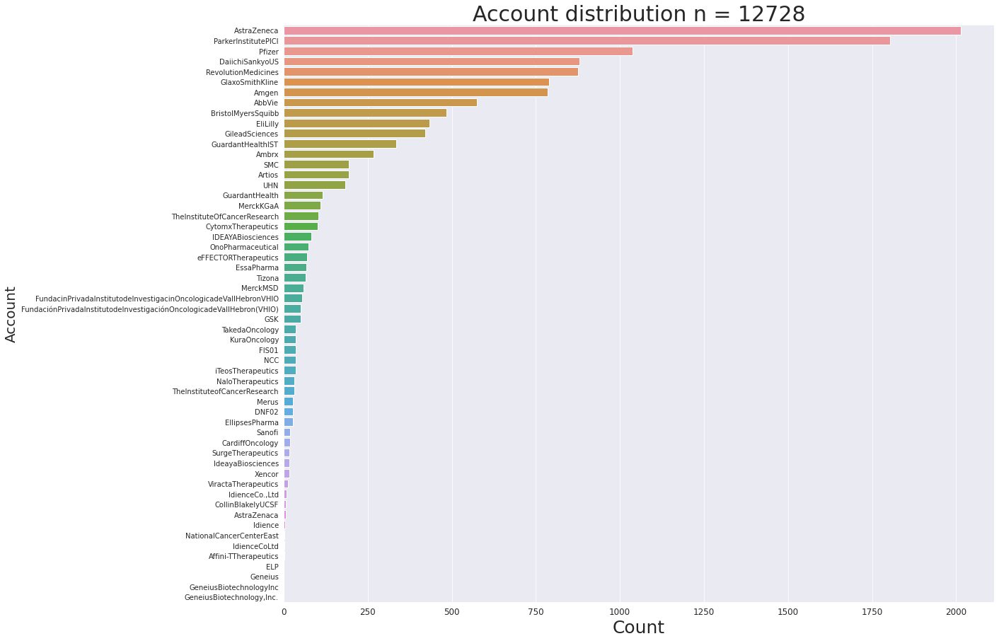

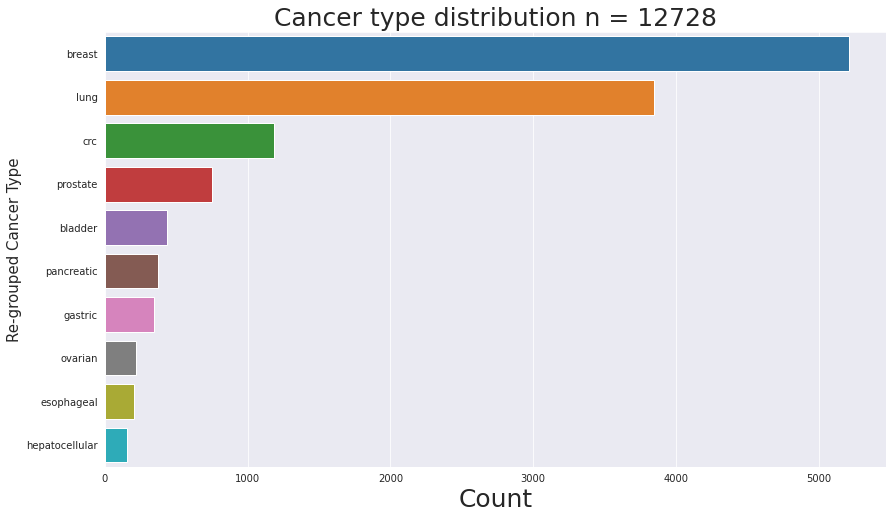

In [152]:
# Account distribution check 

plt.figure(figsize=(18, 15))
sns.set_style('darkgrid')
sns.countplot(data=top_prd_df, y='Account', order=top_prd_df['Account'].value_counts().index)

# Set plot title and labels
plt.title(f'Account distribution n = {top_prd_df.shape[0]}', fontsize=30)
plt.xlabel('Count', fontsize=25)
plt.xticks(fontsize=12)
plt.ylabel('Account', fontsize=20)

# Plot the count plot for 'new_defined_cancer_type'
plt.figure(figsize=(14, 8))
sns.set_style('darkgrid')
sns.countplot(data=top_prd_df, y='new_defined_cancer_type', order=top_prd_df['new_defined_cancer_type'].value_counts().index)

# Set plot title and labels
plt.title(f'Cancer type distribution n = {top_prd_df.shape[0]}', fontsize=25)
plt.xlabel('Count', fontsize=25)
plt.ylabel('Re-grouped Cancer Type', fontsize=15)

# Show the plot
plt.show()


## Check CSO result of the outlier samples that Kyle identified (TF significantly changed after removing treatment-induced DMRs identified based on Pfizer Crown ArmB)

In [ ]:
# Readin data
df_kyle_interest = pd.read_csv("/ghsfa/projects/omni_v2/users/kchang/lm_dev/data/all_ruo/tfv2_accn_hy.csv")
df_kyle_interest.head()

In [ ]:
# Create the baseline and non-baseline conditions
baseline = df_kyle_interest['binary_visit'] == 'baseline'
non_baseline = df_kyle_interest['binary_visit'] == 'non-baseline'

# Create the conditions based on the "flag" column
flag_1_3 = df_kyle_interest['flag'] == 'ratio > 1.3'
flag_2 = df_kyle_interest['flag'] == 'ratio > 2'

# Create the new columns based on the flag conditions
df_kyle_interest['baseline_TFratio1.3'] = (baseline & flag_1_3).astype(int)
df_kyle_interest['baseline_TFratio2'] = (baseline & flag_2).astype(int)
df_kyle_interest['non_baseline_TFratio1.3'] = (non_baseline & flag_1_3).astype(int)
df_kyle_interest['non_baseline_TFratio2'] = (non_baseline & flag_2).astype(int)

# Check the sample size for each group
print(df_kyle_interest.flag.value_counts())

# Check the head of the DataFrame to confirm the changes
df_kyle_interest.head()

In [ ]:
# Create a filter that checks if any of the new columns have a value of 1
filter_any_positive = (
    (df_kyle_interest['baseline_TFratio1.3'] == 1) |
    (df_kyle_interest['baseline_TFratio2'] == 1) |
    (df_kyle_interest['non_baseline_TFratio1.3'] == 1) |
    (df_kyle_interest['non_baseline_TFratio2'] == 1)
)

# Apply the filter to the original DataFrame to get only relevant rows
filtered_df = df_kyle_interest[filter_any_positive]
filtered_df.shape

In [ ]:
# List of columns to include from filtered_df (including the 4 new columns)
columns_to_include = [
    'run_sample_id', 'baseline_TFratio1.3', 'baseline_TFratio2',
    'non_baseline_TFratio1.3', 'non_baseline_TFratio2'
]

# Perform an inner join using 'run_sample_id' and 'GHSampleID'
merged_df = top_prd_df.merge(
    filtered_df[columns_to_include],
    left_on='GHSampleID',
    right_on='run_sample_id',
    how='inner'
)

# Verify the merged DataFrame
merged_df.head()


In [ ]:
# Extract run_sample_id from merged_df
merged_sample_ids = merged_df['GHSampleID'].unique()

# Filter df_kyle_interest to find rows where run_sample_id is not in merged_sample_ids
df_not_in_merged = df_kyle_interest[~df_kyle_interest['run_sample_id'].isin(merged_sample_ids)]

# Display the result
df_not_in_merged.GHSampleID.unique()


In [ ]:
# Set up a 2x2 grid for subplots
fig, axs = plt.subplots(2, 2, figsize=(18, 12))
sns.set_style('darkgrid')

# Define a mapping of columns to subplot indices and titles
plot_data = [
    ("baseline_TFratio1.3", 0, 0, 'Distribution of CSO prediction for baseline_TFratio1.3 samples'),
    ("baseline_TFratio2", 0, 1, 'Distribution of CSO prediction for baseline_TFratio2 samples'),
    ("non_baseline_TFratio1.3", 1, 0, 'Distribution of CSO prediction for non_baseline_TFratio1.3 samples'),
    ("non_baseline_TFratio2", 1, 1, 'Distribution of CSO prediction for non_baseline_TFratio2 samples')
]

# Loop through each set of parameters and create percentage plots
for column, row, col, base_title in plot_data:
    # Filter data where the column value is 1
    filtered_df = merged_df[merged_df[column] == 1]
    total_samples = len(filtered_df)
    
    # Calculate the percentage of each cso_prediction
    prediction_counts = filtered_df['cso_prediction'].value_counts(normalize=True).mul(100).reset_index()
    prediction_counts.columns = ['cso_prediction', 'percentage']
    
    # Plot on the respective subplot
    ax = axs[row, col]
    sns.barplot(data=prediction_counts, y='cso_prediction', x='percentage', ax=ax)
    
    # Set titles and labels with total sample size
    ax.set_title(f'{base_title} (Total samples: {total_samples})', fontsize=14)
    ax.set_xlabel('Percentage (%)', fontsize=12)
    ax.set_ylabel('CSO prediction', fontsize=12)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


In [ ]:
# Set up a 2x2 grid for subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
sns.set_style('darkgrid')

# Define a mapping of columns to subplot indices and titles
plot_data = [
    ("baseline_TFratio1.3", 0, 0, 'Distribution of CSO prediction for baseline_TFratio1.3 samples'),
    ("baseline_TFratio2", 0, 1, 'Distribution of CSO prediction for baseline_TFratio2 samples'),
    ("non_baseline_TFratio1.3", 1, 0, 'Distribution of CSO prediction for non_baseline_TFratio1.3 samples'),
    ("non_baseline_TFratio2", 1, 1, 'Distribution of CSO prediction for non_baseline_TFratio2 samples')
]

# Loop through each set of parameters and create count plots
for column, row, col, title in plot_data:
    # Filter data where the column value is 1
    filtered_df = merged_df[merged_df[column] == 1]
    
    # Plot on the respective subplot
    sns.countplot(data=filtered_df, y='cso_prediction', 
                  order=filtered_df['cso_prediction'].value_counts().index,
                  ax=axs[row, col])
    
    # Set titles and labels
    axs[row, col].set_title(title, fontsize=14)
    axs[row, col].set_xlabel('Count', fontsize=12)
    axs[row, col].set_ylabel('CSO prediction', fontsize=12)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


In [ ]:
merged_df_1 = merged_df[merged_df["non_baseline_TFratio1.3"] == 1]
plt.figure(figsize=(14, 8))
sns.set_style('darkgrid')
sns.countplot(data=merged_df_1, y='new_defined_cancer_type', order=merged_df_1['new_defined_cancer_type'].value_counts().index)

# Set plot title and labels
plt.title('Distribution of provided cancer types of non_baseline_TFratio1.3', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Provided cancer type', fontsize=14)

## CSO caller performance on RUO/IST samples

In [ ]:
cancer_types = top_2_prd_df['new_defined_cancer_type'].unique()

n = len(cancer_types)
ncols = 3
nrows = (n + 1) // ncols  

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 8 * nrows)) 
axes = axes.flatten()  

for ax, cancer in zip(axes, cancer_types):
    df_subset = top_2_prd_df[top_2_prd_df['new_defined_cancer_type'] == cancer]
    
    # sns.scatterplot(data=df_subset, x='GHSampleID', y='cso_score', hue='cso_model_type', style='cso_model_type', s=100, ax=ax)
    sns.scatterplot(data=df_subset, x='GHSampleID', y='cso_score', hue='cso_prediction', style='cso_prediction', s=100, ax=ax)

    
    ax.set_title(f'Top 2 Predicted CSO Scores for {cancer}')
    ax.set_xlabel('GHSampleID')
    ax.set_ylabel('CSO Score')
    
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    
    ax.legend(title='CSO Model Type', loc='upper right')

plt.tight_layout()
plt.show()


In [ ]:
sns.set_style('darkgrid')

plt.figure(figsize=(18, 15))

sns.boxplot(data=top_prd_df, x='new_defined_cancer_type', y='cso_score', hue='cso_prediction', showfliers=False)

sns.stripplot(data=top_2_prd_df, x='new_defined_cancer_type', y='cso_score', hue='cso_prediction', jitter=True, size=5, dodge=True, linewidth=0.5, edgecolor='none')

plt.title('Top 2 Predicted CSO Scores')
plt.xlabel('new_defined_cancer_type')
plt.ylabel('CSO Score')

plt.xticks(rotation=45, ha='right')

plt.legend(title='CSO Model Type', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


# Identify suspicious samples (CSO predicted cancer that is inconsistent with provided cancer type)

### CSO prediction on suspicious samples

In [60]:
# Filter to find rows where 'cso_prediction' is 'digestive'
digestive_pred = top_prd_df[top_prd_df['cso_prediction'] == 'digestive']

# Find unique GHSampleIDs that have 'digestive' in the top1 predictions
digestive_ghsample_ids = digestive_pred['GHSampleID'].unique()

# Filter the original DataFrame to get entries for these GHSampleIDs
filtered_df = top_prd_df[top_prd_df['GHSampleID'].isin(digestive_ghsample_ids)]

# Filter out rows where 'new_defined_cancer_type' is either 'crc', 'esophageal', or 'gastric' as this is how digestive CSO designed. 
df_digestive_cso = filtered_df[~filtered_df['new_defined_cancer_type'].isin(['crc', 'esophageal', 'gastric'])]

print("Total size of digestive CSO samples with non-digestive cancer type is " + str(df_digestive_cso.shape[0]) + "\n") 

df_digestive_cso.head()

Total size of digestive CSO samples with non-digestive cancer type is 1112



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
11,A087355001_231019_A01112_0449_BHHTLMDSX7,-22.793513,CSO_esophageal,-19.290252,MS201924-0022,A0873550,A087355001,1060002,NaN,SUCCESS,NaN,14.300,2.5,Lung adenocarcinoma,20231030_MerckKGaA_SOW31_3_2_infinityReport.csv,amak,NaN,2023-10-30,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,231019_A01112_0449_BHHTLMDSX7,/ghsfa/ivd/flowcentral/231019_A01112_0449_BHHTLMDSX7.bd5e16cf-f71f-415b-943f-b4df73261037.20231021121846,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/231019_A01112_0449_BHHTLMDSX7.bd5e16cf-f71f-415b-943f-b4df73261037.20231021121846/A087355001/A087355001.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/231019_A01112_0449_BHHTLMDSX7.bd5e16cf-f71f-415b-943f-b4df73261037.20231021121846/A087355001/A087355001.ghcnv_qc.combined.hdr.tsv,A087355001,Female,Female,digestive,1,Lung adenocarcinoma
13,A089298101_231209_A01021_0581_AH3H53DSX7,-22.074361,CSO_esophageal,-20.385130,MS201924-0022,A0892981,A089298101,8040001,NaN,SUCCESS,NaN,11.960,3.0,Lung adenocarcinoma,20231214_MerckKGaA_SOW31_4_3_infinityReport.csv,produser,NaN,2023-12-14,MerckKGaA,SOW31,LUNG,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Lung adenocarcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,231209_A01021_0581_AH3H53DSX7,/ghsfa/ivd/flowcentral/231209_A01021_0581_AH3H53DSX7.ed08bddc-5270-4e08-9aa2-9512578cc742.20231211135636,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/231209_A01021_0581_AH3H53DSX7.ed08bddc-5270-4e08-9aa2-9512578cc742.20231211135636/A089298101/A089298101.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/231209_A01021_0581_AH3H53DSX7.ed08bddc-5270-4e08-9aa2-9512578cc742.20231211135636/A089298101/A089298101.ghcnv_qc.combined.hdr.tsv,A089298101,Male,Male,digestive,1,Lung adenocarcinoma
37,A106424401_240609_A01744_0216_AHFVWFDSXC,-22.282882,CSO_crc,-20.400966,CAPItello-292_D361DC00001,A1064244,A106424401,NaN,NaN,SUCCESS,NaN,29.590,NaN,Breast Carcinoma,20240624_AstraZenaca_189Test_Batch1_6Samples_InfinityReport.csv,amak,0.23,2024-06-24,AstraZenaca,189Test,BREAST,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Breast Carcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,240609_A01744_0216_AHFVWFDSXC,/ghsfa/ivd/flowcentral/240609_A01744_0216_AHFVWFDSXC,NaN,NaN,NaN,breast,unknown,/ghsfa/ivd/flowcentral/240609_A01744_0216_AHFVWFDSXC/A106424401,False,/ghsfa/ivd/flowcentral/240609_A01744_0216_AHFVWFDSXC/A106424401/A106424401.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240609_A01744_0216_AHFVWFDSXC/A106424401/A106424401.ghcnv_qc.combined.hdr.tsv,A106424401,Female,Female,digestive,1,Breast Carcinoma
274,B00157179_220706_A01744_0014_BHVGHLDSX3,-22.515249,CSO_esophageal,-19.995557,BTBC,A0513449,B00157179,KCL737,Timepoint 1,SUCCESS,NaN,10.075,3.6,Breast,20221007_TheInstituteOfCancerResearch_SOW01_78Samples_InfinityReport.csv,jyen,0.87,2022-10-07,TheInstituteOfCancerResearch,SOW01,Other,IV,NaN,NaN,NaN,NaN,

In [61]:
# Filter for rows where 'cso_prediction' is 'hepatocellular' but provided cancer type is not 'hepatocellular'

# Filter to find rows where 'cso_prediction' is 'hepatocellular'
hepato_pred = top_prd_df[top_prd_df['cso_prediction'] == 'hepatocellular']

# Find unique GHSampleIDs that have 'hepatocellular' in the top-1 predictions
hepato_ghsample_ids = hepato_pred['GHSampleID'].unique()

# Filter the original DataFrame to get entries for these GHSampleIDs
filtered_df = top_prd_df[top_prd_df['GHSampleID'].isin(hepato_ghsample_ids)]

# Filter out rows where 'new_defined_cancer_type' is either 'hepatocellular'
df_liver_cso = filtered_df[~filtered_df['new_defined_cancer_type'].isin(['hepatocellular'])]

print("Total size of hepatocellular CSO samples with non-hepatocellular cancer type is " + str(df_liver_cso.shape[0]) + "\n") 

df_liver_cso.head()

Total size of hepatocellular CSO samples with non-hepatocellular cancer type is 247



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
38,A106432101_240609_A01744_0216_AHFVWFDSXC,-21.214575,CSO_hepatocellular,-15.438587,CAPItello-292_D361DC00001,A1064321,A106432101,NaN,NaN,SUCCESS,NaN,5.1500,NaN,Breast Carcinoma,20240624_AstraZenaca_189Test_Batch1_6Samples_InfinityReport.csv,amak,0.27,2024-06-24,AstraZenaca,189Test,BREAST,"Stage IIIB/IV NSCLC, Stage III/IV - Other Cancer Type",Breast Carcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,240609_A01744_0216_AHFVWFDSXC,/ghsfa/ivd/flowcentral/240609_A01744_0216_AHFVWFDSXC,NaN,NaN,NaN,breast,unknown,/ghsfa/ivd/flowcentral/240609_A01744_0216_AHFVWFDSXC/A106432101,False,/ghsfa/ivd/flowcentral/240609_A01744_0216_AHFVWFDSXC/A106432101/A106432101.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240609_A01744_0216_AHFVWFDSXC/A106432101/A106432101.ghcnv_qc.combined.hdr.tsv,A106432101,Male,Male,hepatocellular,1,Breast Carcinoma
481,B00166576_220725_A00770_0531_BHHKC7DSX3,-21.326064,CSO_hepatocellular,-18.184317,CTMX-001,A0529100,B00166576,IVT_108347,NaN,SUCCESS,NaN,5.2585,3.0,"Oral cavity Squamous cell carcinoma, invasive",20220907_CytomxTherapeutics_SOW01_160Samples_InfinityReport.csv,mcai,0.00,2022-09-07,CytomxTherapeutics,SOW01,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220725_A00770_0531_BHHKC7DSX3,/ghsfa/projects/omni_v2/flowcells/220725_A00770_0531_BHHKC7DSX3_PROD38_AP3.Sirius-1.0.0-RLS_20221023-111718,NaN,NaN,NaN,lung,unknown,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/220725_A00770_0531_BHHKC7DSX3_PROD38_AP3.Sirius-1.0.0-RLS_20221023-111718,False,/ghsfa/projects/omni_v2/flowcells/220725_A00770_0531_BHHKC7DSX3_PROD38_AP3.Sirius-1.0.0-RLS_20221023-111718/B00166576/B00166576.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/220725_A00770_0531_BHHKC7DSX3_PROD38_AP3.Sirius-1.0.0-RLS_20221023-111718/B00166576/B00166576.ghcnv_qc.combined.hdr.tsv,B00166576,Male,Male,hepatocellular,1,"Oral cavity Squamous cell carcinoma, invasive"
482,B00166577_220725_A01744_0024_BHHJLWDSX3,-22.179197,CSO_hepatocellular,-18.987704,CTMX-001,A0529067,B00166577,B12_103279,NaN,SUCCESS,NaN,33.8000,4.0,Esophagus Adenocarcinoma,20220907_CytomxTherapeutics_SOW01_160Samples_InfinityReport.csv,mcai,5.33,2022-09-07,CytomxTherapeutics,SOW01,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220725_A01744_0024_BHHJLWDSX3,/ghsfa/projects/omni_v2/flowcells/220725_A01744_0024_BHHJLWDSX3_PROD38_AP2.Sirius-1.0.0-RLS_20221023-105123,NaN,NaN,NaN,esophageal,unknown,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/220725_A01744_0024_BHHJLWDSX3_PROD38_AP2.Sirius-1.0.0-RLS_20221023-105123,False,/ghsfa/projects/omni_v2/flowcells/220725_A01744_0024_BHHJLWDSX3_PROD38_AP2.Sirius-1.0.0-RLS_20221023-105123/B00166577/B00166577.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/220725_A01744_0024_BHHJLWDSX3_PROD38_AP2.Sirius-1.0.0-RLS_20221023-105123/B00166577/B00166577.ghcnv_qc.combined.hdr.tsv,B00166577,Male,Male,hepatocellular,1,Esophagus Adenocarcinoma
500,B00166598_220725_A01744_0025_AHHJYCDSX3,-23.032092,CSO_hepatocellular,-19.323982,CTMX-001,A0529059,B00166598,B12_101215,NaN,SUCCESS,NaN,11.5050,4.0,Lung Adenocarcinoma,20220907_CytomxTherapeutics_SOW01_160Samples_

In [62]:
# Filter for rows where 'cso_prediction' is 'lung' but provided cancer type is not 'lung'

# Filter to find rows where 'cso_prediction' is 'lung'
lung_pred = top_prd_df[top_prd_df['cso_prediction'] == 'lung']

# Find unique GHSampleIDs that have 'lung' in the top-1 predictions
lung_ghsample_ids = lung_pred['GHSampleID'].unique()

# Filter the original DataFrame to get entries for these GHSampleIDs
filtered_df = top_prd_df[top_prd_df['GHSampleID'].isin(lung_ghsample_ids)]

# Filter out rows where 'new_defined_cancer_type' is either 'lung'
df_lung_cso = filtered_df[~filtered_df['new_defined_cancer_type'].isin(['lung'])]

print("Total size of lung CSO samples with non-lung cancer type is " + str(df_lung_cso.shape[0]) + "\n") 

df_lung_cso.head()

Total size of lung CSO samples with non-lung cancer type is 309



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
7,A084877801_240114_A00441_0930_BHMJ7VDSX7,-22.105544,CSO_lung,-19.995739,JCOG1801 A1,A0848778,A084877801,81.0,Pre-CRT,SUCCESS,NaN,NaN,1.0,CRC,20240126_NCC_IST14_35Samples_InfinityReport.csv,hazhang,NaN,2024-01-26,NCC,IST14,Other,NaN,Rectal Cancer,GCTCGGGCCT,Male,Research,2024-01-16 12:51:14-08:00,Sirius_v1.0,NaN,Sirius-1.1.2-RLS,NaN,NaN,Guardant 360,NCC_14,Colorectal adenocarcinoma,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0848778,cgp,240114_A00441_0930_BHMJ7VDSX7,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7,NaN,NaN,NaN,crc,other,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/MB_lung_v4_all_output,False,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240114_A00441_0930_BHMJ7VDSX7/A084877801/A084877801.ghcnv_qc.combined.hdr.tsv,A084877801,Male,Male,lung,1,CRC
819,B00187301_220901_A01902_0016_AH3WC5DSX5,-22.135771,CSO_lung,-19.602132,20190505,A0565886,B00187301,50558002007,C2D1PRENIP1,SUCCESS,NaN,10.595,3.0,Prostate,20220926_Amgen_SOW05_39Samples_InfinityReport.csv,kchang,49.09,2022-09-26,Amgen,SOW05,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220901_A01902_0016_AH3WC5DSX5,/ghsfa/projects/omni_v2/flowcells/220901_A01902_0016_AH3WC5DSX5_PROD88_AP1.Sirius-1.0.0-RLS_20220927-130722,NaN,NaN,NaN,prostate,other,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/220901_A01902_0016_AH3WC5DSX5_PROD88_AP1.Sirius-1.0.0-RLS_20220927-130722,False,/ghsfa/projects/omni_v2/flowcells/220901_A01902_0016_AH3WC5DSX5_PROD88_AP1.Sirius-1.0.0-RLS_20220927-130722/B00187301/B00187301.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/220901_A01902_0016_AH3WC5DSX5_PROD88_AP1.Sirius-1.0.0-RLS_20220927-130722/B00187301/B00187301.ghcnv_qc.combined.hdr.tsv,B00187301,Male,Male,lung,1,Prostate
947,B00190253_220912_A01744_0037_BHNLCFDSX3,-21.706411,CSO_lung,-17.871108,CGG21-016P,A0539901,B00190253,7242,Pre-surgery,SUCCESS,NaN,18.720,6.0,Bladder Cancer,20220926_BristolMyersSquibb_SOW21_258Samples_InfinityReport.csv,kchang,1.09,2022-09-26,BristolMyersSquibb,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220912_A01744_0037_BHNLCFDSX3,/ghsfa/projects/omni_v2/flowcells/220912_A01744_0037_BHNLCFDSX3_PROD93_AP2.Sirius-1.1.0-RLS_20230710-174407,NaN,NaN,NaN,bladder,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/220912_A01744_0037_BHNLCFDSX3_PROD93_AP2.Sirius-1.1.0-RLS_20230710-174407,False,/ghsfa/projects/omni_v2/flowcells/220912_A01744_0037_BHNLCFDSX3_PROD93_AP2.Sirius-1.1.0-RLS_20230710-174407/B00190253/B00190253.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/220912_A01744_0037_BHNLCFDSX3_PROD93_AP2.Sirius-1.1.0-RLS_20230710-174407/B00190253/B00190253.ghcnv_qc.combined.hdr.tsv,B00190253,Male,Male,lung,1,Bladder Cancer
982,B00190288_220912_A01744_0037_BHNLCFDSX3,-21.761293,CSO_lung,-16.873492,CGG21-016P,A0539920,B00190288,DN1535,Post-surgery,SUCCESS,NaN,82.550,4.9,Bladder Cancer,20220926_BristolMyersSquibb_SOW21_258Samples_InfinityReport.csv,kchang,2.79,2022-09-26,BristolMyersSquibb,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

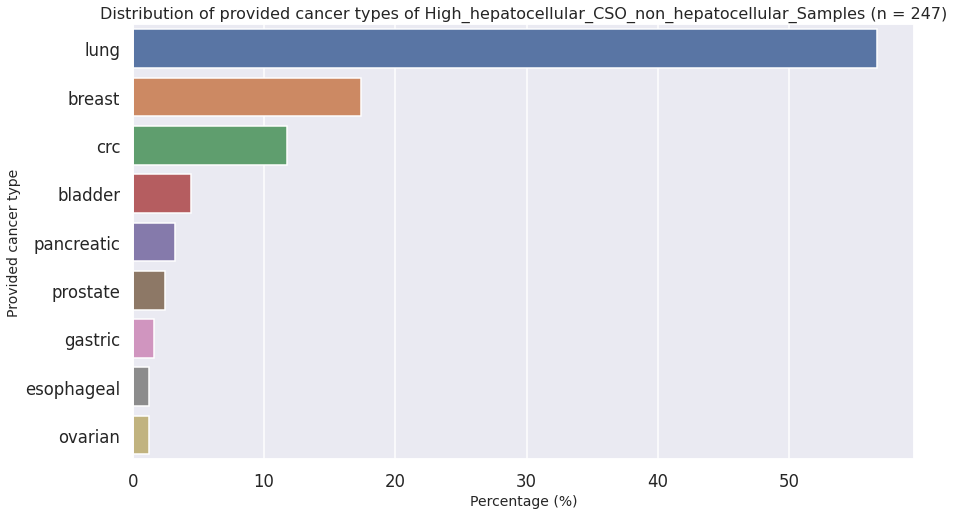

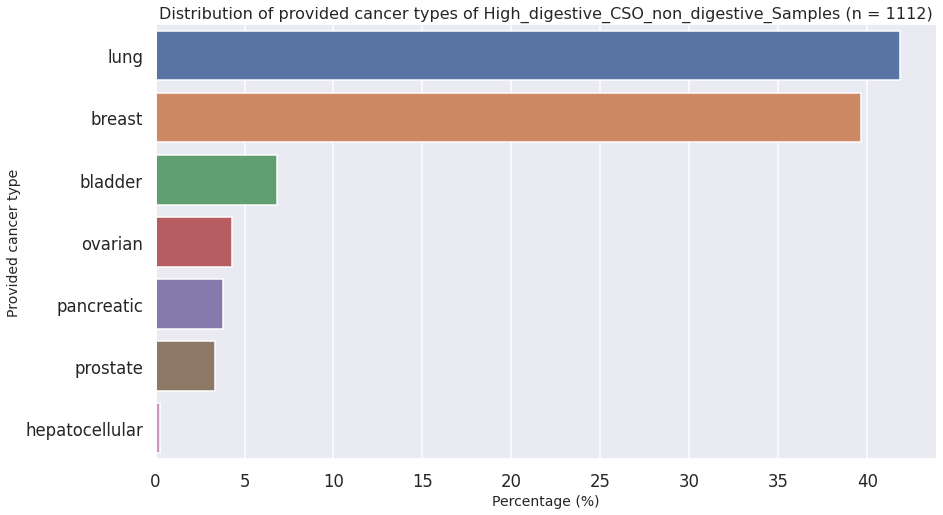

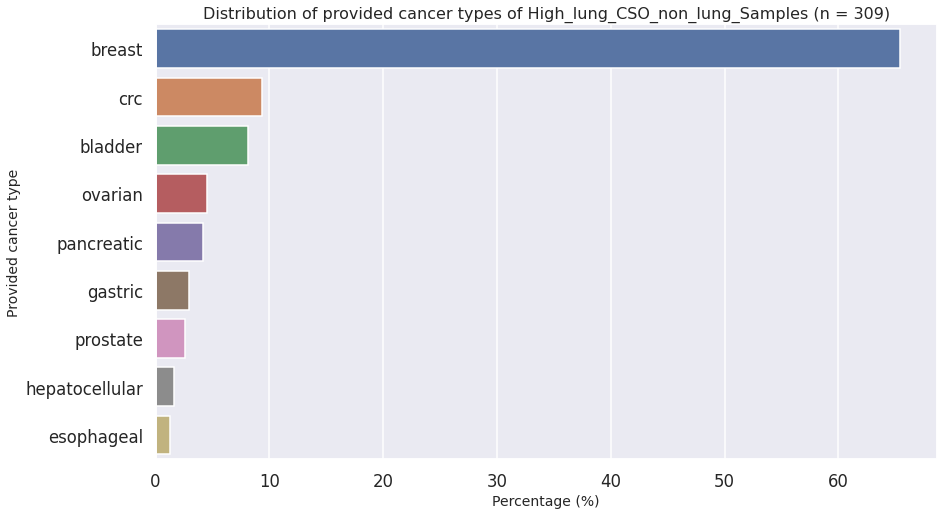

In [12]:
# Plot cancer type distribution of those high CSO suspicious by percentage
sns.set(style="darkgrid", context="talk")

def plot_cancer_distribution_percentage(df, title_suffix):
    # Create a figure with a predefined size
    plt.figure(figsize=(14, 8))
    
    # Calculate percentage of each cancer type
    value_counts = df['new_defined_cancer_type'].value_counts(normalize=True) * 100
    order = value_counts.index
    
    # Generate a countplot with percentages
    sns.barplot(x=value_counts, y=order)
    
    # Set title and labels with dynamic titles based on the input parameter
    plt.title(f'Distribution of provided cancer types of {title_suffix} (n = {df.shape[0]})', fontsize=16)
    plt.xlabel('Percentage (%)', fontsize=14)
    plt.ylabel('Provided cancer type', fontsize=14)
    
    # Show the plot
    plt.show()

# Call the function with different datasets and titles
plot_cancer_distribution_percentage(df_liver_cso, 'High_hepatocellular_CSO_non_hepatocellular_Samples')
plot_cancer_distribution_percentage(df_digestive_cso, 'High_digestive_CSO_non_digestive_Samples')
plot_cancer_distribution_percentage(df_lung_cso, 'High_lung_CSO_non_lung_Samples')


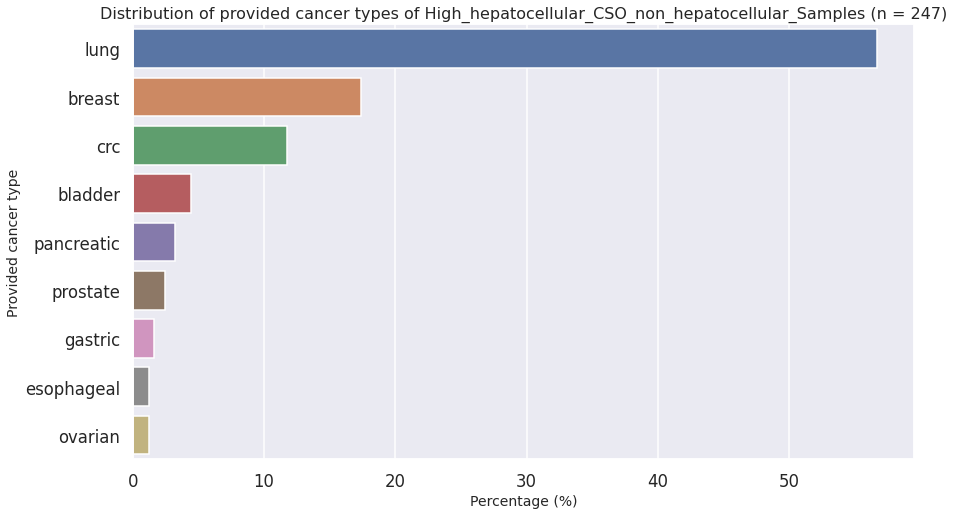

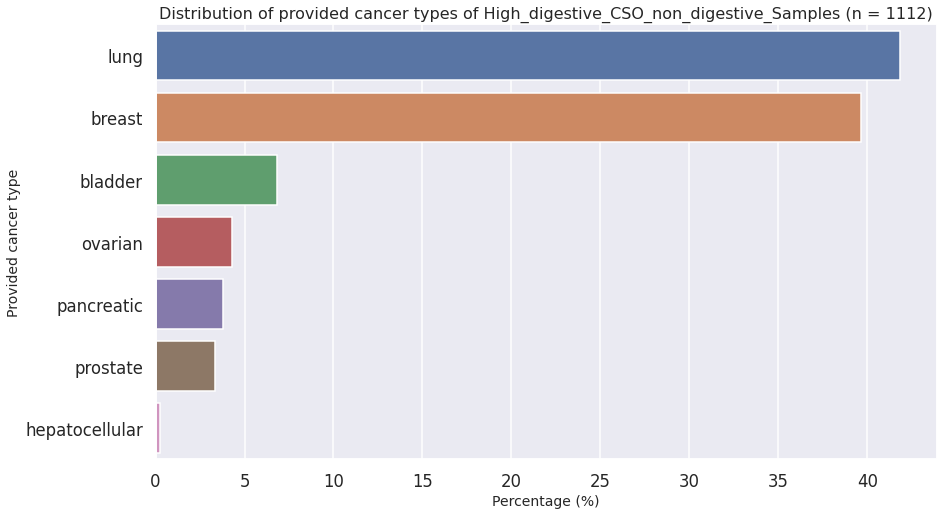

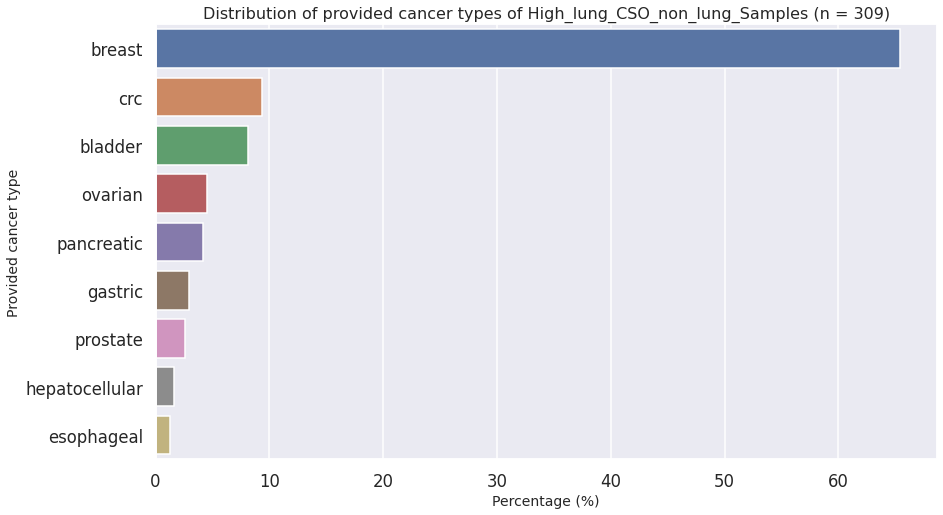

In [157]:
# Plot cancer type distribution of those high CSO suspicious by percentage
sns.set(style="darkgrid", context="talk")

def plot_cancer_distribution_percentage(df, title_suffix):
    # Create a figure with a predefined size
    plt.figure(figsize=(14, 8))
    
    # Calculate percentage of each cancer type
    value_counts = df['new_defined_cancer_type'].value_counts(normalize=True) * 100
    order = value_counts.index
    
    # Generate a countplot with percentages
    sns.barplot(x=value_counts, y=order)
    
    # Set title and labels with dynamic titles based on the input parameter
    plt.title(f'Distribution of provided cancer types of {title_suffix} (n = {df.shape[0]})', fontsize=16)
    plt.xlabel('Percentage (%)', fontsize=14)
    plt.ylabel('Provided cancer type', fontsize=14)
    
    # Show the plot
    plt.show()

# Call the function with different datasets and titles
plot_cancer_distribution_percentage(df_liver_cso, 'High_hepatocellular_CSO_non_hepatocellular_Samples')
plot_cancer_distribution_percentage(df_digestive_cso, 'High_digestive_CSO_non_digestive_Samples')
plot_cancer_distribution_percentage(df_lung_cso, 'High_lung_CSO_non_lung_Samples')


In [63]:
# Select treatment samples only
df_liver_cso_treatment = df_liver_cso[df_liver_cso['treatment'] == "Treatment"]
print(str(df_liver_cso_treatment.Visit_name.unique()) + "\n")
print("Total sample size of is " + str(df_liver_cso_treatment.shape[0]) + "\n")

df_digestive_cso_treatment = df_digestive_cso[df_digestive_cso['treatment'] == "Treatment"]
print(str(df_digestive_cso_treatment.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_digestive_cso_treatment.shape[0]) + "\n")


df_lung_cso_treatment = df_lung_cso[df_lung_cso['treatment'] == "Treatment"]
print(str(df_lung_cso_treatment.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_lung_cso_treatment.shape[0]) + "\n")

# Select baseline samples only
df_liver_cso_baseline = df_liver_cso[df_liver_cso['treatment'] == "Baseline"]
print(str(df_liver_cso_baseline.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_liver_cso_baseline.shape[0]) + "\n")

df_digestive_cso_baseline = df_digestive_cso[df_digestive_cso['treatment'] == "Baseline"]
print(str(df_digestive_cso_baseline.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_digestive_cso_baseline.shape[0]) + "\n")

df_lung_cso_baseline = df_lung_cso[df_lung_cso['treatment'] == "Baseline"]
print(str(df_lung_cso_baseline.Visit_name.unique()) + "\n")
print("Total sample size is " + str(df_lung_cso_baseline.shape[0]) + "\n")


['ON-TREATMENT' 'AC2D1' 'BC2D1' 'C04D1' 'C4D1' 'C2D1' 'End of Treatment'
 'CCRTC2D1' 'C3D1 PART 2-4' 'C8D1' 'C3D1' 'C47D1' 'C29D1' 'C55D1'
 'Tx Naïve']

Total sample size of is 69

['C2D1J' 'C2D1' 'ON-TREATMENT' 'AC2D1' 'BC2D1' 'C3D1' 'C4D1' 'C04D1'
 'CCRTC3D1' 'CCRTC2D1' 'MAINTC2D1' 'MAINTC3D1' 'MAINTC1D1' 'MAINTC8D1'
 'ARM C MAINT C1/8 D1' 'MAINT C1/8 D1' 'C9D1*' 'C5D1' 'QD: C2D1' 'C6D1'
 'C8D1' 'C17D1' 'C23D1' 'C7D1' 'C42D1' 'Tx Naïve' 'on-treatment'
 'End of Treatment']

Total sample size is 326

['C2D1' 'C3D1' 'C04D1' 'C4D1' 'End of Treatment' 'C5D1' 'C7D1' 'C11D1'
 'C8D1' 'C6D1' 'ON-TREATMENT' 'C1D15' 'C10D1' 'C18D1' 'C31D1' 'C3D1*']

Total sample size is 100

['pre-op' 'Pre-surgery' 'Cycle 3 Day 1 Predose' 'Screening' 'C1D1'
 'SCREENING' 'PRESCREENING 1' 'PRESCREENING 2' 'PRE-TREATMENT' 'SCRN'
 'BASELINE' 'Cycle 1 Day 1' 'Cycle 3 Day 1' 'Follow up 1' 'Baseline'
 'C1D1PRE']

Total sample size is 80

['Timepoint 1' 'pre-op' 'C1D1PRE' 'Cycle 1 Day 1' 'Pre-surgery' 'Baseline'
 'Scre

### Check the suspicious treatment samples that have high TFv2 change (>1.3) after removing treatment effect DMRs 

In [ ]:
# High CSO digestive samples 

# List of columns to include from filtered_df (including the 4 new columns)
columns_to_include = [
    'run_sample_id_y', 'baseline_TFratio1.3', 'baseline_TFratio2',
    'non_baseline_TFratio1.3', 'non_baseline_TFratio2'
]

# Perform an inner join using 'run_sample_id' and 'GHSampleID'
df_digestive_tf_suspicious = df_liver_cso_treatment.merge(
    merged_df[columns_to_include],
    left_on='GHSampleID',
    right_on='run_sample_id_y',
    how='inner'
)

# Verify the merged DataFrame
df_digestive_tf_suspicious.head()

print(df_digestive_tf_suspicious.csv_file_name.value_counts())
df_digestive_tf_suspicious_no_pfizer = df_digestive_tf_suspicious[df_digestive_tf_suspicious["csv_file_name"] != "20230718_Pfizer_RC1_462_Samples_InfinityReport.csv"]
df_digestive_tf_suspicious_no_pfizer

In [ ]:
# High hepatoceulluar CSO samples 

# List of columns to include from filtered_df (including the 4 new columns)
columns_to_include = [
    'run_sample_id_y', 'baseline_TFratio1.3', 'baseline_TFratio2',
    'non_baseline_TFratio1.3', 'non_baseline_TFratio2'
]

# Perform an inner join using 'run_sample_id' and 'GHSampleID'
df_liver_tf_suspicious = df_liver_cso_treatment.merge(
    merged_df[columns_to_include],
    left_on='GHSampleID',
    right_on='run_sample_id_y',
    how='inner'
)

# Verify the merged DataFrame
print(df_liver_tf_suspicious.csv_file_name.value_counts())
print(df_liver_tf_suspicious.shape)
print(df_liver_tf_suspicious.csv_file_name.value_counts())
df_liver_tf_suspicious.head()

In [ ]:
df_liver_tf_suspicious_no_pfizer = df_liver_tf_suspicious[df_liver_tf_suspicious["csv_file_name"] != "20230718_Pfizer_RC1_462_Samples_InfinityReport.csv"]
df_liver_tf_suspicious_no_pfizer

In [ ]:
# High lung CSO samples 

# List of columns to include from filtered_df (including the 4 new columns)
columns_to_include = [
    'run_sample_id_y', 'baseline_TFratio1.3', 'baseline_TFratio2',
    'non_baseline_TFratio1.3', 'non_baseline_TFratio2'
]

# Perform an inner join using 'run_sample_id' and 'GHSampleID'
df_lung_tf_suspicious = df_lung_cso_treatment.merge(
    merged_df[columns_to_include],
    left_on='GHSampleID',
    right_on='run_sample_id_y',
    how='inner'
)

# Verify the merged DataFrame
print(df_lung_tf_suspicious.csv_file_name.value_counts())
print(df_lung_tf_suspicious.shape)
print(df_lung_tf_suspicious.csv_file_name.value_counts())
df_lung_tf_suspicious.head()

In [ ]:
# Plot cancer type distribution of those high CSO suspicious 
sns.set(style="darkgrid", context="talk")

def plot_csv(df, title_suffix):
    # Create a figure with a predefined size
    plt.figure(figsize=(20, 15))
    
    # Generate a countplot
    sns.countplot(data=df, y='csv_file_name', 
                  order=df['csv_file_name'].value_counts().index)
    
    # Set title and labels with dynamic titles based on the input parameter
    plt.title(f'Distribution of {title_suffix} (n = {df.shape[0]})', fontsize=16)
    plt.xlabel('Count', fontsize=14)
    plt.ylabel('Provided cancer type', fontsize=14)
    
    # Show the plot
    plt.show()

# Call the function with different datasets and titles
plot_csv(df_digestive_cso_treatment, 'High_digestive_CSO_non_digestive_Treatment_Samples')


### Checking the prevalence of suspicous samples by binning the TFv2

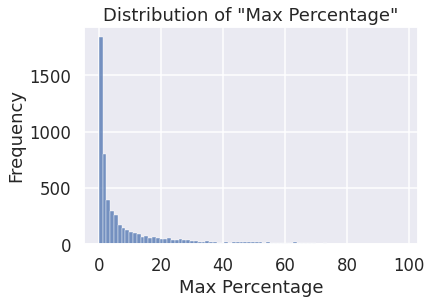

In [308]:
# Bin the samples based on the genomic maf "Max_percentage" column in the report
sns.histplot(top_prd_df['Max_percentage'])
plt.title('Distribution of "Max Percentage"')
plt.xlabel('Max Percentage')
plt.ylabel('Frequency')
plt.show()

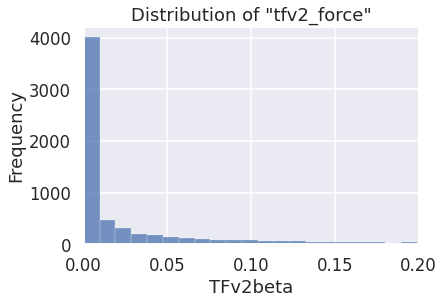

In [309]:
# Bin the samples based on the genomic maf "tfv2_force" column in the report
sns.histplot(top_prd_df['tfv2_force'])
plt.title('Distribution of "tfv2_force"')
plt.xlabel('TFv2beta')
plt.xlim(0, 0.2)
plt.ylabel('Frequency')
plt.show()

In [310]:
# Check for duplicates in the 'GHSampleID' column
duplicates = top_prd_df.duplicated(subset='GHSampleID', keep=False)

# Display rows where 'GHSampleID' is duplicated
duplicate_rows = top_prd_df[duplicates]

# Print the duplicate rows
duplicate_rows


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,tfv2_force,cancerother,Max_percentage_bin


In [ ]:
# Define bins for Max_percentage for baseline and treatment samples
top_prd_df_baseline = top_prd_df[top_prd_df["treatment"] == "Baseline"]
top_prd_df_treatment = top_prd_df[top_prd_df["treatment"] == "Treatment"]

def plot_Max_percentage_distribution_percentage(df, df_total, title_suffix):
    # Define bins for Max_percentage
    bins = [0, 10, 20, 30, 40, 50, 100]  # Adjust these values based on your data range and granularity needed
    labels = ['0-10', '10-20', '20-30', '30-40', '40-50', '50-100']

    # Add a binning column
    df['Max_percentage_bin'] = pd.cut(df['Max_percentage'], bins=bins, labels=labels, right=False)
    df_total['Max_percentage_bin'] = pd.cut(df_total['Max_percentage'], bins=bins, labels=labels, right=False)

    # Calculate total samples in each bin
    total_samples_per_bin = df_total['Max_percentage_bin'].value_counts().sort_index()

    # Calculate hepatocellular samples in each bin
    hepato_samples_per_bin = df['Max_percentage_bin'].value_counts().sort_index()

    # Calculate percentages
    percentage_hepato = (hepato_samples_per_bin / total_samples_per_bin) * 100

    # Reset index to use in seaborn barplot
    percentage_hepato = percentage_hepato.reset_index()
    percentage_hepato.columns = ['Max_percentage_bin', 'Percentage']

    # Plotting
    plt.figure(figsize=(12, 10))
    # percentage_hepato.plot(kind='bar', color='blue')
    sns.barplot(x='Max_percentage_bin', y='Percentage', data=percentage_hepato)
    plt.title(f'Percentage of {title_suffix} Samples \n by Max_percentage_ Bin (n = {df.shape[0]})')
    plt.xlabel('Max percentage Bins')
    plt.ylabel(f'Percentage of {title_suffix} Samples (%)')
    plt.xticks(rotation=45)
    plt.show()

# For all sample prevelance 
plot_Max_percentage_distribution_percentage(df_liver_cso, top_prd_df, 'CSO Hepatocellular Prediction of all')
plot_Max_percentage_distribution_percentage(df_digestive_cso, top_prd_df, 'CSO Digestive Prediction of all')
plot_Max_percentage_distribution_percentage(df_lung_cso, top_prd_df, 'CSO Lung Prediction of all')

# For baseline sample prevelance 
plot_Max_percentage_distribution_percentage(df_liver_cso_baseline, top_prd_df_baseline, 'CSO Hepatocellular Prediction of Baseline')
plot_Max_percentage_distribution_percentage(df_digestive_cso_baseline, top_prd_df_baseline, 'CSO Digestive Prediction of Baseline')
plot_Max_percentage_distribution_percentage(df_lung_cso_baseline, top_prd_df_baseline, 'CSO Lung Prediction of Baseline')

# For all treatment prevelance 
plot_Max_percentage_distribution_percentage(df_liver_cso_treatment, top_prd_df_treatment, 'CSO Hepatocellular Prediction of Treatment')
plot_Max_percentage_distribution_percentage(df_digestive_cso_treatment, top_prd_df_treatment, 'CSO Digestive Prediction of Treatment')
plot_Max_percentage_distribution_percentage(df_lung_cso_treatment, top_prd_df_treatment, 'CSO Lung Prediction of Treatment')


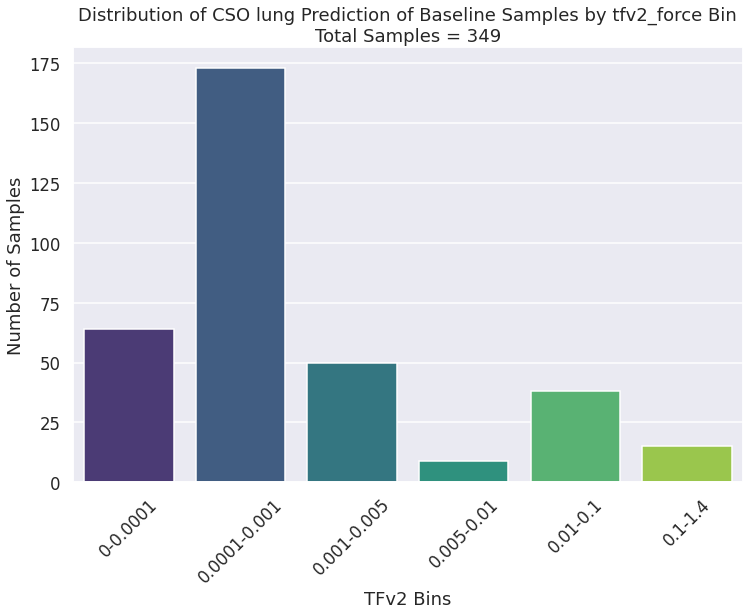

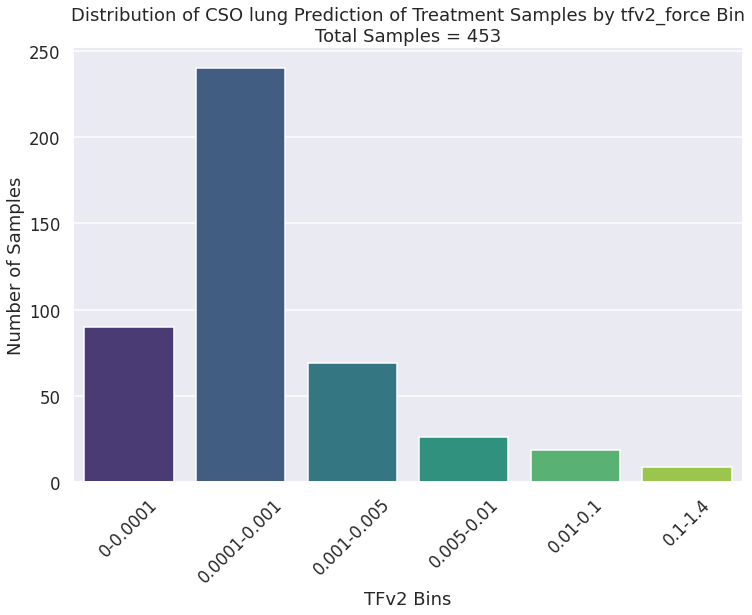

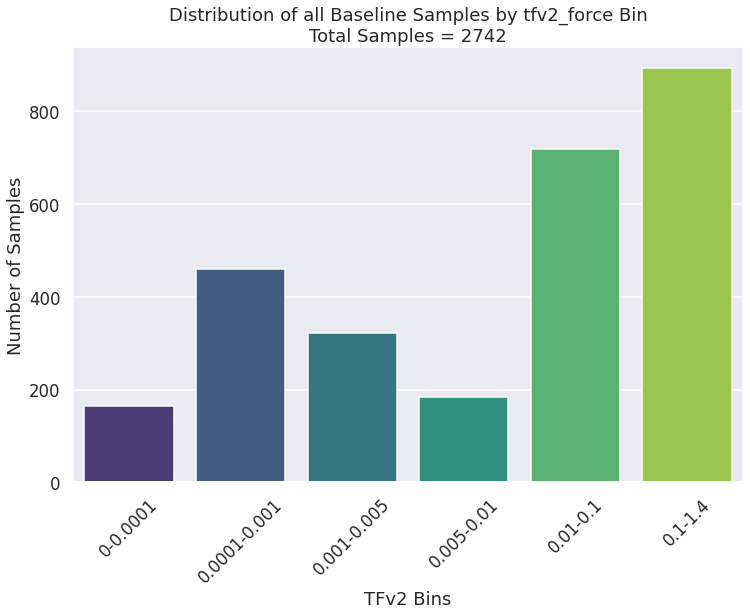

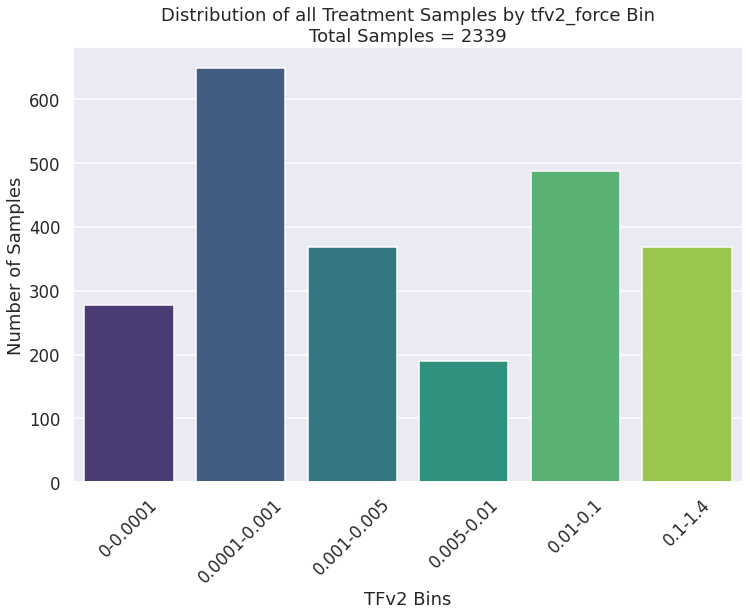

In [312]:
def plot_total_distribution(df_total, title_suffix):
    # Define bins for tfv2_force
    bins = [0, 0.0001, 0.001, 0.005, 0.01, 0.1, 1.4] # Check the max value top_prd_df.tfv2_force.max()! The binning is based on Princy's CSO caller performance talk 
    labels = ['0-0.0001', '0.0001-0.001', '0.001-0.005', '0.005-0.01', '0.01-0.1', '0.1-1.4']

    # Add a binning column
    df_total['tfv2_bin'] = pd.cut(df_total['tfv2_force'], bins=bins, labels=labels, right=False)

    # Calculate total samples in each bin
    total_samples_per_bin = df_total['tfv2_bin'].value_counts().sort_index()

    # Reset index to use in seaborn barplot
    total_samples_per_bin = total_samples_per_bin.reset_index()
    total_samples_per_bin.columns = ['tfv2_bin', 'Count']

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(x='tfv2_bin', y='Count', data=total_samples_per_bin, palette='viridis')
    plt.title(f'Distribution of {title_suffix} Samples by tfv2_force Bin\nTotal Samples = {df_total.shape[0]}')
    plt.xlabel('TFv2 Bins')
    plt.ylabel('Number of Samples')
    plt.xticks(rotation=45)
    plt.show()

# Call the function with the appropriate DataFrame and title suffix
plot_total_distribution(df_lung_cso_baseline, 'CSO lung Prediction of Baseline')
plot_total_distribution(df_lung_cso_treatment, 'CSO lung Prediction of Treatment')
plot_total_distribution(top_prd_df_baseline, 'all Baseline')
plot_total_distribution(top_prd_df_treatment, 'all Treatment')


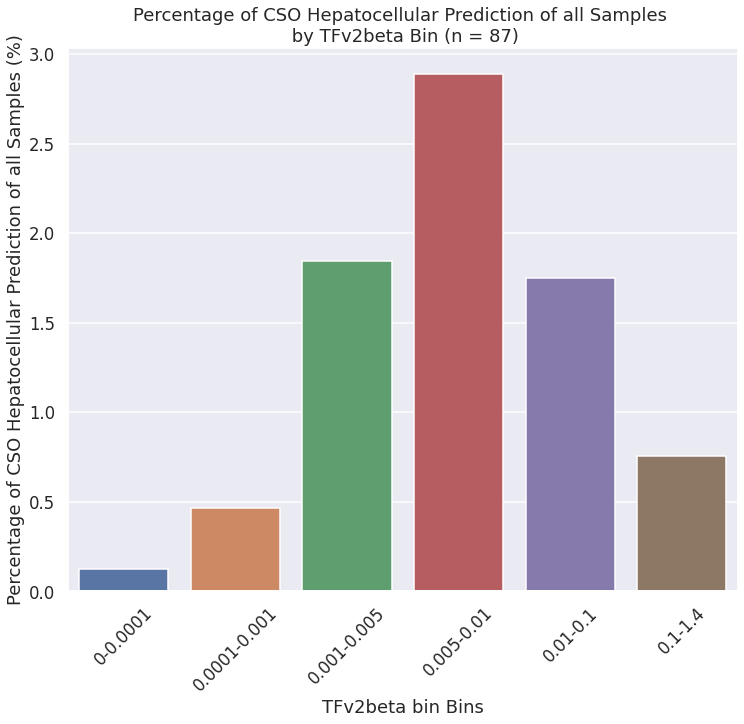

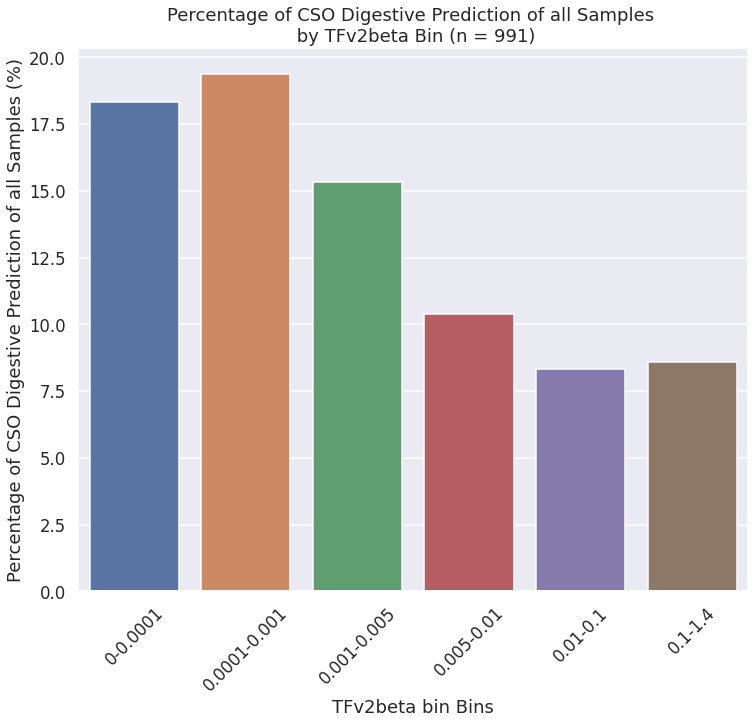

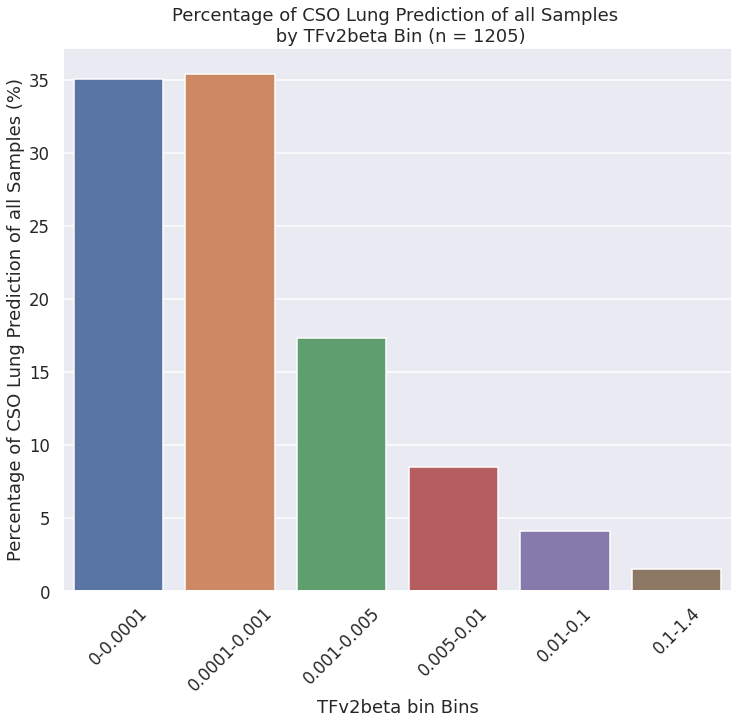

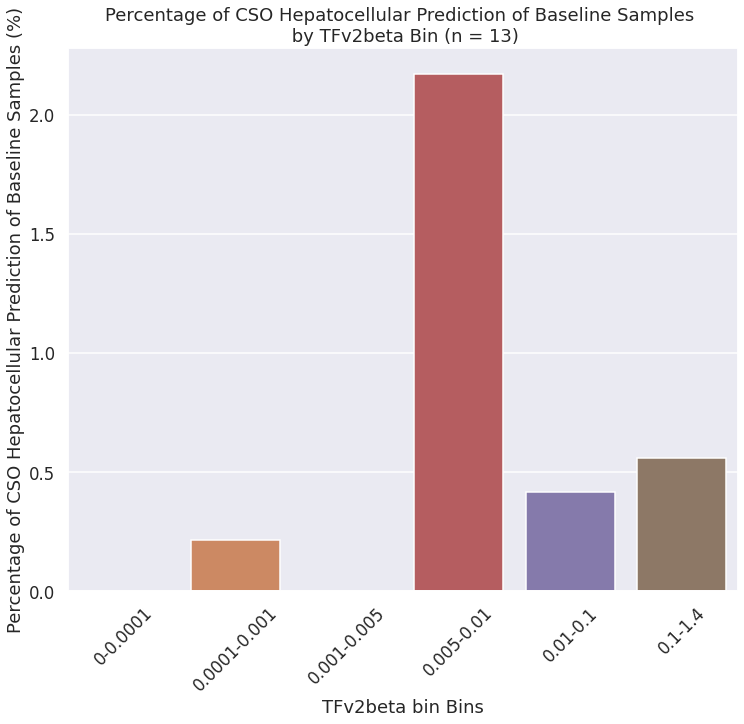

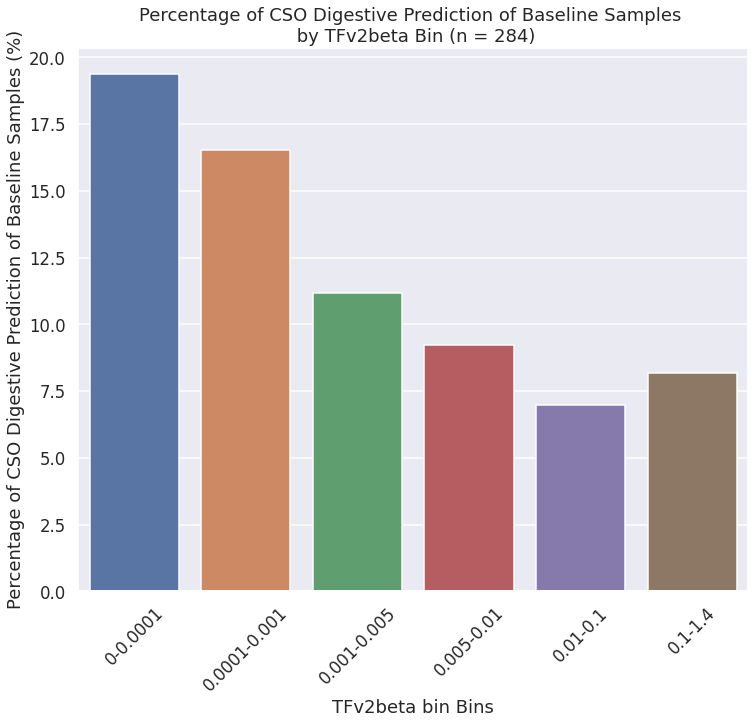

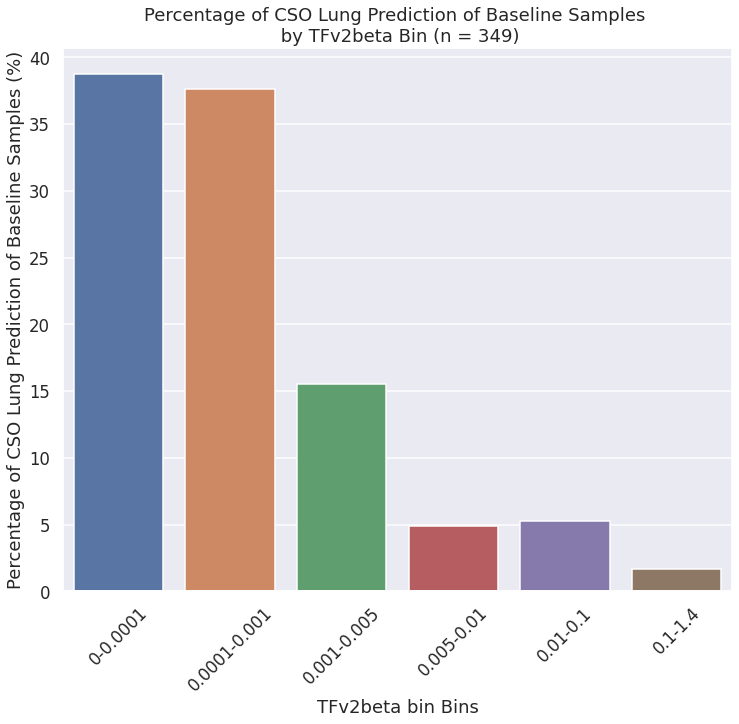

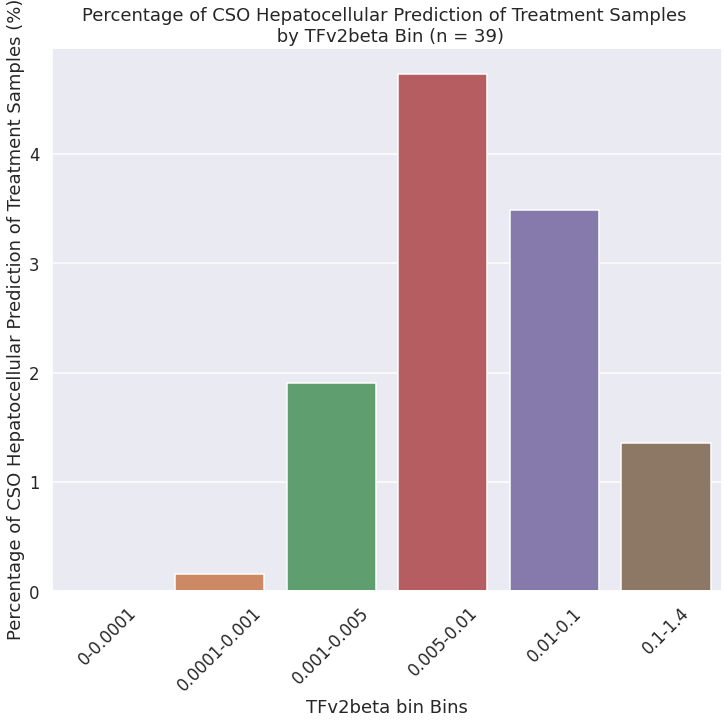

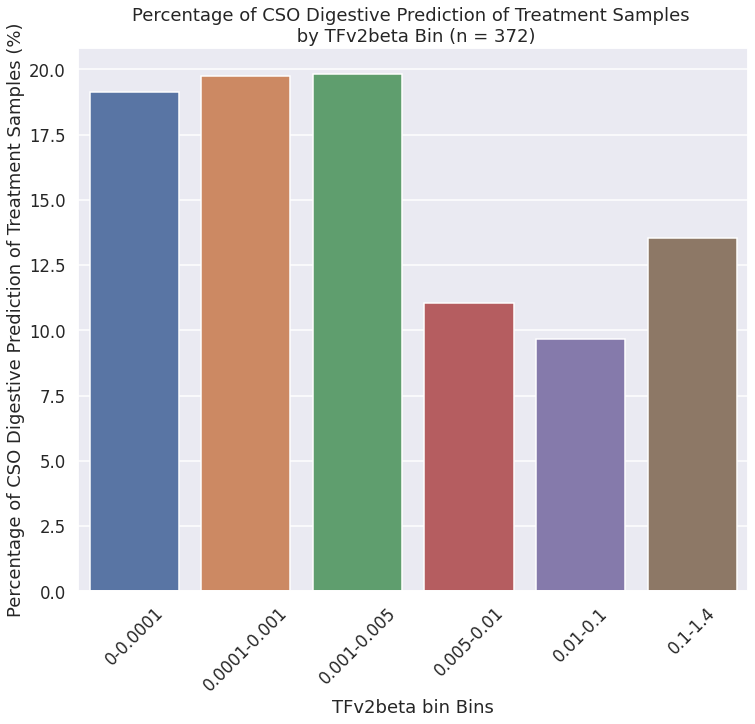

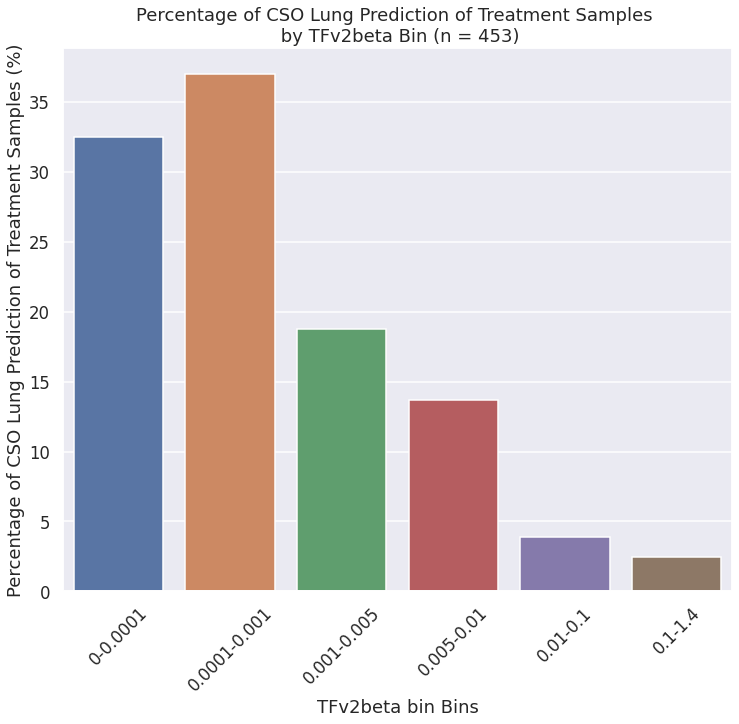

In [313]:
# Define bins for tfv2_force for baseline and treatment samples
top_prd_df_baseline = top_prd_df[top_prd_df["treatment"] == "Baseline"]
top_prd_df_treatment = top_prd_df[top_prd_df["treatment"] == "Treatment"]

# To run this code, need to run the merging step (with Kyle's tfv2 file) and run all the above steps including df_liver_cso/df_digestive_cso/df_lung_cso and corresponding baseline/treatment samples as well
def plot_tfv2_distribution_percentage(df, df_total, title_suffix):
    # Define bins for tfv2_force
    bins = [0, 0.0001, 0.001, 0.005, 0.01, 0.1, 1.4] # Check the max value top_prd_df.tfv2_force.max()! The binning is based on Princy's CSO caller performance talk 
    labels = ['0-0.0001', '0.0001-0.001', '0.001-0.005', '0.005-0.01', '0.01-0.1', '0.1-1.4']

    # Add a binning column
    df['tfv2_bin'] = pd.cut(df['tfv2_force'], bins=bins, labels=labels, right=False)
    df_total['tfv2_bin'] = pd.cut(df_total['tfv2_force'], bins=bins, labels=labels, right=False)

    # Calculate total samples in each bin
    total_samples_per_bin = df_total['tfv2_bin'].value_counts().sort_index()

    # Calculate hepatocellular samples in each bin
    hepato_samples_per_bin = df['tfv2_bin'].value_counts().sort_index()

    # Calculate percentages
    percentage_hepato = (hepato_samples_per_bin / total_samples_per_bin) * 100

    # Reset index to use in seaborn barplot
    percentage_hepato = percentage_hepato.reset_index()
    percentage_hepato.columns = ['tfv2_bin', 'Percentage']

    # Plotting
    plt.figure(figsize=(12, 10))
    # percentage_hepato.plot(kind='bar', color='blue')
    sns.barplot(x='tfv2_bin', y='Percentage', data=percentage_hepato)
    plt.title(f'Percentage of {title_suffix} Samples \n by TFv2beta Bin (n = {df.shape[0]})')
    plt.xlabel('TFv2beta bin Bins')
    plt.ylabel(f'Percentage of {title_suffix} Samples (%)')
    plt.xticks(rotation=45)
    plt.show()

# For all sample prevelance 
plot_tfv2_distribution_percentage(df_liver_cso, top_prd_df, 'CSO Hepatocellular Prediction of all')
plot_tfv2_distribution_percentage(df_digestive_cso, top_prd_df, 'CSO Digestive Prediction of all')
plot_tfv2_distribution_percentage(df_lung_cso, top_prd_df, 'CSO Lung Prediction of all')

# For baseline sample prevelance 
plot_tfv2_distribution_percentage(df_liver_cso_baseline, top_prd_df_baseline, 'CSO Hepatocellular Prediction of Baseline')
plot_tfv2_distribution_percentage(df_digestive_cso_baseline, top_prd_df_baseline, 'CSO Digestive Prediction of Baseline')
plot_tfv2_distribution_percentage(df_lung_cso_baseline, top_prd_df_baseline, 'CSO Lung Prediction of Baseline')

# For all treatment prevelance 
plot_tfv2_distribution_percentage(df_liver_cso_treatment, top_prd_df_treatment, 'CSO Hepatocellular Prediction of Treatment')
plot_tfv2_distribution_percentage(df_digestive_cso_treatment, top_prd_df_treatment, 'CSO Digestive Prediction of Treatment')
plot_tfv2_distribution_percentage(df_lung_cso_treatment, top_prd_df_treatment, 'CSO Lung Prediction of Treatment')


In [314]:
top_prd_df.treatment.value_counts()

Baseline     2742
Treatment    2339
other        2312
unknown       219
Post-op         8
Name: treatment, dtype: int64

# Evaluate suspicious samples by cohorts

## Basic checking

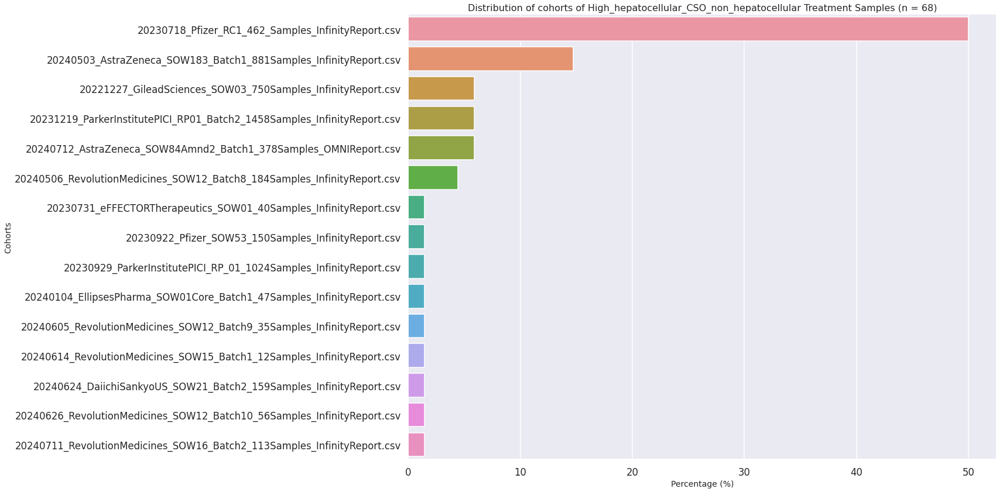

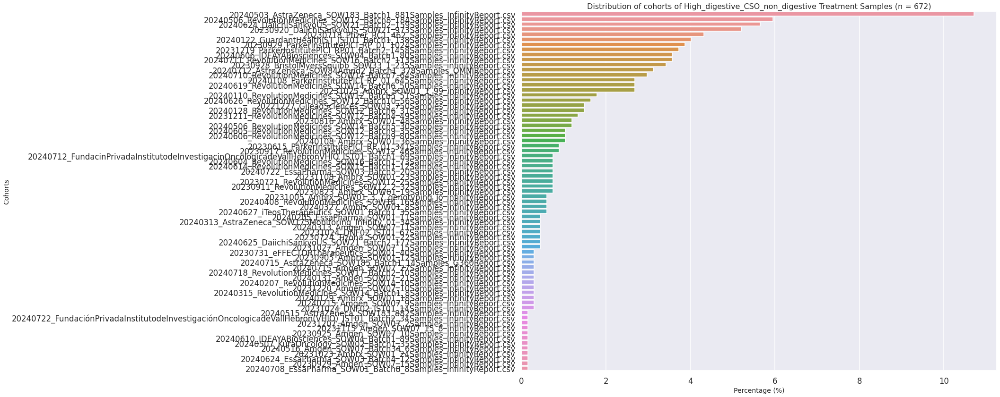

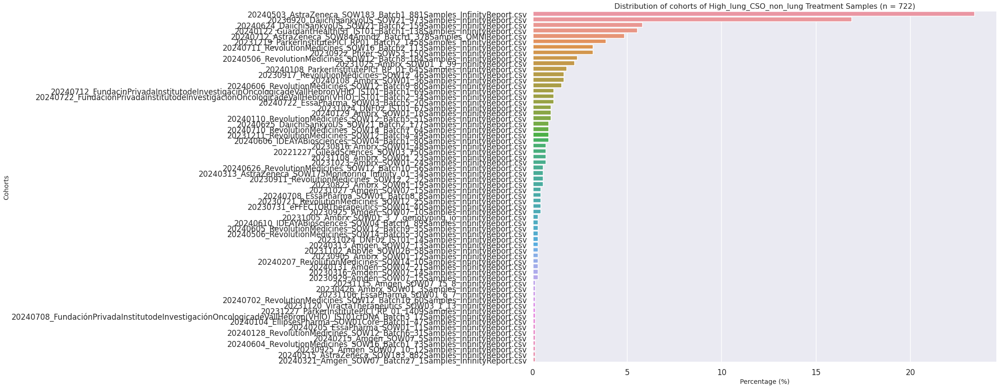

In [ ]:
# Plot cancer type distribution of those high CSO suspicious by percentage
sns.set(style="darkgrid", context="talk")

def plot_cohort_distribution_percentage(df, title_suffix):
    # Create a figure with a predefined size
    plt.figure(figsize=(18, 14))
    
    # Calculate percentage of each cancer type
    value_counts = df['csv_file_name'].value_counts(normalize=True) * 100
    order = value_counts.index
    
    # Generate a countplot with percentages
    sns.barplot(x=value_counts, y=order)
    
    # Set title and labels with dynamic titles based on the input parameter
    plt.title(f'Distribution of cohorts of {title_suffix} (n = {df.shape[0]})', fontsize=16)
    plt.xlabel('Percentage (%)', fontsize=14)
    plt.ylabel('Cohorts', fontsize=14)
    
    # Show the plot
    plt.show()

# Call the function with different datasets and titles
plot_cohort_distribution_percentage(df_liver_cso_treatment, 'High_hepatocellular_CSO_non_hepatocellular Treatment Samples')
plot_cohort_distribution_percentage(df_digestive_cso_treatment, 'High_digestive_CSO_non_digestive Treatment Samples')
plot_cohort_distribution_percentage(df_lung_cso_treatment, 'High_lung_CSO_non_lung Treatment Samples')


## Run CSO S3 version on WASHU Breast cohort (negative control check)

In [ ]:
# Data was provided by Mingyang
df_early_breast_cancer_samples = pd.read_csv('/ghsfa/projects/pharma/projects/sirius_pharma/mrd_ist/wsl/20240411_mb_update/WSL01_batch_meta.csv')
df_early_breast_cancer_samples.head()

df_early_breast_cancer_samples_success = df_early_breast_cancer_samples[df_early_breast_cancer_samples['Sample_status'] == 'SUCCESS']
df_early_breast_cancer_samples_success.head()

,GHRequestID,GHSampleID,runid,sample_msre_path,mbd_hyper_molecule_path,Sample_status,Sample_comment
2,A0779046,B00411070,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070/B00411070.mbd_hyper_molecules.tsv,SUCCESS,NaN
5,A0779049,B00411064,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064/B00411064.mbd_hyper_molecules.tsv,SUCCESS,NaN
7,A0779052,B00411081,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081/B00411081.mbd_hyper_molecules.tsv,SUCCESS,NaN
12,A0779057,B00411098,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098/B00411098.mbd_hyper_molecules.tsv,SUCCESS,NaN
13,A0779059,B00411095,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095/B00411095.mbd_hyper_molecules.tsv,SUCCESS,NaN


In [ ]:
def add_fc_dir_column(df):
    """
    Adds a 'fc_dir' column to the given dataframe, specifying the FC path based on the 'runid' column.

    Args:
        df (pd.DataFrame): A DataFrame that must contain a 'runid' column. This column is used to
                           match directory paths from predefined locations.

    Returns:
        pd.DataFrame: The original dataframe with an added 'fc_dir' column indicating the directory path
                      corresponding to each 'runid'. If no directory is found, the path will be an empty string.
        pd.DataFrame: A DataFrame containing the rows for which no directory path was found.
    """
    # Define the path
    fc_dir_all = "/ghsfa/ivd/flowcentral"
    fc_dir_omni = "/ghsfa/projects/omni_v2/flowcells"
    
    # Initialize a list to store rows where no BIP output was found
    rows_no_found = []
    
    # Initialize the new column in the DataFrame
    df['fc_dir'] = ''
    
    # Iterate over the DataFrame rows
    for index, row in df.iterrows():
        runid = row["runid"]
        
        # Find original folder
        pattern_ori = f"{fc_dir_all}/*{runid}*"
        folders = glob.glob(pattern_ori)
        
        # Check for the first folder that actually exists
        primary_fc_dir = ''
        for folder in folders:
            if os.path.exists(folder):
                primary_fc_dir = folder
                break
        
        # If a valid folder is found
        if primary_fc_dir:
            # Check if there is a 'sirius' folder under the primary fc_dir (for Sirius 1.5 folder structure change)
            if os.path.exists(os.path.join(primary_fc_dir, "sirius")):
                primary_fc_dir = os.path.join(primary_fc_dir, "sirius")
            df.loc[index, 'fc_dir'] = primary_fc_dir
        else:
            # Search in the alternative directory if no folder found in the first directory
            pattern_omni = f"{fc_dir_omni}/*{runid}*"
            folders_omni = glob.glob(pattern_omni)
            if folders_omni:
                df.loc[index, 'fc_dir'] = folders_omni[0]
            else:
                # Append the row to the list if no folder is found in either location
                rows_no_found.append(row)
    
    # Create a DataFrame with rows where folders were not found in any sources
    df_no_fc_dir = pd.DataFrame(rows_no_found)
    
    return df, df_no_fc_dir

# Generate the new dataframe 
df_early_breast_cancer_samples_success_2, df_no_found = add_fc_dir_column(df_early_breast_cancer_samples_success)

print("Total sample size of WASHU with fc_dir is " + str(df_early_breast_cancer_samples_success_2.shape[0]) + "\n") 
print("Total sample size of WASHU with NO fc_dir is " + str(df_no_found.shape[0]) + "\n") 

df_early_breast_cancer_samples_success_2.head()



Total sample size of WASHU with fc_dir is 491

Total sample size of WASHU with NO fc_dir is 0



,GHRequestID,GHSampleID,runid,sample_msre_path,mbd_hyper_molecule_path,Sample_status,Sample_comment,fc_dir
2,A0779046,B00411070,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070/B00411070.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616
5,A0779049,B00411064,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064/B00411064.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616
7,A0779052,B00411081,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081/B00411081.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616
12,A0779057,B00411098,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098/B00411098.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616
13,A0779059,B00411095,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095/B00411095.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616


### Rerun MB caller to generate the ...msre_caller_mr_features.hdr.tsv file (For some samples that miss msre_caller_mr_features.hdr.tsv file) 

In [ ]:
import epicaller
import epicaller.methylation.methyl_caller

def run_mb_lung_v4_caller_wrapper_slurm(sample_meta_df, mr_model_file, workdir):
    region_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/v0.5.2/v05_classification_space.tsv'
    control_region_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/v0.5.2/v05_positive_control_regions.tsv'
    lr_model_file='/screening/notebooks/yhe/repo/bip-products/models/Lunar2-0.2/methylation_caller/v0.5.2/msre_lr_model.tsv'

    jobs_dir = f"{workdir}/WASHU_MB_lung_v4_all_jobs"
    output_dir = f"{workdir}/WASHU_MB_lung_v4_all_output"

    # Check and create directories if not exists
    if not os.path.exists(jobs_dir):
        os.makedirs(jobs_dir)

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for _, row in sample_meta_df.iterrows():
        run_sample_id = row["GHSampleID"]
        fc_dir = row["fc_dir"]
        flowcell_id = row["runid"]
        mbd_hyper_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_hyper_molecules.tsv"
        mbd_residual_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_residual_molecules.tsv"
        
        # Check if the molecule file exists
        if not os.path.exists(mbd_hyper_molecules):
            continue

        job_file = f"{jobs_dir}/MB_call_{run_sample_id}.job"
        shebang_content = (f"#!/bin/bash\n"
                           f"#SBATCH --job-name=MB_call_{run_sample_id}\n"
                           f"#SBATCH --nodes=1\n"
                           f"#SBATCH --ntasks=1\n"
                           f"#SBATCH --cpus-per-task=1\n"
                           f"#SBATCH --mem=30gb\n"
                           f"#SBATCH --partition=dev\n"
                           f"#SBATCH --time=00:10:00\n"
                           f"#SBATCH --output={jobs_dir}/MB_call_{run_sample_id}.log\n\n")
        
        with open(job_file, "w") as job_output:
            job_output.write(shebang_content)
            job_output.write("python3 -m epicaller.methylation.methyl_caller " + 
                             f"--hyper-molecule-file {mbd_hyper_molecules} " + 
                             f"--residual-molecule-file {mbd_residual_molecules} " + 
                             f"--region-file {region_file} " +
                             f"--control-region-file {control_region_file} " + 
                             f"--lr-model-file {lr_model_file} " + 
                             f"--mr-model-file {mr_model_file} " +
                             "--min-frag-len 120 --max-frag-len 240 --min-cg-count 12 --max-cg-count 30 --cutsite-count-cutoff 1 --min-mapq 60 " + 
                             f"--sample-id {run_sample_id} --flowcell-id {flowcell_id} --outdir {output_dir}/")
            # print(job_output)    
        os.system(f"sbatch {job_file}")


In [ ]:
#run the function to generate all the MB Lung v4 caller ouputs for df_complete_MB_rerun
# df_complete_MB_rerun was generated based on 05062024 run where all the samples were reran MB caller as long as the MBD file was not found in Sai's rerun folder
run_mb_lung_v4_caller_wrapper_slurm(df_early_breast_cancer_samples_success_2, 
                      "/home/byounggreenwald/LungPan_v4_Caller.model_file.98_spec.tsv", 
                      f"{work_dir}")

In [ ]:
# Generate the file folder 
from datetime import datetime

# Prepare the "mbd_dir" columns for the data and need to make sure not only the mbd_dir exits but also it include the ....msre_caller_mr_features.hdr.tsv file
df_early_breast_cancer_samples_success_3 = df_early_breast_cancer_samples_success_2.copy()

# Path setup
# Path to MB caller rerun by Sai which include the correct "....msre_caller_mr_features.hdr.tsv" for CSO caller and the path to MB rerun dir for this project fc_dir_mb_rerun = "/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular"
mb_rerun_new = f"{work_dir}/WASHU_MB_lung_v4_all_output" # Haiyang's

# Initialize a list to store rows that no ....msre_caller_mr_features.hdr.tsv file found in either of the sources above
rows_no_found_mbd = []

# Initialize new columns in the DataFrame
df_early_breast_cancer_samples_success_3['mbd_dir'] = ''
df_early_breast_cancer_samples_success_3['unique_sample_id'] = ''

for index, row in df_early_breast_cancer_samples_success_3.iterrows():
    runid = row["runid"]
    unique_sample_id = row["GHSampleID"] + "_" + runid
    df_early_breast_cancer_samples_success_3.loc[index, 'unique_sample_id'] = unique_sample_id

    # File checks to make sure not only the folder exists but also the MBD file. Some folders has .gz version
    mbd_file = f"{row['GHSampleID']}.msre_caller_mr_features.hdr.tsv"
    mbd_file_gz = f"{mbd_file}.gz"
    found = False

    # If the "report_date" is later than April 2024, the original BIP fc_dir should include the correct ....msre_caller_mr_features.hdr.tsv file to use
    if True:
        # Check mb_rerun_new directory
        mbd_path_new = f"{mb_rerun_new}/{mbd_file}"
        mbd_path_new_gz = f"{mb_rerun_new}/{mbd_file_gz}"
        if glob.glob(mbd_path_new) or glob.glob(mbd_path_new_gz):
            df_early_breast_cancer_samples_success_3.loc[index, "mbd_dir"] = mb_rerun_new
            found = True

        # If no folder or file is found, log the row
        if not found:
            df_early_breast_cancer_samples_success_3.loc[index, "mbd_dir"] = np.nan
            rows_no_found_mbd.append(row)
            # print(f"No suitable folder or file found for {unique_sample_id}")

# Create a DataFrame with rows where no suitable folder or file was found
df_no_mbd_dir = pd.DataFrame(rows_no_found_mbd)
print("Missing mbd_dir:", df_no_mbd_dir.shape[0])
print("NaN in mbd_dir:", df_early_breast_cancer_samples_success_3['mbd_dir'].isnull().sum())

df_early_breast_cancer_samples_success_3.head()


Missing mbd_dir: 327
NaN in mbd_dir: 327


,GHRequestID,GHSampleID,runid,sample_msre_path,mbd_hyper_molecule_path,Sample_status,Sample_comment,fc_dir,mbd_dir,unique_sample_id
2,A0779046,B00411070,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070/B00411070.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,B00411070_230622_A01744_0091_AHVJ22DSX5
5,A0779049,B00411064,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064/B00411064.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,B00411064_230622_A01744_0091_AHVJ22DSX5
7,A0779052,B00411081,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081/B00411081.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,B00411081_230622_A01744_0091_AHVJ22DSX5
12,A0779057,B00411098,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098/B00411098.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,B00411098_230622_A01744_0091_AHVJ22DSX5
13,A0779059,B00411095,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095/B00411095.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,B00411095_230622_A01744_0091_AHVJ22DSX5


In [ ]:
df_early_breast_cancer_samples_success_3.runid.unique()

array(['230622_A01744_0091_AHVJ22DSX5', '230511_A01613_0188_AH3T32DSX7',
       '230511_A01613_0187_BH3NNWDSX7', '230511_A01835_0059_AH3NVMDSX7',
       '230511_A01835_0058_BH3V32DSX7', '230512_A01810_0137_BH3NWNDSX7',
       '230512_A01810_0138_AH3NWLDSX7', '230513_A01907_0092_BHVH73DSX5',
       '230513_A01835_0061_AHVHHYDSX5', '230513_A01835_0060_BHVHMCDSX5',
       '230513_A01902_0139_AHVHL3DSX5', '230513_A01902_0138_BHVHJNDSX5',
       '230516_A01467_0316_AH3THWDSX7', '230516_A01467_0315_BH3V2CDSX7',
       '230516_A00274_0852_BH3TF5DSX7', '230516_A01907_0094_AH3NVFDSX7',
       '230516_A01810_0139_BH3TYVDSX7', '230516_A01907_0095_BH3TJCDSX7',
       '230516_A01835_0062_AH3NTGDSX7', '230516_A01835_0063_BH3V23DSX7',
       '230516_A00274_0853_AH3NWFDSX7'], dtype=object)

In [ ]:
# Regardless of the missing BIP output samples
no_mbd_dir_ids = df_no_mbd_dir.GHSampleID.unique()
df_early_breast_cancer_samples_success_4 = df_early_breast_cancer_samples_success_3[~df_early_breast_cancer_samples_success_3.GHSampleID.isin(no_mbd_dir_ids)]
df_early_breast_cancer_samples_success_4.shape

(164, 10)

### CSO Caller (S3 version)

#### Data preprocessing

In [ ]:
# Generate methylation file for CSO caller
# The wide format file was generated based on "...msre_caller_mr_features.hdr.tsv" for each GHSampleID
# Important NOTE: Keep the naming "unique_sample_id" and leave it as index name as it's suitable for CSO caller

df_methyl_merged = pd.DataFrame()
df_no_parse_data = pd.DataFrame()  # Dataframe for rows with parse errors

for _, row in df_early_breast_cancer_samples_success_4.iterrows():
    try:
        # Construct both file paths
        msre_mr_file = f"{row['mbd_dir']}/{row['GHSampleID']}.msre_caller_mr_features.hdr.tsv"
        msre_mr_file_gz = f"{msre_mr_file}.gz"
        
        # Determine the correct file to load
        if os.path.exists(msre_mr_file):
            file_to_load = msre_mr_file
        elif os.path.exists(msre_mr_file_gz):
            file_to_load = msre_mr_file_gz
        else:
            raise FileNotFoundError(f"Neither uncompressed nor compressed file found: {msre_mr_file} or {msre_mr_file_gz}")
        
        # Attempt to read the file, handling .gz if necessary
        df_msre_mr_file = pd.read_table(file_to_load)
        
        # Check if the DataFrame is empty or has no columns to parse
        if df_msre_mr_file.empty or df_msre_mr_file.columns.empty:
            raise ValueError(f"File is empty or contains no parsable data: {file_to_load}")
        
        # Pivot the table to wide format
        df_wide = df_msre_mr_file.pivot(index='run_sample_id', columns='region_id', values='region_score')
        
        # Set the index to unique_sample_id
        unique_sample_id = row["unique_sample_id"]
        df_wide.index = [unique_sample_id]
        
        # Concatenate to the merged DataFrame
        df_methyl_merged = pd.concat([df_methyl_merged, df_wide])
    
    except (FileNotFoundError, ValueError) as e:
        print(e)
        # Capture the current row along with the error message in df_no_parse_data
        error_row = row.to_frame().transpose()
        error_row['error_message'] = str(e)
        df_no_parse_data = pd.concat([df_no_parse_data, error_row])

# Set the unique_sample_id as the index without resetting it
df_methyl_merged.index.name = 'unique_sample_id'
print(df_methyl_merged.shape)
df_methyl_merged.head()

# Print details of failed parse attempts
print("Rows with parsing issues:", df_no_parse_data.shape[0])
df_no_parse_data.head()


(164, 2715)
Rows with parsing issues: 0


""


In [ ]:
# Save the methylation file to save running time
df_methyl_merged_washu = df_methyl_merged.copy()
df_methyl_merged_washu.to_csv(f"{work_dir}/df_methyl_merged_washu_10282024.csv")

In [ ]:
# Readin data
df_methyl_merged_washu = pd.read_csv(f"{work_dir}/df_methyl_merged_washu_10282024.csv")


In [ ]:
# Drop duplicates based on the unique identifier, keeping the first occurrence (from df_methyl_merged)
df_methyl_washu_final = df_methyl_merged_washu.drop_duplicates(subset=['unique_sample_id'], keep='first')
df_methyl_washu_final.reset_index(drop=True, inplace=True)

print("Total sample size of the methyl washu data is " + str(df_methyl_washu_final.shape[0]) + "\n") 

Total sample size of the methyl washu data is 164



In [ ]:
# Set 'unique_sample_id' as the index of the DataFrame
df_methyl_washu_final.set_index('unique_sample_id', inplace=True, drop=True)  

# Display the head of the DataFrame to verify the new index
df_methyl_washu_final.head()

merged_0  merged_1  merged_10  \
unique_sample_id                                                         
B00411070_230622_A01744_0091_AHVJ22DSX5      -5.0  -5.00000       -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5      -5.0  -5.00000       -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5      -5.0  -5.00000       -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5      -5.0  -3.50269       -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5      -5.0  -5.00000       -5.0   

                                         merged_100  merged_1000  merged_1001  \
unique_sample_id                                                                
B00411070_230622_A01744_0091_AHVJ22DSX5   -5.000000         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5   -5.000000         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5   -5.000000         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5   -5.000000         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5   -4.138983         -5.0         -5.0   

                                         merged_1002  merged_1003  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   

                                         merged_1004  merged_1005  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   

                                         merged_1006  merged_1007  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   

                                         merged_1008  merged_1009  merged_101  \
unique_sample_id                                                                
B00411070_230622_A01744_0091_AHVJ22DSX5    -5.000000    -5.000000        -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5    -5.000000    -5.000000        -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5    -3.813271    -3.813271        -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5    -3.790116    -3.502690        -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5    -3.703685    -5.000000        -5.0   

                                         merged_1010  merged_1011  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5    -4.157135    -2.182401   
B00411064_230622_A01744_0091_AHVJ22DSX5    -5.000000    -2.948722   
B00411081_230622_A01744_0091_AHVJ22DSX5    -5.000000    -5.000000   
B00411098_230622_A01744_0091_AHVJ22DSX5    -5.000000    -5.000000   
B00411095_230622_A01744_0091_AHVJ22DSX5    -5.000000    -3.490707   

                                         merged_1012  merged_1013  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22D

#### Load functions and model paths

In [ ]:
dict_cancertype_pred = {
    "bladder":["bladder"],
    "prostate":["prostate"],
    "hepatocellular":["hepatocellular"],
    "crc":["digestive"],
    "esophageal":["digestive"],
    "pancreatic":["pancreatic"],
    "ovarian":["ovarian"],
    "lung":["lung"],
    "breast":["breast"]
}


def get_model_params(inputDir):
    modelNameFileDict = {
        # '_'.join(i.name.split('_')[3::]).split('.')[0]:i for i in inputDir.glob("*.tsv")
        'CSO_' + i.stem: i for i in inputDir.glob("*.tsv")

    }
    modelNameFileDict['Pancancer'] = Path('/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/pancancer/2024_03_19_pancancer_model.tsv')
    # modelNameFileDict['Pancancer'] = Path('/screening/analysis/2024_03_28_EP1_LX/bip_update/pancancer_s3_mb_98_spec.tsv')

    print(modelNameFileDict)
    model_scores_df = {}
    # Refine the col rename as new model file is different
    for eachmodel in modelNameFileDict:
        model_scores_df[eachmodel] = pd.read_table(
            modelNameFileDict.get(eachmodel),
            index_col=0
        ).rename(
            columns={"coef":"weights", # column "coefficients" is in old pan-cancer model file; column "weight" in the new one
                     "coefficients":"weights"} # column "coef" is in each cancer type model file
        )
    return model_scores_df


def get_model_score(X, mc_model_df):
    return X.dot(mc_model_df["weights"].T)  + mc_model_df.bias.iloc[0]

def apply_models(model_parameter_list, 
                df_meth):
    
    _cancerTypeModelScores = pd.DataFrame()
    for eachCancerType in model_parameter_list:
        _cancerTypeModelScores[eachCancerType] = get_model_score(
                X= df_meth, 
                mc_model_df = model_parameter_list.get(eachCancerType),
        )
    
    _cancerTypeModelScores = _cancerTypeModelScores.set_index(['Pancancer'], append=True).melt(
        var_name = "cso_model_type",
        value_name = "cso_score",
        ignore_index=False
    )

    return _cancerTypeModelScores

def get_top_model_scores(df, df_meta, top_n=1):
    this_df = df.sort_values(
        'cso_score', 
        ascending=False
        ).groupby(
            'unique_sample_id'
            ).head(n=top_n).reset_index().merge(
                df_meta,
                how = "left"
    )
    return this_df

def get_contingency(
    cancerTypeModelScores_top,
    metric_type = "sensitivity"):


    contingency_mat = pd.DataFrame(
        # index = cancerTypeNames,
        # columns = cancerTypeNames
    ) 

    for eachrow in cancerTypeModelScores_top.cso_prediction.unique().tolist():
        for eachcol in cancerTypeModelScores_top.sample_group.unique().tolist():
            sample_group_n = cancerTypeModelScores_top[cancerTypeModelScores_top.sample_group==eachcol].shape[0]
            prediction_group_n = cancerTypeModelScores_top[
                cancerTypeModelScores_top.cso_prediction==eachrow].shape[0]
            if metric_type=="sensitivity":
                contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
                                    eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
                                            (cancerTypeModelScores_top.sample_group == eachcol)&
                                            (cancerTypeModelScores_top.cso_prediction == eachrow)
                                            ].shape[0]/sample_group_n
                
            if metric_type=="precision":
                contingency_mat.loc[eachrow+'(N='+str(prediction_group_n)+')',
                                    eachcol+'(N='+str(sample_group_n)+')'] = cancerTypeModelScores_top[
                                            (cancerTypeModelScores_top.sample_group == eachcol)&
                                            (cancerTypeModelScores_top.cso_prediction == eachrow)
                                            ].shape[0]/prediction_group_n
            
    # print(contingency_mat.head())
    mat_plot = contingency_mat.melt(
        ignore_index=False,
        var_name = "sample_group",
        value_name = metric_type,
    ).reset_index()
    mat_plot.columns = ["CSO_prediction","sample_group", metric_type]

            
    return mat_plot

def heatmap_contingency(df, x_col, y_col, color_col, height_fig = 200, width_fig=200, col_scheme='lightgreyteal'):
    base = alt.Chart(df).encode(
        alt.X(x_col+':O', axis=alt.Axis(labelFontSize=14)),
        alt.Y(y_col+':O', axis=alt.Axis(labelFontSize=14)),
    ).properties(
        height=height_fig,
        width=width_fig
    )

    # Configure heatmap
    heatmap = base.mark_rect().encode(
        alt.Color(color_col+':Q', scale=alt.Scale(
            scheme=col_scheme, domain=(0,1)))
    )

    # Configure text
    text = base.mark_text(baseline='middle', size=16).encode(
        alt.Text(color_col+':Q', format=".2f"),
        color=alt.condition(
            alt.datum[color_col] < 0.4,
            alt.value('black'),
            alt.value('white')
        )
    )

    # Draw the chart
    return(heatmap + text)

In [ ]:
modelDir = Path(
    "/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/"
)

v6_region_fn = Path(
    "/screening/notebooks/pparsana/pparsana_until_2023/screening/analysis/2023_02_14_data_for_Darya_PP/data/v6_region_annotations_from_Liyang.tsv"
)

# s3_pancancer_thresh = -20.439347452871473  
s3_pancancer_thresh = -19.0509

possible_cso_calls = ['breast', 'prostate', 'esophageal', 'ovarian', 'lung', 'bladder',
       'pancreatic', 'hepatocellular', 'crc']


#### Read all CSO related data

In [ ]:
# Read region metadata
v6_regions_df = pd.read_table(v6_region_fn, index_col=0).query(" chrom!='X'")
print(v6_regions_df.shape)
v6_regions_df.head()

(2715, 12)


,chrom,start,end,C_count,G_count,A_count,T_count,CG_count,region_id,merged_region_id,merged_region_type,used_in_classification
0,1,955884,956186,104,124,38,36,33,merged_0,v5_hypo_control_chr1_955885_956186,V5_HYPO_CONTROL,no
1,1,1107305,1107455,54,48,31,17,13,merged_1,myeloid_dmr_482,V6_IMMUNE_DMR,yes
2,1,2461184,2461934,241,308,100,101,98,merged_2,HES5_TSS_minus_downreg,V6_DE_TSS,yes
3,1,2984786,2985170,116,184,40,44,54,merged_3,v5_crc_dmr_chr1_2984787_2985170,V5_CRC_DMR,yes
4,1,3663703,3664004,109,120,43,29,34,merged_4,v5_tissue_dmr_chr1_3663704_3664004,V5_COLON_TISSUE_DMR,yes


In [ ]:
# Read Model files
model_params_dict = get_model_params(inputDir=modelDir)

{'CSO_lung': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/lung.tsv'), 'CSO_pancreatic': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/pancreatic.tsv'), 'CSO_hepatocellular': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/hepatocellular.tsv'), 'CSO_prostate': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/prostate.tsv'), 'CSO_breast': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/breast.tsv'), 'CSO_esophageal_gastric': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/esophageal_gastric.tsv'), 'CSO_crc': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/crc.tsv'), 'CSO_ovarian': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3trained_v6regions/ovarian.tsv'), 'CSO_bladder': PosixPath('/home/eforouzmand/repos/gh-eforouzmand/shared/cso_s3train

#### Run CSO callers

In [ ]:
df_methyl_washu_final.head()

merged_0  merged_1  merged_10  \
unique_sample_id                                                         
B00411070_230622_A01744_0091_AHVJ22DSX5      -5.0  -5.00000       -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5      -5.0  -5.00000       -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5      -5.0  -5.00000       -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5      -5.0  -3.50269       -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5      -5.0  -5.00000       -5.0   

                                         merged_100  merged_1000  merged_1001  \
unique_sample_id                                                                
B00411070_230622_A01744_0091_AHVJ22DSX5   -5.000000         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5   -5.000000         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5   -5.000000         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5   -5.000000         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5   -4.138983         -5.0         -5.0   

                                         merged_1002  merged_1003  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   

                                         merged_1004  merged_1005  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   

                                         merged_1006  merged_1007  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   

                                         merged_1008  merged_1009  merged_101  \
unique_sample_id                                                                
B00411070_230622_A01744_0091_AHVJ22DSX5    -5.000000    -5.000000        -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5    -5.000000    -5.000000        -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5    -3.813271    -3.813271        -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5    -3.790116    -3.502690        -5.0   
B00411095_230622_A01744_0091_AHVJ22DSX5    -3.703685    -5.000000        -5.0   

                                         merged_1010  merged_1011  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5    -4.157135    -2.182401   
B00411064_230622_A01744_0091_AHVJ22DSX5    -5.000000    -2.948722   
B00411081_230622_A01744_0091_AHVJ22DSX5    -5.000000    -5.000000   
B00411098_230622_A01744_0091_AHVJ22DSX5    -5.000000    -5.000000   
B00411095_230622_A01744_0091_AHVJ22DSX5    -5.000000    -3.490707   

                                         merged_1012  merged_1013  \
unique_sample_id                                                    
B00411070_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411064_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411081_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411098_230622_A01744_0091_AHVJ22DSX5         -5.0         -5.0   
B00411095_230622_A01744_0091_AHVJ22D

In [ ]:
# Generate CSO scores 
# Load the methylation data "df_methyl_merged"
cancerTypeModelScores = apply_models(model_parameter_list = model_params_dict, df_meth=df_methyl_washu_final).reset_index()
print(cancerTypeModelScores.shape)
cancerTypeModelScores.head()

(1476, 4)


,unique_sample_id,Pancancer,cso_model_type,cso_score
0,B00411070_230622_A01744_0091_AHVJ22DSX5,-7.315182,CSO_lung,-10.127531
1,B00411064_230622_A01744_0091_AHVJ22DSX5,-16.732367,CSO_lung,-15.149275
2,B00411081_230622_A01744_0091_AHVJ22DSX5,-6.774820,CSO_lung,-14.202314
3,B00411098_230622_A01744_0091_AHVJ22DSX5,-14.432854,CSO_lung,-17.438198
4,B00411095_230622_A01744_0091_AHVJ22DSX5,-13.582328,CSO_lung,-12.239177


In [ ]:
# Merge the meta data "df_cytomx_1"
cancerTypeModelScores_1 = cancerTypeModelScores.copy()

cancerTypeModelScores_1= cancerTypeModelScores_1.merge(df_early_breast_cancer_samples_success_4,
        on = "unique_sample_id",
        how = "left",
        validate = "many_to_one"
    )

print(cancerTypeModelScores_1.shape)
cancerTypeModelScores_1.head()


(1476, 13)


,unique_sample_id,Pancancer,cso_model_type,cso_score,GHRequestID,GHSampleID,runid,sample_msre_path,mbd_hyper_molecule_path,Sample_status,Sample_comment,fc_dir,mbd_dir
0,B00411070_230622_A01744_0091_AHVJ22DSX5,-7.315182,CSO_lung,-10.127531,A0779046,B00411070,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070/B00411070.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output
1,B00411064_230622_A01744_0091_AHVJ22DSX5,-16.732367,CSO_lung,-15.149275,A0779049,B00411064,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064/B00411064.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output
2,B00411081_230622_A01744_0091_AHVJ22DSX5,-6.774820,CSO_lung,-14.202314,A0779052,B00411081,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081/B00411081.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output
3,B00411098_230622_A01744_0091_AHVJ22DSX5,-14.432854,CSO_lung,-17.438198,A0779057,B00411098,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098/B00411098.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output
4,B00411095_230622_A01744_0091_AHVJ22DSX5,-13.582328,CSO_lung,-12.239177,A0779059,B00411095,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095/B00411095.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output


In [ ]:
# Generate a column "Pancancer_call" to track pancancer caller result
cancerTypeModelScores_2 = cancerTypeModelScores_1.copy()

cancerTypeModelScores_2["Pancancer_call"] = np.where(cancerTypeModelScores_2["Pancancer"]>s3_pancancer_thresh, True, False)
cancerTypeModelScores_2.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,GHRequestID,GHSampleID,runid,sample_msre_path,mbd_hyper_molecule_path,Sample_status,Sample_comment,fc_dir,mbd_dir,Pancancer_call
0,B00411070_230622_A01744_0091_AHVJ22DSX5,-7.315182,CSO_lung,-10.127531,A0779046,B00411070,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070/B00411070.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True
1,B00411064_230622_A01744_0091_AHVJ22DSX5,-16.732367,CSO_lung,-15.149275,A0779049,B00411064,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064/B00411064.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True
2,B00411081_230622_A01744_0091_AHVJ22DSX5,-6.774820,CSO_lung,-14.202314,A0779052,B00411081,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081/B00411081.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True
3,B00411098_230622_A01744_0091_AHVJ22DSX5,-14.432854,CSO_lung,-17.438198,A0779057,B00411098,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098/B00411098.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True
4,B00411095_230622_A01744_0091_AHVJ22DSX5,-13.582328,CSO_lung,-12.239177,A0779059,B00411095,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411095/B00411095.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True


In [ ]:
# This step is optional but can be essential when the next cnv_qc_df generation step has an error!!!!

# Due to some historical methylation data was missing in the hpc, so the df_methyl_merged excluded some samples during the Data preprocessing step because no mbd_dir can be generated.
# Then when merge the df_methyl_merged with df_complete_7 to generate cancerTypeModelScores_1, resulted in many samples with missing values of entire df_complete_7 columns such as "fc_dir"
# Now the solution is for now, remove those samples with missing values becuase for the rest of steps it will be problematic such as step cnv_qc_df generation.
# Since the historical intermediate data cancerTypeModelScores_5 is saved (i.e. pd.read_csv(f"{work_dir}/cancerTypeModelScores_5.csv", header = 0)) The missing data will be merged back at the step of cancerTypeModelScores_5 generation 
 
# Remove samples with "fc_dir" nan
print('# is ' + str(cancerTypeModelScores_2.shape[0]) + ' before removing fc_dir missing')
cancerTypeModelScores_2 = cancerTypeModelScores_2[~cancerTypeModelScores_2['fc_dir'].isnull()]
print('# is ' + str(cancerTypeModelScores_2.shape[0]) + ' after removing fc_dir missing')


# is 1476 before removing fc_dir missing
# is 1476 after removing fc_dir missing


#### Get CSO calls

##### Read provided and predicted sex

In [ ]:
cancerTypeModelScores_3 = cancerTypeModelScores_2.copy()

# Generate the paths for both primary and alternative ".ghcnv_qc.hdr.tsv" files
cancerTypeModelScores_3['primary_cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.hdr.tsv"
cancerTypeModelScores_3['alternative_cnv_qc_file_path'] = cancerTypeModelScores_3['fc_dir'] + '/' + cancerTypeModelScores_3['GHSampleID'] + '/' + cancerTypeModelScores_3['GHSampleID'] + ".ghcnv_qc.combined.hdr.tsv"

# Lists to store data and missing file info
cnv_qc_df = []
rows_not_found_bip = []

# Set to track processed files to avoid duplicates
processed_files = set()

# Iterate over unique primary file paths
for filename in cancerTypeModelScores_3['primary_cnv_qc_file_path'].drop_duplicates():
    primary_exists = glob.glob(filename)
    alternative_filename = cancerTypeModelScores_3.loc[cancerTypeModelScores_3['primary_cnv_qc_file_path'] == filename, 'alternative_cnv_qc_file_path'].iloc[0]
    alternative_exists = glob.glob(alternative_filename)

    # Check primary file existence, if not, check for alternative file
    if primary_exists and filename not in processed_files:
        processed_files.add(filename)
        df = pd.read_csv(filename, sep="\t")
        cnv_qc_df.append(df)
    elif not primary_exists and alternative_exists and alternative_filename not in processed_files:
        processed_files.add(alternative_filename)
        df = pd.read_csv(alternative_filename, sep="\t")
        cnv_qc_df.append(df)
    else:
        # Find all rows corresponding to the missing file and add to list
        missing_rows = cancerTypeModelScores_3[cancerTypeModelScores_3['primary_cnv_qc_file_path'] == filename]
        rows_not_found_bip.extend(missing_rows.to_dict('records'))

# Concatenate all found cnv_qc data into a DataFrame
if cnv_qc_df:
    cnv_qc_df = pd.concat(cnv_qc_df, ignore_index=True)
    cnv_qc_df["predicted_sex"] = [x[0] for x in cnv_qc_df.gender.str.split("|")]
    cnv_qc_df["provided_sex"] = [x[1] if len(x) > 1 else x[0] for x in cnv_qc_df.gender.str.split("|")]
else:
    print("No valid CNV QC files found.")

# Convert the list of rows where files were not found into a DataFrame
if rows_not_found_bip:
    df_no_bip_output = pd.DataFrame(rows_not_found_bip)
    df_no_bip_output = df_no_bip_output.drop_duplicates(subset="unique_sample_id")  # Drop duplicates based on a unique identifier
    print("Rows with missing files:", df_no_bip_output.shape)
else:
    print("No missing files detected.")

# Display the first few rows of the CNV QC DataFrame
cnv_qc_df.head()


Rows with missing files: (1, 16)


,run_sample_id,runid,code,status,raw_cnt_iqr,umol_gc_iqr,mapd,mapd_ecdf,gof,gof_ecdf,diversity,diversity_ecdf,frac_diploid,frac_diploid_ecdf,maf_baseline,maf_baseline_amp_genes,gender,chry_mol_cnt,chry_nonsingleton,hs_bb_ratio,predicted_sex,provided_sex
0,B00411070,230622_A01744_0091_AHVJ22DSX5,2000,Gender not specified,11.943020,1.091398,0.084,0.980198,0.661,0.603960,1058,1,0.117,0.079208,0.000000,MTOR;SPEN;CDC7;DPYD;GSTM1;NOTCH2;MCL1;RIT1;DDR2;KDM5B;MDM4;IKBKE;PARP1;H3-4;EXO1;AKT3;MSH2;MSH6;XPO1;DDX18;RIF1;ACVR1;LRP2;STAT1;DIS3L2;EIF4E2;CBLB;GSK3B;POLQ;EPHB1;PIK3CB;ATR;TIPARP;PRKCI;PIK3CA;TERT;IRF4;PRPF4B;TBC1D7;TPMT;E2F3;HLA-F;HLA-G;HLA-A;HLA-E;DHX16;MDC1;HLA-C;HLA-B;MICB;NCR3;NELFE;STK19;NOTCH4;HLA-DRB5;HLA-DQA1;TAP2;PSMB8;TAP1;PSMB9;HLA-DPA1;HLA-DPB1;TAPBP;POLH;CDC5L;SYNCRIP;EZH2;RHEB;KMT2C;XRCC2;PAXIP1;PDE7A;PREX2;ELOC;HEY1;WWP1;NBN;RUNX1T1;VIRMA;CCNE2;PTDSS1;PABPC1;FZD6;RSPO2;RAD21;DEPTOR;MYC;RECQL4;GNAQ;NTRK2;TET1;KAT6B;FGFR2;KDM5A;CCND2;CHD4;ETV6;FLT3;FLT1;FGF14;ERCC5;LIG4;CUL4A;SPOP;RNF43;RAD51C;RPS6KB1;PPM1D;BRIP1;CD79B;GNA13;AXIN2;PRKAR1A;TEN1;EIF4A3;RPTOR;FAAP100;PTPN2;PTPRS;DNMT1;KEAP1;NOTCH3;CCNE1;SHLD1;ASXL1;DNMT3B;SAMHD1;SRC;TOP1;PTPRT;SDC4;PREX1;DDX27;TSHZ2;AURKA;GNAS;ERG;TMPRSS2;CHEK2;NF2;DEPDC5;EP300;AR;MED12;BRCC3,Female,0,0,1.269805,Female,Female
1,B00411064,230622_A01744_0091_AHVJ22DSX5,2002,Low diversity; Gender not specified,9.825114,0.934640,0.063,0.960396,0.591,0.336634,319,1,0.743,0.722772,0.023913,NaN,Female,0,0,1.351020,Female,Female
2,B00411081,230622_A01744_0091_AHVJ22DSX5,2002,Low diversity; Gender not specified,10.280890,0.906383,0.051,0.930693,0.669,0.633663,492,1,0.827,0.752475,0.026848,NaN,Female,0,0,1.356383,Female,Female
3,B00411098,230622_A01744_0091_AHVJ22DSX5,2002,Low diversity; Gender not specified,10.267490,0.964215,0.054,0.940594,0.621,0.445545,526,1,0.934,0.881188,0.017690,NaN,Female,0,0,1.299043,Female,Female
4,B00411095,230622_A01744_0091_AHVJ22DSX5,2000,Gender not specified,9.973341,0.987403,0.048,0.910891,0.679,0.673267,1094,1,0.884,0.831683,0.008064,NaN,Female,0,0,1.306713,Female,Female


In [ ]:
# Save the data
# cnv_qc_df.to_csv(f"{work_dir}/cnv_qc_df.csv", index=False)
# cnv_qc_df.to_csv(f"{work_dir}/cnv_qc_df_07242024.csv", index=False)
cnv_qc_df_washu = cnv_qc_df.copy()
cnv_qc_df_washu.to_csv(f"{work_dir}/cnv_qc_df_washu_10282024.csv", index=False)

In [ ]:
# Check the inconsistence
cnv_qc_df_washu = pd.read_csv(f"{work_dir}/cnv_qc_df_washu_10282024.csv", header=0)

cnv_qc_df_washu[cnv_qc_df_washu.predicted_sex!=cnv_qc_df_washu.provided_sex]

pd.crosstab(cnv_qc_df_washu.predicted_sex, cnv_qc_df_washu.provided_sex, dropna=False)


provided_sex,Female
predicted_sex,
Female,163


In [ ]:
# Drop duplicates based on the unique identifier, keeping the first occurrence (from df_methyl_merged)
cnv_qc_df_washu_final = cnv_qc_df_washu.drop_duplicates(subset=['run_sample_id'], keep='first')
cnv_qc_df_washu_final.reset_index(drop=True, inplace=True)

print("Total sample size of the cancerTypeModelScores_5 washu data is " + str(cnv_qc_df_washu_final.shape[0]) + "\n") 

Total sample size of the cancerTypeModelScores_5 washu data is 163



In [ ]:
# Merge predicted and provided sex with model scores
cancerTypeModelScores_4 = cancerTypeModelScores_3.copy()
cancerTypeModelScores_4 = cancerTypeModelScores_4.merge(cnv_qc_df_washu_final[["run_sample_id", "predicted_sex", "provided_sex"]].drop_duplicates(), 
                                                    left_on="GHSampleID", 
                                                    right_on = "run_sample_id",
                                                    how="left", validate = "many_to_one")
print(cancerTypeModelScores_4.shape)
cancerTypeModelScores_4.head()

(1476, 19)


,unique_sample_id,Pancancer,cso_model_type,cso_score,GHRequestID,GHSampleID,runid,sample_msre_path,mbd_hyper_molecule_path,Sample_status,Sample_comment,fc_dir,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex
0,B00411070_230622_A01744_0091_AHVJ22DSX5,-7.315182,CSO_lung,-10.127531,A0779046,B00411070,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411070/B00411070.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616/B00411070/B00411070.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616/B00411070/B00411070.ghcnv_qc.combined.hdr.tsv,B00411070,Female,Female
1,B00411064_230622_A01744_0091_AHVJ22DSX5,-16.732367,CSO_lung,-15.149275,A0779049,B00411064,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411064/B00411064.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616/B00411064/B00411064.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616/B00411064/B00411064.ghcnv_qc.combined.hdr.tsv,B00411064,Female,Female
2,B00411081_230622_A01744_0091_AHVJ22DSX5,-6.774820,CSO_lung,-14.202314,A0779052,B00411081,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411081/B00411081.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616/B00411081/B00411081.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616/B00411081/B00411081.ghcnv_qc.combined.hdr.tsv,B00411081,Female,Female
3,B00411098_230622_A01744_0091_AHVJ22DSX5,-14.432854,CSO_lung,-17.438198,A0779057,B00411098,230622_A01744_0091_AHVJ22DSX5,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098,/ghds/projects/omni_v2/flowcells/230622_A01744_0091_AHVJ22DSX5_PS3R373_AP2.Sirius-1.1.0-RLS_20230904-164713/B00411098/B00411098.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True,/ghsfa/ivd/flowcentral/230622_A01744_0091_AHVJ22DSX5.c4220e83-0e16-4275-98c7-7a2cff922506.20230624231616/B00411098/B00411098.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230622_A01744_009

##### Function to predict top `n` CSO

In [ ]:
def topn_predictions(avg_results, 
                     index_cols, 
                     score_col="cso_score", 
                     top_n=2, 
                     prediction_col="cso_prediction"):
    
    """ First group by prediction col and take the maximum
    Since we group CRC/esophageal in one group, by doing this
    we are selecting higher model score for digestive """

    topn_calls = (
        avg_results.
        sort_values(score_col, ascending=False).groupby(
            index_cols+["run_sample_id", prediction_col], 
            dropna=False).head(1)
    )
    
    """ Next we group by run_sample_id to get top n scores"""
    topn_calls["CSO_rank"] = (
        topn_calls.groupby(index_cols+["run_sample_id"], dropna=False)[score_col].
        rank(ascending=False).astype(int)
    )
        
    topn_calls = topn_calls[topn_calls["CSO_rank"] <= top_n].sort_values(["run_sample_id", "CSO_rank"])
    topn_calls["CSO_rank"] = topn_calls["CSO_rank"].astype(str)
    
    return(topn_calls)

In [ ]:
# Exclude some rows based on hard rules
cancerTypeModelScores_5 = (
        cancerTypeModelScores_4[~((cancerTypeModelScores_4.predicted_sex == "Male") & (cancerTypeModelScores_4.cso_model_type.isin(["CSO_breast", "CSO_ovarian"]))) &
                       ~((cancerTypeModelScores_4.predicted_sex == "Female") & (cancerTypeModelScores_4.cso_model_type.isin(["CSO_prostate"])))].copy()

    )
print(cancerTypeModelScores_4.shape)
print(cancerTypeModelScores_5.shape)


(1476, 19)
(1313, 19)


In [ ]:
# Add a column that will become the final CSO prediction. 
# This is necessary because the CRC and gastroesophageal models will get the same prediction

cancerTypeModelScores_5["cso_prediction"] = (
    cancerTypeModelScores_5.cso_model_type.replace({"CSO_esophageal": "digestive", "CSO_crc": "digestive"},
                                                      inplace=False).copy()
)

cancerTypeModelScores_5["cso_prediction"] = cancerTypeModelScores_5["cso_prediction"].str.replace(
    'CSO_',''
)

cancerTypeModelScores_5["cso_prediction"].unique()

array(['lung', 'pancreatic', 'hepatocellular', 'prostate', 'breast',
       'esophageal_gastric', 'digestive', 'ovarian', 'bladder'],
      dtype=object)

In [ ]:
# Save the data
# cancerTypeModelScores_5.to_csv(f"{work_dir}/cancerTypeModelScores_5.csv", index=False)
# cancerTypeModelScores_5.to_csv(f"{work_dir}/cancerTypeModelScores_5_07242024.csv", index=False)
cancerTypeModelScores_5_washu = cancerTypeModelScores_5.copy()
cancerTypeModelScores_5_washu.to_csv(f"{work_dir}/cancerTypeModelScores_5_washu_10282024.csv", index=False)

In [ ]:
# Drop duplicates based on the unique identifier (both 'unique_sample_id', 'cso_model_type') as every "unique_sample_id" corresponds with many "cso_model_type", keeping the first occurrence (from df_methyl_merged)
cancerTypeModelScores_5_washu_final = cancerTypeModelScores_5_washu.drop_duplicates(subset=['unique_sample_id', 'cso_model_type'], keep='first')
cancerTypeModelScores_5_washu_final.reset_index(drop=True, inplace=True)

print("Total sample size of the cancerTypeModelScores_5 washu data is " + str(cancerTypeModelScores_5_washu_final.shape[0]) + "\n") 

Total sample size of the cancerTypeModelScores_5 washu data is 1313



In [ ]:
# Save the data
cancerTypeModelScores_5_washu_final.to_csv(f"{work_dir}/cancerTypeModelScores_5_washu_final_10282024.csv", index=False)

# copy the data for the rest steps to keep the same name
cancerTypeModelScores_5_washu = cancerTypeModelScores_5_washu_final.copy()

In [ ]:
# Get the top 1 prediction
top_prd_df_washu = topn_predictions(avg_results=cancerTypeModelScores_5_washu,
                               top_n=1,
                               index_cols=[])
print(top_prd_df_washu.shape)
top_prd_df_washu.head()

# Get the top 2 prediction
top_2_prd_df_washu = topn_predictions(avg_results=cancerTypeModelScores_5_washu,
                               top_n=2,
                               index_cols=[])
print(top_2_prd_df_washu.shape)
top_2_prd_df_washu.head()

# Get the top 8 prediction
top_8_prd_df_washu = topn_predictions(avg_results=cancerTypeModelScores_5_washu,
                               top_n=8,
                               index_cols=[])

print(top_8_prd_df_washu.shape)
top_8_prd_df_washu.head()

(164, 21)
(328, 21)
(1312, 21)


,unique_sample_id,Pancancer,cso_model_type,cso_score,GHRequestID,GHSampleID,runid,sample_msre_path,mbd_hyper_molecule_path,Sample_status,Sample_comment,fc_dir,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank
678,B00373692_230511_A01613_0188_AH3T32DSX7,-8.116469,CSO_breast,8.620208,A0734889,B00373692,230511_A01613_0188_AH3T32DSX7,/ghds/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692,/ghds/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.ghcnv_qc.combined.hdr.tsv,B00373692,Female,Female,breast,1
1334,B00373692_230511_A01613_0188_AH3T32DSX7,-8.116469,CSO_bladder,-12.445562,A0734889,B00373692,230511_A01613_0188_AH3T32DSX7,/ghds/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692,/ghds/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.ghcnv_qc.combined.hdr.tsv,B00373692,Female,Female,bladder,2
350,B00373692_230511_A01613_0188_AH3T32DSX7,-8.116469,CSO_hepatocellular,-15.663487,A0734889,B00373692,230511_A01613_0188_AH3T32DSX7,/ghds/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692,/ghds/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.ghcnv_qc.hdr.tsv,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.ghcnv_qc.combined.hdr.tsv,B00373692,Female,Female,hepatocellular,3
1006,B00373692_230511_A01613_0188_AH3T32DSX7,-8.116469,CSO_crc,-21.395368,A0734889,B00373692,230511_A01613_0188_AH3T32DSX7,/ghds/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692,/ghds/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104/B00373692/B00373692.mbd_hyper_molecules.tsv,SUCCESS,NaN,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX7_PS3R277_AP1.Sirius-1.1.0-RLS_20230726-155104,/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/WASHU_MB_lung_v4_all_output,True,/ghsfa/projects/omni_v2/flowcells/230511_A01613_0188_AH3T32DSX

In [ ]:
# Save the data
top_prd_df_washu.to_csv(f"{work_dir}/top_prd_df_washu_10282024.csv", index=False)
top_8_prd_df_washu.to_csv(f"{work_dir}/top_8_prd_df_washu_10142024.csv", index=False)

In [ ]:
# Check the prevalence of CSO lung prediction for WASHU breast (negative control)
top_prd_df_washu_cso_lung = top_prd_df_washu[top_prd_df_washu['cso_prediction'] == 'lung']
print('Total ' + str(top_prd_df_washu_cso_lung.shape[0]) + ' samples are CSO lung out of ' + str(top_prd_df_washu.shape[0]) + ' total samples in WASHU Breast')

Total 2 samples are CSO lung out of 164 total samples in WASHU Breast


## Deep dive on Parker PICI cohort

In [ ]:
# Get the suspicious samples in Parker cohort

# CSO-Lung treatment samples in Parker
df_lung_cso_treatment_ParkerInstitutePICI = df_lung_cso_treatment[df_lung_cso_treatment["Account"] == "ParkerInstitutePICI"]
print('# of CSO-Lung treatment samples in Parker is ' + str(df_lung_cso_treatment_ParkerInstitutePICI.shape[0]))

# CSO-digestive treatment samples in Parker
df_digestive_cso_treatment_ParkerInstitutePICI = df_digestive_cso_treatment[df_digestive_cso_treatment["Account"] == "ParkerInstitutePICI"]
print('# of CSO-digestive treatment samples in Parker is ' + str(df_digestive_cso_treatment_ParkerInstitutePICI.shape[0]))

# Load Parker PICI clinical data provided by Jing
df_clinical_data_lung_patient_Parker = pd.read_table(f"{work_dir}/PICI0009-Radiohead-nsclc-Release-2.0-subjects.tsv")
df_clinical_data_pan_cancer_patient_Parker = pd.read_table(f"{work_dir}/PICI0009-Radiohead-pan-cancer-Release-2.0-subjects.tsv")

df_clinical_data_lung_patient_Parker.head()
df_clinical_data_pan_cancer_patient_Parker.head()

In [ ]:
# Merge the clinical data for the CSO-lung samples

# Create a new column by slicing the last 6 characters of 'Patient_ID'
df_lung_cso_treatment_ParkerInstitutePICI['Patient_ID_Parker'] = df_lung_cso_treatment_ParkerInstitutePICI['Patient_ID'].str[-6:]

# Rename the column in the dataframe
df_clinical_data_pan_cancer_patient_Parker_new = df_clinical_data_pan_cancer_patient_Parker.rename(columns={"subject.id": "Patient_ID_Parker"})

# Merge dataframes on 'Patient_ID_Parker' (as all the clinical data for CSO-lung only from df_clinical_data_pan_cancer_patient_Parker_new)
df_lung_cso_treatment_ParkerInstitutePICI_all = df_lung_cso_treatment_ParkerInstitutePICI.merge(
    df_clinical_data_pan_cancer_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

print('# of CSO-lung treatment samples in Parker with clinical data is ' + str(df_lung_cso_treatment_ParkerInstitutePICI_all.shape[0]))
df_lung_cso_treatment_ParkerInstitutePICI_all.head()

In [ ]:
# Chech how many CSO-lung samples has lung meta condition in Parker
df_lung_cso_treatment_ParkerInstitutePICI_all_lung_meta = df_lung_cso_treatment_ParkerInstitutePICI_all[df_lung_cso_treatment_ParkerInstitutePICI_all["clinical.observation.metastasis.gdc.anatomic.sites"].str.contains("lung", case=False, na=False)]

df_lung_cso_treatment_ParkerInstitutePICI_all_lung_meta.shape

In [ ]:
# Merge the clinical data for the CSO-digestive samples

# Create a new column by slicing the last 6 characters of 'Patient_ID'
df_digestive_cso_treatment_ParkerInstitutePICI['Patient_ID_Parker'] = df_digestive_cso_treatment_ParkerInstitutePICI['Patient_ID'].str[-6:]

# Perform the first merge
df_digestive_cso_treatment_ParkerInstitutePICI_all = df_digestive_cso_treatment_ParkerInstitutePICI.merge(
    df_clinical_data_pan_cancer_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

# Perform the second merge and directly update the columns using combine_first
temp_merge = df_digestive_cso_treatment_ParkerInstitutePICI.merge(
    df_clinical_data_lung_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

# Using combine_first to integrate data from the second merge where the first is missing
df_digestive_cso_treatment_ParkerInstitutePICI_all['treatment.regimen.name'] = df_digestive_cso_treatment_ParkerInstitutePICI_all['treatment.regimen.name'].combine_first(temp_merge['treatment.regimen.name'])
df_digestive_cso_treatment_ParkerInstitutePICI_all['clinical.observation.metastasis.gdc.anatomic.sites'] = df_digestive_cso_treatment_ParkerInstitutePICI_all['clinical.observation.metastasis.gdc.anatomic.sites'].combine_first(temp_merge['clinical.observation.metastasis.gdc.anatomic.sites'])
df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidities'] = df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidities'].combine_first(temp_merge['comorbidities'])

# Display the shape of the merged dataframe
print('# of CSO-digestive treatment samples in Parker with clinical data is ' + str(df_digestive_cso_treatment_ParkerInstitutePICI_all.shape[0]))
df_digestive_cso_treatment_ParkerInstitutePICI_all.head()

In [ ]:
# For all Parker samples to merge the clinical data

target_Account = [ "ParkerInstitutePICI"]

top_prd_df_Parker = top_prd_df[top_prd_df['Account'].isin(target_Account)]

top_prd_df_Parker_treatment = top_prd_df_Parker[top_prd_df_Parker["treatment"] == "Treatment"]

# Create a new column by slicing the last 6 characters of 'Patient_ID'
top_prd_df_Parker_treatment['Patient_ID_Parker'] = top_prd_df_Parker_treatment['Patient_ID'].str[-6:]

# Perform the first merge
top_prd_df_Parker_treatment_all = top_prd_df_Parker_treatment.merge(
    df_clinical_data_pan_cancer_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

# Perform the second merge and directly update the columns using combine_first
temp_merge = top_prd_df_Parker_treatment.merge(
    df_clinical_data_lung_patient_Parker_new[['Patient_ID_Parker', 'treatment.regimen.name', 'clinical.observation.metastasis.gdc.anatomic.sites', 'comorbidities']],
    on="Patient_ID_Parker", 
    how="left"
)

# Using combine_first to integrate data from the second merge where the first is missing
top_prd_df_Parker_treatment_all['treatment.regimen.name'] = top_prd_df_Parker_treatment_all['treatment.regimen.name'].combine_first(temp_merge['treatment.regimen.name'])
top_prd_df_Parker_treatment_all['clinical.observation.metastasis.gdc.anatomic.sites'] = top_prd_df_Parker_treatment_all['clinical.observation.metastasis.gdc.anatomic.sites'].combine_first(temp_merge['clinical.observation.metastasis.gdc.anatomic.sites'])
top_prd_df_Parker_treatment_all['comorbidities'] = top_prd_df_Parker_treatment_all['comorbidities'].combine_first(temp_merge['comorbidities'])

# Display the shape of the merged dataframe
print('# of all treatment samples in Parker with clinical data is ' + str(top_prd_df_Parker_treatment_all.shape[0]))
top_prd_df_Parker_treatment_all.head()

#### For CSO-Lung Parker analysis 

In [ ]:
# Regroup the comorbidities
import re

# Define a function to categorize comorbidities using regular expressions
def categorize_comorbidities(comorbidity):
    if pd.isna(comorbidity):
        return 'Other'  # or some other category for NaN or missing data
    
    # Regex patterns for each category
    lung_pattern = re.compile(r'\b(respiratory)\b', re.IGNORECASE)
    digestive_pattern = re.compile(r'\b(gastrointestinal|crc|esophageal|gastric)\b', re.IGNORECASE)
    liver_pattern = re.compile(r'\b(hepatocellular|liver)\b', re.IGNORECASE)

    # Check and categorize based on the presence of keywords
    if lung_pattern.search(comorbidity):
        return 'Lung Disease Related'
    else:
        return 'Other'

# Apply the function to categorize comorbid use
top_prd_df_Parker_treatment_all['comorbidity_category'] = top_prd_df_Parker_treatment_all['comorbidities'].apply(categorize_comorbidities)

# Display the DataFrame to see the new column
top_prd_df_Parker_treatment_all['comorbidity_category'].value_counts()

In [ ]:
# Compare the cfDNA between samples with lung-related comorbidities and other treatment samples

from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_comorbidity_one_batch_with_annotation(df):
    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'comorbidity_category' categories
    hue_order = df['comorbidity_category'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="comorbidity_category", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="comorbidity_category", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby('treatment.regimen.name'):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="comorbidity_category", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title('cfDNA yield: samples w/ lung system related comorbidity vs other treatment samples in ParkerPICI', fontsize=25)
    ax.set_xlabel('Comorbidity', fontsize=15)
    ax.set_ylabel('cfDNA_ng', fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=25)

    plt.show()


cfDNA_boxplot_by_comorbidity_one_batch_with_annotation(top_prd_df_Parker_treatment_all)

In [ ]:
# Define a new column called "CSO_Lung_Sample" to indicate if this sample is High CSO lung prediction sample in Parker

# limited to certain cohorts
target_Account = [
    "ParkerInstitutePICI"
]

top_prd_df_Parker = top_prd_df[top_prd_df['Account'].isin(target_Account)]

# Identify CSO-lung samples
high_lung_samples = df_lung_cso_treatment_ParkerInstitutePICI_all['GHSampleID'].unique()


# Create a new column that will be True if the sample is in high_lung_samples
top_prd_df_Parker['CSO_Lung_Sample'] = top_prd_df_Parker['GHSampleID'].isin(high_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_Parker['CSO_Lung_Sample'] = top_prd_df_Parker.apply(
    lambda row: 'High_CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    # lambda row: 'High_CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Other Treatment samples',
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_Parker = top_prd_df_Parker.dropna(subset=['cfDNA_ng'])

In [ ]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_therapy_one_batch_with_annotation(df):
    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'CSO_Lung_Sample' categories
    hue_order = df['CSO_Lung_Sample'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby('treatment.regimen.name'):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="CSO_Lung_Sample", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title('cfDNA yield: High lung CSO treatment vs Treatment samples in ParkerPICI', fontsize=25)
    ax.set_xlabel('Provided cancer type / CSO prediction', fontsize=15)
    ax.set_ylabel('cfDNA_ng', fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=12, rotation = 20)
    # ax.set_xticklabels(ax.get_xticklabels(), fontsize=25)


    plt.show()

# For treatment sample only
top_prd_df_Parker_treatment = top_prd_df_Parker[top_prd_df_Parker['treatment'] == "Treatment"]
print(top_prd_df_Parker_treatment.shape)
print(top_prd_df_Parker.shape)
cfDNA_boxplot_by_therapy_one_batch_with_annotation(top_prd_df_Parker_treatment)

In [ ]:
# Redefine the regimen

def categorize_immunotherapy(name):
    # Lowercase the name to standardize it and remove references to chemo or radiation
    name = name.lower().replace('chemo', '').replace('radiation', '')
    
    # Identify if key immunotherapy agents are in the treatment string
    has_pembrolizumab = 'pembrolizumab' in name
    has_atezolizumab = 'atezolizumab' in name
    has_nivolumab = 'nivolumab' in name
    has_cemiplimab = 'cemiplimab' in name
    has_ipilimumab = 'ipilimumab' in name

    # Build the treatment category based on the agents found
    agents = []
    if has_pembrolizumab:
        agents.append('Pembrolizumab')
    if has_atezolizumab:
        agents.append('Atezolizumab')
    if has_nivolumab:
        agents.append('Nivolumab')
    if has_cemiplimab:
        agents.append('Cemiplimab')
    if has_ipilimumab:
        agents.append('Ipilimumab')
    
    if not agents:
        return 'Other Treatments'
    
    # Join the agents to form a combination category or single depending on the number of agents involved
    return '+'.join(agents)

# Apply the function to the treatment regimen column
top_prd_df_Parker_treatment_all['immunotherapy_type'] = top_prd_df_Parker_treatment_all['treatment.regimen.name'].apply(categorize_immunotherapy)

# Display the value counts for the new immunotherapy type categories
top_prd_df_Parker_treatment_all['immunotherapy_type'].value_counts()



In [ ]:
top_prd_df_Parker_treatment_all_test = top_prd_df_Parker_treatment_all[top_prd_df_Parker_treatment_all["immunotherapy_type"] == "Nivolumab+Ipilimumab"]
top_prd_df_Parker_treatment_all_test

In [ ]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_therapy_one_batch_with_annotation(df):
    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'treatment.regimen.name' categories
    hue_order = df['immunotherapy_type'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="immunotherapy_type", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="immunotherapy_type", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby('treatment.regimen.name'):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="immunotherapy_type", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title('cfDNA yield: by regimen in ParkerPICI', fontsize=25)
    ax.set_xlabel('Regimen', fontsize=25)
    ax.set_ylabel('cfDNA_ng', fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=10, rotation = 20)

    plt.show()

# For treatment sample only
cfDNA_boxplot_by_therapy_one_batch_with_annotation(top_prd_df_Parker_treatment_all)

#### For CSO-digestive Parker analysis 

In [ ]:
# Regroup the comorbidities

import re

# Define a function to categorize comorbidities using regular expressions
def categorize_comorbidities(comorbidity):
    if pd.isna(comorbidity):
        return 'Other'  # or some other category for NaN or missing data
    
    # Regex patterns for each category
    lung_pattern = re.compile(r'\b(respiratory)\b', re.IGNORECASE)
    digestive_pattern = re.compile(r'\b(gastrointestinal|crc|esophageal|gastric)\b', re.IGNORECASE)
    liver_pattern = re.compile(r'\b(hepatocellular|liver)\b', re.IGNORECASE)

    # Check and categorize based on the presence of keywords
    if lung_pattern.search(comorbidity):
        # return 'Lung Disease Related'
        return 'Other'
    elif digestive_pattern.search(comorbidity):
        return 'Digestive System Related'
    elif liver_pattern.search(comorbidity):
        # return 'Liver/Hepatocellular Related'
        return 'Other'
    else:
        return 'Other'

# Apply the function to categorize comorbid use
df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidity_category'] = df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidities'].apply(categorize_comorbidities)

# Display the DataFrame to see the new column
df_digestive_cso_treatment_ParkerInstitutePICI_all['comorbidity_category'].value_counts()

In [ ]:
# Compare the cfDNA between 
cfDNA_boxplot_by_comorbidity_one_batch_with_annotation(top_prd_df_Parker_treatment_all)

## Deep dive on Daiichi SOW21 cohort

### S3 MB Breast TFv2 rule rerun on DSI SOW21

#### Data preocessing

In [50]:
# Readin latest batches (TFv2 updated version by Evan) from Google drive

df_daiichi_report_1 = pd.read_csv("/ghsfa/projects/pharma/customers/DaiichiSankyoUS/Infinity/DSI_SOW21_Infinity/DSI_SOW21_Infinity_01/data/report/20240430_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv", header=1)
df_daiichi_report_2 = pd.read_csv("/ghsfa/projects/pharma/datawarehouse/Infinity/20240625_DaiichiSankyoUS_SOW21_Batch2_177Samples_InfinityReport.csv", header=1)

# Concatenate the dataframes
df_sow21_all = pd.concat([df_daiichi_report_1, df_daiichi_report_2], ignore_index=True)

print("Total sample size of SOW21 Infinity cumulative batches is " + str(df_sow21_all.shape[0]) + "\n") 
print("Total unique sample size of SOW21 Infinity cumulative batches is " + str(df_sow21_all.GHSampleID.nunique()) + "\n")
print("Total unique patient sample size of SOW21 Infinity cumulative batches is " + str(df_sow21_all.Patient_ID.nunique()) + "\n")

df_sow21_all.head()

Total sample size of SOW21 Infinity cumulative batches is 55758

Total unique sample size of SOW21 Infinity cumulative batches is 1150

Total unique patient sample size of SOW21 Infinity cumulative batches is 444



,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name
0,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,TSC1,9,135772927.0,21,T899S,G>C,c.2696C>G,NM_000368.5,85.02,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs76801599,Conflicting_interpretations_of_pathogenicity,50134.0,NaN,NaN,4600.0,62.72,NaN,NaN,Detected,0.970307,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
1,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,PAX7,1,19062204.0,8,G412S,G>A,c.1234G>A,NM_001135254.2,82.96,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV64748906,rs144861509,NaN,NaN,NaN,NaN,4118.0,62.72,NaN,NaN,Detected,0.970307,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
2,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,ZFHX3,16,72828867.0,9,M2572V,T>C,c.7714A>G,NM_006885.4,81.63,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV51713964,rs147672861,NaN,NaN,NaN,NaN,4968.0,62.72,NaN,NaN,Detected,0.970307,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
3,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,LRP2,2,170063756.0,39,N2158K,A>T,c.6474T>A,NM_004525.3,80.62,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3249.0,62.72,NaN,NaN,Detected,0.970307,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
4,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,FANCA,16,89805695.0,41,L1338P,A>G,c.4013T>C,NM_000135.4,80.60,splice_region_variant,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3259.0,62.72,NaN,NaN,Detected,0.970307,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable


In [51]:
# Remove duplication
df_sow21_dedup = df_sow21_all.drop_duplicates(subset = "GHSampleID")
df_sow21_dedup.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name
0,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,TSC1,9,135772927.0,21,T899S,G>C,c.2696C>G,NM_000368.5,85.02,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs76801599,Conflicting_interpretations_of_pathogenicity,50134.0,NaN,NaN,4600.0,62.72,NaN,NaN,Detected,0.970307,17.96,Low,Not Detected,61.8800,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
237,DS8201-A-U302,6801107281,A0815416,B00477657,81102006,C1D1,1,SUCCESS,NaN,SNV,NaN,CEP295,11,93432365.0,15,S1429S,C>T,c.4287C>T,NM_033395.2,73.51,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs3802772,NaN,NaN,NaN,NaN,3502.0,1.05,NaN,NaN,Detected,0.501183,7.54,Low,Not Detected,44.9800,1.5,1.0,7/31/23,9/18/19,5/1/24,NaN,Not Applicable,Not Applicable
326,DS8201-A-U302,6800996037,A0815419,B00477656,81282007,C1D1,1,SUCCESS,Low Diversity Warning,SNV,NaN,CDKN1C,11,2906050.0,1,A224T,C>T,c.670G>A,NM_000076.2,70.00,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV105182577,rs528634940,NaN,NaN,NaN,NaN,33.0,7.73,NaN,NaN,Detected,0.082889,NaN,Not evaluable,Not Detected,3.4424,1.5,1.0,7/31/23,9/18/19,5/1/24,NaN,Not Applicable,Not Applicable
366,DS8201-A-U302,6801090244,A0815422,B00477626,81082012,C1D1,1,SUCCESS,NaN,SNV,NaN,CDKN1C,11,2906371.0,1,P117S,G>A,c.349C>T,NM_000076.2,57.40,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs570636789,NaN,NaN,NaN,NaN,673.0,2.70,NaN,NaN,Detected,0.014727,8.99,Low,Not Detected,13.3640,1.5,1.0,7/31/23,10/1/19,5/1/24,NaN,Not Applicable,Not Applicable
413,DS8201-A-U302,6801135071,A0815423,B00477633,81282008,C1D1,1,SUCCESS,NaN,SNV,NaN,POLA1,X,24859933.0,33,V1295I,G>A,c.3883G>A,NM_016937.4,57.04,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV66887305,rs56090108,NaN,NaN,NaN,NaN,972.0,2.97,NaN,NaN,Detected,0.037344,11.40,Low,Not Detected,7.8000,1.5,1.0,7/31/23,12/6/19,5/1/24,NaN,Not Applicable,Not Applicable


In [21]:
# Pull "runid" from ghdb
df_sow21_1 = df_sow21_dedup.copy()

# Define the IDs you want to query for
ids = tuple(df_sow21_1['GHSampleID'].unique())

# Generate the SQL query string
query = "SELECT * FROM gh_sample WHERE run_sample_id IN {}".format(ids)

# Get the dataframe with "runid"
sample_df = functions.run_sql_query(query)
sample_df = sample_df.rename(columns={"run_sample_id": "GHSampleID"})

# Found some sample has duplicated runid which might due to re-run. So only the latest FC runs were saved.
# Extract the date from runid and convert to datetime format for accurate comparison
sample_df['run_date'] = pd.to_datetime(sample_df['runid'].str.extract(r'(\d{6})')[0], format='%y%m%d')
df_sow21_1 = df_sow21_1.merge(sample_df[['GHSampleID', 'runid', 'run_date']], on='GHSampleID', how="left")
df_sow21_1 = df_sow21_1.sort_values(by=['GHSampleID', 'run_date'], ascending=[True, False]).drop_duplicates(subset='GHSampleID', keep='first')
df_sow21_1 = df_sow21_1.drop(columns='run_date')

print("Total sample size of SOW21 Infinity cumulative batches after merging runid is " + str(df_sow21_1.shape[0])) 
df_sow21_1.head()


Total sample size of SOW21 Infinity cumulative batches after merging runid is 1150


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name,runid
423,DS8201-A-U302,6209204011,A0808358,B00460890,32172003,C1D1,1,SUCCESS,NaN,SNV,NaN,TSC2,16,2129638.0,29,R1122H,G>A,c.3365G>A,NM_000548.5,53.39,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs369536711,Benign,465311.0,NaN,NaN,3889.0,0.54,NaN,NaN,Detected,0.001181,6.94,Low,Not Detected,22.776,3.5,0.0,7/24/23,12/3/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7
446,DS8201-A-U302,6209203979,A0808357,B00460891,32012004,C1D1,1,SUCCESS,NaN,SNV,NaN,SESN2,1,28601463.0,8,G383A,G>C,c.1148G>C,NM_031459.5,51.11,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs375196432,NaN,NaN,NaN,NaN,2361.0,5.94,NaN,NaN,Detected,0.055015,5.67,Low,Not Detected,12.532,3.5,0.0,7/24/23,9/23/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7
425,DS8201-A-U302,6209220006,A0808359,B00460892,33102003,C1D1,1,SUCCESS,NaN,SNV,NaN,FZD10,12,130647834.0,1,K116R,A>G,c.347A>G,NM_007197.4,53.69,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs200092271,NaN,NaN,NaN,NaN,804.0,0.74,NaN,NaN,Detected,0.003145,NaN,Not evaluable,Not Detected,6.396,3.0,0.0,7/24/23,6/17/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7
438,DS8201-A-U302,6209194365,A0808353,B00460893,44012006,C1D1,1,SUCCESS,NaN,SNV,NaN,MEN1,11,64573106.0,8,NaN,C>G,c.1185+1G>C,NM_130799.2,52.93,splice_donor_variant,germline,splice_donor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,deleterious,NaN,3780.0,7.19,NaN,NaN,Detected,0.090133,21.74,High,Not Detected,27.144,3.5,0.0,7/24/23,8/9/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7
428,DS8201-A-U302,6209194967,A0808356,B00460894,34062001,C1D1,1,SUCCESS,NaN,SNV,NaN,EXO1,1,242042330.0,13,S598S,A>G,c.1794A>G,NM_130398.4,58.93,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs371267538,NaN,NaN,NaN,NaN,1066.0,4.67,NaN,NaN,Detected,0.062527,10.59,Low,Not Detected,6.292,3.5,0.0,7/24/23,4/8/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7


In [26]:
def add_fc_dir_column(df):
    """
    Adds a 'fc_dir' column to the given dataframe, specifying the FC path based on the 'runid' column.

    Args:
        df (pd.DataFrame): A DataFrame that must contain a 'runid' column. This column is used to
                           match directory paths from predefined locations.

    Returns:
        pd.DataFrame: The original dataframe with an added 'fc_dir' column indicating the directory path
                      corresponding to each 'runid'. If no directory is found, the path will be an empty string.
        pd.DataFrame: A DataFrame containing the rows for which no directory path was found.
    """
    # Define the path
    fc_dir_all = "/ghsfa/ivd/flowcentral"
    fc_dir_omni = "/ghsfa/projects/omni_v2/flowcells"
    
    # Initialize a list to store rows where no BIP output was found
    rows_no_found = []
    
    # Initialize the new column in the DataFrame
    df['fc_dir'] = ''
    
    # Iterate over the DataFrame rows
    for index, row in df.iterrows():
        runid = row["runid"]
        
        # Find original folder
        pattern_ori = f"{fc_dir_all}/*{runid}*"
        folders = glob.glob(pattern_ori)
        
        # Check for the first folder that actually exists
        primary_fc_dir = ''
        for folder in folders:
            if os.path.exists(folder):
                primary_fc_dir = folder
                break
        
        # If a valid folder is found
        if primary_fc_dir:
            # Check if there is a 'sirius' folder under the primary fc_dir (for Sirius 1.5 folder structure change)
            if os.path.exists(os.path.join(primary_fc_dir, "sirius")):
                primary_fc_dir = os.path.join(primary_fc_dir, "sirius")
            df.loc[index, 'fc_dir'] = primary_fc_dir
        else:
            # Search in the alternative directory if no folder found in the first directory
            pattern_omni = f"{fc_dir_omni}/*{runid}*"
            folders_omni = glob.glob(pattern_omni)
            if folders_omni:
                df.loc[index, 'fc_dir'] = folders_omni[0]
            else:
                # Append the row to the list if no folder is found in either location
                rows_no_found.append(row)
    
    # Create a DataFrame with rows where folders were not found in any sources
    df_no_fc_dir = pd.DataFrame(rows_no_found)
    
    return df, df_no_fc_dir


# Generate the new dataframe 
df_sow21_2, df_no_found = add_fc_dir_column(df_sow21_1)

print("Total sample size of SOW21 Infinity cumulative batches with fc_dir is " + str(df_sow21_2.shape[0]) + "\n") 
print("Total sample size of SOW21 Infinity cumulative batches with NO fc_dir is " + str(df_no_found.shape[0]) + "\n") 

df_sow21_2.head()



Total sample size of SOW21 Infinity cumulative batches with fc_dir is 1150

Total sample size of SOW21 Infinity cumulative batches with NO fc_dir is 0



,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name,runid,fc_dir
423,DS8201-A-U302,6209204011,A0808358,B00460890,32172003,C1D1,1,SUCCESS,NaN,SNV,NaN,TSC2,16,2129638.0,29,R1122H,G>A,c.3365G>A,NM_000548.5,53.39,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs369536711,Benign,465311.0,NaN,NaN,3889.0,0.54,NaN,NaN,Detected,0.001181,6.94,Low,Not Detected,22.776,3.5,0.0,7/24/23,12/3/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7
446,DS8201-A-U302,6209203979,A0808357,B00460891,32012004,C1D1,1,SUCCESS,NaN,SNV,NaN,SESN2,1,28601463.0,8,G383A,G>C,c.1148G>C,NM_031459.5,51.11,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs375196432,NaN,NaN,NaN,NaN,2361.0,5.94,NaN,NaN,Detected,0.055015,5.67,Low,Not Detected,12.532,3.5,0.0,7/24/23,9/23/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7
425,DS8201-A-U302,6209220006,A0808359,B00460892,33102003,C1D1,1,SUCCESS,NaN,SNV,NaN,FZD10,12,130647834.0,1,K116R,A>G,c.347A>G,NM_007197.4,53.69,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs200092271,NaN,NaN,NaN,NaN,804.0,0.74,NaN,NaN,Detected,0.003145,NaN,Not evaluable,Not Detected,6.396,3.0,0.0,7/24/23,6/17/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7
438,DS8201-A-U302,6209194365,A0808353,B00460893,44012006,C1D1,1,SUCCESS,NaN,SNV,NaN,MEN1,11,64573106.0,8,NaN,C>G,c.1185+1G>C,NM_130799.2,52.93,splice_donor_variant,germline,splice_donor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,deleterious,NaN,3780.0,7.19,NaN,NaN,Detected,0.090133,21.74,High,Not Detected,27.144,3.5,0.0,7/24/23,8/9/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7
428,DS8201-A-U302,6209194967,A0808356,B00460894,34062001,C1D1,1,SUCCESS,NaN,SNV,NaN,EXO1,1,242042330.0,13,S598S,A>G,c.1794A>G,NM_130398.4,58.93,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs371267538,NaN,NaN,NaN,NaN,1066.0,4.67,NaN,NaN,Detected,0.062527,10.59,Low,Not Detected,6.292,3.5,0.0,7/24/23,4/8/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7


#### Generate Breast S3 MB caller outputs for SOW21
#### Notes:
###### Git clone Sirius-1.6.0_Release_Branch for region_file and control_file files for different S3 MB callers
###### Branch https://github.com/guardant/bip-products/blob/Sirius-1.6.0_Release_Branch/Sirius_LDT_Soft/Sirius_LDT_Soft.yaml#L653-L680
###### Confluence page to follow: https://guardanthealth.atlassian.net/wiki/spaces/LUN/pages/3554411001/Model+files+for+BIP+update

In [30]:
# Instead of using epicaller.methylation.methyl_caller funciton, bip-epigenomics module (branch 2.5 with Sirius 1.6 MB caller region/control/module files) is prefered.

def run_bip_epigenomics_module_wrapper_slurm(sample_meta_df, workdir):
    module_dir = '/ghsfa/projects/omni_v2/users/chlee/bip4/bip-epigenomics/' # branch 2.5
    # parameter_set_yaml = "/ghsfa/bik8s/test/bip-portal/outputs/Sirius_LDT_Soft_240905_020053/products/sirius/Sirius_LDT_Soft/Sirius_LDT_Soft.yaml" # branch Sirius 1.6
    parameter_set_yaml = "/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/AZ_TFv2_update_crossSOW_09042024/bip-products/Sirius_LDT_Soft/Sirius_LDT_Soft.yaml" # branch Sirius 1.6


    jobs_dir = f"{workdir}/MB_module_SOW21_jobs"
    output_dir = f"{workdir}/MB_module_SOW21_output"

    # Check and create directories if not exists
    if not os.path.exists(jobs_dir):
        os.makedirs(jobs_dir)

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for _, row in sample_meta_df.iterrows():
        run_sample_id = row["GHSampleID"]
        fc_dir = row["fc_dir"]
        mbd_hyper_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_hyper_molecules.tsv"
        bip_config_json_file = f"{fc_dir}/bip_config.json"
        
        if not os.path.exists(mbd_hyper_molecules):
            continue

        # Make a folder for each run_sample_id
        output_sample_dir = f"{output_dir}/{run_sample_id}"

        if not os.path.exists(output_sample_dir):
            os.makedirs(output_sample_dir)

        # Copy the bip_config.json for each sample from BIP output. This is essential for module running
        # (samples in the same batch shared the same bip_config.json)
        os.system(f"cp {bip_config_json_file} {output_sample_dir}")

        job_file = f"{jobs_dir}/MB_call_{run_sample_id}.job"
        shebang_content = (f"#!/bin/bash\n"
                           f"#SBATCH --job-name=MB_call_{run_sample_id}\n"
                           f"#SBATCH --nodes=1\n"
                           f"#SBATCH --ntasks=1\n"
                           f"#SBATCH --cpus-per-task=1\n"
                           f"#SBATCH --mem=30gb\n"
                           f"#SBATCH --partition=dev\n"
                           f"#SBATCH --time=00:40:00\n"
                           f"#SBATCH --output={jobs_dir}/MB_call_{run_sample_id}.log\n\n")
        
        with open(job_file, "w") as job_output:
            job_output.write(shebang_content)
            job_output.write(f"{module_dir}/module_entry msre_caller " + 
                             f"--in-hyper-molecules {mbd_hyper_molecules} " + 
                             f"--sample-id {run_sample_id} " + 
                             f"--output-dir {output_sample_dir}/ " +
                             f"--parameter-set {parameter_set_yaml} " + 
                             f"--threads 16 " + 
                             f"--memory-log {output_sample_dir}/{run_sample_id}-epigenomics_msre_caller.memory.log " +
                             f"--log-file {output_sample_dir}/{run_sample_id}--epigenomics_msre_caller.log")
            # print(job_output)    
        os.system(f"sbatch {job_file}")


In [13]:
# Instead of using epicaller.methylation.methyl_caller funciton, bip-epigenomics module (branch 2.5 with Sirius 1.6 MB caller region/control/module files) is prefered.

def run_bip_epigenomics_module_wrapper_slurm_test(sample_meta_df, workdir):
    module_dir = '/ghsfa/projects/omni_v2/users/chlee/bip4/bip-epigenomics/' # branch 2.5
    # parameter_set_yaml = "/ghsfa/bik8s/test/bip-portal/outputs/Sirius_LDT_Soft_240905_020053/products/sirius/Sirius_LDT_Soft/Sirius_LDT_Soft.yaml" # branch Sirius 1.6
    parameter_set_yaml = "/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/AZ_TFv2_update_crossSOW_09042024/bip-products/Sirius_LDT_Soft/Sirius_LDT_Soft.yaml" # branch Sirius 1.6


    jobs_dir = f"{workdir}/MB_module_SOW21_jobs"
    output_dir = f"{workdir}/MB_module_SOW21_output"

    # Check and create directories if not exists
    if not os.path.exists(jobs_dir):
        os.makedirs(jobs_dir)

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for _, row in sample_meta_df.iterrows():
        run_sample_id = row["GHSampleID"]
        print(run_sample_id)
        fc_dir = row["fc_dir"]
        mbd_hyper_molecules = f"{fc_dir}/{run_sample_id}/{run_sample_id}.mbd_hyper_molecules.tsv"
        print(mbd_hyper_molecules)
        bip_config_json_file = f"{fc_dir}/bip_config.json"
        
        if not os.path.exists(mbd_hyper_molecules):
            continue

        # Make a folder for each run_sample_id
        output_sample_dir = f"{output_dir}/{run_sample_id}"

        if not os.path.exists(output_sample_dir):
            os.makedirs(output_sample_dir)

        # Copy the bip_config.json for each sample from BIP output. This is essential for module running
        # (samples in the same batch shared the same bip_config.json)
        os.system(f"cp {bip_config_json_file} {output_sample_dir}")

        job_file = f"{jobs_dir}/MB_call_{run_sample_id}.job"
        shebang_content = (f"#!/bin/bash\n"
                           f"#SBATCH --job-name=MB_call_{run_sample_id}\n"
                           f"#SBATCH --nodes=1\n"
                           f"#SBATCH --ntasks=1\n"
                           f"#SBATCH --cpus-per-task=1\n"
                           f"#SBATCH --mem=30gb\n"
                           f"#SBATCH --partition=dev\n"
                           f"#SBATCH --time=00:40:00\n"
                           f"#SBATCH --output={jobs_dir}/MB_call_{run_sample_id}.log\n\n")
        
        with open(job_file, "w") as job_output:
            job_output.write(shebang_content)
            job_output.write(f"{module_dir}/module_entry msre_caller " + 
                             f"--in-hyper-molecules {mbd_hyper_molecules} " + 
                             f"--sample-id {run_sample_id} " + 
                             f"--output-dir {output_sample_dir}/ " +
                             f"--parameter-set {parameter_set_yaml} " + 
                             f"--threads 16 " + 
                             f"--memory-log {output_sample_dir}/{run_sample_id}-epigenomics_msre_caller.memory.log " +
                             f"--log-file {output_sample_dir}/{run_sample_id}--epigenomics_msre_caller.log")
            print(job_output)    
        os.system(f"sbatch {job_file}")


In [ ]:
#run the function to generate all the MB S3 Lung caller ouputs for SOW21 batch 
run_bip_epigenomics_module_wrapper_slurm(df_sow21_2, 
                      f"{work_dir}")

In [27]:
df_sow21_3_TEST = df_sow21_2[df_sow21_2['GHSampleID'] == 'B00474933']
df_sow21_3_TEST

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name,runid,fc_dir
169,DS8201-A-U302,6601842132,A0815673,B00474933,82042004,C1D1,1,SUCCESS,NaN,SNV,NaN,ZFHX3,16,72832153.0,9,M1476I,C>T,c.4428G>A,NM_006885.4,85.29,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV51706893,rs200133878,NaN,NaN,NaN,NaN,2214.0,67.2,NaN,NaN,Detected,0.717602,2.84,Low,Not Detected,10.608,1.5,0.0,7/31/23,10/4/19,5/1/24,NaN,Not Applicable,Not Applicable,230826_A01552_0288_AHC7NYDSX7,/ghsfa/ivd/flowcentral/230826_A01552_0288_AHC7NYDSX7.42ffa3dd-c14a-4f17-bbe7-0a7a52c5e25e.20230907184011


In [36]:
# Retrieve MB S3 lung or breast caller score

df_sow21_3 = df_sow21_2.copy()

df_sow21_3["MB_score"] = np.nan

mb_caller_result_folder = f"{work_dir}/MB_module_SOW21_output"
problematic_rows = []  # List to store indices of problematic rows

for index, crc_row in df_sow21_3.iterrows():
    run_sample_id = crc_row["GHSampleID"]
    patient_id = crc_row["Patient_ID"]
    msre_mr_file = f"{mb_caller_result_folder}/{run_sample_id}/{run_sample_id}/{run_sample_id}.msre_breast_call.hdr.tsv"
    try:
        msre_df = pd.read_table(msre_mr_file)

        if not msre_df.empty:
            df_sow21_3.at[index, "MB_score"] = msre_df.loc[0, "methyl_score"]

        else:
            # Add the index to the list if msre_df is empty
            problematic_rows.append(index) 
            
    except Exception as e:
        # Add the index to the list if there is any other exception
        problematic_rows.append(index)  
        print(f"Error processing file {msre_mr_file}: {str(e)}")

# Create a DataFrame with the indices of the problematic rows
df_problematic = df_sow21_3.loc[problematic_rows]

print("Total sample size of SOW21 Infinity cumulative batches with NO MB output is " + str(df_problematic.shape[0]) + "\n") 

# Returning the DataFrame with problematic rows
df_sow21_3.head()


Total sample size of SOW21 Infinity cumulative batches with NO MB output is 1



,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name,runid,fc_dir,MB_score
423,DS8201-A-U302,6209204011,A0808358,B00460890,32172003,C1D1,1,SUCCESS,NaN,SNV,NaN,TSC2,16,2129638.0,29,R1122H,G>A,c.3365G>A,NM_000548.5,53.39,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs369536711,Benign,465311.0,NaN,NaN,3889.0,0.54,NaN,NaN,Detected,0.001181,6.94,Low,Not Detected,22.776,3.5,0.0,7/24/23,12/3/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,-13.417340
446,DS8201-A-U302,6209203979,A0808357,B00460891,32012004,C1D1,1,SUCCESS,NaN,SNV,NaN,SESN2,1,28601463.0,8,G383A,G>C,c.1148G>C,NM_031459.5,51.11,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs375196432,NaN,NaN,NaN,NaN,2361.0,5.94,NaN,NaN,Detected,0.055015,5.67,Low,Not Detected,12.532,3.5,0.0,7/24/23,9/23/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,7.084062
425,DS8201-A-U302,6209220006,A0808359,B00460892,33102003,C1D1,1,SUCCESS,NaN,SNV,NaN,FZD10,12,130647834.0,1,K116R,A>G,c.347A>G,NM_007197.4,53.69,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs200092271,NaN,NaN,NaN,NaN,804.0,0.74,NaN,NaN,Detected,0.003145,NaN,Not evaluable,Not Detected,6.396,3.0,0.0,7/24/23,6/17/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,-11.089416
438,DS8201-A-U302,6209194365,A0808353,B00460893,44012006,C1D1,1,SUCCESS,NaN,SNV,NaN,MEN1,11,64573106.0,8,NaN,C>G,c.1185+1G>C,NM_130799.2,52.93,splice_donor_variant,germline,splice_donor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,deleterious,NaN,3780.0,7.19,NaN,NaN,Detected,0.090133,21.74,High,Not Detected,27.144,3.5,0.0,7/24/23,8/9/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,11.189205
428,DS8201-A-U302,6209194967,A0808356,B00460894,34062001,C1D1,1,SUCCESS,NaN,SNV,NaN,EXO1,1,242042330.0,13,S598S,A>G,c.1794A>G,NM_130398.4,58.93,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs371267538,NaN,NaN,NaN,NaN,1066.0,4.67,NaN,NaN,Detected,0.062527,10.59,Low,Not Detected,6.292,3.5,0.0,7/24/23,4/8/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,10.337031


#### Generate the epiTFv2 gamma score results

In [38]:
# Temporary solution for TFv2gamma score generation
df_sow21_3 = df_sow21_3[df_sow21_3['Sample_status'] != "FAIL"]
df_sow21_3.shape

# Save the data
df_sow21_3.to_csv(f"{work_dir}/df_sow21_3.csv", index = False)

In [39]:
# Step 1: save the input csv file
df_sow21_3 = pd.read_csv(f"{work_dir}/df_sow21_3.csv", header = 0)
df_sow21_3.head()

# Step 2 generate the slurm script
TFv2gamma_output_dir = f"{work_dir}/TFv2gamma_SOW21_output"

# Check and create directories if not exists
if not os.path.exists(TFv2gamma_output_dir):
    os.makedirs(TFv2gamma_output_dir)

In [ ]:
# # Step 2 generate the slurm script

# # Define the contents of the slurm script
# # Parts to updates
#     # sample_list; out_path; slurm_script_path

# slurm_script_content = f"""#! /bin/sh
# #SBATCH --get-user-env
# #SBATCH --job-name TFv2gamma_pancanTF
# #SBATCH --partition dev
# #SBATCH --mem-per-cpu 40G
# #SBATCH --cpus-per-task 1
# #SBATCH --ntasks-per-node 1
# #SBATCH -o {TFv2gamma_output_dir}/epiTFv2gamma_%A.log
# #SBATCH --array 2-1000%300

# module load python/3.9.6;
# export INSTALL_DIR=/home/mcai/workspace/tfv2_gamma/bip-pycommon;
# source $INSTALL_DIR/.py3_venv/bin/activate;
# export PYTHONPATH=$INSTALL_DIR:$PYTHONPATH;

# sample_list={work_dir}/df_sow164_3.csv
# out_path="{TFv2gamma_output_dir}"
# mkdir -p $out_path

# # Extract details from CSV
# fc_dir=$(awk -F "," -v "line=$SLURM_ARRAY_TASK_ID" 'NR==line {{print $56}}' "$sample_list" | sed 's/\\/ghess\\//\\/ghsfa\\/projects\\//')
# sample_id=$(awk -F "," -v "line=$SLURM_ARRAY_TASK_ID" 'NR==line {{print $4}}' "$sample_list")

# # Prepend base path if fc_dir is relative
# base_path="/ghsfa/ivd/flowcentral"
# if [[ "$fc_dir" != /* ]]; then
#     fc_dir="${{base_path}}/${{fc_dir}}"
# fi

# # Construct paths
# sample_path="${{fc_dir}}/${{sample_id}}"
# mbd_path="${{sample_path}}/${{sample_id}}.mbd_hyper_molecules.tsv"
# methyl_qc_file="${{sample_path}}/${{sample_id}}.methyl_qc.tsv"
# subpanel_qc_path="${{mbd_path/mbd_hyper_molecules/subpanel_qc_stats.hdr}}"

# # Run the code
# python -m epi_tumor_fraction.run_epi_tf $mbd_path $methyl_qc_file $out_path $sample_id /ghdevhome/home/mcai/workspace/tfv2_gamma/bip-products/models/Sirius/epi_tf_models/params.sirius.yaml --subpanel_qc_file $subpanel_qc_path
# """

# # Save the slurm script to file
# slurm_script_path = f"{work_dir}/run_TFv2gamma_sow164.sh"
# with open(slurm_script_path, "w") as file:
#     file.write(slurm_script_content)

In [43]:
# Step 2 generate the slurm script

# Define the contents of the slurm script
# Parts to updates
    # sample_list; out_path; slurm_script_path

slurm_script_content = f"""#! /bin/sh
#SBATCH --get-user-env
#SBATCH --job-name TFv2gamma_pancanTF
#SBATCH --partition dev
#SBATCH --mem-per-cpu 40G
#SBATCH --cpus-per-task 1
#SBATCH --ntasks-per-node 1
#SBATCH -o {TFv2gamma_output_dir}/epiTFv2gamma_%A.log
#SBATCH --array 1-2000%300

module load python/3.9.6;
export INSTALL_DIR=/home/mcai/workspace/tfv2_gamma/bip-pycommon;
source $INSTALL_DIR/.py3_venv/bin/activate;
export PYTHONPATH=$INSTALL_DIR:$PYTHONPATH;

sample_list={work_dir}/df_sow21_3.csv
out_path="{TFv2gamma_output_dir}"
mkdir -p $out_path

# Use Python to extract the necessary fields robustly
# Note that the parsing method is changed due to weired parsing issue of "fc_dir" of this sow
read sample_id fc_dir <<< $(python -c "import pandas as pd; import os
df = pd.read_csv('$sample_list')
# Adjusting SLURM_ARRAY_TASK_ID from 1-based to 0-based index
index = int(os.getenv('SLURM_ARRAY_TASK_ID', '1')) - 1
sample_id = df.iloc[index]['GHSampleID']
fc_dir = df.iloc[index]['fc_dir']
print(sample_id, fc_dir)")

# Prepend base path if fc_dir is relative
base_path="/ghsfa/ivd/flowcentral"
if [[ "$fc_dir" != /* ]]; then
    fc_dir="${{base_path}}/${{fc_dir}}"
fi

# Construct paths
sample_path="${{fc_dir}}/${{sample_id}}"
mbd_path="${{sample_path}}/${{sample_id}}.mbd_hyper_molecules.tsv"
methyl_qc_file="${{sample_path}}/${{sample_id}}.methyl_qc.tsv"
subpanel_qc_path="${{mbd_path/mbd_hyper_molecules/subpanel_qc_stats.hdr}}"

# Run the code
python -m epi_tumor_fraction.run_epi_tf $mbd_path $methyl_qc_file $out_path $sample_id /ghdevhome/home/mcai/workspace/tfv2_gamma/bip-products/models/Sirius/epi_tf_models/params.sirius.yaml --subpanel_qc_file $subpanel_qc_path
"""

# Save the slurm script to file
slurm_script_path = f"{work_dir}/run_TFv2gamma_sow21.sh"
with open(slurm_script_path, "w") as file:
    file.write(slurm_script_content)

In [44]:
# Step 3 run the script
os.system(f"sbatch {work_dir}/run_TFv2gamma_sow21.sh")

Submitted batch job 89871918


0

In [47]:
# Retrive the TFv2gamma value

# Remove the "FAIL" samples
df_sow21_4 = df_sow21_3[df_sow21_3["Sample_status"] != "FAIL"]

# Initialize a list to store rows where no TFv2gamma output was found
rows_no_tfv2 = []

df_sow21_4['pred_frac_force'] = None 

TFv2gamma_output_dir = f"{work_dir}/TFv2gamma_SOW21_output"

for index, row in df_sow21_4.iterrows():
    sample_id = row["GHSampleID"]
    file_path = f"{TFv2gamma_output_dir}/{sample_id}.epi_tf_model_predictions.tsv"

    file_path_tfv2 = glob.glob(file_path)
    if not file_path_tfv2:
        rows_no_tfv2.append(row)
    
    else:
        try:
            df_temp = pd.read_table(file_path)
            value_gamma = df_temp[df_temp['metric'] == 'epi_tf']['value'].values[0]
            df_sow21_4.at[index, 'pred_frac_force'] = value_gamma
            
        except Exception as e:
            print(f"An error occurred with {sample_id}: {str(e)}")

# Create a DataFrame with rows where folders were not found in any sources
df_no_tfv2 = pd.DataFrame(rows_no_tfv2)
print("Total sample size of SOW21 Infinity cumulative batches with NO TFv2gamma output is " + str(df_no_tfv2.shape[0]) + "\n") 


df_sow21_5 = df_sow21_4.copy()
df_sow21_5.head()

Total sample size of SOW21 Infinity cumulative batches with NO TFv2gamma output is 0



,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name,runid,fc_dir,MB_score,pred_frac_force
0,DS8201-A-U302,6209204011,A0808358,B00460890,32172003,C1D1,1,SUCCESS,NaN,SNV,NaN,TSC2,16,2129638.0,29.0,R1122H,G>A,c.3365G>A,NM_000548.5,53.39,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs369536711,Benign,465311.0,NaN,NaN,3889.0,0.54,NaN,NaN,Detected,0.001181,6.94,Low,Not Detected,22.776,3.5,0.0,7/24/23,12/3/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,-13.417340,0.001178
1,DS8201-A-U302,6209203979,A0808357,B00460891,32012004,C1D1,1,SUCCESS,NaN,SNV,NaN,SESN2,1,28601463.0,8.0,G383A,G>C,c.1148G>C,NM_031459.5,51.11,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs375196432,NaN,NaN,NaN,NaN,2361.0,5.94,NaN,NaN,Detected,0.055015,5.67,Low,Not Detected,12.532,3.5,0.0,7/24/23,9/23/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,7.084062,0.055122
2,DS8201-A-U302,6209220006,A0808359,B00460892,33102003,C1D1,1,SUCCESS,NaN,SNV,NaN,FZD10,12,130647834.0,1.0,K116R,A>G,c.347A>G,NM_007197.4,53.69,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs200092271,NaN,NaN,NaN,NaN,804.0,0.74,NaN,NaN,Detected,0.003145,NaN,Not evaluable,Not Detected,6.396,3.0,0.0,7/24/23,6/17/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,-11.089416,0.003145
3,DS8201-A-U302,6209194365,A0808353,B00460893,44012006,C1D1,1,SUCCESS,NaN,SNV,NaN,MEN1,11,64573106.0,8.0,NaN,C>G,c.1185+1G>C,NM_130799.2,52.93,splice_donor_variant,germline,splice_donor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,deleterious,NaN,3780.0,7.19,NaN,NaN,Detected,0.090133,21.74,High,Not Detected,27.144,3.5,0.0,7/24/23,8/9/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,11.189205,0.089988
4,DS8201-A-U302,6209194967,A0808356,B00460894,34062001,C1D1,1,SUCCESS,NaN,SNV,NaN,EXO1,1,242042330.0,13.0,S598S,A>G,c.1794A>G,NM_130398.4,58.93,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs371267538,NaN,NaN,NaN,NaN,1066.0,4.67,NaN,NaN,Detected,0.062527,10.59,Low,Not Detected,6.292,3.5,0.0,7/24/23,4/8/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,10.337031,0.059783


##### For checking troubleshooting purposes on TFv2gamma


In [ ]:
# This is for checking troubleshooting purposes

# Sample that has no TFv2gamma output "B00481373"
df_sow164_4 = df_sow164_3[df_sow164_3["GHSampleID"] == "B00481395"]
# df_sow157_4 = df_sow157_3[df_sow157_3["GHSampleID"] == "B00558789"]

# Save the data for test sh run
df_sow164_4.to_csv(f"{work_dir}/df_sow164_4.csv", index = False)
df_sow164_4

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name,runid,fc_dir,MB_pancancer_score
0,MR_MATRIX,MR_set 1_s22,A0837778,B00481395,MR_Set-1,SCREENING,1.0,SUCCESS,NaN,SNV,NaN,LATS1,6,150016290.0,3.0,S139I,C>A,c.416G>T,NM_004690.4,57.45,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs147560862,NaN,NaN,NaN,NaN,1797.0,0.303,NaN,NaN,Detected,0.006093,NaN,Not evaluable,Not Detected,10.14,3.5,0,08/10/2023,NaN,10/03/2023,NaN,Not Applicable,Not Applicable,230908_A00770_0765_AHCHNGDSX7,/ghsfa/ivd/flowcentral/230908_A00770_0765_AHCHNGDSX7.88840b41-fc97-4761-8eb6-1f4086867d1f.20230910111313,-5.1888


In [ ]:
print(df_sow164_4['fc_dir'])


0    /ghsfa/ivd/flowcentral/230908_A00770_0765_AHCHNGDSX7.88840b41-fc97-4761-8eb6-1f4086867d1f.20230910111313
Name: fc_dir, dtype: object


In [ ]:
# STEP 3: run the test script with debugging prints
os.system(f"sbatch {work_dir}/run_TFv2gamma_pancanTF_test164.sh")

Submitted batch job 86991632


0

#### Generate the updated report of SOW21 based on "TFv2" rule 

In [59]:
def update_tumor_methylation_status(df, MB_score_column, MB18_cutoff, MB90_cutoff):
    """
    Update the 'Tumor_methylation_status' and 'Tumor_methylation_score' columns in the DataFrame based on provided cutoff values ('TFv2' rule).
    
    Parameters:
        df (DataFrame): The DataFrame to update. Must with two columns "MB_score_column" and TFv2gamma ("pred_frac_force")
        MB_score_column (str): The column name for MB caller scores.
        MB18_cutoff (float): The cutoff value for the MB18 (must match MB caller type!).
        MB90_cutoff (float): The cutoff value for the MB90 (must match MB caller type!).

    Notes:
        cutoff refenence: https://docs.google.com/presentation/d/1U6TYnddThQHxo9-Ahxpty2ie2_SpnIEcICbTobH4s4g/edit#slide=id.g2f5b7ef9d14_0_50
                          https://guardanthealth.atlassian.net/wiki/spaces/LUN/pages/3554411001/Model+files+for+BIP+update   
    """

    # case1: Addressing flipped calls where "Tumor_methylation_status" is "Not Detected" but TFv2 rule is triggered.
            # Then flip it to "Detected" and replace value "Tumor_methylation_score" with "pred_frac_force"
    conditions_case1 = (
        (df['Tumor_methylation_status'] == 'Not Detected') &
        ((df[MB_score_column] >= MB90_cutoff) |
         ((df[MB_score_column] >= MB18_cutoff) & (df[MB_score_column] < MB90_cutoff) & (df['pred_frac_force'] > 0.0005)))
    )

    # case2: Addressing flipped calls where "Tumor_methylation_status" is "Detected" but TFv2 rule is NOT triggered. 
            # Then flip it to "Not Detected" and replace value "Tumor_methylation_score" with 0
    conditions_case2 = (
        (df['Tumor_methylation_status'] == 'Detected') &
        ~((df[MB_score_column] >= MB90_cutoff) |
          ((df[MB_score_column] >= MB18_cutoff) & (df[MB_score_column] < MB90_cutoff) & (df['pred_frac_force'] > 0.0005)))
    )

    # case3: "Tumor_methylation_status" is nan for FAIL samples. No updates

    # Apply updates based on conditions
    df.loc[conditions_case1, 'Tumor_methylation_status'] = 'Detected'
    df.loc[conditions_case1, 'Tumor_methylation_score'] = df.loc[conditions_case1, 'pred_frac_force']

    df.loc[conditions_case2, 'Tumor_methylation_status'] = 'Not Detected'
    df.loc[conditions_case2, 'Tumor_methylation_score'] = 0

    # Replace the udpated "Tumor_methylation_score" with "pred_frac_force" when "Tumor_methylation_status" is "Detected"
    df['Tumor_methylation_score'] = np.where(df['Tumor_methylation_status'] == "Detected", df['pred_frac_force'], df['Tumor_methylation_score'])

    return df

# Run breast caller cutoffs for the SOW: MB18: -22.291021; MB90: -21.488155 
df_sow21_updated = update_tumor_methylation_status(df_sow21_5, 'MB_score', -22.291021, -21.488155)

df_sow21_updated.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name,runid,fc_dir,MB_score,pred_frac_force
0,DS8201-A-U302,6209204011,A0808358,B00460890,32172003,C1D1,1,SUCCESS,NaN,SNV,NaN,TSC2,16,2129638.0,29.0,R1122H,G>A,c.3365G>A,NM_000548.5,53.39,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs369536711,Benign,465311.0,NaN,NaN,3889.0,0.54,NaN,NaN,Detected,0.001178,6.94,Low,Not Detected,22.776,3.5,0.0,7/24/23,12/3/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,-13.417340,0.001178
1,DS8201-A-U302,6209203979,A0808357,B00460891,32012004,C1D1,1,SUCCESS,NaN,SNV,NaN,SESN2,1,28601463.0,8.0,G383A,G>C,c.1148G>C,NM_031459.5,51.11,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs375196432,NaN,NaN,NaN,NaN,2361.0,5.94,NaN,NaN,Detected,0.055122,5.67,Low,Not Detected,12.532,3.5,0.0,7/24/23,9/23/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,7.084062,0.055122
2,DS8201-A-U302,6209220006,A0808359,B00460892,33102003,C1D1,1,SUCCESS,NaN,SNV,NaN,FZD10,12,130647834.0,1.0,K116R,A>G,c.347A>G,NM_007197.4,53.69,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs200092271,NaN,NaN,NaN,NaN,804.0,0.74,NaN,NaN,Detected,0.003145,NaN,Not evaluable,Not Detected,6.396,3.0,0.0,7/24/23,6/17/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,-11.089416,0.003145
3,DS8201-A-U302,6209194365,A0808353,B00460893,44012006,C1D1,1,SUCCESS,NaN,SNV,NaN,MEN1,11,64573106.0,8.0,NaN,C>G,c.1185+1G>C,NM_130799.2,52.93,splice_donor_variant,germline,splice_donor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,deleterious,NaN,3780.0,7.19,NaN,NaN,Detected,0.089988,21.74,High,Not Detected,27.144,3.5,0.0,7/24/23,8/9/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,11.189205,0.089988
4,DS8201-A-U302,6209194967,A0808356,B00460894,34062001,C1D1,1,SUCCESS,NaN,SNV,NaN,EXO1,1,242042330.0,13.0,S598S,A>G,c.1794A>G,NM_130398.4,58.93,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs371267538,NaN,NaN,NaN,NaN,1066.0,4.67,NaN,NaN,Detected,0.059783,10.59,Low,Not Detected,6.292,3.5,0.0,7/24/23,4/8/19,5/1/24,NaN,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,10.337031,0.059783


In [60]:
# Genearte the final report

# Subset the updated report for updated MB score and TFv2gamma columns
df_sow21_5_sub = df_sow21_updated[['GHSampleID', 'Tumor_methylation_status', 'Tumor_methylation_score']]
df_sow21_5_sub_dedup = df_sow21_5_sub.drop_duplicates(subset = 'GHSampleID')
print("Total sample size of SOW21 Infinity cumulative batches with updated MB score and TFv2gamma is " + str(df_sow21_5_sub_dedup.shape[0]) + "\n") 

# Drop duplicates of original report
df_sow21_all_dedup = df_sow21_all.drop_duplicates(subset = "GHSampleID")
print("Total sample size of original SOW21 Infinity cumulative batches is " + str(df_sow21_all_dedup.shape[0]) + "\n") 

# Check failed samples
df_sow21_all_dedup.Sample_status.value_counts()


Total sample size of SOW21 Infinity cumulative batches with updated MB score and TFv2gamma is 1143

Total sample size of original SOW21 Infinity cumulative batches is 1150



SUCCESS    1143
FAIL          7
Name: Sample_status, dtype: int64

In [61]:
# Update the column values while maintaining the original column order not changed

# Merge the updated values into df_sow??_final based on 'GHSampleID'
df_merged = df_sow21_all_dedup.merge(df_sow21_5_sub_dedup[['GHSampleID', 'Tumor_methylation_status', 'Tumor_methylation_score']],
                                  on='GHSampleID', 
                                  how='left', 
                                  suffixes=('', '_updated'))

# Update the original columns with the values from the merged columns if they are not NaN
df_merged['Tumor_methylation_status'] = df_merged['Tumor_methylation_status_updated'].combine_first(df_merged['Tumor_methylation_status'])
df_merged['Tumor_methylation_score'] = df_merged['Tumor_methylation_score_updated'].combine_first(df_merged['Tumor_methylation_score'])


# Drop the temporary updated columns
df_merged.drop(columns=['Tumor_methylation_status_updated', 'Tumor_methylation_score_updated'], inplace=True)

# Ensure the dataframe maintains the original order and columns of df_sow??_final
df_sow21_final = df_merged[df_sow21_all_dedup.columns]

# Save the data
df_sow21_final.to_csv(f"{work_dir}/df_sow21_final.csv", index = False)

df_sow21_final.head()


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name
0,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,TSC1,9,135772927.0,21,T899S,G>C,c.2696C>G,NM_000368.5,85.02,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs76801599,Conflicting_interpretations_of_pathogenicity,50134.0,NaN,NaN,4600.0,62.72,NaN,NaN,Detected,0.956662,17.96,Low,Not Detected,61.8800,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
1,DS8201-A-U302,6801107281,A0815416,B00477657,81102006,C1D1,1,SUCCESS,NaN,SNV,NaN,CEP295,11,93432365.0,15,S1429S,C>T,c.4287C>T,NM_033395.2,73.51,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs3802772,NaN,NaN,NaN,NaN,3502.0,1.05,NaN,NaN,Detected,0.500134,7.54,Low,Not Detected,44.9800,1.5,1.0,7/31/23,9/18/19,5/1/24,NaN,Not Applicable,Not Applicable
2,DS8201-A-U302,6800996037,A0815419,B00477656,81282007,C1D1,1,SUCCESS,Low Diversity Warning,SNV,NaN,CDKN1C,11,2906050.0,1,A224T,C>T,c.670G>A,NM_000076.2,70.00,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV105182577,rs528634940,NaN,NaN,NaN,NaN,33.0,7.73,NaN,NaN,Detected,0.080139,NaN,Not evaluable,Not Detected,3.4424,1.5,1.0,7/31/23,9/18/19,5/1/24,NaN,Not Applicable,Not Applicable
3,DS8201-A-U302,6801090244,A0815422,B00477626,81082012,C1D1,1,SUCCESS,NaN,SNV,NaN,CDKN1C,11,2906371.0,1,P117S,G>A,c.349C>T,NM_000076.2,57.40,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs570636789,NaN,NaN,NaN,NaN,673.0,2.70,NaN,NaN,Detected,0.014561,8.99,Low,Not Detected,13.3640,1.5,1.0,7/31/23,10/1/19,5/1/24,NaN,Not Applicable,Not Applicable
4,DS8201-A-U302,6801135071,A0815423,B00477633,81282008,C1D1,1,SUCCESS,NaN,SNV,NaN,POLA1,X,24859933.0,33,V1295I,G>A,c.3883G>A,NM_016937.4,57.04,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV66887305,rs56090108,NaN,NaN,NaN,NaN,972.0,2.97,NaN,NaN,Detected,0.036034,11.40,Low,Not Detected,7.8000,1.5,1.0,7/31/23,12/6/19,5/1/24,NaN,Not Applicable,Not Applicable


In [62]:
# Update the column values while maintaining the original column order not changed

# Merge the updated values into df_sow??_final based on 'GHSampleID'
df_merged = df_sow21_all.merge(df_sow21_5_sub_dedup[['GHSampleID', 'Tumor_methylation_status', 'Tumor_methylation_score']],
                                  on='GHSampleID', 
                                  how='left', 
                                  suffixes=('', '_updated'))

# Update the original columns with the values from the merged columns if they are not NaN
df_merged['Tumor_methylation_status'] = df_merged['Tumor_methylation_status_updated'].combine_first(df_merged['Tumor_methylation_status'])
df_merged['Tumor_methylation_score'] = df_merged['Tumor_methylation_score_updated'].combine_first(df_merged['Tumor_methylation_score'])


# Drop the temporary updated columns
df_merged.drop(columns=['Tumor_methylation_status_updated', 'Tumor_methylation_score_updated'], inplace=True)

# Ensure the dataframe maintains the original order and columns of df_sow1??_final
df_sow21_final_all = df_merged[df_sow21_all.columns]

# Save the data
df_sow21_final_all.to_csv(f"{work_dir}/20241021_DSI_SOW21_1150Samples_TFv2_InfinityReport.csv", index = False)

df_sow21_final_all.head()


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name
0,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,TSC1,9,135772927.0,21,T899S,G>C,c.2696C>G,NM_000368.5,85.02,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs76801599,Conflicting_interpretations_of_pathogenicity,50134.0,NaN,NaN,4600.0,62.72,NaN,NaN,Detected,0.956662,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
1,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,PAX7,1,19062204.0,8,G412S,G>A,c.1234G>A,NM_001135254.2,82.96,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV64748906,rs144861509,NaN,NaN,NaN,NaN,4118.0,62.72,NaN,NaN,Detected,0.956662,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
2,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,ZFHX3,16,72828867.0,9,M2572V,T>C,c.7714A>G,NM_006885.4,81.63,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV51713964,rs147672861,NaN,NaN,NaN,NaN,4968.0,62.72,NaN,NaN,Detected,0.956662,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
3,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,LRP2,2,170063756.0,39,N2158K,A>T,c.6474T>A,NM_004525.3,80.62,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3249.0,62.72,NaN,NaN,Detected,0.956662,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable
4,DS8201-A-U302,6800995949,A0815415,B00477650,81102007,C1D1,1,SUCCESS,NaN,SNV,NaN,FANCA,16,89805695.0,41,L1338P,A>G,c.4013T>C,NM_000135.4,80.60,splice_region_variant,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3259.0,62.72,NaN,NaN,Detected,0.956662,17.96,Low,Not Detected,61.88,2.0,1.0,7/31/23,9/17/19,5/1/24,NaN,Not Applicable,Not Applicable


In [56]:
df_sow21_final_all.shape

(55758, 56)

In [57]:
df_sow21_final.shape

(1150, 56)

#### Data Visualization

##### Confusion Matrix

In [67]:
df_sow21_final.Tumor_methylation_status_mapped.isnull().sum()

12

In [68]:
df_sow21_final.shape

(1150, 57)

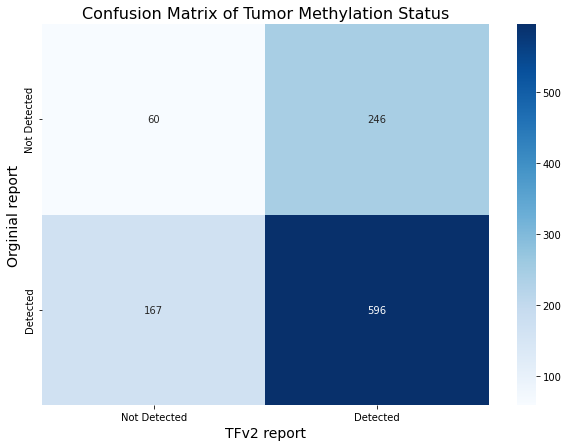

Cohen's Kappa: -0.02


In [63]:
from sklearn.metrics import confusion_matrix, cohen_kappa_score

# Mapping "Detected" to 1 and "Not Detected" to 0, assume NaN remains as NaN
map_status = {"Detected": 1, "Not Detected": 0}

df_sow21_2['Tumor_methylation_status_mapped'] = df_sow21_2['Tumor_methylation_status'].map(map_status)
df_sow21_final['Tumor_methylation_status_mapped'] = df_sow21_final['Tumor_methylation_status'].map(map_status)

# Remove NaN values before creating the confusion matrix
valid_indices = df_sow21_2['Tumor_methylation_status_mapped'].notna() & df_sow21_final['Tumor_methylation_status_mapped'].notna()
y_true = df_sow21_2[valid_indices]['Tumor_methylation_status_mapped'].values
y_pred = df_sow21_final[valid_indices]['Tumor_methylation_status_mapped'].values

# Generating the confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=[0, 1])

# Plotting the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Detected", "Detected"], yticklabels=["Not Detected", "Detected"])
plt.xlabel('TFv2 report', fontsize=14)
plt.ylabel('Orginial report', fontsize=14)
plt.title('Confusion Matrix of Tumor Methylation Status', fontsize=16)
plt.show()

# Calculating and printing Cohen's Kappa
kappa = cohen_kappa_score(y_true, y_pred)
print(f"Cohen's Kappa: {kappa:.2f}")


### CSO score distribution

In [12]:
# CSO score distribution of Daiichi SOW21
# top_8_prd_df = pd.read_csv(f"{work_dir}/top_8_prd_df_07242024.csv", header=0)
top_8_prd_df = pd.read_csv(f"{work_dir}/top_8_prd_df_10142024.csv", header=0) # CSO S3 model

print("Total GHSampleID is " + str(top_8_prd_df.shape[0]) + "\n")
top_8_prd_df.head()

Total GHSampleID is 176966



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank
0,A036876305_240624_A01810_0409_BHFVCKDSXC,-22.730056,CSO_prostate,-17.546123,NaN,A0368763,A036876305,17658-UCSF-AZ039,C1D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TAGGATTAGC,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0368763,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.combined.hdr.tsv,A036876305,Male,Male,prostate,1
1,A036876305_240624_A01810_0409_BHFVCKDSXC,-22.730056,CSO_bladder,-19.595308,NaN,A0368763,A036876305,17658-UCSF-AZ039,C1D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TAGGATTAGC,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0368763,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.combined.hdr.tsv,A036876305,Male,Male,bladder,2
2,A036876305_240624_A01810_0409_BHFVCKDSXC,-22.730056,CSO_pancreatic,-19.822482,NaN,A0368763,A036876305,17658-UCSF-AZ039,C1D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TAGGATTAGC,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0368763,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A036876305.ghcnv_qc.combined.hdr.tsv,A036876305,Male,Male,pancreatic,3
3,A036876305_240624_A01810_0409_BHFVCKDSXC,-22.730056,CSO_lung,-19.852430,NaN,A0368763,A036876305,17658-UCSF-AZ039,C1D1,SUCCESS,NaN,NaN,NaN,NaN,20240708_CollinBlakelyUCSF_IST01_Batch1_47Samples_MonitoringReport.csv,psreedhar,NaN,2024-07-08,CollinBlakelyUCSF,IST01,Other,NaN,NaN,TAGGATTAGC,Male,Research,2024-06-26 22:58:52-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,USF_02,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0368763,cgp,240624_A01810_0409_BHFVCKDSXC,NaN,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305,False,/ghsfa/ivd/flowcentral/240624_A01810_0409_BHFVCKDSXC/A036876305/A03687630

In [17]:
# Merge the data 
top_8_prd_df_new = top_8_prd_df.merge(df_bibp_annotated[["csv_file_name", 'cancerother']], on = 'csv_file_name', how = "left")
print("Total size of the merged data with missing cancer type is " + str(top_8_prd_df.cancerother.isnull().sum()) + "\n") 

# Handle the 'cancerother' duplication issue caused by merging
top_8_prd_df_new['cancerother'] = np.where(top_8_prd_df_new['cancerother_y'].notna(), top_8_prd_df_new['cancerother_y'], top_8_prd_df_new['cancerother_x'])

# Drop the original 'cancerother_x', and 'cancerother_y' columns
top_8_prd_df_new = top_8_prd_df_new.drop(columns=['cancerother_x', 'cancerother_y'])

# Drop nan
print("Total size of the merged data with missing cancer type is " + str(top_8_prd_df_new.cancerother.isnull().sum()) + "\n") 

# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
top_8_prd_df_new['cancerother'] = top_8_prd_df_new.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Update the 'cancerother' column by first checking 'Cancertype' and then 'Conditions'
top_8_prd_df_new['cancerother'] = top_8_prd_df_new.apply(
    lambda row: row['Cancertype'] if pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown' else row['cancerother'],
    axis=1
)

# Further update 'cancerother' by checking 'Conditions'
top_8_prd_df_new['cancerother'] = top_8_prd_df_new.apply(
    lambda row: row['Conditions'] if (pd.isnull(row['cancerother']) or row['cancerother'].lower() == 'unknown') and pd.notnull(row['Conditions']) else row['cancerother'],
    axis=1
)

# Regex patterns for each cancer type
regex_patterns = {
    'breast': r'(?i)\bbreast|DCIS|ductal|infiltrating|Triple\s*Negative|TNBC',
    'prostate': r'(?i)\bprostate|Castration-Resistant|mCRPC',
    'esophageal': r'(?i)\besophagus|esophageal',
    'ovarian': r'(?i)\bovarian|BRCA1|Sertoli-Leydig',
    'lung': r'(?i)\blung|NSCLC|SCLC|ADC|SCC|ALK-expressing|adenosquamous|bronchioloalveolar|mixed subtype|papillary type|invasive|small cell|non[-\s]*small[-\s]*cell',
    'bladder': r'(?i)\bbladder|urothelial|transitional\s*cell',
    'pancreatic': r'(?i)\bpancreas|pancreatic|adenocarcinoma',
    'hepatocellular': r'(?i)\bhepatocellular|cholangiocarcinoma|hepatocholangiocarcinoma|intrahepatic',
    'crc': r'(?i)\bcrc|colorectal|colon|rectal|mucinous|rectum',
    'Head_and_Neck': r'(?i)\bhead\s*and\s*neck|HNSCC|adenocarcinoma\sof\ssalivary\sgland',
    'renal': r'(?i)\brenal|kidney',
    'gastric': r'(?i)\bgastric|stomach',
    'endometrial': r'(?i)\bendometrial|uterine|leiomyosarcoma|endometrium',
    'melanoma': r'(?i)\bmelanoma',
    'Gastrointestinal': r'(?i)\bgastrointestinal|gastrooesophageal|gastroesophageal\sjunction|small\sbowel'
}

# Function to categorize cancer based on regex patterns
def categorize_cancer(text):
    if pd.isnull(text):
        return 'unknown'
    for cancer_type, pattern in regex_patterns.items():
        if re.search(pattern, text):
            return cancer_type
    if re.search(r'(?i)unknown', text):  # Check if 'unknown' is anywhere in the text
        return 'unknown'
    return 'other'  # Assign 'other' if no patterns match and it's not 'unknown'

# Apply the categorization function to the 'cancerother' column
top_8_prd_df_new['new_defined_cancer_type'] = top_8_prd_df_new['cancerother'].apply(categorize_cancer)

# Rename
top_8_prd_df = top_8_prd_df_new.copy()

# Output the results
top_8_prd_df['new_defined_cancer_type'].value_counts()


Total size of the merged data with missing cancer type is 84041

Total size of the merged data with missing cancer type is 22497



breast              40997
lung                28132
endometrial         27201
unknown             25780
other               20405
crc                  8816
prostate             5275
melanoma             4946
bladder              3122
pancreatic           2743
renal                2682
gastric              2430
ovarian              1713
esophageal           1456
hepatocellular       1120
Gastrointestinal       77
Head_and_Neck          71
Name: new_defined_cancer_type, dtype: int64

In [18]:
# For top_8_prd_df, for CSO score distribution analysis 
# target_files = [
#     "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv"
# ]

target_files = [
    "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv",
    # "20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv",
    "20240625_DaiichiSankyoUS_SOW21_Batch2_177Samples_InfinityReport.csv"
]

top_8_prd_df.loc[top_8_prd_df['csv_file_name'].isin(target_files), ['new_defined_cancer_type']] = ["breast"]

# CSO caller limited to 8 CSO predictable cancer types (digestive inlcludes 'crc', 'esophageal', 'gastric'
top_8_prd_df = top_8_prd_df[top_8_prd_df['new_defined_cancer_type'].isin(['lung', 'crc', 'esophageal', 'gastric', "bladder", 'breast', 'prostate', 'pancreatic', 'hepatocellular', 'ovarian'])]
print("Total size of this RUO summary data with known cancer type is " + str(top_8_prd_df.shape[0]) + "\n") 

# Daiichi SOW21 only
top_8_prd_df_sub = top_8_prd_df[top_8_prd_df['csv_file_name'].isin(target_files)]
print("Total size of this Daiichi SOW21 is " + str(top_8_prd_df_sub.shape[0]) + "\n") 
top_8_prd_df_sub.head()

# For later control cohort analysis

# Gilead SOW3
top_8_prd_df_gliead = top_8_prd_df[top_8_prd_df['csv_file_name'].isin(["20221227_GileadSciences_SOW03_750Samples_InfinityReport.csv"])]

# Then, assign treatment information to the "treatment" column for Gilead SOW3 only
top_8_prd_df_gliead.loc[top_8_prd_df_gliead['Visit_name'] == "BSLJ", ['treatment']] = ["Baseline"]
top_8_prd_df_gliead.loc[top_8_prd_df_gliead['Visit_name'].isin(['C2D1J']), ['treatment']] = ["Treatment"]

# Remove EOT samples
top_8_prd_df_gliead = top_8_prd_df_gliead[top_8_prd_df_gliead['treatment'] != 'other']

print("Total size of this Gilead SOW3 is " + str(top_8_prd_df_gliead.shape[0]) + "\n") 

# AZ SOW183
top_8_prd_df_az183 = top_8_prd_df[top_8_prd_df['csv_file_name'].isin(["20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"])]
print("Total size of this AZ SOW183 is " + str(top_8_prd_df_az183.shape[0]) + "\n") 



Total size of this RUO summary data with known cancer type is 95956

Total size of this Daiichi SOW21 is 7030

Total size of this Gilead SOW3 is 2077

Total size of this AZ SOW183 is 6994



In [20]:
# Readin Daiichi SOW21 with S3 MB breast caller report by Jing (S3 MB 98% and TFv2 beta)
# df_daiichi_report_1 = pd.read_csv("/ghsfa/projects/pharma/customers/DaiichiSankyoUS/Infinity/DSI_SOW21_Infinity/DSI_SOW21_Infinity_01/data/report/20240430_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv", header=1)
# df_daiichi_report_2 = pd.read_csv("/ghsfa/projects/pharma/datawarehouse/Infinity/20240625_DaiichiSankyoUS_SOW21_Batch2_177Samples_InfinityReport.csv", header=1)
# df_daiichi_report = pd.concat([df_daiichi_report_1, df_daiichi_report_2])

# TFv2 rule (Breast MB90 and MB18 TFv2 > 0.05%)
df_daiichi_report = pd.read_csv(f"{work_dir}/20241021_DSI_SOW21_1150Samples_TFv2_InfinityReport.csv")


df_daiichi_report_new = df_daiichi_report[df_daiichi_report['Sample_status'] == 'SUCCESS']
df_daiichi_report_final = df_daiichi_report_new.drop_duplicates(subset = "GHSampleID")
print(df_daiichi_report_final.shape)

target_sample_list_negative = df_daiichi_report_final[df_daiichi_report_final['Tumor_methylation_status'] == 'Not Detected']['GHSampleID'].values
print('Total Daiichi SOW21 S3 MB breast negative is ' + str(len(target_sample_list_negative)))

target_sample_list_positive = df_daiichi_report_final[df_daiichi_report_final['Tumor_methylation_status'] == 'Detected']['GHSampleID'].values
print('Total Daiichi SOW21 S3 MB breast positive is ' + str(len(target_sample_list_positive)))

# There are 5 SUCCESS samples but with "Low Diversity Warning; Possible Contamination Warning; Methylation Suppression Warning" in the column "Sample_comment"
all_sample_with_S3_call_result = target_sample_list_negative.tolist() + target_sample_list_positive.tolist()
df_daiichi_report_final_miss = df_daiichi_report_final[~df_daiichi_report_final['GHSampleID'].isin(all_sample_with_S3_call_result)]
print('Total Daiichi SOW21 SUCESS Samples but without S3 MB breast call is ' + str(len(df_daiichi_report_final_miss)))
# print(df_daiichi_report_final_miss.head(2))

# Based on the latest DSI two batch rerun with S3 MB breast caller, remove the sample with "Low Diversity Warning; Possible Contamination Warning; Methylation Suppression Warning" in the column "Sample_comment" as no binary caller result with these samples.
top_8_prd_df_sub = top_8_prd_df_sub[~top_8_prd_df_sub['GHSampleID'].isin(df_daiichi_report_final_miss.GHSampleID.tolist())]

# Add S3 MB Breast caller result back in
top_8_prd_df_sub['S3_MB_Breast_call'] = np.where(top_8_prd_df_sub['GHSampleID'].isin(target_sample_list_positive), True, False)
top_8_prd_df_sub.head()

(1143, 56)
Total Daiichi SOW21 S3 MB breast negative is 248
Total Daiichi SOW21 S3 MB breast positive is 890
Total Daiichi SOW21 SUCESS Samples but without S3 MB breast call is 5


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,S3_MB_Breast_call
31562,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-11.142988,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast,True
31563,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_bladder,-17.764752,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,bladder,2,Breast,True
31564,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_lung,-17.895021,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,lung,3,Breast,True
31565,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_crc,-19.248602,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/

In [21]:
# Save the data
top_8_prd_df_sub.to_csv(f"{work_dir}/top_8_prd_df_sub.csv", index = False)

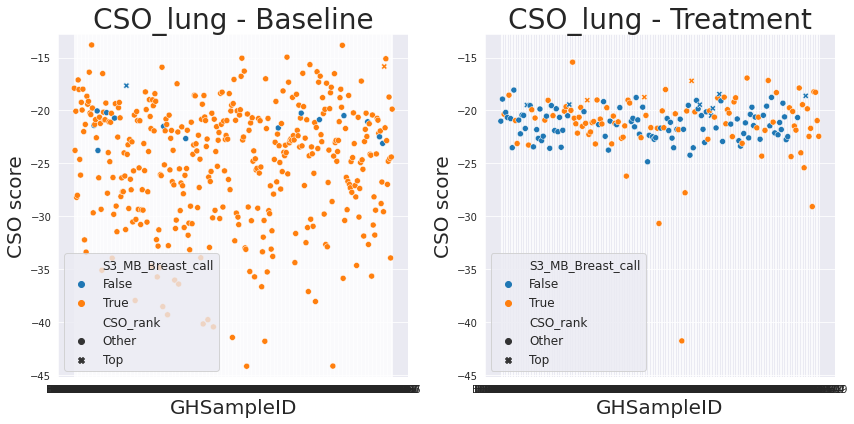

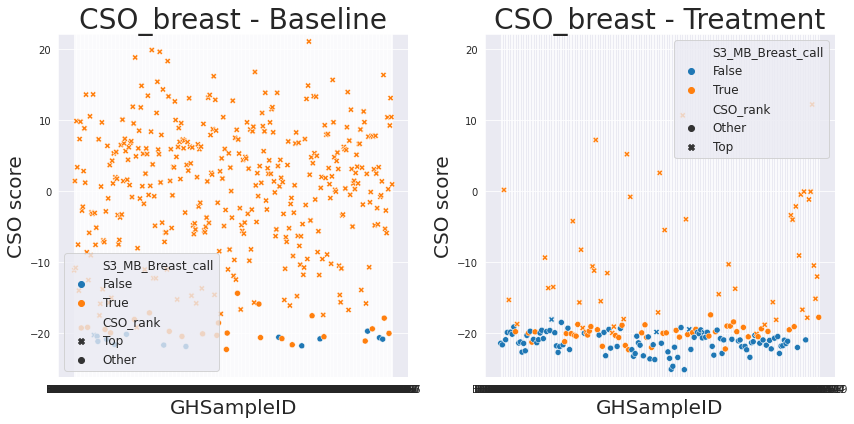

In [40]:
def plot_cso_lung_scores(data, CSO_pred_type):
    sns.set_style('darkgrid')
    # Filter for CSO lung / CSO breast data
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Define subplot structure
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
    
    # Determine common y-axis limits based on overall data
    y_min = min(baseline_data['cso_score'].min(), treatment_data['cso_score'].min()) - 1
    y_max = max(baseline_data['cso_score'].max(), treatment_data['cso_score'].max()) + 1
    
    # Baseline plot 
    sns.scatterplot(x='GHSampleID', y='cso_score', data=baseline_data, hue='S3_MB_Breast_call', 
                    style=baseline_data['CSO_rank'].apply(lambda x: 'Top' if x == 1 else 'Other'), 
                    markers={'Top': 'X', 'Other': 'o'}, ax=axs[0])
    axs[0].set_title(f'{CSO_pred_type} - Baseline', fontsize = 28)
    axs[0].set_ylim([y_min, y_max])
    axs[0].set_ylabel('CSO score', fontsize=20)
    axs[0].set_xlabel('GHSampleID', fontsize=20)
    axs[0].legend(fontsize=12)

    # Treatment plot
    sns.scatterplot(x='GHSampleID', y='cso_score', data=treatment_data, hue='S3_MB_Breast_call', 
                    style=treatment_data['CSO_rank'].apply(lambda x: 'Top' if x == 1 else 'Other'), 
                    markers={'Top': 'X', 'Other': 'o'}, ax=axs[1])
    axs[1].set_title(f'{CSO_pred_type} - Treatment', fontsize = 28)
    axs[1].set_ylim([y_min, y_max])
    axs[1].set_ylabel('CSO score', fontsize=20)
    axs[1].set_xlabel('GHSampleID', fontsize=20)
    axs[1].legend(fontsize=12)

    plt.tight_layout()
    plt.show()

plot_cso_lung_scores(top_8_prd_df_sub, 'CSO_lung')
plot_cso_lung_scores(top_8_prd_df_sub, 'CSO_breast')



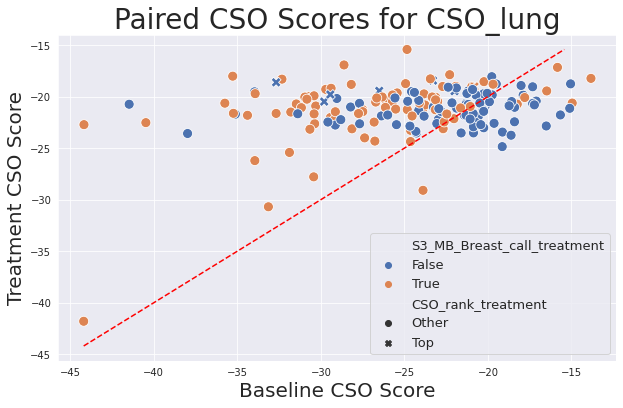

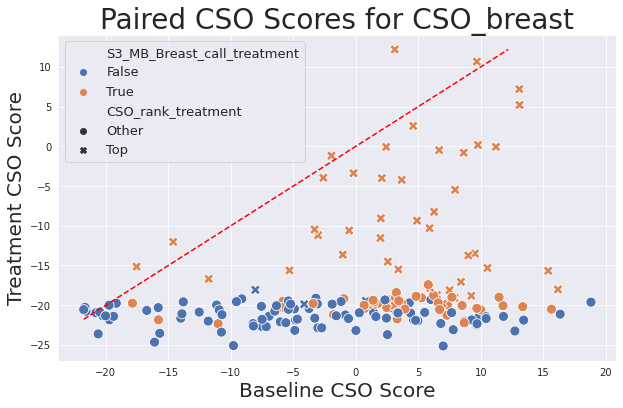

In [70]:
def plot_and_compare_paired_cso_scores(data, CSO_pred_type):
    sns.set_style('darkgrid')
    # Filter data for specific CSO type and treatments
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Merge data ensuring only patients with both records are included
    paired_data = pd.merge(baseline_data, treatment_data, on='Patient_ID', suffixes=('_baseline', '_treatment'))

    # Convert CSO scores to numeric and check for NaNs
    paired_data['cso_score_baseline'] = pd.to_numeric(paired_data['cso_score_baseline'], errors='coerce')
    paired_data['cso_score_treatment'] = pd.to_numeric(paired_data['cso_score_treatment'], errors='coerce')
    paired_data.dropna(subset=['cso_score_baseline', 'cso_score_treatment'], inplace=True)

    # Define the plot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='cso_score_baseline', y='cso_score_treatment', data=paired_data, 
                    hue='S3_MB_Breast_call_treatment', style=paired_data['CSO_rank_treatment'].apply(lambda x: 'Top' if x == 1 else 'Other'), 
                    markers={'Top': 'X', 'Other': 'o'}, palette='deep', s=100)

    # Add the x=y line for reference
    plt.plot([paired_data['cso_score_baseline'].min(), paired_data['cso_score_treatment'].max()], 
             [paired_data['cso_score_baseline'].min(), paired_data['cso_score_treatment'].max()], 'r--')
    
    plt.title(f'Paired CSO Scores for {CSO_pred_type}', fontsize = 28)
    plt.xlabel('Baseline CSO Score', fontsize = 20)
    plt.ylabel('Treatment CSO Score', fontsize = 20)
    # plt.legend(title='Pancancer Call / CSO Rank', fontsize = 15)
    plt.legend(fontsize = 13)

    plt.grid(True)
    plt.show()

plot_and_compare_paired_cso_scores(top_8_prd_df_sub, 'CSO_lung')
plot_and_compare_paired_cso_scores(top_8_prd_df_sub, 'CSO_breast')



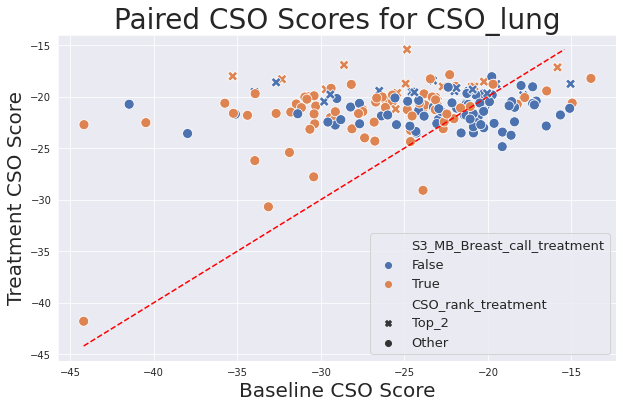

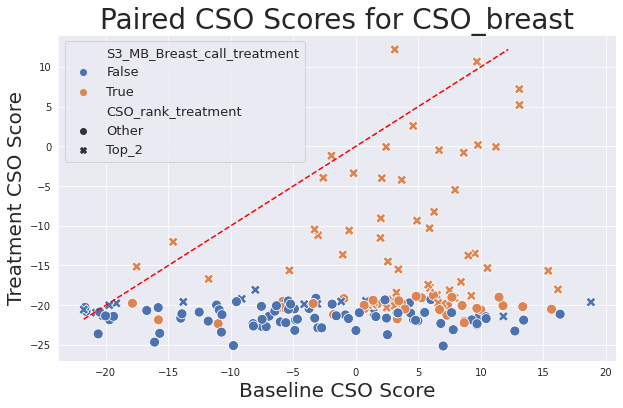

In [71]:
def plot_and_compare_paired_cso_scores_top2(data, CSO_pred_type):
    sns.set_style('darkgrid')
    # Filter data for specific CSO type and treatments
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Merge data ensuring only patients with both records are included
    paired_data = pd.merge(baseline_data, treatment_data, on='Patient_ID', suffixes=('_baseline', '_treatment'))

    # Convert CSO scores to numeric and check for NaNs
    paired_data['cso_score_baseline'] = pd.to_numeric(paired_data['cso_score_baseline'], errors='coerce')
    paired_data['cso_score_treatment'] = pd.to_numeric(paired_data['cso_score_treatment'], errors='coerce')
    paired_data.dropna(subset=['cso_score_baseline', 'cso_score_treatment'], inplace=True)

    # Define the plot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='cso_score_baseline', y='cso_score_treatment', data=paired_data, 
                    hue='S3_MB_Breast_call_treatment', style=paired_data['CSO_rank_treatment'].apply(lambda x: 'Top_2' if x <= 2 else 'Other'), 
                    markers={'Top_2': 'X', 'Other': 'o'}, palette='deep', s=100)

    # Add the x=y line for reference
    plt.plot([paired_data['cso_score_baseline'].min(), paired_data['cso_score_treatment'].max()], 
             [paired_data['cso_score_baseline'].min(), paired_data['cso_score_treatment'].max()], 'r--')
    
    plt.title(f'Paired CSO Scores for {CSO_pred_type}', fontsize = 28)
    plt.xlabel('Baseline CSO Score', fontsize = 20)
    plt.ylabel('Treatment CSO Score', fontsize = 20)
    # plt.legend(title='Pancancer Call / CSO Rank', fontsize = 15)
    plt.legend(fontsize = 13)

    plt.grid(True)
    plt.show()

plot_and_compare_paired_cso_scores_top2(top_8_prd_df_sub, 'CSO_lung')
plot_and_compare_paired_cso_scores_top2(top_8_prd_df_sub, 'CSO_breast')



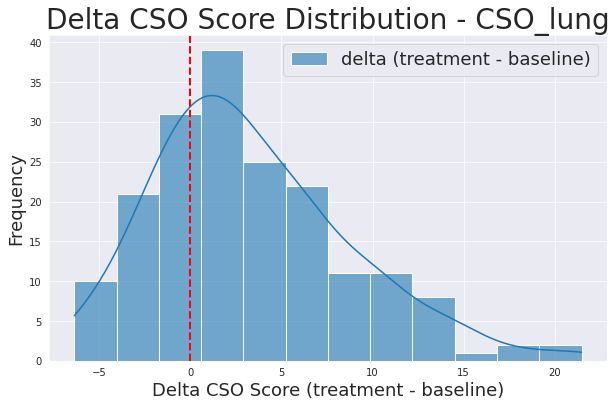

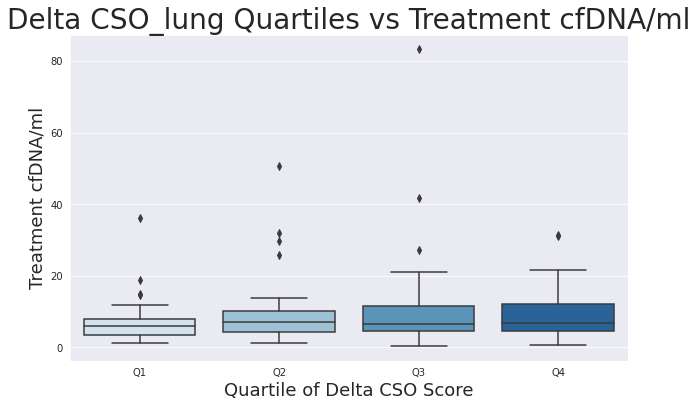

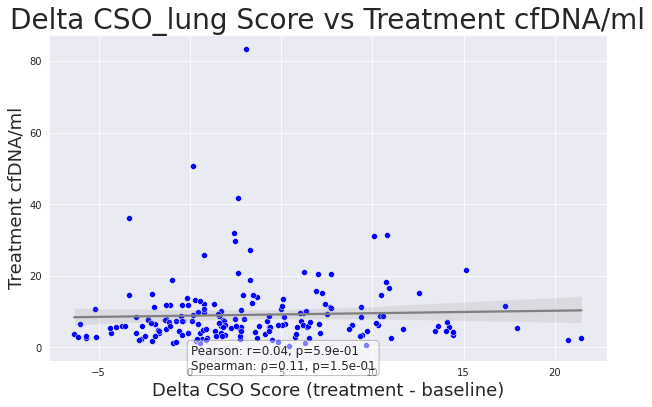

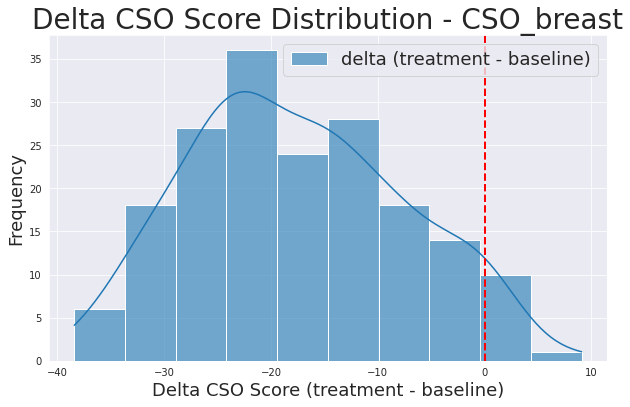

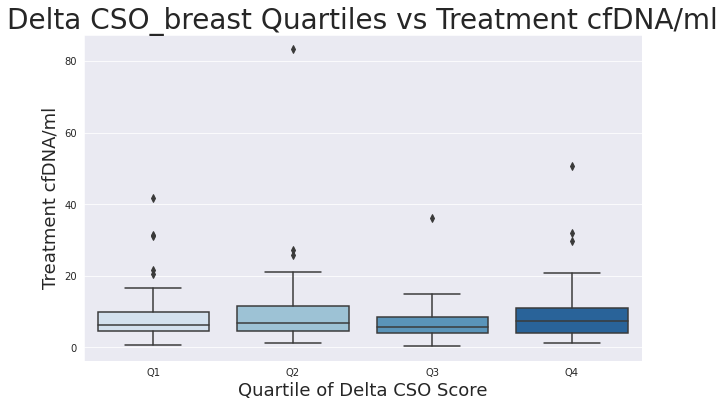

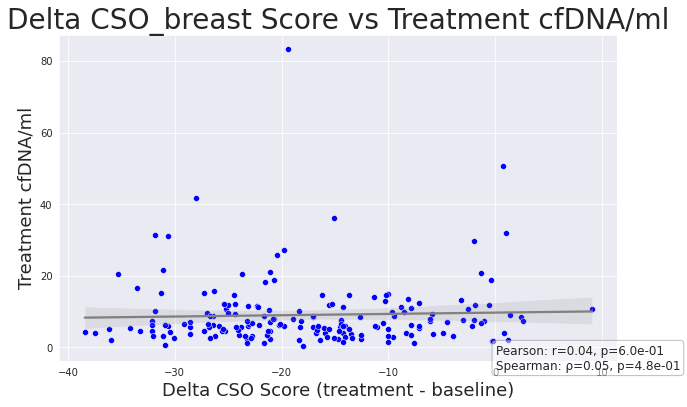

In [79]:
def plot_and_compare_paired_cso_scores_delta(data, CSO_pred_type):
    data = data.copy()

    sns.set_style('darkgrid')
    
    # Filter data for specific CSO type and treatments
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Merge data ensuring only patients with both records are included
    paired_data = pd.merge(baseline_data, treatment_data, on='Patient_ID', suffixes=('_baseline', '_treatment'))

    # Convert CSO scores to numeric and check for NaNs
    paired_data['cso_score_baseline'] = pd.to_numeric(paired_data['cso_score_baseline'], errors='coerce')
    paired_data['cso_score_treatment'] = pd.to_numeric(paired_data['cso_score_treatment'], errors='coerce')
    paired_data.dropna(subset=['cso_score_baseline', 'cso_score_treatment'], inplace=True)

    # Get the delta score
    paired_data['delta_' + str(CSO_pred_type)] = paired_data['cso_score_treatment'] - paired_data['cso_score_baseline']
    plot_paired_data_cso = paired_data['delta_' + str(CSO_pred_type)]

    # Get the delta cfDNA
    paired_data['cfDNA/ml_treatment'] = (paired_data['cfDNA_ng_treatment'] / paired_data['Plasma_ml_input_treatment'])

    # Plot delta CSO distribution (Histplot)
    plt.figure(figsize=(10, 6))
    sns.histplot(plot_paired_data_cso, kde=True, label='delta (treatment - baseline)', alpha=0.6)
    plt.xlabel('Delta CSO Score (treatment - baseline)', fontsize = 18)
    plt.ylabel('Frequency', fontsize = 18)
    plt.title(f'Delta CSO Score Distribution - {CSO_pred_type}', fontsize = 28)
    plt.legend(loc='upper right', fontsize = 18)

    # Add vertical red dashed line at x=0
    plt.axvline(x=0, color='red', linestyle='--', linewidth=2)

    # **Quartile Calculation and Boxplot instead of Scatter Plot**
    # Divide the data into quartiles based on delta CSO score
    paired_data['quartile'] = pd.qcut(paired_data['delta_' + str(CSO_pred_type)], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
    
    # Boxplot of cfDNA/ml stratified by the quartiles of delta CSO score
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='quartile', y='cfDNA/ml_treatment', data=paired_data, palette='Blues')
    
    plt.xlabel('Quartile of Delta CSO Score', fontsize=18)
    plt.ylabel('Treatment cfDNA/ml', fontsize=18)
    plt.title(f'Delta {CSO_pred_type} Quartiles vs Treatment cfDNA/ml', fontsize=28)

    # # Optionally add jittered points on the boxplot for more visualization
    # sns.stripplot(x='quartile', y='cfDNA/ml_treatment', data=paired_data, color='black', size=5, jitter=True, alpha=0.5)

    plt.show()

    # Calculate the Pearson and Spearman correlations
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(paired_data['delta_' + str(CSO_pred_type)].dropna(), paired_data['cfDNA/ml_treatment'].dropna())
    spearman_corr, spearman_p_val = scipy.stats.spearmanr(paired_data['delta_' + str(CSO_pred_type)].dropna(), paired_data['cfDNA/ml_treatment'].dropna())

    # Plot delta CSO vs cfDNA/ml with regression line (Scatter Plot)
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=paired_data, x=('delta_' + str(CSO_pred_type)), y="cfDNA/ml_treatment", color='blue')
    sns.regplot(data=paired_data, x=('delta_' + str(CSO_pred_type)), y="cfDNA/ml_treatment", scatter=False, color="gray")
    plt.xlabel('Delta CSO Score (treatment - baseline)', fontsize=18)
    plt.ylabel('Treatment cfDNA/ml', fontsize=18)
    plt.title(f'Delta {CSO_pred_type} Score vs Treatment cfDNA/ml', fontsize=28)
    
    # Annotate correlation results on the plot
    plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
             ha='left', va='top', fontsize=12, bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))
    
    plt.show()

    return paired_data

paired_data_daichii_lung = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_sub, 'CSO_lung')
paired_data_daichii_breast = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_sub, 'CSO_breast')



In [29]:
paired_data_daichii_lung_neg = paired_data_daichii_lung[paired_data_daichii_lung['S3_MB_Breast_call_treatment'] == False]
paired_data_daichii_lung_neg.shape

(96, 121)

In [31]:
paired_data_daichii_lung_neg_test = paired_data_daichii_lung_neg[(paired_data_daichii_lung_neg['cso_prediction_treatment'] == 'lung') & (paired_data_daichii_lung_neg['CSO_rank_treatment'] == 1)]
paired_data_daichii_lung_neg_test.shape

(7, 121)

In [89]:
# Check outliers
paired_data_daichii_lung_outlier = paired_data_daichii_lung[(paired_data_daichii_lung['cso_score_baseline'] < -37) & (paired_data_daichii_lung['cso_score_treatment'] > -25)]
paired_data_daichii_lung_outlier.head()

,unique_sample_id_baseline,Pancancer_baseline,cso_model_type_baseline,cso_score_baseline,Study_ID_baseline,GHRequestID_baseline,GHSampleID_baseline,Patient_ID,Visit_name_baseline,Sample_status_baseline,Sample_comment_baseline,cfDNA_ng_baseline,Plasma_ml_input_baseline,Cancertype_baseline,csv_file_name_baseline,file_creator_baseline,Max_percentage_baseline,report_date_baseline,Account_baseline,SOW_num_baseline,cancer_category_baseline,cancerstage_baseline,cancertype_baseline,sample_index_baseline,gender_baseline,sample_type_baseline,timestamp_baseline,panel_baseline,control_lot_baseline,bip_version_baseline,git_version_baseline,run_mode_baseline,product_baseline,project_baseline,cancer_type_baseline,patient_age_baseline,parameter_set_baseline,lunar_caller_baseline,comment_baseline,provided_tumor_type_baseline,request_id_baseline,use_case_baseline,runid_baseline,fc_dir_baseline,Other ID_baseline,Conditions_baseline,Sponsor_baseline,new_defined_cancer_type_baseline,treatment_baseline,mbd_dir_baseline,Pancancer_call_baseline,primary_cnv_qc_file_path_baseline,alternative_cnv_qc_file_path_baseline,run_sample_id_baseline,predicted_sex_baseline,provided_sex_baseline,cso_prediction_baseline,CSO_rank_baseline,cancerother_baseline,S3_MB_Breast_call_baseline,unique_sample_id_treatment,Pancancer_treatment,cso_model_type_treatment,cso_score_treatment,Study_ID_treatment,GHRequestID_treatment,GHSampleID_treatment,Visit_name_treatment,Sample_status_treatment,Sample_comment_treatment,cfDNA_ng_treatment,Plasma_ml_input_treatment,Cancertype_treatment,csv_file_name_treatment,file_creator_treatment,Max_percentage_treatment,report_date_treatment,Account_treatment,SOW_num_treatment,cancer_category_treatment,cancerstage_treatment,cancertype_treatment,sample_index_treatment,gender_treatment,sample_type_treatment,timestamp_treatment,panel_treatment,control_lot_treatment,bip_version_treatment,git_version_treatment,run_mode_treatment,product_treatment,project_treatment,cancer_type_treatment,patient_age_treatment,parameter_set_treatment,lunar_caller_treatment,comment_treatment,provided_tumor_type_treatment,request_id_treatment,use_case_treatment,runid_treatment,fc_dir_treatment,Other ID_treatment,Conditions_treatment,Sponsor_treatment,new_defined_cancer_type_treatment,treatment_treatment,mbd_dir_treatment,Pancancer_call_treatment,primary_cnv_qc_file_path_treatment,alternative_cnv_qc_file_path_treatment,run_sample_id_treatment,predicted_sex_treatment,provided_sex_treatment,cso_prediction_treatment,CSO_rank_treatment,cancerother_treatment,S3_MB_Breast_call_treatment,delta_CSO_lung,cfDNA/ml_treatment,quartile
33,B00472190_230823_A01907_0131_BH7GGHDSX7,11.267768,CSO_lung,-37.979261,DS8201-A-U302,A0808449,B00472190,39272003,C1D1,SUCCESS,NaN,15.288,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,13.47,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,CTACTTTGCG,Female,Research,2023-08-25 20:51:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0808449,cgp,230823_A01907_0131_BH7GGHDSX7,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230823_A01907_0131_BH7GGHDSX7.874936aa-3327-4912-b12a-6abf5ce0a794.20230825135050,True,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7/B00472190/B00472190.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7/B00472190/B00472190.ghcnv_qc.combined.hdr.tsv,B00472190,Female,Female,lung,7,Breast,True,B00472197_230823_A01907_0131_BH7GGHDSX7,-22.263166,CSO_lung,-23.581389,DS8201-A-U302,A0808451,B00472197,C04D1,SUCCESS,NaN,12.636,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,11.32,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,GCGCAGAAGC,Female,Research,2023-08-25 20:51:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A08

In [90]:
top_8_prd_df_sub_B00472197 = top_8_prd_df_sub[top_8_prd_df_sub['GHSampleID'] == 'B00472197']
top_8_prd_df_sub_B00472197

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,S3_MB_Breast_call
35280,B00472197_230823_A01907_0131_BH7GGHDSX7,-22.263166,CSO_ovarian,-19.105303,DS8201-A-U302,A0808451,B00472197,39272003,C04D1,SUCCESS,NaN,12.636,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,11.32,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,GCGCAGAAGC,Female,Research,2023-08-25 20:51:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0808451,cgp,230823_A01907_0131_BH7GGHDSX7,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230823_A01907_0131_BH7GGHDSX7.874936aa-3327-4912-b12a-6abf5ce0a794.20230825135050,False,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7/B00472197/B00472197.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7/B00472197/B00472197.ghcnv_qc.combined.hdr.tsv,B00472197,Female,Female,ovarian,1,Breast,False
35281,B00472197_230823_A01907_0131_BH7GGHDSX7,-22.263166,CSO_breast,-19.618745,DS8201-A-U302,A0808451,B00472197,39272003,C04D1,SUCCESS,NaN,12.636,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,11.32,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,GCGCAGAAGC,Female,Research,2023-08-25 20:51:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0808451,cgp,230823_A01907_0131_BH7GGHDSX7,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230823_A01907_0131_BH7GGHDSX7.874936aa-3327-4912-b12a-6abf5ce0a794.20230825135050,False,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7/B00472197/B00472197.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7/B00472197/B00472197.ghcnv_qc.combined.hdr.tsv,B00472197,Female,Female,breast,2,Breast,False
35282,B00472197_230823_A01907_0131_BH7GGHDSX7,-22.263166,CSO_esophageal,-19.844247,DS8201-A-U302,A0808451,B00472197,39272003,C04D1,SUCCESS,NaN,12.636,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,11.32,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,GCGCAGAAGC,Female,Research,2023-08-25 20:51:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0808451,cgp,230823_A01907_0131_BH7GGHDSX7,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230823_A01907_0131_BH7GGHDSX7.874936aa-3327-4912-b12a-6abf5ce0a794.20230825135050,False,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7/B00472197/B00472197.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230823_A01907_0131_BH7GGHDSX7/B00472197/B00472197.ghcnv_qc.combined.hdr.tsv,B00472197,Female,Female,digestive,3,Breast,False
35283,B00472197_230823_A01907_0131_BH7GGHDSX7,-22.263166,CSO_bladder,-20.226486,DS8201-A-U302,A0808451,B00472197,39272003,C04D1,SUCCESS,NaN,12.636,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,11.32,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,GCGCAGAAGC,Female,Research,2023-08-25 20:51:45-07:00,Sirius_v1.0,

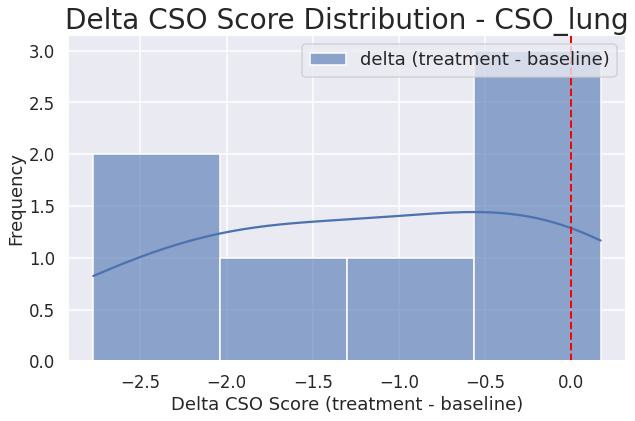

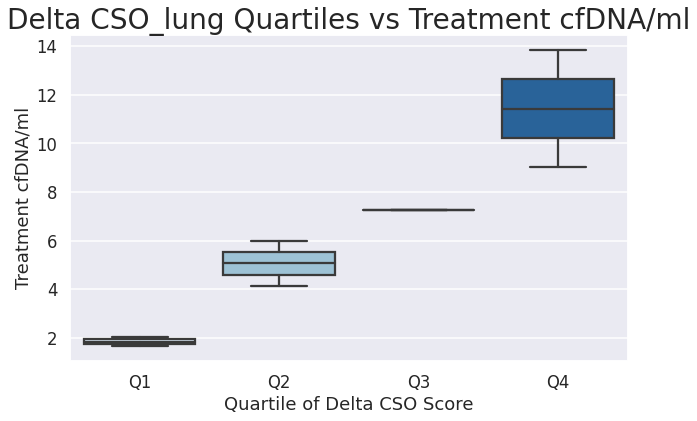

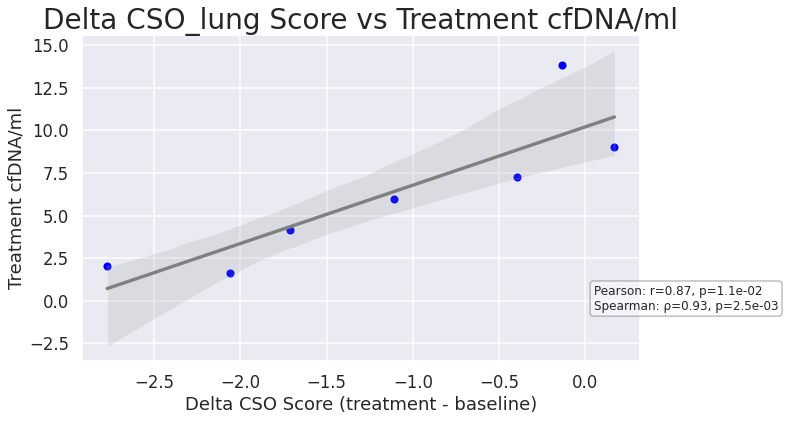

In [48]:
# Plot the delta CSO lung vs cfDNA only for S3 MB negative paried samples
neg_ids = top_prd_df_sub_4.GHSampleID.unique()
top_8_prd_df_sub_neg = top_8_prd_df_sub[top_8_prd_df_sub['GHSampleID'].isin(neg_ids)]

# plot the result
paired_data_daichii_lung_neg = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_sub_neg, 'CSO_lung')


In [73]:
paired_data_daichii_lung_top2 = paired_data_daichii_lung[paired_data_daichii_lung['CSO_rank_treatment'] <= 2]
paired_data_daichii_lung_top2.shape

(31, 122)

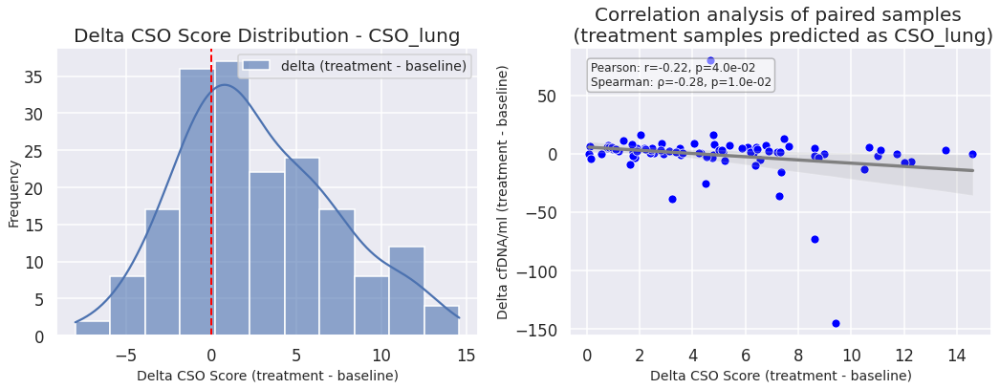

In [248]:
def plot_and_compare_paired_cso_scores_delta(data, CSO_pred_type):
    data = data.copy()

    sns.set_style('darkgrid')
    # Filter data for specific CSO type and treatments
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Merge data ensuring only patients with both records are included
    paired_data = pd.merge(baseline_data, treatment_data, on='Patient_ID', suffixes=('_baseline', '_treatment'))

    # Convert CSO scores to numeric and check for NaNs
    paired_data['cso_score_baseline'] = pd.to_numeric(paired_data['cso_score_baseline'], errors='coerce')
    paired_data['cso_score_treatment'] = pd.to_numeric(paired_data['cso_score_treatment'], errors='coerce')
    paired_data.dropna(subset=['cso_score_baseline', 'cso_score_treatment'], inplace=True)

    # Get the delta score
    paired_data['delta_' + str(CSO_pred_type)] = paired_data['cso_score_treatment'] - paired_data['cso_score_baseline']
    
    # Get the delta cfDNA
    paired_data['delta_cfDNA/ml'] = (paired_data['cfDNA_ng_treatment'] / paired_data['Plasma_ml_input_treatment']) - (paired_data['cfDNA_ng_baseline'] / paired_data['Plasma_ml_input_baseline'])

    # Setup plots
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Plot delta CSO distribution
    sns.histplot(paired_data['delta_' + str(CSO_pred_type)], kde=True, label='delta (treatment - baseline)', alpha=0.6, ax=axes[0])
    axes[0].set_xlabel('Delta CSO Score (treatment - baseline)', fontsize=14)
    axes[0].set_ylabel('Frequency', fontsize=14)
    axes[0].set_title(f'Delta CSO Score Distribution - {CSO_pred_type}', fontsize=20)
    axes[0].legend(fontsize=14)
    axes[0].axvline(x=0, color='red', linestyle='--', linewidth=2)

    # Prepare data for scatter plot
    paired_data_treatment_top = paired_data[(paired_data['CSO_rank_treatment'] == 1) & (paired_data['delta_' + str(CSO_pred_type)] > 0)]

    # Calculate the Pearson and Spearman correlations
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(paired_data_treatment_top['delta_' + str(CSO_pred_type)].dropna(), paired_data_treatment_top['delta_cfDNA/ml'].dropna())
    spearman_corr, spearman_p_val = scipy.stats.spearmanr(paired_data_treatment_top['delta_' + str(CSO_pred_type)].dropna(), paired_data_treatment_top['delta_cfDNA/ml'].dropna())

    # Plot delta CSO vs delta cfDNA yield of top ranking samples
    sns.scatterplot(data=paired_data_treatment_top, x=('delta_' + str(CSO_pred_type)), y="delta_cfDNA/ml", ax=axes[1], color='blue')
    sns.regplot(data=paired_data_treatment_top, x=('delta_' + str(CSO_pred_type)), y="delta_cfDNA/ml", ax=axes[1], scatter=False, color="gray")
    axes[1].set_xlabel('Delta CSO Score (treatment - baseline)', fontsize=14)
    axes[1].set_ylabel('Delta cfDNA/ml (treatment - baseline)', fontsize=14)
    axes[1].set_title(f'Correlation analysis of paired samples \n (treatment samples predicted as {CSO_pred_type})', fontsize=20)

    # Annotate correlation results on the second plot
    axes[1].text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
                 ha='left', va='top', transform=axes[1].transAxes, fontsize=12, bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()

    return paired_data

# Usage of the function
paired_data_daichii_lung = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_sub, 'CSO_lung')

# # For CSO breast samples, the error is due to no paired samples
# paired_data_daichii_breast = plot_and_compare_paired_cso_scores_delta(top_8_prd_df_sub, 'CSO_breast')


In [305]:
# Compare the cfDNA straifitied by CSO delta for Daiichi SOW21
# Lung
paired_data_daichii_lung["cso_lung_score_increased"] = np.where(paired_data_daichii_lung["delta_CSO_lung"] >= 0, 'cso_lung_score_increased', "cso_lung_score_decreased")

# # Optional: select for'CSO_rank_treatment'] == 1
# paired_data_daichii_lung = paired_data_daichii_lung[(paired_data_daichii_lung['CSO_rank_treatment'] == 1) & (paired_data_daichii_lung['cso_prediction_treatment'] == "lung")]

list_1 = paired_data_daichii_lung.GHSampleID_baseline.tolist()
list_2 = paired_data_daichii_lung.GHSampleID_treatment.tolist()
list_all = list_1 + list_2
print(len(list_all))

df_paired_daiichi_lung_delta = top_prd_df[top_prd_df['GHSampleID'].isin(list_all)]
df_paired_daiichi_lung_delta_plot = df_paired_daiichi_lung_delta.merge(paired_data_daichii_lung[['Patient_ID', 'cso_lung_score_increased']], on = "Patient_ID", how = 'left')


# select for treatment sample of the paired data
df_paired_daiichi_lung_delta_plot = df_paired_daiichi_lung_delta_plot[df_paired_daiichi_lung_delta_plot['treatment'] == 'Treatment']
print(df_paired_daiichi_lung_delta_plot.shape)

# Select for pancancer caller negative samples
df_paired_daiichi_lung_delta_plot = df_paired_daiichi_lung_delta_plot[df_paired_daiichi_lung_delta_plot['Pancancer_call'] == False]
print(df_paired_daiichi_lung_delta_plot.shape)

# Breast
paired_data_daichii_breast["cso_breast_score_increased"] = np.where(paired_data_daichii_breast["delta_CSO_breast"] >= 0, 'cso_breast_score_increased', "cso_breast_score_decreased")
# Optional: select for'CSO_rank_treatment'] == 1
# paired_data_daichii_breast = paired_data_daichii_breast[(paired_data_daichii_breast['CSO_rank_treatment'] == 1) & (paired_data_daichii_breast['cso_prediction_treatment'] == "breast")]

list_1 = paired_data_daichii_breast.GHSampleID_baseline.tolist()
list_2 = paired_data_daichii_breast.GHSampleID_treatment.tolist()
list_all_breast = list_1 + list_2
print(len(list_all_breast))

df_paired_daiichi_breast_delta = top_prd_df[top_prd_df['GHSampleID'].isin(list_all_breast)]
df_paired_daiichi_breast_delta_plot = df_paired_daiichi_breast_delta.merge(paired_data_daichii_breast[['Patient_ID', 'cso_breast_score_increased']], on = "Patient_ID", how = 'left')

# select for treatment sample of the paired data
df_paired_daiichi_breast_delta_plot = df_paired_daiichi_breast_delta_plot[df_paired_daiichi_breast_delta_plot['treatment'] == 'Treatment']
print(df_paired_daiichi_breast_delta_plot.shape)

# select for treatment sample of the paired data
df_paired_daiichi_breast_delta_plot = df_paired_daiichi_breast_delta_plot[df_paired_daiichi_breast_delta_plot['Pancancer_call'] == False]
df_paired_daiichi_breast_delta_plot.shape

366
(183, 60)
(152, 60)
364
(182, 60)


(151, 60)

In [23]:
from statannotations.Annotator import Annotator

def cfDNA_deta_plot(df, column_name, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    if column_name == "cso_lung_score_increased":
        hue_order = ['cso_lung_score_decreased', 'cso_lung_score_increased']
        default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
        color_map = {cat: col for cat, col in zip(hue_order, default_colors)}
        sns.boxplot(data=df, x=column_name, y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    else:
        hue_order = df[column_name].unique().tolist()
        sns.boxplot(data=df, x=column_name, y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")


    # # Order based on the 'CSO_Lung_Sample' categories
    # hue_order = df[column_name].unique().tolist()

    # Create boxplot and stripplot without using csv_file_name
    # sns.boxplot(data=df, x=column_name, y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    sns.stripplot(data=df, x=column_name, y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby(column_name):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min(), f'n = {n}', ha='center', va='bottom', fontsize=30, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x=column_name, y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize = 50)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample Types', fontsize=30)
    ax.set_ylabel('cfDNA ng/ml', fontsize=30)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=25)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=25)


    plt.show()


cfDNA_deta_plot(df_paired_daiichi_lung_delta_plot, "cso_lung_score_increased", 'cfDNA yield by CSO lung score delta stratification')
cfDNA_deta_plot(df_paired_daiichi_breast_delta_plot, "cso_breast_score_increased", 'cfDNA yield by CSO breast score delta stratification')


NameError: name 'df_paired_daiichi_lung_delta_plot' is not defined

In [ ]:
cfDNA_deta_plot(df_paired_gilead_lung_delta_plot, "cso_lung_score_increased", 'cfDNA yield by CSO lung score delta stratification')
cfDNA_deta_plot(df_paired_gilead_breast_delta_plot, "cso_breast_score_increased", 'cfDNA yield by CSO breast score delta stratification')

#### Identify PatientID from DSI SOW21 that cso_breast score goes down but cso_lung goes up as time goes by. As they are potential ILD samples suggestion by Matthew.

In [52]:
# Readin DSI SOW21 samples
top_8_prd_df_sub = pd.read_csv(f"{work_dir}/top_8_prd_df_sub.csv")
top_8_prd_df_sub.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,S3_MB_Breast_call
0,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-11.142988,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast,True
1,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_bladder,-17.764752,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,bladder,2,Breast,True
2,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_lung,-17.895021,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,lung,3,Breast,True
3,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_crc,-19.248602,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/

In [50]:
# Rename the Visit name
top_8_prd_df_updated.loc[top_8_prd_df_updated['Visit_name'] == "C04D1", 'Visit_name'] = "C4D1"
top_8_prd_df_updated.Visit_name.value_counts()

C1D1    3223
EOT     2200
C4D1    1567
Name: Visit_name, dtype: int64

In [51]:
# Identify Patient_IDs with more than one unique Visit_name
visit_counts = top_8_prd_df_updated.groupby("Patient_ID")["Visit_name"].nunique()

# Filter for Patient_IDs that have more than one visit
valid_patient_ids = visit_counts[visit_counts > 1].index

# Further filter to only include Patient_IDs that have C1D1 as one of the visit timepoints
valid_patient_ids_with_c1d1 = top_8_prd_df_updated[
    (top_8_prd_df_updated["Patient_ID"].isin(valid_patient_ids)) &
    (top_8_prd_df_updated["Visit_name"] == "C1D1")
]["Patient_ID"].unique()

# Apply the final filter to the dataframe
df_dsi_more_than_one_visit = top_8_prd_df_updated[top_8_prd_df_updated["Patient_ID"].isin(valid_patient_ids_with_c1d1)]
df_dsi_more_than_one_visit.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,S3_MB_Breast_call
31562,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-11.142988,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast,True
31563,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_bladder,-17.764752,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,bladder,2,Breast,True
31564,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_lung,-17.895021,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,lung,3,Breast,True
31565,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_crc,-19.248602,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/

In [54]:
# Select PatientID whose CSO_breast is decreasing but CSO_lung is increasing as time goes by

# Define a function to check if values are decreasing
def is_decreasing(values):
    return all(x > y for x, y in zip(values, values[1:]))

# Define a function to check if values are increasing
def is_increasing(values):
    return all(x < y for x, y in zip(values, values[1:]))

# Initialize an empty list to store valid Patient_IDs
valid_patient_ids = []

# Group by Patient_ID and process each group
for patient_id, group in df_dsi_more_than_one_visit.groupby("Patient_ID"):
    # Sort the group by Visit_name in chronological order (C1D1 < C4D1 < EOT)
    group = group.sort_values(by="Visit_name", key=lambda x: x.map({"C1D1": 1, "C4D1": 2, "EOT": 3}))
    
    # Check the conditions for CSO_breast and CSO_lung
    cso_breast_scores = group[group["cso_model_type"] == "CSO_breast"]["cso_score"].values
    cso_lung_scores = group[group["cso_model_type"] == "CSO_lung"]["cso_score"].values
    
    if is_decreasing(cso_breast_scores) and is_increasing(cso_lung_scores):
        valid_patient_ids.append(patient_id)

# Filter the dataframe for rows with valid Patient_IDs
df_dsi_breastDown_lungUP = df_dsi_more_than_one_visit[df_dsi_more_than_one_visit["Patient_ID"].isin(valid_patient_ids)]
print(df_dsi_breastDown_lungUP.Patient_ID.nunique())
df_dsi_breastDown_lungUP.head()


129


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,S3_MB_Breast_call
31586,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_breast,9.851840,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.combined.hdr.tsv,B00460893,Female,Female,breast,1,Breast,True
31587,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_bladder,-16.894634,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.combined.hdr.tsv,B00460893,Female,Female,bladder,2,Breast,True
31588,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_esophageal,-21.709652,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.combined.hdr.tsv,B00460893,Female,Female,digestive,3,Breast,True
31589,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_hepatocellular,-22.572675,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,

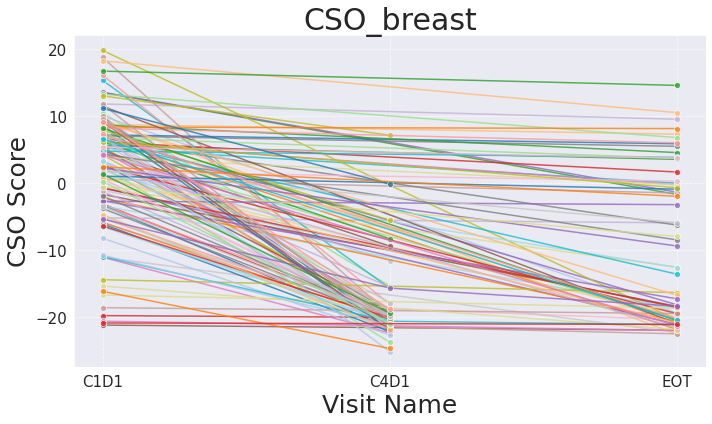

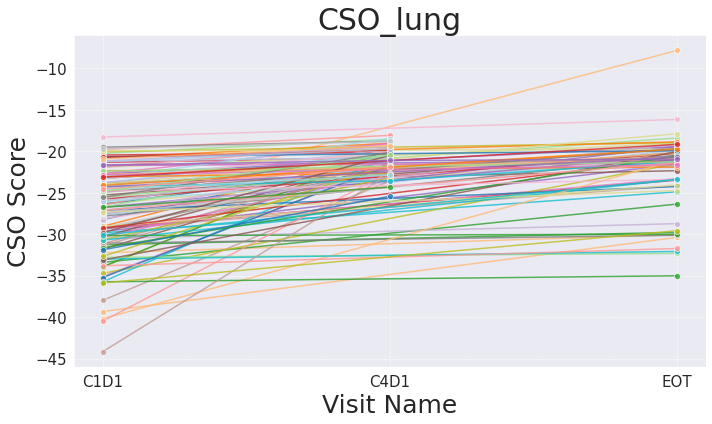

In [70]:
# Function to plot the data
def plot_cso_scores(df, cso_type, title):
    # Filter the dataframe for the specific CSO model type
    df_cso = df[df["cso_model_type"] == cso_type]

    # Create a line plot
    plt.figure(figsize=(10, 6))
    sns.lineplot(
        data=df_cso,
        x="Visit_name",
        y="cso_score",
        hue="Patient_ID",
        marker="o",
        palette="tab20",
        legend=None,  # Suppress legend to reduce clutter
        alpha=0.8
    )

    # Set plot labels and title
    plt.title(f"{title}", fontsize=30)
    plt.xlabel("Visit Name", fontsize=25)
    plt.ylabel("CSO Score", fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.grid(True, linestyle="--", alpha=0.7)
    plt.tight_layout()
    plt.show()

# Plot for CSO_breast
plot_cso_scores(df_dsi_breastDown_lungUP, "CSO_breast", "CSO_breast")

# Plot for CSO_lung
plot_cso_scores(df_dsi_breastDown_lungUP, "CSO_lung", "CSO_lung")


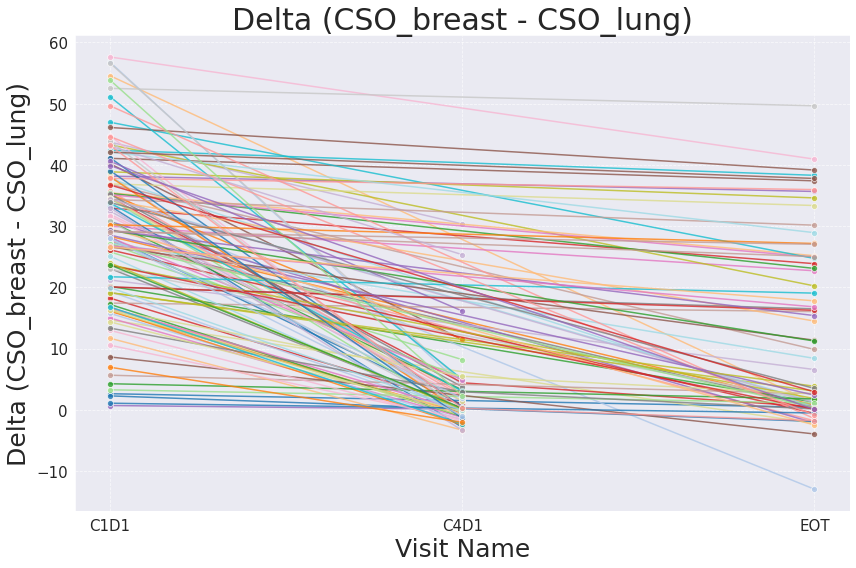

In [71]:
# Calculate the delta (difference) between CSO_breast and CSO_lung scores for each patient and time point
delta_df = df_dsi_breastDown_lungUP.pivot_table(
    index=["Patient_ID", "Visit_name"], 
    columns="cso_model_type", 
    values="cso_score"
).reset_index()

# Ensure CSO_breast and CSO_lung exist before calculating delta
if "CSO_breast" in delta_df.columns and "CSO_lung" in delta_df.columns:
    delta_df["delta"] = delta_df["CSO_breast"] - delta_df["CSO_lung"]

# Plot the delta for each patient over time
plt.figure(figsize=(12, 8))
sns.lineplot(
    data=delta_df,
    x="Visit_name",
    y="delta",
    hue="Patient_ID",
    marker="o",
    palette="tab20",
    legend=None,  # Suppress legend to reduce clutter
    alpha=0.8
)

# Set plot labels and title
plt.title("Delta (CSO_breast - CSO_lung)", fontsize=30)
plt.xlabel("Visit Name", fontsize=25)
plt.ylabel("Delta (CSO_breast - CSO_lung)", fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid(True, linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


In [57]:
df_dsi_breastDown_lungUP.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,S3_MB_Breast_call
31586,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_breast,9.851840,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.combined.hdr.tsv,B00460893,Female,Female,breast,1,Breast,True
31587,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_bladder,-16.894634,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.combined.hdr.tsv,B00460893,Female,Female,bladder,2,Breast,True
31588,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_esophageal,-21.709652,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460893/B00460893.ghcnv_qc.combined.hdr.tsv,B00460893,Female,Female,digestive,3,Breast,True
31589,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_hepatocellular,-22.572675,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,

In [86]:
# For cfDNA plot
df_dsi_breastDown_lungUP_dedup = df_dsi_breastDown_lungUP.drop_duplicates(subset= "GHSampleID")
df_dsi_breastDown_lungUP_dedup.shape

(262, 60)

In [87]:
# Select non-baseline samples with S3 MB breast negative. Stratify by CSO BreastDown_LungUp or not 
df_dsi_breastDown_lungUP_dedup_non_base = df_dsi_breastDown_lungUP_dedup[df_dsi_breastDown_lungUP_dedup['Visit_name'] != 'C1D1']
ILD_id_list = df_dsi_breastDown_lungUP_dedup_non_base.GHSampleID.to_list()
print(len(ILD_id_list))

df_dsi_breastDown_lungUP_dedup.Visit_name.value_counts()

133


C1D1    129
EOT      71
C4D1     62
Name: Visit_name, dtype: int64

In [89]:
# Select non-baseline samples with S3 MB breast negative. Stratify by CSO BreastDown_LungUp or not 

# Select for non-baseline
top_8_prd_df_updated_dedup = top_8_prd_df_updated.drop_duplicates(subset= "GHSampleID")
top_8_prd_df_updated_dedup_non_base = top_8_prd_df_updated_dedup[top_8_prd_df_updated_dedup['Visit_name'] != 'C1D1']
top_8_prd_df_updated_dedup_non_base.shape

# Label CSO BreastDown_LungUp
top_8_prd_df_updated_dedup_non_base['BreastDown_LungUp'] = np.nan
top_8_prd_df_updated_dedup_non_base['BreastDown_LungUp'] = np.where(top_8_prd_df_updated_dedup_non_base['GHSampleID'].isin(ILD_id_list), 'CSO BreastDown LungUp', "Other Treatment")

# Select for non-baseline with S3 MB breast negative.
top_8_prd_df_updated_dedup_non_base_binary_negative = top_8_prd_df_updated_dedup_non_base[top_8_prd_df_updated_dedup_non_base['S3_MB_Breast_call'] == False]
top_8_prd_df_updated_dedup_non_base_binary_negative.BreastDown_LungUp.value_counts()

Other Treatment          117
CSO BreastDown LungUp     47
Name: BreastDown_LungUp, dtype: int64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CSO BreastDown LungUp vs. Other Treatment: t-test independent samples, P_val:9.443e-01 t=-6.993e-02


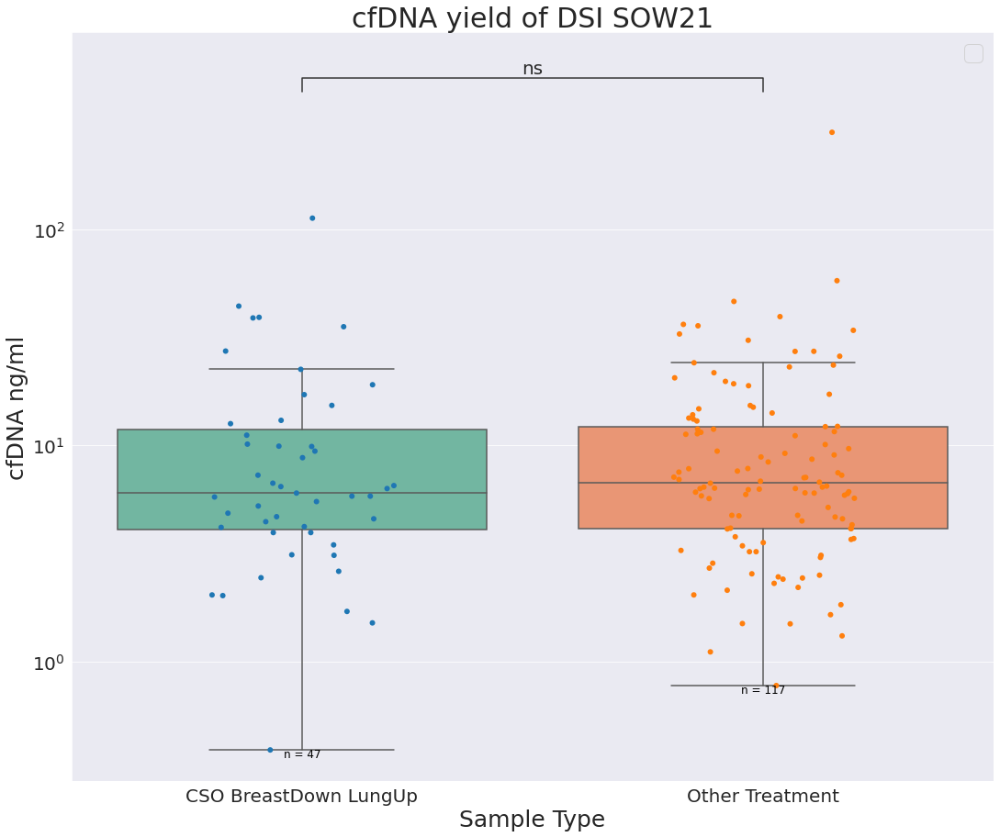

In [91]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_comparison(df, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # # Order based on the 'CSO_Lung_Sample' categories
    hue_order = df['BreastDown_LungUp'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # hue_order = ['Provided Cancer type: breast', 'CSO_lung_Samples']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="BreastDown_LungUp", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="BreastDown_LungUp", y="cfDNA_ng", ax=ax, dodge=True, jitter=0.2, size=6)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # Offset for sample size annotation, adjust as needed
    offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    for plot_type, cancer_group in df.groupby('BreastDown_LungUp'):
        n = cancer_group.shape[0]
        type_pos = hue_order.index(plot_type)
        center = ax.get_xticks()[type_pos]  # Center position of each category
        ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="BreastDown_LungUp", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=20)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample Type', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    ax.legend(fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)


    plt.show()

# Daichi sow21
cfDNA_boxplot_comparison(top_8_prd_df_updated_dedup_non_base_binary_negative, 'cfDNA yield of DSI SOW21')


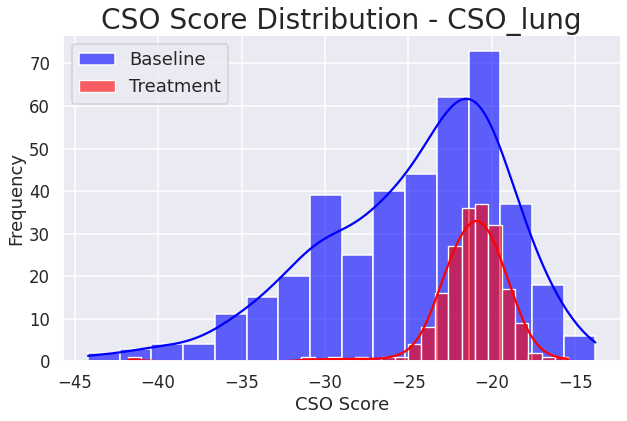

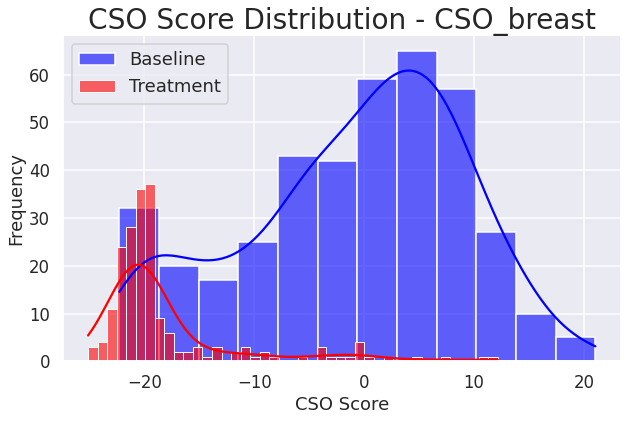

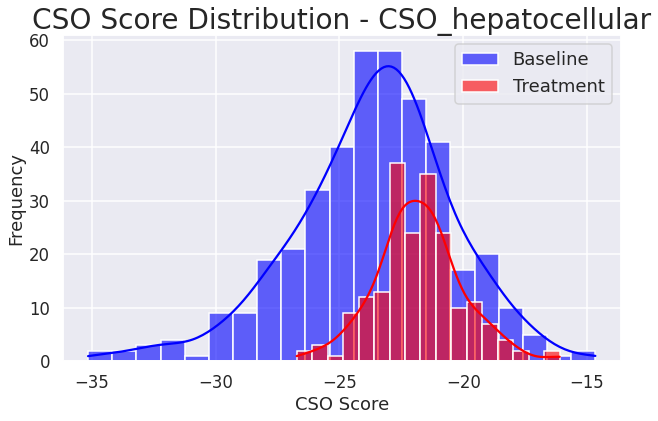

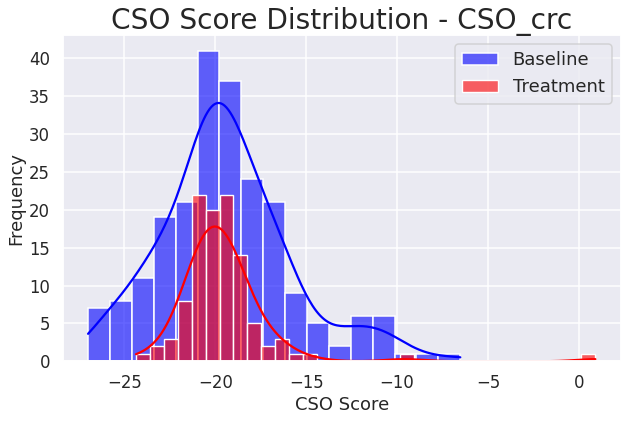

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


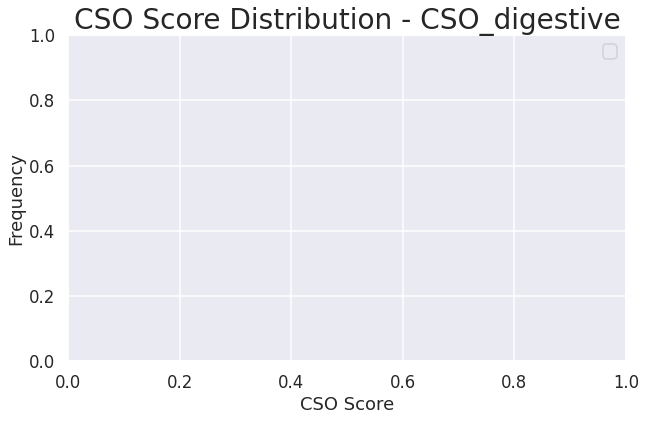

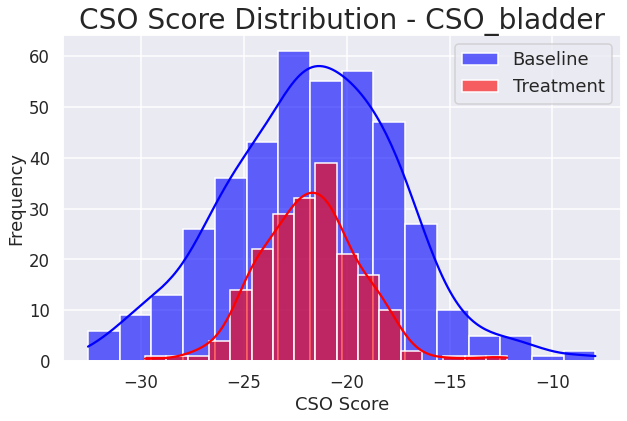

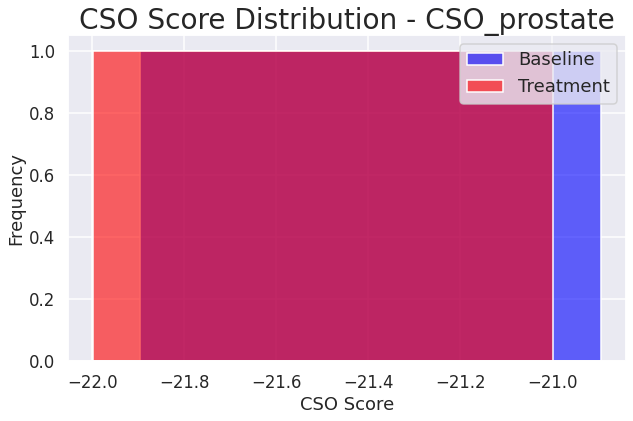

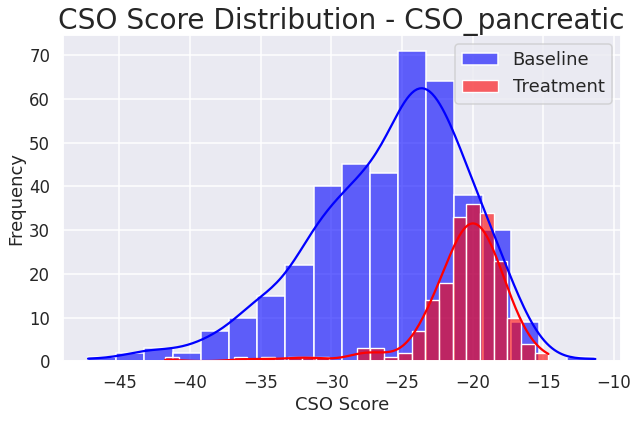

In [307]:
def plot_histogram(data, CSO_pred_type):
    baseline_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]['cso_score']
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]['cso_score']
    
    plt.figure(figsize=(10, 6))
    sns.histplot(baseline_data, color="blue", kde=True, label='Baseline', alpha=0.6)
    sns.histplot(treatment_data, color="red", kde=True, label='Treatment', alpha=0.6)
    plt.xlabel('CSO Score', fontsize = 18)
    plt.ylabel('Frequency', fontsize = 18)
    plt.title(f'CSO Score Distribution - {CSO_pred_type}', fontsize = 28)
    plt.legend(fontsize = 18)
    plt.show()

plot_histogram(top_8_prd_df_sub, 'CSO_lung')
plot_histogram(top_8_prd_df_sub, 'CSO_breast')
plot_histogram(top_8_prd_df_sub, 'CSO_hepatocellular')
plot_histogram(top_8_prd_df_sub, 'CSO_crc')
plot_histogram(top_8_prd_df_sub, 'CSO_digestive')
plot_histogram(top_8_prd_df_sub, 'CSO_bladder')
plot_histogram(top_8_prd_df_sub, 'CSO_prostate')
plot_histogram(top_8_prd_df_sub, 'CSO_pancreatic')

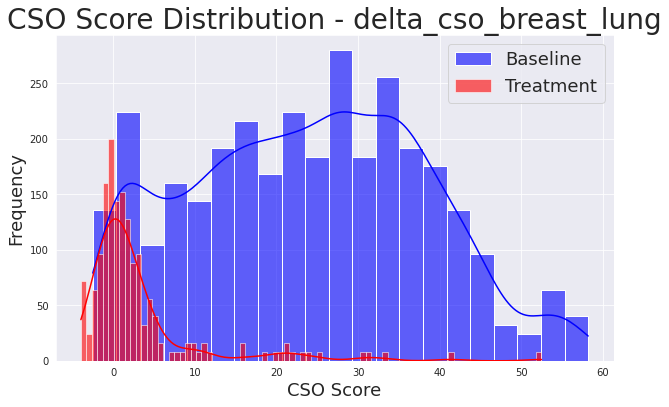

In [138]:
# Get the delta between CSO_lung and CSO_breast can reflect the relative relationship of breast cancer signal and lung damage.

# Step 1: Filter for relevant cso_model_type
filtered_df = top_8_prd_df_sub[top_8_prd_df_sub['cso_model_type'].isin(['CSO_breast', 'CSO_lung'])]

# Step 2: Pivot to get cso_scores for breast and lung in separate columns for each GHSampleID
pivot_df = filtered_df.pivot_table(index='GHSampleID', columns='cso_model_type', values='cso_score', aggfunc='first')

# Step 3: Calculate the delta of cso_scores between CSO_breast and CSO_lung
pivot_df['delta_cso_breast_lung'] = pivot_df['CSO_breast'] - pivot_df['CSO_lung']

# Step 4: Merge this delta back into the original DataFrame
# Ensuring that pivot_df's index is properly set for the merge
pivot_df.reset_index(inplace=True)
top_8_prd_df_sub = top_8_prd_df_sub.merge(pivot_df[['GHSampleID', 'delta_cso_breast_lung']], on='GHSampleID', how='left')

# Verify the new column
top_8_prd_df_sub[['GHSampleID', 'delta_cso_breast_lung']].head()


baseline_data = top_8_prd_df_sub[(top_8_prd_df_sub['treatment'] == 'Baseline')]['delta_cso_breast_lung']
treatment_data = top_8_prd_df_sub[(top_8_prd_df_sub['treatment'] == 'Treatment')]['delta_cso_breast_lung']

plt.figure(figsize=(10, 6))
sns.histplot(baseline_data, color="blue", kde=True, label='Baseline', alpha=0.6)
sns.histplot(treatment_data, color="red", kde=True, label='Treatment', alpha=0.6)
plt.xlabel('CSO Score', fontsize = 18)
plt.ylabel('Frequency', fontsize = 18)
plt.title(f'CSO Score Distribution - delta_cso_breast_lung', fontsize = 28)
plt.legend(fontsize = 18)
plt.show()


In [ ]:
import statsmodels.api as sm

top_8_prd_df = top_8_prd_df_sub.copy()

# Filtering out a specific treatment for clarity in the dataset
top_8_prd_df = top_8_prd_df[top_8_prd_df['treatment'] != 'other']

# Calculate cfDNA_ng per ml if not already calculated
top_8_prd_df['cfDNA_ng_per_ml'] = top_8_prd_df['cfDNA_ng'] / top_8_prd_df['Plasma_ml_input']

# Replace infinities with NaN
top_8_prd_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows where any NaN values in 'delta_cso_breast_lung' or 'cfDNA_ng_per_ml'
top_8_prd_df = top_8_prd_df.dropna(subset=['delta_cso_breast_lung', 'cfDNA_ng_per_ml'])

# Visualize the relationship using FacetGrid
g = sns.FacetGrid(top_8_prd_df, col="treatment", height=5)
g.map_dataframe(sns.scatterplot, 'delta_cso_breast_lung', 'cfDNA_ng_per_ml')
g.set_axis_labels("Delta CSO Lung-Breast", "ctDNA ng/ml")
g.add_legend()
plt.show()

# Prepare data for regression analysis
baseline_data = top_8_prd_df[top_8_prd_df['treatment'] == 'Baseline']
baseline_data = sm.add_constant(baseline_data)  # Adding a constant for the intercept in the regression model

# Conduct OLS regression
model = sm.OLS(baseline_data['cfDNA_ng_per_ml'], baseline_data[['const', 'delta_cso_breast_lung']])
results = model.fit()

# Display the results
print(results.summary())


In [ ]:
from scipy.stats import ttest_ind

def perform_ttest(data, CSO_pred_type):
    baseline_scores = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]['cso_score']
    treatment_scores = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]['cso_score']
    
    t_stat, p_value = ttest_ind(baseline_scores, treatment_scores, equal_var=False)  # Assuming unequal variances
    print(f'T-test results for {CSO_pred_type} - Baseline vs. Treatment:\nT-Statistic: {t_stat}, P-value: {p_value}')
    # Calculating mean values
    baseline_mean = baseline_scores.mean()
    treatment_mean = treatment_scores.mean()
    print(f'Mean Baseline score: {baseline_mean}, Mean Treatment score: {treatment_mean}')



perform_ttest(top_8_prd_df_sub, 'CSO_lung')
perform_ttest(top_8_prd_df_sub, 'CSO_breast')



### Identify the lung-disease specific DMRs (Input data as S3 MB Breast negative samples in Daiichi SOW21)

#### DMR selection (v6/LR) by stats comparision (this selection rule is define by Haiyang)
###### If using screening team's regions, only need to run first 4 cells (2-4) for next section (MR selection by healthy-lung-tissue regions filtered by screening team)

In [53]:
# Identify the DMR analysis dataset. Samples are S3 MB Breast negative in Daiichi SOW21 (top_prd_df_sub_4). Then compare (treatment CSO_lung_Samples vs the rest of Provided Cancer type: breast)

# Save the DMR analysis data for faster loading
# top_prd_df_sub_4.to_csv(f"{work_dir}/top_prd_df_sub_4_07242024.csv", index = False)
# S3 TFv2 version
top_prd_df_sub_4.to_csv(f"{work_dir}/top_prd_df_sub_4_10212024.csv", index = False)


# Save the S3 MB breast positive Daiichi samples for non-tumor derived DMR selection
# top_prd_df_sub_5.to_csv(f"{work_dir}/top_prd_df_sub_5_08122024.csv", index = False)
# S3 TFv2 version
top_prd_df_sub_5.to_csv(f"{work_dir}/top_prd_df_sub_5_10212024.csv", index = False)



In [2]:
# Readin data for DMR identification data
# top_prd_df_sub_4 = pd.read_csv(f"{work_dir}/top_prd_df_sub_4_07242024.csv", header =0)

# S3 TFv2 version (DSI SOW21 S3 negative TFv2 version)
top_prd_df_sub_4 = pd.read_csv(f"{work_dir}/top_prd_df_sub_4_10212024.csv")

print(top_prd_df_sub_4.shape)
top_prd_df_sub_4.head()

(117, 60)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample
0,B00460895_230812_A01810_0184_AH7GK3DSX7,-21.495898,CSO_pancreatic,-16.906861,DS8201-A-U302,A0808355,B00460895,44012006,C04D1,SUCCESS,NaN,53.5600,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.43,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.combined.hdr.tsv,B00460895,Female,Female,pancreatic,1,Breast,Provided Cancer type: breast
1,B00460897_230812_A01810_0184_AH7GK3DSX7,-22.772365,CSO_esophageal_gastric,-17.976585,DS8201-A-U302,A0808363,B00460897,33262001,C4D1,SUCCESS,NaN,3.8844,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.93,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.combined.hdr.tsv,B00460897,Female,Female,esophageal_gastric,1,Breast,Provided Cancer type: breast
2,B00460904_230812_A01810_0185_BH7K3TDSX7,-21.805463,CSO_bladder,-18.590428,DS8201-A-U302,A0808386,B00460904,44192004,C04D1,SUCCESS,NaN,22.1000,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.00,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0185_BH7K3TDSX7,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0185_BH7K3TDSX7.076c97eb-782b-48a1-9cb3-d30ab38ac636.20230814141422_test,False,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.combined.hdr.tsv,B00460904,Female,Female,bladder,1,Breast,Provided Cancer type: breast
3,B00460910_230812_A01810_0184_AH7GK3DSX7,-22.681973,CSO_ovarian,-16.150792,DS8201-A-U302,A0808352,B00460910,34012003,C04D1,SUCCESS,NaN,8.6320,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.23,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_c

In [2]:
# Annotation of each region in {run_sample_id}.msre_region_stats.tsv file of each sample

# Read in the annotation file of MB caller DMR from screening team
df_DMR_annotation_v6 = pd.read_table(f"/screening/data/methylation/sandbox_pipeline/assets/mafband_v2023_12_23/msre_regions.tsv")
df_DMR_annotation_v6.head()

,chrom,start,end,region_id,merged_region_id,merged_region_type
0,1,955884,956186,merged_0,v5_hypo_control_chr1_955885_956186,V5_HYPO_CONTROL
1,1,1107305,1107455,merged_1,myeloid_dmr_482,V6_IMMUNE_DMR
2,1,2461184,2461934,merged_2,HES5_TSS_minus_downreg,V6_DE_TSS
3,1,2984786,2985170,merged_3,v5_crc_dmr_chr1_2984787_2985170,V5_CRC_DMR
4,1,3663703,3664004,merged_4,v5_tissue_dmr_chr1_3663704_3664004,V5_COLON_TISSUE_DMR


In [4]:
# Adding the new column "annotation" based on MB caller annotation
df_DMR_annotation_v6_1 = df_DMR_annotation_v6.copy()

df_DMR_annotation_v6_1["region_id_combined"] = df_DMR_annotation_v6_1["chrom"].astype(str) + "_" + df_DMR_annotation_v6_1["start"].astype(str) + "_" + df_DMR_annotation_v6_1["end"].astype(str)
# df_DMR_annotation_v6_1['annotation'] = df_DMR_annotation_v6_1['merged_region_type'].apply(lambda x: 'MB_caller_CONTROL_DMR' if 'CONTROL' or 'IMMUNE' in x else 'MB_caller_DMR')

# MB v6 DMR summary
print("Total size of MB DMR in v6 panel is " + str(df_DMR_annotation_v6_1.region_id_combined.unique().size) + "\n") 

# Remove the V6 panel regions with control and immune in it
df_DMR_annotation_v6_ctrl = df_DMR_annotation_v6_1[(df_DMR_annotation_v6_1['merged_region_type'].str.contains('CONTROL')) | (df_DMR_annotation_v6_1['merged_region_type'].str.contains('IMMUNE'))]
cso_dmr_remove_list = df_DMR_annotation_v6_ctrl.region_id.to_list()
cso_dmr_remove_coordinate_list = df_DMR_annotation_v6_ctrl.region_id_combined.to_list()
print("Total size of the control regions in MB DMR in v6 panel is " + str(df_DMR_annotation_v6_ctrl.region_id_combined.unique().size) + "\n") 

# Get the final v6 panel for DMR analysis 
df_DMR_annotation_v6_DMR = df_DMR_annotation_v6_1[~df_DMR_annotation_v6_1['region_id'].isin(cso_dmr_remove_list)]
cso_dmr_list = df_DMR_annotation_v6_DMR.region_id.to_list()
print("Total size of MB DMR in v6 panel after removing contorl regions is " + str(len(cso_dmr_list)) + "\n") 

# Check the excluded CSO caller DMRs
df_DMR_annotation_v6_ctrl.merged_region_type.value_counts()

Total size of MB DMR in v6 panel is 2717

Total size of the control regions in MB DMR in v6 panel is 688

Total size of MB DMR in v6 panel after removing contorl regions is 2029



V5_HYPO_CONTROL                 431
V6_IMMUNE_DMR                   123
HYPO_CONTROL                     72
HYPER_CONTROL                    51
V6_CRC_DMR,V6_IMMUNE_DMR          4
V5_HYPO_CONTROL,V5_TFBS           3
V6_DE_TSS,V6_IMMUNE_DMR           1
HYPO_CONTROL,V6_CTCF_CONST        1
HYPO_CONTROL,V5_HYPO_CONTROL      1
HYPO_CONTROL,V5_TFBS              1
Name: merged_region_type, dtype: int64

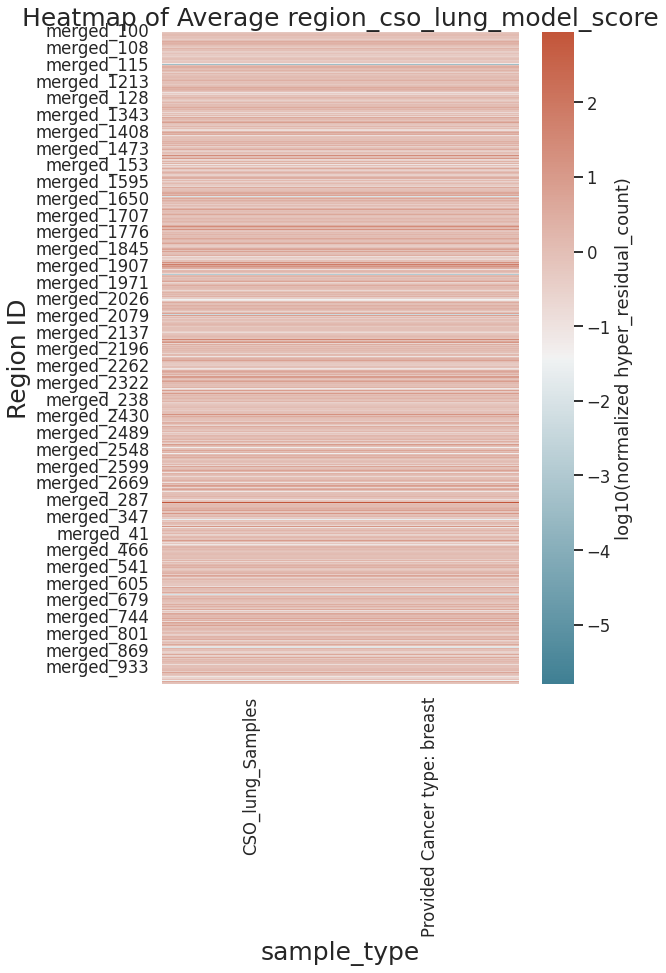

In [67]:
# Check v6/CSO panel regions and 1) generate the data (df_consolidated_sub4_DMR) for DMR analysis 2) generate a mean heatmap for brief visualization
# Load data and prepare the dataset
top_prd_df_sub_4_DMR = top_prd_df_sub_4.copy()

# Create an empty DataFrame for consolidated data
df_consolidated_sub4_DMR = pd.DataFrame()

# Reachin weights and bias for CSO lung model
df_cso_lung_weights = pd.read_table("/screening/data/locked_model_training_data/MCD/NCI_Pilot/scratch/cso/2024_03_19_CSO_lung.tsv")

# Process each sample
for index, row in top_prd_df_sub_4_DMR.iterrows():
    run_sample_id = row["GHSampleID"]
    fc_dir = row["mbd_dir"]
    sample_type = row['CSO_Lung_Sample']
    msre_mr_file = f"{fc_dir}/{run_sample_id}.msre_caller_mr_features.hdr.tsv"

    try:
        # Attempt to load the .tsv file
        df_temp = pd.read_table(msre_mr_file)
    except FileNotFoundError:
        # If .tsv is not found, try loading .tsv.gz
        msre_mr_file_gz = f"{msre_mr_file}.gz"
        try:
            df_temp = pd.read_table(msre_mr_file_gz)
        except FileNotFoundError:
            # If neither file is found, print an error message and continue with the next iteration
            print(f"File not found for sample_id {run_sample_id}: {msre_mr_file} and {msre_mr_file_gz}")
            continue

    # Exclude some DMRs
    df_temp_sub = df_temp[~df_temp["region_id"].isin(cso_dmr_remove_list)]

    # Add 'sample_id' and 'sample_type' to the DataFrame
    df_temp_sub['sample_id'] = run_sample_id
    df_temp_sub['sample_type'] = sample_type

    # Append to the consolidated DataFrame
    df_consolidated_sub4_DMR = pd.concat([df_consolidated_sub4_DMR, df_temp_sub], ignore_index=True)
     
    # try:
    #     # Load the data file
    #     df_temp = pd.read_table(msre_mr_file)
    #     # Exclude some DMRs
    #     df_temp_sub = df_temp[~df_temp["region_id"].isin(cso_dmr_remove_list)]

    #     # Add 'sample_id' and 'sample_type' to the DataFrame
    #     df_temp_sub['sample_id'] = run_sample_id
    #     df_temp_sub['sample_type'] = sample_type
        
    #     # Append to the consolidated DataFrame
    #     df_consolidated_sub4_DMR = pd.concat([df_consolidated_sub4_DMR, df_temp_sub], ignore_index=True)
    # except FileNotFoundError:
    #     print(f"File not found for sample_id {run_sample_id}: {msre_mr_file}")
    #     continue

# Group by region_id and sample_type, then calculate the mean of region_score

# # Convert the region score back to original scale
# df_consolidated_sub4_DMR["region_score_ori"] = np.power(10, df_consolidated_sub4_DMR["region_score"])

# Get the intermediate component 
df_consolidated_sub4_DMR.drop(['weight', 'bias', 'threshold', 'pseudocount'], axis=1, inplace=True)

# Merge the weights and biases based on region_id from df_cso_lung_weights
df_consolidated_sub4_DMR = df_consolidated_sub4_DMR.merge(df_cso_lung_weights[['region_id', 'weight', 'bias']], on='region_id', how='left')

# Calculate the model score using weights and biases from the cso lung model
df_consolidated_sub4_DMR['region_cso_lung_model_score'] = df_consolidated_sub4_DMR["region_score"] * df_consolidated_sub4_DMR["weight"] + df_consolidated_sub4_DMR["bias"]

df_mean_sub4_DMR = df_consolidated_sub4_DMR.groupby(['region_id', 'sample_type']).region_cso_lung_model_score.mean().reset_index()

# Pivot the DataFrame to have 'region_id' as rows, 'sample_type' as columns, and mean 'region_score' as values
df_pivot_sub4_DMR = df_mean_sub4_DMR.pivot(index='region_id', columns='sample_type', values='region_cso_lung_model_score')

# Plotting the heatmap
plt.figure(figsize=(8, 12))
cmap = sns.diverging_palette(220, 20, as_cmap=True)
ax = sns.heatmap(df_pivot_sub4_DMR, cmap=cmap, cbar_kws={'label': 'log10(normalized hyper_residual_count)'})

# ax.set_xticklabels(['CSO_lung_Samples', 'Provided Cancer type: breast'], ha="right", fontsize = 25)
plt.title('Heatmap of Average region_cso_lung_model_score', fontsize = 25)
plt.xlabel('sample_type', fontsize = 25)
plt.ylabel('Region ID', fontsize = 25)
plt.show()


In [69]:
# Save the data for R script data visualization for (v6 regions!!! NOT LR) of two groups of DSI SOW21 negative sample 
# df_consolidated_sub4_DMR.to_csv(f"{work_dir}/df_consolidated_sub4_DMR.csv", index = False)

# S3 MB TFv2 version 
df_consolidated_sub4_DMR.to_csv(f"{work_dir}/df_consolidated_sub4_DMR_10212024.csv", index = False)

In [5]:
# df_consolidated_sub4_DMR = pd.read_csv(f"{work_dir}/df_consolidated_sub4_DMR.csv", header = 0)

# S3 MB TFv2 version 
df_consolidated_sub4_DMR = pd.read_csv(f"{work_dir}/df_consolidated_sub4_DMR_10212024.csv", header = 0)
df_consolidated_sub4_DMR.head()

,region_id,hyper_residual_count,hyper_residual_count_pos_ctrl,region_score,run_sample_id,runid,sample_id,sample_type,weight,bias,region_cso_lung_model_score
0,merged_100,0.0,103496.0,-5.000000,B00460895,230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,B00460895,Provided Cancer type: breast,-0.490240,-0.002046,2.449152
1,merged_1001,25.0,103496.0,-3.599367,B00460895,230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,B00460895,Provided Cancer type: breast,-0.021137,-0.002046,0.074036
2,merged_1003,2.0,103496.0,-4.532771,B00460895,230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,B00460895,Provided Cancer type: breast,0.043293,-0.002046,-0.198284
3,merged_1004,5.0,103496.0,-4.234249,B00460895,230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,B00460895,Provided Cancer type: breast,0.219427,-0.002046,-0.931153
4,merged_1005,0.0,103496.0,-5.000000,B00460895,230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,B00460895,Provided Cancer type: breast,0.010226,-0.002046,-0.053175


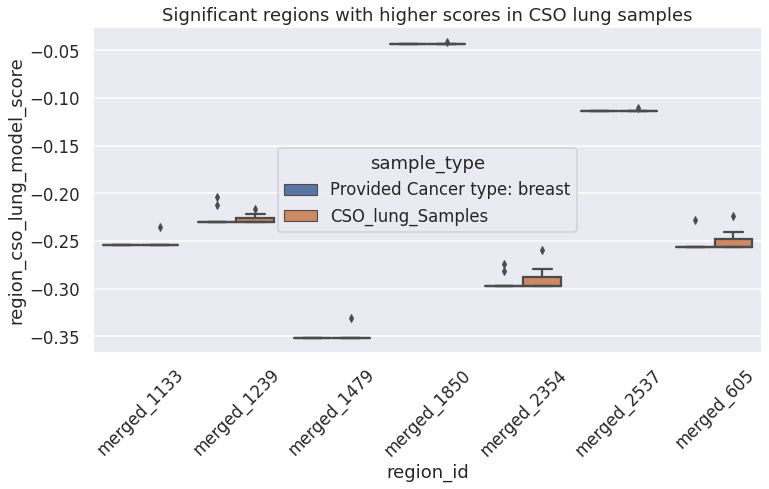

sample_type  CSO_lung_Samples  Provided Cancer type: breast
region_id                                                  
merged_1133         -0.251829                     -0.254536
merged_1239         -0.226596                     -0.229246
merged_1479         -0.349139                     -0.352132
merged_1850         -0.043118                     -0.043472
merged_2354         -0.288841                     -0.296380


In [72]:
# Filter for lung-disease-specific DMRs based on t-test or Wilcoxon test by using MODEL INTERMEDIATE SCORRE on v6 panel

def DMR_identification_v6(df_input, score_type):
    df = df_input.copy()
    df_long_format = df[['region_id', 'sample_type', score_type]]

    # Create subsets for each sample type
    lung_samples = df_long_format[df_long_format['sample_type'] == 'CSO_lung_Samples']
    breast_samples = df_long_format[df_long_format['sample_type'] == 'Provided Cancer type: breast']

    # Initialize significant_filtered as an empty DataFrame
    significant_filtered = pd.DataFrame()
    
    # Perform statistical tests and normality checks
    results = []
    unique_regions = df_long_format['region_id'].unique()

    for region in unique_regions:
        lung_region_scores = lung_samples[lung_samples['region_id'] == region][score_type]
        breast_region_scores = breast_samples[breast_samples['region_id'] == region][score_type]
        
        if len(lung_region_scores) > 0 and len(breast_region_scores) > 0:
            lung_normality_p = stats.shapiro(lung_region_scores)[1]
            breast_normality_p = stats.shapiro(breast_region_scores)[1]

            t_stat, t_p_value = stats.ttest_ind(lung_region_scores, breast_region_scores, equal_var=False)
            w_stat, w_p_value = stats.mannwhitneyu(lung_region_scores, breast_region_scores, alternative='greater')
            
            results.append((region, t_stat, t_p_value, w_stat, w_p_value, 't-test' if lung_normality_p > 0.05 and breast_normality_p > 0.05 else 'Wilcoxon'))
        else:
            results.append((region, np.nan, np.nan, np.nan, np.nan, 'No Data'))

    # Convert results to DataFrame
    results_df = pd.DataFrame(results, columns=['region_id', 't_stat', 't_p_value', 'w_stat', 'w_p_value', 'Validity'])

    # Adjust p-values for multiple testing using FDR
    results_df['adjusted_t_p_value'] = smm.multipletests(results_df['t_p_value'], method='fdr_bh')[1]
    results_df['adjusted_w_p_value'] = smm.multipletests(results_df['w_p_value'], method='fdr_bh')[1]

    # Filter significant results from either test
    # significant_t = results_df[(results_df['adjusted_t_p_value'] < 0.05) & (results_df['Validity'] == 't-test')]
    # significant_w = results_df[(results_df['adjusted_w_p_value'] < 0.05) & (results_df['Validity'] == 'Wilcoxon')]
    significant_t = results_df[results_df['adjusted_t_p_value'] < 0.05]
    significant_w = results_df[results_df['adjusted_w_p_value'] < 0.05]

    # Combine significant results and remove duplicates
    significant_regions = pd.concat([significant_t, significant_w]).drop_duplicates()

    # Plotting and further analysis
    if not significant_regions.empty:
        significant_ids = significant_regions['region_id'].unique()
        significant_samples = df_long_format[df_long_format['region_id'].isin(significant_ids)]
        grouped = significant_samples.groupby(['region_id', 'sample_type'])[score_type].mean().unstack()
        significant_filtered = grouped[grouped['CSO_lung_Samples'] > grouped['Provided Cancer type: breast']]

        if not significant_filtered.empty:
            plt.figure(figsize=(12, 6))
            sns.set_style('darkgrid')
            sns.boxplot(data=significant_samples[significant_samples['region_id'].isin(significant_filtered.index)],
                        x='region_id', y=score_type, hue='sample_type')
            plt.xticks(rotation=45)
            plt.title('Significant regions with higher scores in CSO lung samples')
            plt.show()
        else:
            print("No regions found with higher scores in CSO lung samples than in breast samples.")
    else:
        print("No significant regions were found.")

    # Check significant results
    print(significant_filtered.head())

    return significant_regions, significant_filtered

significant_regions, significant_filtered = DMR_identification_v6(df_consolidated_sub4_DMR, "region_cso_lung_model_score")

In [283]:
# Note that, by merely using "region_score" leading to 0 significantly different regions

significant_regions_score_v6, significant_filtered_region_score_v6 = DMR_identification_v6(df_consolidated_sub4_DMR, "region_score")

No significant regions were found.
Empty DataFrame
Columns: []
Index: []


In [284]:
# Save the data
df_consolidated_sub4_model_DMR_5 = df_consolidated_sub4_DMR[df_consolidated_sub4_DMR['region_id'].isin(significant_filtered.index.to_list())]
df_consolidated_sub4_model_DMR_5.to_csv(f"{work_dir}/df_consolidated_sub4_model_DMR_5.csv", index = False)

In [ ]:
# # NO NEED TO RUN THIS CELL AGAIN!

# # Add the addnotation to the epiTFv2 output file "{sample_id}.msre_region_stats.tsv" based on MB caller DMR annotation, epiTFv2 pre-defined set annotation, and LR caller DMR annotation.
# df_paired_daiichi_DMR_1 = df_paired_daiichi_DMR.copy()
# msre_daiichi_out_path = f"{work_dir}/df_paired_daiichi_lung_top1_pan_neg_annotated_msre_region_stats_folder"

# # Create dictionaries for fast lookup
# annotation_dict_v6_1 = pd.Series(df_DMR_annotation_v6_1.annotation.values, index=df_DMR_annotation_v6_1.region_id_combined).to_dict()
# annotation_dict_pre_defined = pd.Series(df_DMR_annotation_pre_defined_set_epiTFv2_1.annotation.values, index=df_DMR_annotation_pre_defined_set_epiTFv2_1.v6_regions).to_dict()

# def assign_annotation(row, annotation_dict_v6_1, annotation_dict_pre_defined):
#     region_id = row['region_id']
#     if region_id in annotation_dict_v6_1:
#         return annotation_dict_v6_1[region_id]
#     elif region_id in annotation_dict_pre_defined:
#         return annotation_dict_pre_defined[region_id]
#     else:
#         return 'LR_caller_DMR'

# for index, row in df_paired_daiichi_DMR_1.iterrows():
#     run_sample_id = row["GHSampleID"]
#     fc_dir = row["fc_dir"]
#     treatment = row['treatment']
#     msre_mr_file = f"{fc_dir}/{run_sample_id}/{run_sample_id}.msre_region_stats.tsv"
    
#     try:
#         df_temp = pd.read_csv(msre_mr_file, sep='\t', index_col=0)
#         df_temp['annotation'] = df_temp.apply(assign_annotation, axis=1, args=(annotation_dict_v6_1, annotation_dict_pre_defined))
#         # Save the modified DataFrame
#         df_temp.to_csv(f"{msre_daiichi_out_path}/{run_sample_id}.msre_region_stats_annotated.csv", index=False)

#     except Exception as e:
#         print(f"An error occurred with {run_sample_id}: {str(e)}")
#         continue 


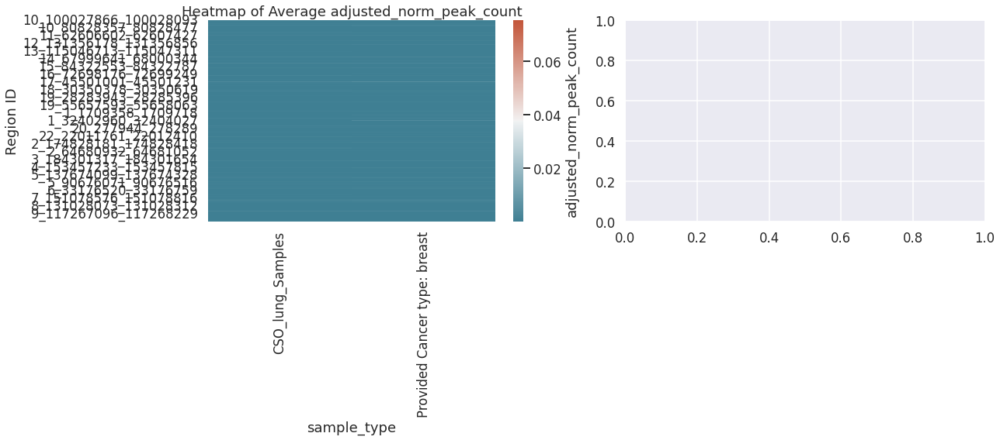

In [83]:
# Check LR panel regions and 1) generate the data (df_consolidated_sub4_LR_DMR) for DMR analysis 2) generate a mean heatmap for brief visualization

# Load data and prepare the dataset
top_prd_df_sub_4_DMR = top_prd_df_sub_4.copy()

# top_prd_df_az_4_DMR_new = top_prd_df_az_4_DMR.head(2)
# Create an empty DataFrame for consolidated data
df_consolidated_sub4_LR_DMR = pd.DataFrame()

# Process each sample
for index, row in top_prd_df_sub_4_DMR.iterrows():
    run_sample_id = row["GHSampleID"]
    fc_dir = row["fc_dir"]
    sample_type = row['CSO_Lung_Sample']
    msre_mr_file = f"{fc_dir}/{run_sample_id}/{run_sample_id}.msre_region_stats.tsv"
    try:
        # Load the data file
        df_temp = pd.read_table(msre_mr_file)
        # Remove control regions in v6
        df_temp_sub = df_temp[~df_temp["region_id"].isin(cso_dmr_remove_coordinate_list)]
        # print(df_temp_sub.shape)

        # Add 'sample_id' and 'sample_type' to the DataFrame
        df_temp_sub['sample_id'] = run_sample_id
        df_temp_sub['sample_type'] = sample_type
        
        # Append to the consolidated DataFrame
        df_consolidated_sub4_LR_DMR = pd.concat([df_consolidated_sub4_LR_DMR, df_temp_sub], ignore_index=True)
    except FileNotFoundError:
        print(f"File not found for sample_id {run_sample_id}: {msre_mr_file}")
        continue

# Get the intermediate component 
df_consolidated_sub4_LR_DMR['adjusted_log_norm_peak_count'] = np.log10(df_consolidated_sub4_LR_DMR["norm_peak_count"] + 1e-5)
df_consolidated_sub4_LR_DMR['adjusted_norm_peak_count'] = df_consolidated_sub4_LR_DMR["norm_peak_count"] + 1e-5


# Group by region_id and sample_type, then calculate the mean of adjusted_log_norm_peak_count
df_mean = df_consolidated_sub4_LR_DMR.groupby(['region_id', 'sample_type']).adjusted_norm_peak_count.mean().reset_index()

# Pivot the DataFrame to have 'region_id' as rows, 'sample_type' as columns, and mean 'adjusted_log_norm_peak_count' as values
df_pivot = df_mean.pivot(index='region_id', columns='sample_type', values='adjusted_norm_peak_count')

# Creating the plots with the adjusted data
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Heatmap (assuming df_pivot is already calculated and correct)
sns.heatmap(df_pivot, cmap=cmap, cbar_kws={'label': 'adjusted_norm_peak_count'}, ax=axes[0])
axes[0].set_title('Heatmap of Average adjusted_norm_peak_count')
axes[0].set_xlabel('sample_type')
axes[0].set_ylabel('Region ID')

# # Boxplot with adjusted log scale
# sns.boxplot(x='sample_type', y='adjusted_log_norm_peak_count', data=df_mean, showfliers=False, ax=axes[1])
# sns.stripplot(data=df_mean, x="sample_type", y="adjusted_log_norm_peak_count", dodge=True, jitter=0.2, ax=axes[1])
# axes[1].set_yscale('log')
# axes[1].set_title('Daichii SOW21', fontsize = 25)
# axes[1].set_xlabel('Sample Type', fontsize = 20)
# axes[1].set_ylabel('Log-scaled Normalized Peak Count', fontsize = 20)

plt.tight_layout()
plt.show()

In [86]:
# Save the data for R script data visualization for (LR panel ~27k regions) of two groups of DSI SOW21 negative sample 
# df_consolidated_sub4_LR_DMR.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR.csv", index = False)

# MB S3 TFv2 version 
df_consolidated_sub4_LR_DMR.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_10212024.csv", index = False)


In [6]:
# Readin data
# df_consolidated_sub4_LR_DMR = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR.csv", header = 0)

# MB S3 TFv2 version (This data include all regions methyl values of DSI SOW21 neg samples TFv2)
df_consolidated_sub4_LR_DMR = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_10212024.csv", header = 0)


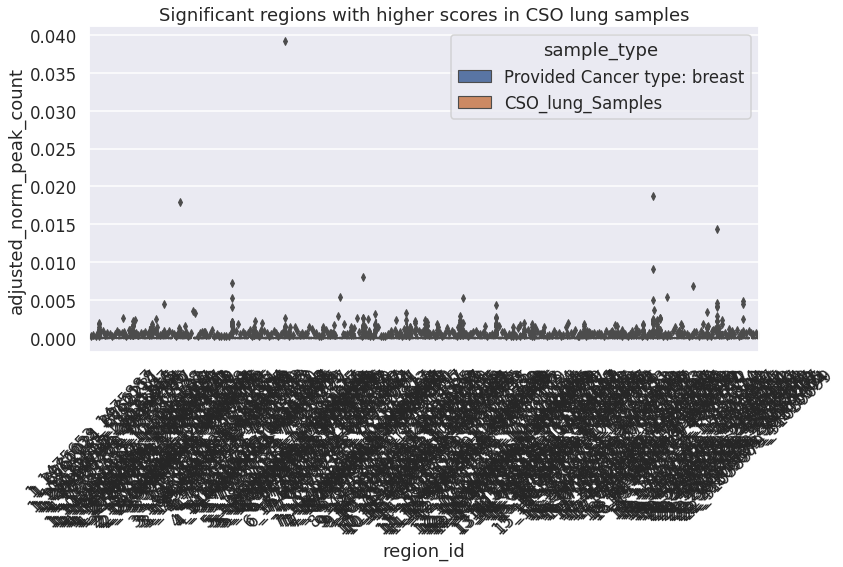

sample_type             CSO_lung_Samples  Provided Cancer type: breast
region_id                                                             
10_103577965_103578535          0.000140                      0.000010
10_103880589_103880709          0.000088                      0.000010
10_11059338_11059932            0.000640                      0.000113
10_111986858_111987429          0.000142                      0.000010
10_131769562_131770153          0.000394                      0.000071


In [92]:
# Filter for lung-disease-specific DMRs based on t-test or Wilcoxon test by using normalized hyper-residual counts on LR panel
significant_region_score_lr, significant_filtered_region_score_lr = DMR_identification_v6(df_consolidated_sub4_LR_DMR, "adjusted_norm_peak_count")

In [93]:
# Save the data (significant regions filtered myself)
# significant_region_score_lr.to_csv(f"{work_dir}/significant_region_score_lr.csv")
# significant_filtered_region_score_lr.to_csv(f"{work_dir}/significant_filtered_region_score_lr.csv")

# MB TFv2 version
significant_region_score_lr.to_csv(f"{work_dir}/significant_region_score_lr_10212024.csv")
significant_filtered_region_score_lr.to_csv(f"{work_dir}/significant_filtered_region_score_lr_10212024.csv")

In [94]:
# All 145 filtered DMRs are only fit for Wilcoxon but not for t-test. But Wilcoxon adjusted p-value is not signficant
df_significant_validity_test_check = significant_region_score_lr[significant_region_score_lr['region_id'].isin(significant_filtered_region_score_lr.index.to_list())]
df_significant_validity_test_check.Validity.value_counts()

Wilcoxon    282
Name: Validity, dtype: int64

In [95]:
df_significant_validity_test_check.head()

,region_id,t_stat,t_p_value,w_stat,w_p_value,Validity,adjusted_t_p_value,adjusted_w_p_value
6339,4_10462912_10463353,2.768688,0.018703,638.0,0.000427,Wilcoxon,0.04608,0.041852
57,1_1475653_1475887,1.000000,0.355918,440.0,0.000043,Wilcoxon,0.50929,0.005329
124,1_2986038_2986158,1.000000,0.355918,440.0,0.000043,Wilcoxon,0.50929,0.005329
193,1_6661024_6662217,1.000000,0.355918,440.0,0.000043,Wilcoxon,0.50929,0.005329
225,1_8762931_8763281,1.000000,0.355918,440.0,0.000043,Wilcoxon,0.50929,0.005329


In [97]:
# Save the data
# significant_region_score_lr.to_csv(f"{work_dir}/significant_region_score_lr.csv")
# significant_filtered_region_score_lr.to_csv(f"{work_dir}/significant_filtered_region_score_lr.csv")

# MB S3 TFv2 version
significant_region_score_lr.to_csv(f"{work_dir}/significant_region_score_lr_10212024.csv")
significant_filtered_region_score_lr.to_csv(f"{work_dir}/significant_filtered_region_score_lr_10212024.csv")


df_consolidated_sub4_LR_DMR_145 = df_consolidated_sub4_LR_DMR[df_consolidated_sub4_LR_DMR['region_id'].isin(significant_filtered_region_score_lr.index.to_list())]

# MB S3 TFv2 version (these 145 regions are filtered by myself rule)
# df_consolidated_sub4_LR_DMR_145.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_145.csv", index = False)
df_consolidated_sub4_LR_DMR_145.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_145_10212024.csv", index = False)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:7.695e-01 t=-2.930e-01


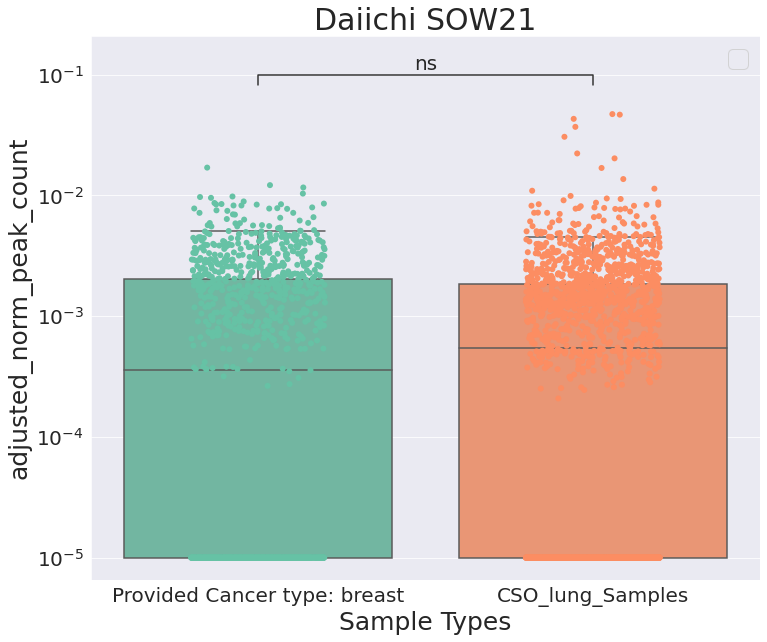

In [33]:
DMR_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(df_consolidated_sub4_LR_DMR_screen_19, 'adjusted_norm_peak_count', 'Daiichi SOW21')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:1.843e-62 t=-1.673e+01


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


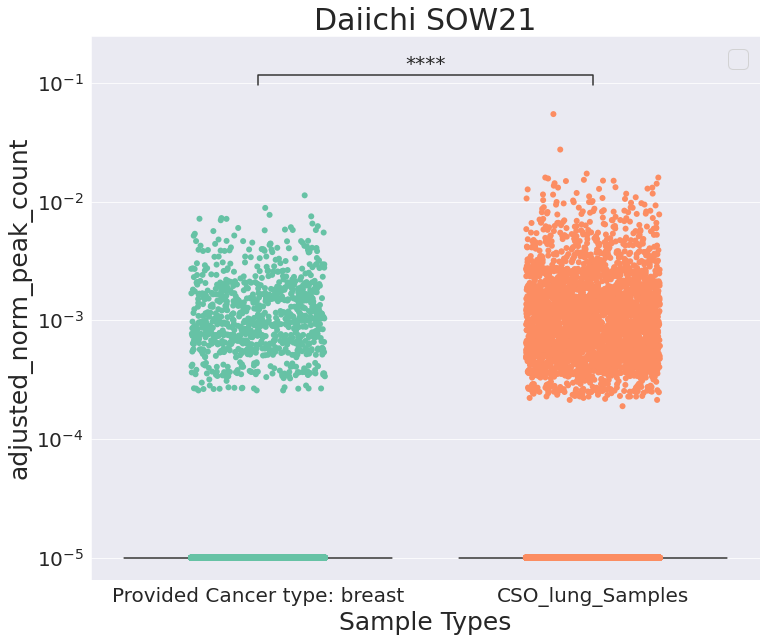

In [38]:
# Daichi sow21
DMR_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(df_consolidated_sub4_LR_DMR_145, 'adjusted_norm_peak_count', 'Daiichi SOW21')


In [ ]:
# Filter for lung-disease-specific DMRs based on t-test or Wilcoxon test by using normalized hyper-residual counts on LR panel
significant_regions_norm_lr, significant_filtered_log_norm_lr = DMR_identification_v6(df_consolidated_sub4_LR_DMR, "adjusted_log_norm_peak_count")

# No significant regions were found.
# Empty DataFrame
# Columns: []
# Index: []

In [ ]:
# Save the data but the data is empty
significant_regions_norm_lr.to_csv(f"{work_dir}/significant_regions_norm_lr.csv", index = False)
significant_filtered_log_norm_lr.to_csv(f"{work_dir}/significant_filtered_log_norm_lr.csv", index = False)

In [32]:
# Only select two ChIP genes DNMT3A and TET2 for v6 panel

df_DMR_annotation_v6_CHIP = df_DMR_annotation_v6.copy()

# Convert 'start' and 'end' to integer for comparison
df_DMR_annotation_v6_CHIP['start'] = df_DMR_annotation_v6_CHIP['start'].astype(int)
df_DMR_annotation_v6_CHIP['end'] = df_DMR_annotation_v6_CHIP['end'].astype(int)
df_DMR_annotation_v6_CHIP['chrom'] = df_DMR_annotation_v6_CHIP['chrom'].astype(str)


# Define the regions for DNMT3A and TET2
regions = {
    '2': (25504321, 25565459),
    '4': (106067842, 106200960)
}

# Filter the DataFrame based on these regions
df_DMR_annotation_v6_CHIP_twoGenes = df_DMR_annotation_v6_CHIP[
    ((df_DMR_annotation_v6_CHIP['chrom'] == '2') & (df_DMR_annotation_v6_CHIP['start'] >= regions['2'][0]) & (df_DMR_annotation_v6_CHIP['end'] <= regions['2'][1])) |
    ((df_DMR_annotation_v6_CHIP['chrom'] == '4') & (df_DMR_annotation_v6_CHIP['start'] >= regions['4'][0]) & (df_DMR_annotation_v6_CHIP['end'] <= regions['4'][1]))
]

df_DMR_annotation_v6_CHIP_twoGenes.head()

,chrom,start,end,region_id,merged_region_id,merged_region_type


In [7]:
# Only select two ChIP genes DNMT3A and TET2 for LR panel

df_consolidated_sub4_LR_DMR_ChIP = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR.csv", header = 0)

df_consolidated_sub4_LR_DMR_ChIP[['chrom', 'start', 'end']] = df_consolidated_sub4_LR_DMR_ChIP['region_id'].str.split('_', expand=True)

# Convert 'start' and 'end' to integer for comparison
df_consolidated_sub4_LR_DMR_ChIP['start'] = df_consolidated_sub4_LR_DMR_ChIP['start'].astype(int)
df_consolidated_sub4_LR_DMR_ChIP['end'] = df_consolidated_sub4_LR_DMR_ChIP['end'].astype(int)

# Define the regions for DNMT3A and TET2
regions = {
    '2': (25504321, 25565459),
    '4': (106067842, 106200960)
}

# Filter the DataFrame based on these regions
df_consolidated_sub4_LR_DMR_ChIP_twoGenes = df_consolidated_sub4_LR_DMR_ChIP[
    ((df_consolidated_sub4_LR_DMR_ChIP['chrom'] == '2') & (df_consolidated_sub4_LR_DMR_ChIP['start'] >= regions['2'][0]) & (df_consolidated_sub4_LR_DMR_ChIP['end'] <= regions['2'][1])) |
    ((df_consolidated_sub4_LR_DMR_ChIP['chrom'] == '4') & (df_consolidated_sub4_LR_DMR_ChIP['start'] >= regions['4'][0]) & (df_consolidated_sub4_LR_DMR_ChIP['end'] <= regions['4'][1]))
]

df_consolidated_sub4_LR_DMR_ChIP_twoGenes.head()


,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,chrom,start,end
2900,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_25563349_25563929,6,15,4,2884.6886,0.000046,0.001387,B00460895,Provided Cancer type: breast,-2.854919,0.001397,2,25563349,25563929
2901,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_25564270_25564390,0,0,0,0.0000,0.000000,0.000000,B00460895,Provided Cancer type: breast,-5.000000,0.000010,2,25564270,25564390
2902,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_25564609_25564729,0,0,0,0.0000,0.000000,0.000000,B00460895,Provided Cancer type: breast,-5.000000,0.000010,2,25564609,25564729
2903,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_25564845_25564965,0,0,0,0.0000,0.000000,0.000000,B00460895,Provided Cancer type: breast,-5.000000,0.000010,2,25564845,25564965
30657,B00460897,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_25563349_25563929,0,0,0,0.0000,0.000000,0.000000,B00460897,CSO_lung_Samples,-5.000000,0.000010,2,25563349,25563929


In [23]:
df_consolidated_sub4_LR_DMR_ChIP_twoGenes.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_ChIP_twoGenes.csv", index = False)


In [8]:
df_consolidated_sub4_LR_DMR_ChIP_twoGenes.region_id.value_counts()

2_25563349_25563929    159
2_25564270_25564390    159
2_25564609_25564729    159
2_25564845_25564965    159
Name: region_id, dtype: int64

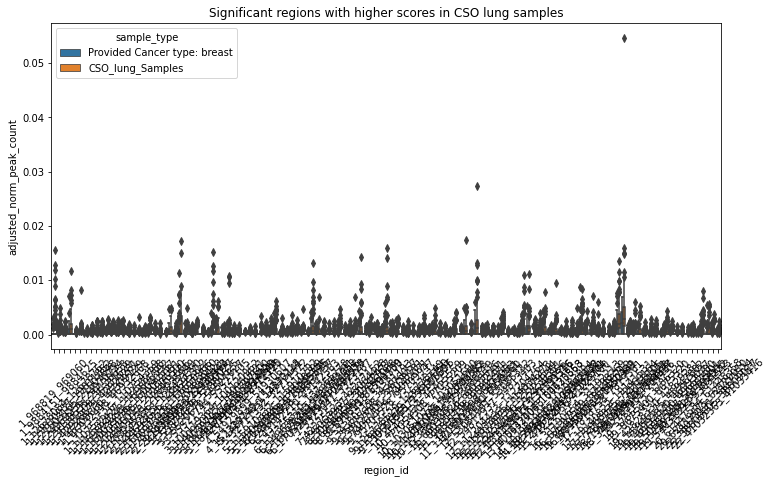

sample_type             CSO_lung_Samples  Provided Cancer type: breast
region_id                                                             
10_103051073_103051690          0.000114                      0.000026
10_112836073_112836765          0.000449                      0.000196
10_114710881_114711363          0.000107                      0.000018
10_123686908_123688119          0.000089                      0.000010
10_45455224_45455559            0.000084                      0.000016


In [16]:
# Filter for lung-disease-specific DMRs based on t-test or Wilcoxon test by using normalized hyper-residual counts on LR panel
significant_region_score_lr, significant_filtered_region_score_lr = DMR_identification_v6(df_consolidated_sub4_LR_DMR, "adjusted_norm_peak_count")

In [ ]:
from statannotations.Annotator import Annotator

def DMR_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(df, score_type, suffix_title):
    # # Update the y score to cfDNA/ml
    # df = df.copy()
    # df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(12, 10))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'sample_type' categories
    hue_order = df['sample_type'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    hue_order = ['Provided Cancer type: breast', 'CSO_lung_Samples']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="sample_type", y=score_type, showfliers=False, ax=ax, dodge=True, palette=color_map)
    sns.stripplot(data=df, x="sample_type", y=score_type, ax=ax, dodge=True, jitter=0.2, size=6, palette=color_map)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df[score_type].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby('sample_type'):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group[score_type].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="sample_type", y=score_type)
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=20)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample Types', fontsize=25)
    ax.set_ylabel(score_type, fontsize=25)
    ax.legend(fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)


    plt.show()

# Daichi sow21
DMR_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(df_consolidated_sub4_model_DMR_5, 'region_cso_lung_model_score', 'Daiichi SOW21')



In [ ]:
# save the data
df_pivot.to_csv(f"{work_dir}/df_pivot.csv", index=False)
df_selected.to_csv(f"{work_dir}/df_selected.csv", index=False)

# save the input data for cfDNA comparision
top_prd_df_sub_4.to_csv(f"{work_dir}/top_prd_df_sub_4.csv", index=False)
top_prd_df_az_4.to_csv(f"{work_dir}/top_prd_df_az_4.csv", index=False)

In [98]:
# Readin the data for cfDNA comparison 
# top_prd_df_sub_4 = pd.read_csv(f"{work_dir}/top_prd_df_sub_4.csv", header = 0)
# MB S3 TFv2
top_prd_df_sub_4 = pd.read_csv(f"{work_dir}/top_prd_df_sub_4_10212024.csv", header = 0)

top_prd_df_az_4 = pd.read_csv(f"{work_dir}/top_prd_df_az_4.csv", header = 0)


#### DMR selection by healthy-lung-tissue regions filtered by screening team

###### Pull the healthy-lung-tissue specific DMRs from Midas. But I found Midas can not pull the right lung-tissue-specific regions but only the file from here can /screening/analysis/2023_08_01_SRT_tcga_mced_discovery_MJG/analysis/goldmine_upload/all_mcd_region_annotations.tsv

In [21]:
# This code is from Mike for demo purposes

import pandas as pd
from midas import m

# Display unlimited columns
pd.set_option('display.max_columns', None)

regions = m("select * from gold.regions.dim_regions where region_id like 's3%'")

# Subset to region_id, and all columns starting with 'loyfer' or 'blueprint'
regions = regions.filter(regex='^region_id|region_chr|region_start|region_end|loyfer|blueprint|tcga')

# Remove _methyl_mean suffix from columns
regions.columns = regions.columns.str.replace('_methyl_mean', '')
# Same with _methyl_q70
regions.columns = regions.columns.str.replace('_methyl_q70', '')

##########

# Subset to regions with at least 0.5 loyfer_lung_ep_alveo_methyl_mean or loyfer_lung_ep_bron_methyl_mean
lung_regions = regions[(regions['loyfer_lung_ep_alveo'] >= 0.5) | (regions['loyfer_lung_ep_bron'] >= 0.5)]

# Also require breast epithelium to be <0.1
lung_regions = lung_regions[lung_regions['loyfer_breast_luminal_ep'] < 0.1]
lung_regions = lung_regions[lung_regions['loyfer_breast_basal_ep'] < 0.1]

# Also require breast cancer to be <0.5
# Note though this will also lose regions where BRCA doesn't have a probe
lung_regions = lung_regions[lung_regions['tcga_brca'] < 0.5]

# Only 4 regions, this is pretty strict
print(lung_regions.shape)

#lung_regions

##########

# Subset to regions with at least 0.3 loyfer_lung_ep_alveo_methyl_mean or loyfer_lung_ep_bron_methyl_mean
relaxed_lung_regions = regions[(regions['loyfer_lung_ep_alveo'] >= 0.3) | (regions['loyfer_lung_ep_bron'] >= 0.5)]

# Also require breast epithelium to be <0.1
relaxed_lung_regions = relaxed_lung_regions[relaxed_lung_regions['loyfer_breast_luminal_ep'] < 0.2]
relaxed_lung_regions = relaxed_lung_regions[relaxed_lung_regions['loyfer_breast_basal_ep'] < 0.2]

# Also require breast cancer to be <0.5
# Note though this will also lose regions where BRCA doesn't have a probe
relaxed_lung_regions = relaxed_lung_regions[relaxed_lung_regions['tcga_brca'] < 0.5]

# This one gets 10 -- still tricky
print(relaxed_lung_regions.shape)

##########

# With relaxed lung regions, filter out regions that have any methylation
# in regions starting with blueprint_, loyfer_blood_, loyfer_eryth_prog,
# loyfer_endothelium, or loyfer_liver (these are the cell types that often
# appear in blood)

relaxed_lung_regions = relaxed_lung_regions[
    (relaxed_lung_regions['loyfer_endothelium'] < 0.1) &
    (relaxed_lung_regions.filter(regex='^loyfer_liver|^loyfer_blood_|^loyfer_eryth_prog_|^blueprint_').astype(float).max(axis=1) < 0.1)
]

# Now only 6 regions left
print(relaxed_lung_regions.shape)

relaxed_lung_regions

###############

# use midas to select s3 regions 
# where region_chr is 4 and 57522145 is between region_start and region_end

# this is the Alveo10 region from the paper in Haiyang's slides

# This region is pretty lung-specific in healthy tissues, but probably won't
# cut it here because it also has high methylation in breast cancer
print(m("select * from gold.regions.dim_regions where region_id like 's3%' and region_chr = 4 and 57522145 between region_start and region_end"))

(4, 90)


In [137]:
# Set display options for better visibility
pd.set_option('display.max_columns', None)

# Assuming 'regions' DataFrame is already loaded
regions = m("select * from gold.regions.dim_regions where region_id like 's3%'")

# Filter columns related to 'loyfer', 'blueprint', and 'tcga'
regions = regions.filter(regex='^region_id|region_chr|region_start|region_end|loyfer|blueprint|tcga')

regions.head()

,region_id,region_chr,region_start,region_end,mcd_tcga_methyl_q70,mcd_tcga_methyl_var,tcga_acc_methyl_q70,tcga_blca_methyl_q70,tcga_brca_methyl_q70,tcga_coad_methyl_q70,tcga_cesc_methyl_q70,tcga_chol_methyl_q70,tcga_dlbc_methyl_q70,tcga_esca_methyl_q70,tcga_gbm_methyl_q70,tcga_hnsc_methyl_q70,tcga_kich_methyl_q70,tcga_kirc_methyl_q70,tcga_kirp_methyl_q70,tcga_laml_methyl_q70,tcga_lgg_methyl_q70,tcga_lihc_methyl_q70,tcga_luad_methyl_q70,tcga_lusc_methyl_q70,tcga_meso_methyl_q70,tcga_ov_methyl_q70,tcga_paad_methyl_q70,tcga_pcpg_methyl_q70,tcga_prad_methyl_q70,tcga_read_methyl_q70,tcga_sarc_methyl_q70,tcga_skcm_methyl_q70,tcga_stad_methyl_q70,tcga_tgct_methyl_q70,tcga_thca_methyl_q70,tcga_thym_methyl_q70,tcga_ucec_methyl_q70,tcga_ucs_methyl_q70,tcga_uvm_methyl_q70,loyfer_blood_b_methyl_mean,loyfer_blood_granul_methyl_mean,loyfer_blood_mono_macro_methyl_mean,loyfer_blood_nk_methyl_mean,loyfer_blood_t_methyl_mean,loyfer_endothelium_methyl_mean,loyfer_eryth_prog_methyl_mean,loyfer_liver_hep_methyl_mean,loyfer_adipocytes_methyl_mean,loyfer_bladder_ep_methyl_mean,loyfer_bone_osteob_methyl_mean,loyfer_breast_basal_ep_methyl_mean,loyfer_breast_luminal_ep_methyl_mean,loyfer_colon_ep_methyl_mean,loyfer_colon_fibro_methyl_mean,loyfer_dermal_fibro_methyl_mean,loyfer_epid_kerat_methyl_mean,loyfer_fallopian_ep_methyl_mean,loyfer_gallbladder_methyl_mean,loyfer_gastric_ep_methyl_mean,loyfer_head_neck_ep_methyl_mean,loyfer_heart_cardio_methyl_mean,loyfer_heart_fibro_methyl_mean,loyfer_kidney_ep_methyl_mean,loyfer_lung_ep_alveo_methyl_mean,loyfer_lung_ep_bron_methyl_mean,loyfer_neuron_methyl_mean,loyfer_oligodend_methyl_mean,loyfer_ovary_endom_ep_methyl_mean,loyfer_pancreas_acinar_methyl_mean,loyfer_pancreas_alpha_methyl_mean,loyfer_pancreas_beta_methyl_mean,loyfer_pancreas_delta_methyl_mean,loyfer_pancreas_duct_methyl_mean,loyfer_prostate_ep_methyl_mean,loyfer_skeletal_musc_methyl_mean,loyfer_small_int_ep_methyl_mean,loyfer_smooth_musc_methyl_mean,loyfer_thyroid_ep_methyl_mean,blueprint_b_methyl_mean,blueprint_cd4_methyl_mean,blueprint_cd8_methyl_mean,blueprint_dend_methyl_mean,blueprint_eosi_methyl_mean,blueprint_eryth_methyl_mean,blueprint_macro_methyl_mean,blueprint_mega_methyl_mean,blueprint_mono_methyl_mean,blueprint_nk_methyl_mean,blueprint_neutro_methyl_mean,blueprint_umbilical_endothelium_methyl_mean
0,s3_region_1,1,840086,840325,None,None,0.01809,0.02101,0.02465,0.02214,0.02123,0.02426,0.02211,0.01953,0.02376,0.02401,0.02121,0.02201,0.02204,0.01250,0.02105,0.02264,0.04588,0.02344,0.02086,0.01832,0.02500,0.02044,0.02105,0.01251,0.01984,0.02260,0.02500,0.01782,0.01897,0.01870,0.01790,0.01817,0.0250,0.01177,0.00182,0.00390,0.00423,0.00541,0.00638,0.00317,0.00515,0.00669,0.00526,0.00651,0.00261,0.00895,0.00753,0.00300,0.00179,0.00579,0.00409,0.00644,0.00149,0.00367,0.00297,0.00356,0.00381,0.00595,0.00258,0.00255,0.00282,0.00219,0.00339,0.00243,0.00180,0.00398,0.00268,0.00321,0.00635,0.00615,0.00412,0.00552,0.00197,0.00215,0.00305,0.0,0.0,0.00124,0.00381,0.0012,0.00162,0.00219,0.0007,0.00116
1,s3_region_10,1,895979,896099,None,None,0.03432,0.03405,0.04002,0.03528,0.03324,0.04273,0.04529,0.03789,0.02870,0.03719,0.03449,0.04160,0.03307,0.03750,0.03231,0.04323,0.06675,0.03689,0.03949,0.03515,0.03750,0.04248,0.03152,0.03204,0.03751,0.03298,0.03750,0.04134,0.03707,0.03589,0.04163,0.03577,0.0250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,NaN,None,None,None,None,None
2,s3_region_100,1,2375003,2375244,None,None,0.01621,0.81243,0.07636,0.69410,0.82819,0.53014,0.81858,0.73897,0.01314,0.79004,0.02175,0.05486,0.02332,0.05375,0.01220,0.12623,0.50559,0.70972,0.02125,0.01739,0.50000,0.01734,0.01237,0.38686,0.02449,0.02509,0.70000,0.05896,0.02045,0.02273,0.04178,0.01462,0.0125,0.09726,0.02931,0.04650,0.03758,0.05133,0.02225,0.02063,0.05654,0.01858,0.86241,0.00588,0.02404,0.02101,0.01210,0.06942,0.08919,0.05524,0.0

In [5]:
# This is the region selection based on what Midas (Goldmine) has, but they only has the stats data and this selection rule is not convincing 
# Set display options for better visibility
pd.set_option('display.max_columns', None)

# Assuming 'regions' DataFrame is already loaded
regions = m("select * from gold.regions.dim_regions where region_id like 's3%'")

# Filter columns related to 'loyfer', 'blueprint', and 'tcga'
regions = regions.filter(regex='^region_id|region_chr|region_start|region_end|loyfer|blueprint|tcga')

# Clean column names by removing specific suffixes
regions.columns = regions.columns.str.replace('(_methyl_mean|_methyl_q70)$', '', regex=True)

# Define lung tissue columns
lung_tissue_columns = ['loyfer_lung_ep_alveo', 'loyfer_lung_ep_bron']
other_tissue_columns = [col for col in regions.columns if 'loyfer' in col and col not in lung_tissue_columns]

# Ensure all relevant columns are numeric
regions[lung_tissue_columns + other_tissue_columns] = regions[lung_tissue_columns + other_tissue_columns].apply(pd.to_numeric, errors='coerce')

# Calculate percentile thresholds for lung and breast tissues
percentiles = {
    'loyfer_lung_ep_alveo_high': regions['loyfer_lung_ep_alveo'].quantile(0.95),
    'loyfer_lung_ep_bron_high': regions['loyfer_lung_ep_bron'].quantile(0.95),
    'loyfer_lung_ep_alveo_low': regions['loyfer_lung_ep_alveo'].quantile(0.05),
    'loyfer_lung_ep_bron_low': regions['loyfer_lung_ep_bron'].quantile(0.05),
    'breast_luminal_ep_median': regions['loyfer_breast_luminal_ep'].quantile(0.5),
    'breast_basal_ep_median': regions['loyfer_breast_basal_ep'].quantile(0.5),
    'tcga_brca_median': regions['tcga_brca'].median()
}

# Select regions based on hypermethylation criteria
hyper_lung_regions = regions[
    ((regions['loyfer_lung_ep_alveo'] >= percentiles['loyfer_lung_ep_alveo_high']) |
     (regions['loyfer_lung_ep_bron'] >= percentiles['loyfer_lung_ep_bron_high'])) &
    (regions['loyfer_breast_luminal_ep'] < percentiles['breast_luminal_ep_median']) &
    (regions['loyfer_breast_basal_ep'] < percentiles['breast_basal_ep_median']) &
    (regions['tcga_brca'] < percentiles['tcga_brca_median'])
]
hyper_lung_regions['Label'] = 'Hyper-lung-tissue-specific'

# Select regions based on hypomethylation criteria
hypo_lung_regions = regions[
    ((regions['loyfer_lung_ep_alveo'] <= percentiles['loyfer_lung_ep_alveo_low']) |
     (regions['loyfer_lung_ep_bron'] <= percentiles['loyfer_lung_ep_bron_low'])) &
    (regions['loyfer_breast_luminal_ep'] < percentiles['breast_luminal_ep_median']) &
    (regions['loyfer_breast_basal_ep'] < percentiles['breast_basal_ep_median']) &
    (regions['tcga_brca'] < percentiles['tcga_brca_median'])
]
hypo_lung_regions['Label'] = 'Hypo-lung-tissue-specific'

# Combine both DataFrames
candidate_regions = pd.concat([hyper_lung_regions, hypo_lung_regions])

# Output the shape of the combined DataFrame to understand how many regions are considered
print(candidate_regions.shape)
candidate_regions.head()


(790, 91)


,region_id,region_chr,region_start,region_end,mcd_tcga,mcd_tcga_methyl_var,tcga_acc,tcga_blca,tcga_brca,tcga_coad,tcga_cesc,tcga_chol,tcga_dlbc,tcga_esca,tcga_gbm,tcga_hnsc,tcga_kich,tcga_kirc,tcga_kirp,tcga_laml,tcga_lgg,tcga_lihc,tcga_luad,tcga_lusc,tcga_meso,tcga_ov,tcga_paad,tcga_pcpg,tcga_prad,tcga_read,tcga_sarc,tcga_skcm,tcga_stad,tcga_tgct,tcga_thca,tcga_thym,tcga_ucec,tcga_ucs,tcga_uvm,loyfer_blood_b,loyfer_blood_granul,loyfer_blood_mono_macro,loyfer_blood_nk,loyfer_blood_t,loyfer_endothelium,loyfer_eryth_prog,loyfer_liver_hep,loyfer_adipocytes,loyfer_bladder_ep,loyfer_bone_osteob,loyfer_breast_basal_ep,loyfer_breast_luminal_ep,loyfer_colon_ep,loyfer_colon_fibro,loyfer_dermal_fibro,loyfer_epid_kerat,loyfer_fallopian_ep,loyfer_gallbladder,loyfer_gastric_ep,loyfer_head_neck_ep,loyfer_heart_cardio,loyfer_heart_fibro,loyfer_kidney_ep,loyfer_lung_ep_alveo,loyfer_lung_ep_bron,loyfer_neuron,loyfer_oligodend,loyfer_ovary_endom_ep,loyfer_pancreas_acinar,loyfer_pancreas_alpha,loyfer_pancreas_beta,loyfer_pancreas_delta,loyfer_pancreas_duct,loyfer_prostate_ep,loyfer_skeletal_musc,loyfer_small_int_ep,loyfer_smooth_musc,loyfer_thyroid_ep,blueprint_b,blueprint_cd4,blueprint_cd8,blueprint_dend,blueprint_eosi,blueprint_eryth,blueprint_macro,blueprint_mega,blueprint_mono,blueprint_nk,blueprint_neutro,blueprint_umbilical_endothelium,Label
7984,s3_region_25078,19,36822258,36822771,None,None,0.07935,0.07106,0.07161,0.64065,0.37829,0.27567,0.24796,0.48227,0.05103,0.32564,0.05340,0.07892,0.06333,0.09583,0.04484,0.30300,0.27005,0.19094,0.09014,0.06418,0.21896,0.06314,0.04579,0.61555,0.07356,0.06491,0.39375,0.09312,0.06735,0.14252,0.29948,0.07946,0.04167,0.02281,0.02206,0.02287,0.02680,0.09641,0.00807,0.01310,0.06268,0.00931,0.00840,0.00931,0.00806,0.00719,0.47306,0.02335,0.01616,0.02095,0.00925,0.00874,0.06267,0.03165,0.00874,0.00611,0.00654,0.06711,0.02739,0.00737,0.00785,0.00542,0.01380,0.00933,0.00644,0.00947,0.00384,0.01517,0.00604,0.41540,0.01646,0.00910,0.01564,0.0574,0.08814,0.00156,0.00574,0.00789,0.00637,0.00831,0.00788,0.00973,0.00687,0.00203,Hyper-lung-tissue-specific
17568,s3_region_17058,12,51441745,51442535,None,None,0.05541,0.05693,0.06966,0.06219,0.05800,0.06568,0.06658,0.06791,0.06492,0.06714,0.05535,0.07980,0.05469,0.04688,0.06510,0.05404,0.11593,0.06151,0.06778,0.06544,0.05953,0.07374,0.04997,0.05694,0.07078,0.05558,0.05594,0.07077,0.06911,0.06648,0.06613,0.05970,0.05000,0.00756,0.00736,0.00677,0.00692,0.00652,0.00713,0.00658,0.00505,0.00726,0.00523,0.00427,0.00669,0.00741,0.00804,0.00508,0.00643,0.00661,0.00743,0.00854,0.00539,0.00649,0.00572,0.00555,0.00710,0.00913,0.06726,0.00628,0.00538,0.00579,0.00648,0.00627,0.00678,0.00615,0.00561,0.00650,0.00857,0.00720,0.00425,0.00458,0.00224,0.0015,0.00171,0.00057,0.00275,0.00286,0.00698,0.00092,0.00093,0.00014,0.00207,0.00022,Hyper-lung-tissue-specific
17,s3_region_17908,12,123320385,123321110,None,None,0.02838,0.03096,0.03547,0.03120,0.02941,0.04062,0.03386,0.03447,0.02942,0.03309,0.02769,0.03999,0.02809,0.02917,0.02706,0.02911,0.06433,0.03223,0.04039,0.03836,0.02917,0.03786,0.02700,0.02902,0.03616,0.02852,0.02917,0.03912,0.03288,0.03581,0.03361,0.03391,0.02917,0.00710,0.00636,0.00607,0.00771,0.00642,0.00529,0.00364,0.00455,0.00458,0.00492,0.00565,0.01074,0.00607,0.00597,0.00732,0.00677,0.00387,0.00548,0.00363,0.00387,0.00733,0.00380,0.00494,0.00615,0.00461,0.00459,0.00543,0.00502,0.00427,0.00416,0.00447,0.00392,0.00509,0.00523,0.00801,0.00771,0.00299,0.00460,0.00680,0.00076,0.00132,0.00367,0.0002,0.0,0.00039,0.01077,0.00258,0.00165,0.00026,0.00065,0.0,Hypo-lung-tissue-specific
38,s3_region_17927,12,123874026,123874497,None,None,0.06936,0.05245,0.05924,0.05280,0.05391,0.06895,0.06559,0.06640,0.05493,0.06094,0.05765,0.07258,0.05430,0.05937,0.06757,0.06100,0.10837,0.05801,0.07101,0.06911,0.05312,0.06939,0.04660,0.05150,0.06920,0.06150,0.05312,0.08099,0.06598,0.09777,0.06573,0.06692,0.05312,0.00739,0.00562,0.00683,0.00414,0.00840,0.00473,0.00285,0.00526,0.00807,0.00400,0.00542,0.0

In [6]:
candidate_regions_hyper = candidate_regions[(candidate_regions['Label'] == 'Hyper-lung-tissue-specific')]
candidate_regions_hyper

candidate_regions_hypo = candidate_regions[(candidate_regions['Label'] == 'Hypo-lung-tissue-specific')]
candidate_regions_hypo.shape

(788, 91)

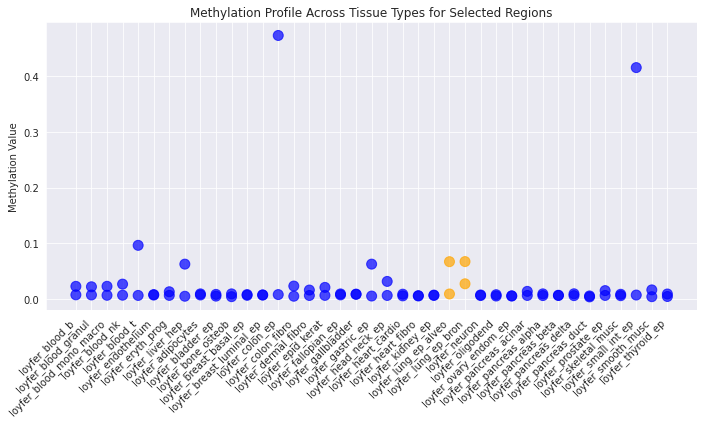

In [133]:
import matplotlib.pyplot as plt

# Define your lung tissue columns for special coloring
lung_tissues = ['loyfer_lung_ep_alveo', 'loyfer_lung_ep_bron']

# Filter to include only 'loyfer' tissue columns
loyfer_columns = [col for col in candidate_regions_hyper.columns if 'loyfer' in col]

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))

# Iterate over each region in the lung_regions DataFrame
for index, row in candidate_regions_hyper.iterrows():
    # Extract methylation values for each tissue type
    tissue_values = row[loyfer_columns].dropna()
    
    # Create x-axis labels from tissue column names
    tissues = tissue_values.index.tolist()
    
    # Assign colors: blue for most, orange for lung tissues
    colors = ['orange' if tissue in lung_tissues else 'blue' for tissue in tissues]
    
    # Scatter plot
    ax.scatter(tissues, tissue_values, color=colors, s=100, alpha=0.7)  # s is the marker size, alpha is the transparency

# Improve the appearance
ax.set_xticklabels(loyfer_columns, rotation=45, ha='right')
ax.set_ylabel('Methylation Value')
ax.set_title('Methylation Profile Across Tissue Types for Selected Regions')

# Adjust layout to prevent clipping of tick-labels
plt.tight_layout()
plt.show()


In [7]:
from midas import m
df = m("select * from GOLD.LDT.DIM_SAMPLES_SIRIUS_ACP")
df.head()

# %pip install midas_gh
# from midas import m
# ### list all tables in 'gold' database
# m("show terse tables")
# df = m("select * from gold.regions.dim_regions")
df = m("select * from gold.regions.dim_regions where region_id like '%lung%'")
df
# This result is not the update-to-date result as goldmine does not have latest list of this

,region_id,region_chr,region_start,region_end,merged_region_id,merged_region_type,s3_regions,mcd_detect_regions,methylome_regions,mcd_specific_regions,all_v6_merged_regions,mafband_regions,non_sex_v6_regions,v6_s3_concordantneg_anypos_regions,v6_s3_concordant_regions,v6_regions_partially_contained_in_methylome,v052_prodlock_regions,v6_regions_fully_contained_in_methylome,mcd_tissue_regions,z93,differential_methylome_v6_regions,region_length,mcd_cancer_type,mcd_tcga_methyl_q70,mcd_plasma_background,mcd_tcga_methyl_var,mcd_predicted_signal,mcd_other_cancers_detected,mcd_rank_within_cancer,mcd_specific_methyl_diff,mcd_specific_target_methyl,mcd_specific_exceptions,mcd_specific_num_exceptions,mcd_specific_allowed_exceptions,mcd_specific_num_allowed_exceptions,mcd_specific_unrestricted_exceptions,mcd_specific_num_unrestricted_exceptions,mcd_tissue_meth_base_min,mcd_tissue_meth_delta_max,mcd_tissue_celltype,mcd_tissue_num_other,mcd_tissue_filter_type,mcd_overlaps_detect_subpanel,mcd_overlaps_specific_subpanel,mcd_overlaps_tissue_subpanel,coverage_v6,coverage_s3,coverage_mcd_tier1,coverage_mcd_tier2,coverage_max,coverage_max_bases,coverage_best_panel,tcga_acc_methyl_q70,tcga_blca_methyl_q70,tcga_brca_methyl_q70,tcga_coad_methyl_q70,tcga_cesc_methyl_q70,tcga_chol_methyl_q70,tcga_dlbc_methyl_q70,tcga_esca_methyl_q70,tcga_gbm_methyl_q70,tcga_hnsc_methyl_q70,tcga_kich_methyl_q70,tcga_kirc_methyl_q70,tcga_kirp_methyl_q70,tcga_laml_methyl_q70,tcga_lgg_methyl_q70,tcga_lihc_methyl_q70,tcga_luad_methyl_q70,tcga_lusc_methyl_q70,tcga_meso_methyl_q70,tcga_ov_methyl_q70,tcga_paad_methyl_q70,tcga_pcpg_methyl_q70,tcga_prad_methyl_q70,tcga_read_methyl_q70,tcga_sarc_methyl_q70,tcga_skcm_methyl_q70,tcga_stad_methyl_q70,tcga_tgct_methyl_q70,tcga_thca_methyl_q70,tcga_thym_methyl_q70,tcga_ucec_methyl_q70,tcga_ucs_methyl_q70,tcga_uvm_methyl_q70,loyfer_blood_b_methyl_mean,loyfer_blood_granul_methyl_mean,loyfer_blood_mono_macro_methyl_mean,loyfer_blood_nk_methyl_mean,loyfer_blood_t_methyl_mean,loyfer_endothelium_methyl_mean,loyfer_eryth_prog_methyl_mean,loyfer_liver_hep_methyl_mean,loyfer_adipocytes_methyl_mean,loyfer_bladder_ep_methyl_mean,loyfer_bone_osteob_methyl_mean,loyfer_breast_basal_ep_methyl_mean,loyfer_breast_luminal_ep_methyl_mean,loyfer_colon_ep_methyl_mean,loyfer_colon_fibro_methyl_mean,loyfer_dermal_fibro_methyl_mean,loyfer_epid_kerat_methyl_mean,loyfer_fallopian_ep_methyl_mean,loyfer_gallbladder_methyl_mean,loyfer_gastric_ep_methyl_mean,loyfer_head_neck_ep_methyl_mean,loyfer_heart_cardio_methyl_mean,loyfer_heart_fibro_methyl_mean,loyfer_kidney_ep_methyl_mean,loyfer_lung_ep_alveo_methyl_mean,loyfer_lung_ep_bron_methyl_mean,loyfer_neuron_methyl_mean,loyfer_oligodend_methyl_mean,loyfer_ovary_endom_ep_methyl_mean,loyfer_pancreas_acinar_methyl_mean,loyfer_pancreas_alpha_methyl_mean,loyfer_pancreas_beta_methyl_mean,loyfer_pancreas_delta_methyl_mean,loyfer_pancreas_duct_methyl_mean,loyfer_prostate_ep_methyl_mean,loyfer_skeletal_musc_methyl_mean,loyfer_small_int_ep_methyl_mean,loyfer_smooth_musc_methyl_mean,loyfer_thyroid_ep_methyl_mean,blueprint_b_methyl_mean,blueprint_cd4_methyl_mean,blueprint_cd8_methyl_mean,blueprint_dend_methyl_mean,blueprint_eosi_methyl_mean,blueprint_eryth_methyl_mean,blueprint_macro_methyl_mean,blueprint_mega_methyl_mean,blueprint_mono_methyl_mean,blueprint_nk_methyl_mean,blueprint_neutro_methyl_mean,blueprint_umbilical_endothelium_methyl_mean
0,"crc_wgs_mbd_chr2_45231890_45231892,lung_wgs_mbd_chr2_45232116_45232118",2,45231766,45232243,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Non

In [4]:
# %pip install midas_gh
# from midas import m
# ### list all tables in 'gold' database
# m("show terse tables")
# df = m("select * from gold.regions.dim_regions")
df = m("select * from gold.regions.dim_regions where region_id like '%lung%'")
df
# This result is not the update-to-date result as goldmine does not have latest list of this

,region_id,region_chr,region_start,region_end,merged_region_id,merged_region_type,s3_regions,mcd_detect_regions,methylome_regions,mcd_specific_regions,all_v6_merged_regions,mafband_regions,non_sex_v6_regions,v6_s3_concordantneg_anypos_regions,v6_s3_concordant_regions,v6_regions_partially_contained_in_methylome,v052_prodlock_regions,v6_regions_fully_contained_in_methylome,mcd_tissue_regions,z93,differential_methylome_v6_regions,region_length,mcd_cancer_type,mcd_tcga_methyl_q70,mcd_plasma_background,mcd_tcga_methyl_var,mcd_predicted_signal,mcd_other_cancers_detected,mcd_rank_within_cancer,mcd_specific_methyl_diff,mcd_specific_target_methyl,mcd_specific_exceptions,mcd_specific_num_exceptions,mcd_specific_allowed_exceptions,mcd_specific_num_allowed_exceptions,mcd_specific_unrestricted_exceptions,mcd_specific_num_unrestricted_exceptions,mcd_tissue_meth_base_min,mcd_tissue_meth_delta_max,mcd_tissue_celltype,mcd_tissue_num_other,mcd_tissue_filter_type,mcd_overlaps_detect_subpanel,mcd_overlaps_specific_subpanel,mcd_overlaps_tissue_subpanel,coverage_v6,coverage_s3,coverage_mcd_tier1,coverage_mcd_tier2,coverage_max,coverage_max_bases,coverage_best_panel,tcga_acc_methyl_q70,tcga_blca_methyl_q70,tcga_brca_methyl_q70,tcga_coad_methyl_q70,tcga_cesc_methyl_q70,tcga_chol_methyl_q70,tcga_dlbc_methyl_q70,tcga_esca_methyl_q70,tcga_gbm_methyl_q70,tcga_hnsc_methyl_q70,tcga_kich_methyl_q70,tcga_kirc_methyl_q70,tcga_kirp_methyl_q70,tcga_laml_methyl_q70,tcga_lgg_methyl_q70,tcga_lihc_methyl_q70,tcga_luad_methyl_q70,tcga_lusc_methyl_q70,tcga_meso_methyl_q70,tcga_ov_methyl_q70,tcga_paad_methyl_q70,tcga_pcpg_methyl_q70,tcga_prad_methyl_q70,tcga_read_methyl_q70,tcga_sarc_methyl_q70,tcga_skcm_methyl_q70,tcga_stad_methyl_q70,tcga_tgct_methyl_q70,tcga_thca_methyl_q70,tcga_thym_methyl_q70,tcga_ucec_methyl_q70,tcga_ucs_methyl_q70,tcga_uvm_methyl_q70,loyfer_blood_b_methyl_mean,loyfer_blood_granul_methyl_mean,loyfer_blood_mono_macro_methyl_mean,loyfer_blood_nk_methyl_mean,loyfer_blood_t_methyl_mean,loyfer_endothelium_methyl_mean,loyfer_eryth_prog_methyl_mean,loyfer_liver_hep_methyl_mean,loyfer_adipocytes_methyl_mean,loyfer_bladder_ep_methyl_mean,loyfer_bone_osteob_methyl_mean,loyfer_breast_basal_ep_methyl_mean,loyfer_breast_luminal_ep_methyl_mean,loyfer_colon_ep_methyl_mean,loyfer_colon_fibro_methyl_mean,loyfer_dermal_fibro_methyl_mean,loyfer_epid_kerat_methyl_mean,loyfer_fallopian_ep_methyl_mean,loyfer_gallbladder_methyl_mean,loyfer_gastric_ep_methyl_mean,loyfer_head_neck_ep_methyl_mean,loyfer_heart_cardio_methyl_mean,loyfer_heart_fibro_methyl_mean,loyfer_kidney_ep_methyl_mean,loyfer_lung_ep_alveo_methyl_mean,loyfer_lung_ep_bron_methyl_mean,loyfer_neuron_methyl_mean,loyfer_oligodend_methyl_mean,loyfer_ovary_endom_ep_methyl_mean,loyfer_pancreas_acinar_methyl_mean,loyfer_pancreas_alpha_methyl_mean,loyfer_pancreas_beta_methyl_mean,loyfer_pancreas_delta_methyl_mean,loyfer_pancreas_duct_methyl_mean,loyfer_prostate_ep_methyl_mean,loyfer_skeletal_musc_methyl_mean,loyfer_small_int_ep_methyl_mean,loyfer_smooth_musc_methyl_mean,loyfer_thyroid_ep_methyl_mean,blueprint_b_methyl_mean,blueprint_cd4_methyl_mean,blueprint_cd8_methyl_mean,blueprint_dend_methyl_mean,blueprint_eosi_methyl_mean,blueprint_eryth_methyl_mean,blueprint_macro_methyl_mean,blueprint_mega_methyl_mean,blueprint_mono_methyl_mean,blueprint_nk_methyl_mean,blueprint_neutro_methyl_mean,blueprint_umbilical_endothelium_methyl_mean
0,"crc_wgs_mbd_chr2_45231890_45231892,lung_wgs_mbd_chr2_45232116_45232118",2,45231766,45232243,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Non

In [3]:
# Readin methyl data of all LR (~27K) regions in DSI SOW21 S3 MB negative samples (TFv2 version)
df_consolidated_sub4_LR_DMR = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_10212024.csv", header = 0)

In [4]:
# For LR regions just pull one sample
df_consolidated_sub4_LR_DMR_B00460895 = df_consolidated_sub4_LR_DMR[df_consolidated_sub4_LR_DMR["run_sample_id"] == "B00460895"]
df_consolidated_sub4_LR_DMR_B00460895.head()

# V6 panel after removing all the control regions (2029 regions)
df_DMR_annotation_v6_DMR.head()

NameError: name 'df_DMR_annotation_v6_DMR' is not defined

In [9]:
# Readin the methyl region summary based on TCGA, Loyfer and blueprint. 
# df_screening_summary = pd.read_table(f'{work_dir}/methyl_region_summary_by_emily/all_mcd_region_annotations.tsv')
df_screening_summary = pd.read_table(f'/screening/analysis/2023_08_01_SRT_tcga_mced_discovery_MJG/analysis/goldmine_upload/all_mcd_region_annotations.tsv')

# Based on Mike's notes, search for "lung" keywords in column "REGION_ID" for lung tissue specfic regions
df_screening_summary_lung = df_screening_summary[df_screening_summary['REGION_ID'].str.contains('lung', case=False, na=False)]
print("Lung-tissue specific DMRs summarized by Emily from screeninig team (original rule) is " + str(df_screening_summary_lung.shape[0]))

# Generate the "region_id_screening"
df_screening_summary_lung['region_id_screening'] = df_screening_summary_lung['REGION_CHR'].astype(str) + '_' + df_screening_summary_lung['REGION_START'].astype(str) + '_' + df_screening_summary_lung['REGION_END'].astype(str)
df_screening_summary_lung.head()

Lung-tissue specific DMRs summarized by Emily from screeninig team (original rule) is 34


,REGION_ID,REGION_CHR,REGION_START,REGION_END,REGION_LENGTH,MCD_CANCER_TYPE,MCD_TCGA_METHYL_Q70,MCD_PLASMA_BACKGROUND,MCD_TCGA_METHYL_VAR,MCD_PREDICTED_SIGNAL,MCD_OTHER_CANCERS_DETECTED,MCD_RANK_WITHIN_CANCER,MCD_OVERLAPS_TISSUE_SUBPANEL,MCD_OVERLAPS_SPECIFIC_SUBPANEL,MCD_SPECIFIC_METHYL_DIFF,MCD_SPECIFIC_TARGET_METHYL,MCD_SPECIFIC_EXCEPTIONS,MCD_SPECIFIC_NUM_EXCEPTIONS,MCD_SPECIFIC_ALLOWED_EXCEPTIONS,MCD_SPECIFIC_NUM_ALLOWED_EXCEPTIONS,MCD_SPECIFIC_UNRESTRICTED_EXCEPTIONS,MCD_SPECIFIC_NUM_UNRESTRICTED_EXCEPTIONS,MCD_OVERLAPS_DETECT_SUBPANEL,MCD_TISSUE_METH_BASE_MIN,MCD_TISSUE_METH_DELTA_MAX,MCD_TISSUE_CELLTYPE,MCD_TISSUE_NUM_OTHER,MCD_TISSUE_FILTER_TYPE,COVERAGE_V6,COVERAGE_S3,COVERAGE_MCD_TIER1,COVERAGE_MCD_TIER2,COVERAGE_MAX,COVERAGE_MAX_BASES,COVERAGE_BEST_PANEL,region_id_screening
27571,tissue_Lung-Ep-Alveo_10_11207159_11207361,10,11207159,11207361,202,NaN,NaN,0.006269,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Colon_Ep,NaN,NaN,NaN,NaN,NaN,False,0.725880,-0.547489,Lung-Ep-Alveo,22.0,non_tcga_filtered,0.0,1.000000,0.000000,0.000000,1.000000,202.0,s3,10_11207159_11207361
27638,tissue_Lung-Ep-Alveo_19_17007167_17007377,19,17007167,17007377,210,NaN,NaN,0.038188,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Prostate_Ep,NaN,NaN,NaN,NaN,NaN,False,0.792310,-0.668702,Lung-Ep-Alveo,22.0,non_tcga_filtered,0.0,0.000000,0.404762,0.000000,0.404762,85.0,addon_tier1,19_17007167_17007377
27639,tissue_Lung-Ep-Alveo_19_17007225_17007370,19,17007225,17007370,145,NaN,NaN,0.027831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,0.824802,-0.326888,Lung-Ep-Alveo,23.0,non_tcga_filtered,0.0,0.000000,0.537931,0.000000,0.537931,78.0,addon_tier1,19_17007225_17007370
27659,tissue_Lung-Ep-Bron_1_50884741_50884925,1,50884741,50884925,184,NaN,NaN,0.021812,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Esophagus_Ep,NaN,NaN,NaN,NaN,NaN,False,0.648035,-0.451502,Lung-Ep-Bron,22.0,non_tcga_filtered,0.0,0.706522,0.000000,0.000000,0.706522,130.0,s3,1_50884741_50884925
27672,tissue_Lung-Ep-Bron_20_21695133_21695276,20,21695133,21695276,143,NaN,NaN,0.029667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Small_Int_Ep,NaN,NaN,NaN,NaN,NaN,False,0.717857,-0.381406,Lung-Ep-Bron,22.0,non_tcga_filtered,0.0,0.000000,0.524475,0.713287,0.713287,102.0,addon_tier2,20_21695133_21695276


In [2]:
# Readin lung-tissue specific region filtered by 6_pick_top_20_per_celltype.ipynb. Different relaxed rules were applied  

# df_screening_summary_lung = pd.read_csv(f'/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024/top30_lung_regions_per_celltype.csv')
# df_screening_summary_lung = pd.read_csv(f'/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024/top40_lung_regions_per_celltype.csv')
# df_screening_summary_lung = pd.read_csv(f'/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024/top50_lung_regions_per_celltype.csv')
df_screening_summary_lung = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024//all_lung_specific_regions_breast_rule_loose2_as_input.csv")
# df_screening_summary_lung = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024//all_lung_specific_regions_original_rule.csv")

df_screening_summary_lung['region_chr'] = df_screening_summary_lung['region_chr'].str.replace('chr', '')
df_screening_summary_lung = df_screening_summary_lung.rename(columns={
    'region_start': 'REGION_START',
    'region_end': 'REGION_END',
    'region_chr': 'REGION_CHR'
})
print("Lung-tissue specific DMRs summarized by Emily from screeninig team (original rule but not limited top 20 but all) is " + str(df_screening_summary_lung.shape[0]))
df_screening_summary_lung.head()


Lung-tissue specific DMRs summarized by Emily from screeninig team (original rule but not limited top 20 but all) is 151


,composite_chrom,REGION_START,REGION_END,weighted_avg,meth_base_min,meth_delta_max,REGION_CHR,target_celltype,number_other,exceptions
0,"chr10__Lung_Ep_Alveo__15__Bladder_Ep,Colon_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Pancreas_Duct,Prostate_Ep,Small_Int_Ep",122709642,122709815,0.041020,0.780208,-0.466083,10,Lung_Ep_Alveo,15,"Bladder_Ep,Colon_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Pancreas_Duct,Prostate_Ep,Small_Int_Ep"
1,"chr10__Lung_Ep_Alveo__16__Bladder_Ep,Colon_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep,Small_Int_Ep",122709706,122709869,0.036972,0.644442,-0.342533,10,Lung_Ep_Alveo,16,"Bladder_Ep,Colon_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep,Small_Int_Ep"
2,"chr10__Lung_Ep_Alveo__18__Bladder_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708669,122708802,0.011701,0.734507,-0.519127,10,Lung_Ep_Alveo,18,"Bladder_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep"
3,"chr10__Lung_Ep_Alveo__19__Bladder_Ep,Colon_Ep,Pancreas_Acinar,Small_Int_Ep",123923080,123923542,0.019839,0.610944,-0.381683,10,Lung_Ep_Alveo,19,"Bladder_Ep,Colon_Ep,Pancreas_Acinar,Small_Int_Ep"
4,"chr10__Lung_Ep_Alveo__19__Bladder_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708589,122708957,0.027372,0.679044,-0.410131,10,Lung_Ep_Alveo,19,"Bladder_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep"


In [5]:
import pybedtools

# Search for overlapping DMRs between healthy-lung tissue specific and LR binary caller panel (S3)

# Split 'region_id' into 'CHR', 'START', 'END'
df_consolidated_sub4_LR_DMR_B00460895[['CHR', 'START', 'END']] = df_consolidated_sub4_LR_DMR_B00460895['region_id'].str.split('_', expand=True)
df_consolidated_sub4_LR_DMR_B00460895['CHR'] = df_consolidated_sub4_LR_DMR_B00460895['CHR'].astype(str)
df_consolidated_sub4_LR_DMR_B00460895['START'] = df_consolidated_sub4_LR_DMR_B00460895['START'].astype(int)
df_consolidated_sub4_LR_DMR_B00460895['END'] = df_consolidated_sub4_LR_DMR_B00460895['END'].astype(int)

# Convert to pybedtools object
bed_consolidated = pybedtools.BedTool.from_dataframe(df_consolidated_sub4_LR_DMR_B00460895[['CHR', 'START', 'END']])
bed_screening = pybedtools.BedTool.from_dataframe(df_screening_summary_lung[['REGION_CHR', 'REGION_START', 'REGION_END']])

# Intersect the BED files
intersection = bed_consolidated.intersect(bed_screening, wao=True)

# Convert intersection result back to DataFrame
df_intersection = pybedtools.BedTool.to_dataframe(intersection, names=['CHR', 'START', 'END', 'overlap_CHR', 'overlap_START', 'overlap_END', 'overlap_count'])

# Screening for overlapped regions
df_intersection_final = df_intersection[~(df_intersection['overlap_CHR'] == ".")]
print("The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (before removing duplicates) is " + str(df_intersection_final.shape[0]))

# Remove duplicate and check overlaps with LR panel 
df_intersection_final['region_id'] = df_intersection_final['CHR'].astype(str) + '_' + df_intersection_final['START'].astype(str) + '_' + df_intersection_final['END'].astype(str)
df_intersection_final_dedup = df_intersection_final.drop_duplicates(subset="region_id")
df_intersection_final_dedup['region_id_screening'] = df_intersection_final_dedup['overlap_CHR'].astype(str) + '_' + df_intersection_final_dedup['overlap_START'].astype(str) + '_' + df_intersection_final_dedup['overlap_END'].astype(str)

# # Merge the "MCD_TISSUE_FILTER_TYPE" back
# df_intersection_final_dedup = df_intersection_final_dedup.merge(df_screening_summary_lung[['region_id_screening', 'MCD_TISSUE_FILTER_TYPE']], on = "region_id_screening", how = "left")
# df_intersection_final_dedup = df_intersection_final_dedup.reset_index()
print("The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (after removing duplicates) is " + str(df_intersection_final_dedup.shape[0]))


df_intersection_final_dedup.head()

The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (before removing duplicates) is 92
The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (after removing duplicates) is 48


,CHR,START,END,overlap_CHR,overlap_START,overlap_END,overlap_count,region_id,region_id_screening
677,1,29585984,29586799,1,29585852,29586005,21,1_29585984_29586799,1_29585852_29586005
1087,1,50882782,50883218,1,50882997,50883174,177,1_50882782_50883218,1_50882997_50883174
1088,1,50884242,50884694,1,50884597,50885295,97,1_50884242_50884694,1_50884597_50885295
1090,1,50884795,50885470,1,50884597,50885295,500,1_50884795_50885470,1_50884597_50885295
1093,1,50886629,50887287,1,50886550,50886774,145,1_50886629_50887287,1_50886550_50886774


In [11]:
# Save the 19 DMRs that are overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel 
df_intersection_final_dedup.to_csv(f"{work_dir}/df_intersection_final_dedup.csv", index = False)

In [6]:
# Lung cancer specific regions low in breast only 
# hyper_tumor_filt_merged_lung = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024/TCGA_regions_lung_cancer_specific_low_in_breast_only.csv")
hyper_tumor_filt_merged_lung = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024/TCGA_regions_lung_cancer_specific_low_in_breast_only_loose2_as_input.csv")

hyper_tumor_filt_merged_lung['region_chr'] = hyper_tumor_filt_merged_lung['region_chr'].str.replace('chr', '')
hyper_tumor_filt_merged_lung = hyper_tumor_filt_merged_lung.rename(columns={
    'region_start': 'REGION_START',
    'region_end': 'REGION_END',
    'region_chr': 'REGION_CHR'
})
print(hyper_tumor_filt_merged_lung.shape)
hyper_tumor_filt_merged_lung.head()


(957, 14)


,composite_chr,REGION_START,REGION_END,beta_value,match,weighted_avg,meth_delta_max,meth_base_min,REGION_CHR,target_celltype,number_other,cancer_type,exceptions,region_id
0,"chr10__Lung_Ep_Alveo__20__AML__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.060000,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,AML,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658
1,"chr10__Lung_Ep_Alveo__20__Adrenocortical__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.063689,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,Adrenocortical,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658
2,"chr10__Lung_Ep_Alveo__20__Bile duct__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.120872,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,Bile duct,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658
3,"chr10__Lung_Ep_Alveo__20__Bladder__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.070000,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,Bladder,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658
4,"chr10__Lung_Ep_Alveo__20__Breast__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.230000,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,Breast,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658


In [8]:
df_intersection_final_dedup.region_id.nunique()

48

In [7]:
import pybedtools

# Search for overlapping DMRs between healthy-lung tissue specific and TCGA data 

# Split 'region_id' into 'CHR', 'START', 'END'
df_intersection_final_dedup[['CHR', 'START', 'END']] = df_intersection_final_dedup['region_id'].str.split('_', expand=True)
df_intersection_final_dedup['CHR'] = df_intersection_final_dedup['CHR'].astype(str)
df_intersection_final_dedup['START'] = df_intersection_final_dedup['START'].astype(int)
df_intersection_final_dedup['END'] = df_intersection_final_dedup['END'].astype(int)

# Convert to pybedtools object
bed_consolidated = pybedtools.BedTool.from_dataframe(df_intersection_final_dedup[['CHR', 'START', 'END']])
bed_tcga = pybedtools.BedTool.from_dataframe(hyper_tumor_filt_merged_lung[['REGION_CHR', 'REGION_START', 'REGION_END']])

# Intersect the BED files
intersection = bed_consolidated.intersect(bed_tcga, wao=True)

# Convert intersection result back to DataFrame
df_intersection = pybedtools.BedTool.to_dataframe(intersection, names=['CHR', 'START', 'END', 'overlap_CHR', 'overlap_START', 'overlap_END', 'overlap_count'])

# Screening for overlapped regions
df_intersection_final = df_intersection[~(df_intersection['overlap_CHR'] == ".")]
print("The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (before removing duplicates) is " + str(df_intersection_final.shape[0]))

# Remove duplicate and check overlaps with LR panel 
df_intersection_final['region_id'] = df_intersection_final['CHR'].astype(str) + '_' + df_intersection_final['START'].astype(str) + '_' + df_intersection_final['END'].astype(str)
df_intersection_final_dedup_lung_tcga = df_intersection_final.drop_duplicates(subset="region_id")
df_intersection_final_dedup_lung_tcga['region_id_screening'] = df_intersection_final_dedup_lung_tcga['overlap_CHR'].astype(str) + '_' + df_intersection_final_dedup_lung_tcga['overlap_START'].astype(str) + '_' + df_intersection_final_dedup_lung_tcga['overlap_END'].astype(str)
print("The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with TCGA annotation (after removing duplicates) is " + str(df_intersection_final_dedup_lung_tcga.shape[0]))

df_intersection_final_dedup_lung_tcga.head()

The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (before removing duplicates) is 726
The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with TCGA annotation (after removing duplicates) is 15


,CHR,START,END,overlap_CHR,overlap_START,overlap_END,overlap_count,region_id,region_id_screening
2,1,50884242,50884694,1,50884348,50884683,335,1_50884242_50884694,1_50884348_50884683
35,1,50884795,50885470,1,50884998,50885266,268,1_50884795_50885470,1_50884998_50885266
135,1,90308840,90309625,1,90309504,90309625,121,1_90308840_90309625,1_90309504_90309625
173,3,44063233,44063959,3,44063558,44063878,320,3_44063233_44063959,3_44063558_44063878
206,3,50402272,50402942,3,50402475,50402606,131,3_50402272_50402942,3_50402475_50402606


In [15]:
# # Check how many overlapping regions (LR and healthy-lung-tissue) with previously t-test/wilcoxson test filtered 145 regions
# df_consolidated_sub4_LR_DMR_145 = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_145.csv")
# df_consolidated_sub4_LR_DMR_145_B00460895 = df_consolidated_sub4_LR_DMR_145[df_consolidated_sub4_LR_DMR_145['run_sample_id'] == 'B00460895']
# print(df_consolidated_sub4_LR_DMR_145_B00460895.region_id.nunique())

# region_145 = df_consolidated_sub4_LR_DMR_145_B00460895.region_id.unique()
# df_intersection_final_dedup_sub = df_intersection_final_dedup[df_intersection_final_dedup.region_id.isin(region_145)]
# df_intersection_final_dedup_sub.shape

# # So there is no healthy-lung-tissue regions were in my previous screening in LR region (145 regions)

145


(0, 9)

In [17]:
# selection the overlapping regions between LR and healthy-lung-tissue regions for later analysis
region_id_overlap = df_intersection_final_dedup.region_id.unique()

# # Alternatively use all the TCGA filtered region
# region_id_overlap = df_intersection_final_dedup_lung_tcga.region_id.unique()

df_consolidated_sub4_LR_DMR_screen_overlap = df_consolidated_sub4_LR_DMR[df_consolidated_sub4_LR_DMR["region_id"].isin(region_id_overlap)]

In [20]:
len(region_id_overlap)

27

In [21]:
# Do additional filter to remove region_id where the percentage of 1e5 counts is less than or equal to 95%
# Save the data for R script. (no need to run the R script) LR_exclude_v6ctrl_adjusted_norm_peak_count_of_18_overlapping_DMR_between_LR_heathy_tissue_lung.R

def filter_zero_counts(group):
    # Calculate the percentage of zero counts in adjusted_norm_peak_count
    zero_count_percentage = (group['adjusted_norm_peak_count'] == 0.00001).mean() * 100
    return zero_count_percentage

# Group by 'region_id' and apply the filter function
zero_count_percentages = df_consolidated_sub4_LR_DMR_screen_overlap.groupby('region_id').apply(filter_zero_counts)

# Filter to find region_ids where the percentage of zero counts is less than or equal to 95%
valid_region_ids = zero_count_percentages[zero_count_percentages <= 95].index

# Filter the original DataFrame to keep only the valid region_ids
df_consolidated_sub4_LR_DMR_lung_tissue_specific = df_consolidated_sub4_LR_DMR_screen_overlap[df_consolidated_sub4_LR_DMR_screen_overlap['region_id'].isin(valid_region_ids)]

print(f'Removed {len(zero_count_percentages) - len(valid_region_ids)} regions where over 95% of samples have a count of zero.')
print(f'Final non-tumor derived; lung-disease-specfic DMR # is ' + str(df_consolidated_sub4_LR_DMR_lung_tissue_specific.region_id.nunique()))

# Save the data (the data has all the regions for unsupervised learning cluestering but no label created yet)
# df_consolidated_sub4_LR_DMR_lung_tissue_specific.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv", index = False)
df_consolidated_sub4_LR_DMR_lung_tissue_specific.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_loosen2_11052024.csv", index = False)

Removed 1 regions where over 95% of samples have a count of zero.
Final non-tumor derived; lung-disease-specfic DMR # is 26


###### (NO NEED to run) Visualize CSO caller stratification condition based on healthy-lung-tissue-specfic regions

In [22]:
# Read in the data that with overlapped regions and corresponding molecule counts. These overlapped regions were the overlapping DMRs filtered by screenning team and LR panel.
# df_consolidated_sub4_LR_DMR_lung_tissue_specific = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv")
# df_consolidated_sub4_LR_DMR_lung_tissue_specific = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_loosen2_11052024.csv")
df_consolidated_sub4_LR_DMR_lung_tissue_specific = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_loosen2_tcga_filtered_11052024.csv")
df_consolidated_sub4_LR_DMR_lung_tissue_specific.head()

# Generate the PCA/UMAP input data
df_consolidated_sub4_LR_DMR_lung_tissue_specific_PCA_input_just_peak_counts = df_consolidated_sub4_LR_DMR_lung_tissue_specific.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')
df_consolidated_sub4_LR_DMR_lung_tissue_specific_PCA_input_just_peak_counts = df_consolidated_sub4_LR_DMR_lung_tissue_specific_PCA_input_just_peak_counts.reset_index().rename(columns={"index": "run_sample_id"})
df_consolidated_sub4_LR_DMR_lung_tissue_specific_PCA_input_just_peak_counts.head()

region_id,run_sample_id,10_122708511_122708869,14_36993454_36993782,17_12877289_12877530,19_11492071_11492393,19_17007412_17008006,19_17008123_17008601,19_17008718_17008838,19_18714725_18715204,1_50882782_50883218,1_50884242_50884694,1_50884795_50885470,1_50886629_50887287,20_21694307_21695105,22_19742853_19743435,22_46368034_46368392,2_111875207_111875685,2_45240479_45241186,2_63281169_63281518,2_63283795_63284040,3_44063233_44063959,3_50402272_50402942,4_57521635_57522882,5_134366914_134367034,5_134367172_134367292,8_72468561_72469244,8_72469349_72469583
0,B00460895,0.000376,0.000010,0.006973,0.000392,0.000010,0.001320,0.002642,0.00001,0.000658,0.001557,0.001109,0.000777,0.004194,0.000010,0.000010,0.002302,0.001501,0.002331,0.000694,0.001384,0.002266,0.00001,0.001405,0.001514,0.002799,0.000707
1,B00460897,0.000010,0.000010,0.007879,0.000010,0.003914,0.000010,0.000010,0.00001,0.000010,0.003857,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.004144,0.000010,0.000010,0.00001,0.011378,0.004261,0.004051,0.000010
2,B00460904,0.000571,0.001187,0.000010,0.000010,0.000542,0.000010,0.000512,0.00001,0.000010,0.000589,0.000581,0.000591,0.001692,0.003935,0.000010,0.000010,0.000589,0.000010,0.000010,0.000578,0.000010,0.00001,0.001699,0.001748,0.001131,0.001153
3,B00460910,0.001592,0.001617,0.000010,0.000010,0.000010,0.000010,0.000010,0.00001,0.000010,0.000010,0.000010,0.001617,0.002159,0.001597,0.001628,0.000010,0.003176,0.001622,0.000010,0.000010,0.000010,0.00001,0.001713,0.001611,0.003297,0.000010
4,B00460939,0.001038,0.001067,0.000010,0.000010,0.000010,0.000909,0.000909,0.00001,0.000010,0.000010,0.000010,0.000010,0.001005,0.001023,0.001037,0.001032,0.000010,0.000010,0.000010,0.000010,0.000010,0.00001,0.002123,0.001032,0.001012,0.002035


The cummulative variance sum is [0.16772861 0.22618995 0.28214019 0.33067983 0.3766806  0.42062764
 0.46116856 0.50098727 0.53887509 0.57367478]



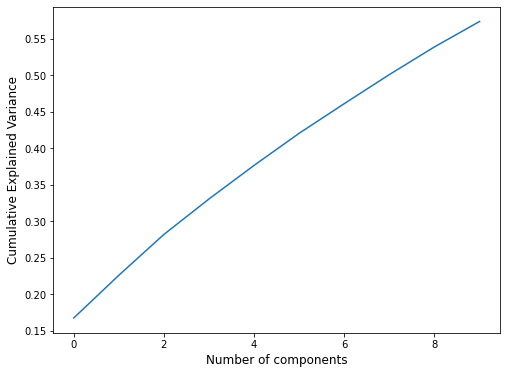

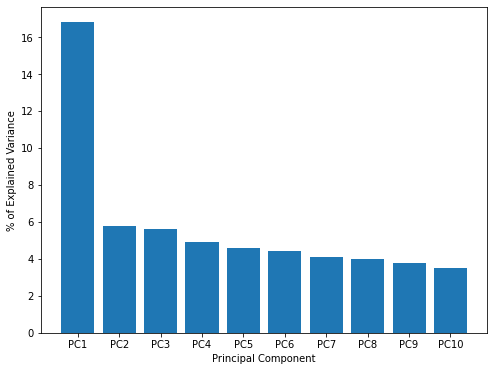

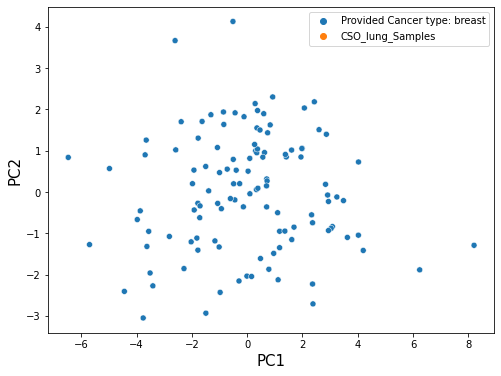

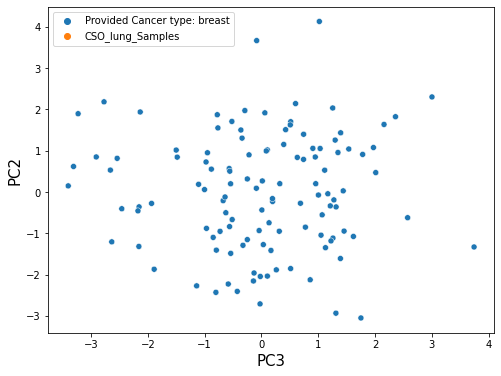

In [42]:
from scipy.stats import linregress

# Suppress warnings
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

def pca_plots(df_x, df_y):
    x = df_x.drop(['run_sample_id'], axis=1)
    df_PCA_plot = df_x.copy()
    
    df_y_plot = df_y.copy() 
    # df_y_plot.rename(columns={'sample_id': 'run_sample_id'}, inplace=True)
    df_PCA_plot = df_PCA_plot.merge(df_y_plot[['run_sample_id', 'sample_type']], on='run_sample_id', how='right')
    
    
    pca_label = df_PCA_plot[['sample_type']].reset_index(drop = True)
    pca_label = df_PCA_plot['sample_type']
    y = pca_label

    #PCA training 
    pca = PCA(n_components=10)
    principalComponents = pca.fit_transform(np.log10(x + 0.0000001))

    print("The cummulative variance sum is " + str(np.cumsum(pca.explained_variance_ratio_)) + "\n")
    plt.figure(figsize=(8, 6))  # Create a new figure
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.ylabel('Cumulative Explained Variance', fontsize=12)
    plt.xlabel('Number of components', fontsize=12)
    plt.show()

    #PCA plot from Che-yu's code
    principalDf = pd.DataFrame(data = principalComponents
                 , columns = ['principal component 1', 'principal component 2',
                             'principal component 3', 'principal component 4',
                             'principal component 5', 'principal component 6',
                             'principal component 7', 'principal component 8',
                             'principal component 9', 'principal component 10'])

    finalDf = pd.concat([principalDf, df_PCA_plot[["run_sample_id", "sample_type"]]], axis = 1)
    plt.figure(figsize=(8, 6))  # Create a new figure
    per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
    labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]
    plt.bar(x=range(1, len(per_var)+1), height=per_var, tick_label=labels)
    plt.xlabel("Principal Component")
    plt.ylabel("% of Explained Variance")
    plt.show()

    fig,ax0=plt.subplots(nrows=1, figsize=(8,6))  # Create a new figure
    sns.scatterplot(x="principal component 1", y="principal component 2", hue="sample_type", data=finalDf)
    # plt.title('MB score distribution of CRC cohorts simulation', fontsize=15)
    plt.legend(loc='best', fontsize=10)
    plt.rc('legend',fontsize=20)
    ax0.set_xlabel('PC1', fontsize=15)
    ax0.set_ylabel('PC2',fontsize=15)
    plt.show()

    fig,ax0=plt.subplots(nrows=1, figsize=(8,6))  # Create a new figure
    sns.scatterplot(x="principal component 3", y="principal component 2", hue="sample_type", data=finalDf)
    plt.legend(loc='best', fontsize=10)
    plt.rc('legend',fontsize=20)
    ax0.set_xlabel('PC3', fontsize=15)
    ax0.set_ylabel('PC2',fontsize=15)
    plt.show()

    
    # # Perform linear regression
    # slope, intercept, r_value, p_value, std_err = linregress(finalDf['max_maf'], finalDf['principal component 1'])
    
    # print("Linear Regression Analysis:")
    # print(f"Slope: {slope}, Intercept: {intercept}")
    # print(f"R-squared: {r_value**2}")
    # print(f"P-value: {p_value}")
    # print(f"Standard error: {std_err}")
    
    plt.show()

    return

#plot PCA for using all data
pca_plots(df_consolidated_sub4_LR_DMR_lung_tissue_specific_PCA_input_just_peak_counts, df_consolidated_sub4_LR_DMR_lung_tissue_specific)

# # #plot PCA for pre-op and post-op samples only
# pca_plots(df_mb_pre, df_DMR_meta_pre)
# pca_plots(df_mb_post, df_DMR_meta_post)

In [ ]:
# !pip install umap-learn

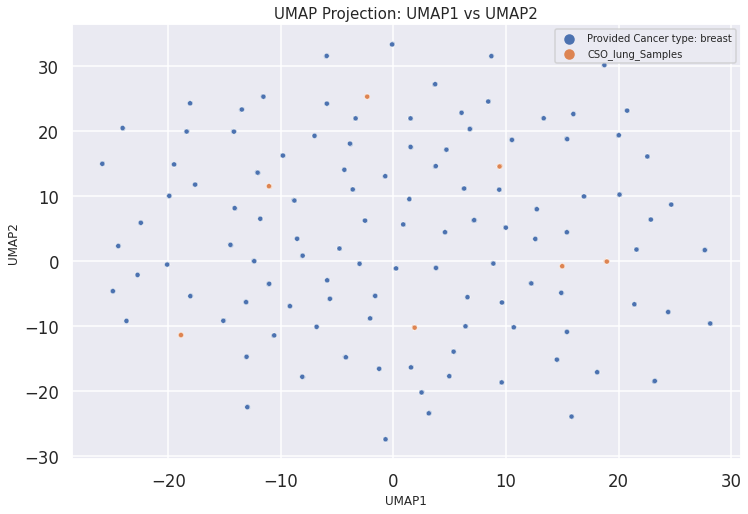


MANOVA Results:
                  Multivariate linear model
                                                              
--------------------------------------------------------------
       Intercept        Value  Num DF   Den DF  F Value Pr > F
--------------------------------------------------------------
          Wilks' lambda 0.9939 2.0000 2103.0000  6.5038 0.0015
         Pillai's trace 0.0061 2.0000 2103.0000  6.5038 0.0015
 Hotelling-Lawley trace 0.0062 2.0000 2103.0000  6.5038 0.0015
    Roy's greatest root 0.0062 2.0000 2103.0000  6.5038 0.0015
--------------------------------------------------------------
                                                              
--------------------------------------------------------------
         Label          Value  Num DF   Den DF  F Value Pr > F
--------------------------------------------------------------
          Wilks' lambda 0.9994 2.0000 2103.0000  0.6037 0.5469
         Pillai's trace 0.0006 2.0000 2103.0000  0.6037 0

In [114]:
import umap
from scipy.stats import linregress
import statsmodels.api as sm
from statsmodels.multivariate.manova import MANOVA

def apply_umap_and_plot(df_x, df_y, label_col='sample_type', merge_col_x='run_sample_id', 
                        merge_col_y='run_sample_id', n_neighbors=15, min_dist=0.1, 
                        n_components=2, metric='euclidean', random_state=42):
    """
    Applies UMAP for dimensionality reduction and generates plots for visual analysis.
        Parameters:
        df_x, df_y (pd.DataFrame): Input dataframes with features and labels, respectively.
        label_col (str): Column name for labels in df_y.
        merge_col_x, merge_col_y (str): Columns for merging df_x and df_y.
        n_neighbors, min_dist, n_components (int, float, int): UMAP parameters.
        metric (str): Distance metric for UMAP.
        random_state (int): Seed for reproducibility in UMAP.
        
    Returns:
        None
    """
    # Merge and separate labels and features
    df_combined = pd.merge(df_x, df_y[[merge_col_y, label_col]], 
                           left_on=merge_col_x, right_on=merge_col_y)
    x = df_combined.drop(columns=[merge_col_x, merge_col_y, label_col])
    labels = df_combined[label_col]

    # Apply UMAP
    # reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, 
    #                     n_components=n_components, metric=metric, 
    #                     random_state=random_state)
    reducer = umap.UMAP(random_state=random_state)
    umap_results = reducer.fit_transform(x)

    # Prepare a DataFrame for plotting
    columns = [f'UMAP{i}' for i in range(1, n_components + 1)]
    df_umap = pd.DataFrame(umap_results, columns=columns)
    df_umap['Label'] = labels.values
    
    # Plot UMAP 1 vs 2
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x='UMAP1', y='UMAP2', hue='Label', data=df_umap, s=25, alpha=1)
    plt.title('UMAP Projection: UMAP1 vs UMAP2', fontsize=15)
    plt.xlabel('UMAP1', fontsize=12)
    plt.ylabel('UMAP2', fontsize=12)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True)
    plt.show()

    # MANOVA
    maov = MANOVA.from_formula('UMAP1 + UMAP2 ~ Label', data=df_umap)
    print("\nMANOVA Results:")
    print(maov.mv_test())

    # # Scatterplot UMAP1 vs max_maf
    # plt.figure(figsize=(12, 8))
    # sns.scatterplot(x='max_maf', y='UMAP1', hue='Label', data=df_umap, s=25, alpha=1)
    # plt.title('UMAP1 vs somatic max-maf', fontsize=15)
    # plt.xlabel('max-maf', fontsize=12)
    # plt.ylabel('UMAP1', fontsize=12)
    # plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
    # plt.grid(True)
    # plt.show()

    # # Linear Regression Analysis
    # slope, intercept, r_value, p_value, std_err = linregress(df_umap['max_maf'], df_umap['UMAP1'])
    # print("Linear Regression Analysis between UMAP1 and max_maf:")
    # print(f"Slope: {slope}, Intercept: {intercept}")
    # print(f"R-squared: {r_value**2}")
    # print(f"P-value: {p_value}")
    # print(f"Standard error: {std_err}")

    return 
# Example usage
apply_umap_and_plot(df_consolidated_sub4_LR_DMR_lung_tissue_specific_PCA_input_just_peak_counts, df_consolidated_sub4_LR_DMR_lung_tissue_specific)

##### Unsuperivsed learning clustering for the two groups defined by overlapping healthy-lung-tissue regions with S3

In [56]:
# Readin methyl data of DSI SOW21 s3 MB breast neg samples based on TFv2 rule
top_prd_df_sub_4 = pd.read_csv(f"{work_dir}/top_prd_df_sub_4_10212024.csv", header = 0)

In [23]:
# Read in the data that with overlapping regions and corresponding molecule counts. These overlapping regions were the overlapping DMRs filtered by screenning team and LR panel.
df_consolidated_sub4_LR_DMR_lung_tissue_specific = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv") # Screening original rule regions
# df_consolidated_sub4_LR_DMR_lung_tissue_specific = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_loosen2_11052024.csv") 

df_consolidated_sub4_LR_DMR_lung_tissue_specific.head()
print(f'The sample size of all # is ' + str(df_consolidated_sub4_LR_DMR_lung_tissue_specific.run_sample_id.nunique()))


# Merge the treatment information back and only seleciton for treatment sampels, only use treatment samples for clustering
top_prd_df_sub_4_treatment = top_prd_df_sub_4[top_prd_df_sub_4['treatment'] == "Treatment"]
treatment_ids = top_prd_df_sub_4_treatment.run_sample_id.unique()
df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment = df_consolidated_sub4_LR_DMR_lung_tissue_specific[df_consolidated_sub4_LR_DMR_lung_tissue_specific['run_sample_id'].isin(treatment_ids)]
print(f'The sample size of treatmnet only # is ' + str(df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.run_sample_id.nunique()))

top_prd_df_sub_4_baseline = top_prd_df_sub_4[top_prd_df_sub_4['treatment'] == "Baseline"]
base_ids = top_prd_df_sub_4_baseline.run_sample_id.unique()
df_consolidated_sub4_LR_DMR_lung_tissue_specific_base = df_consolidated_sub4_LR_DMR_lung_tissue_specific[df_consolidated_sub4_LR_DMR_lung_tissue_specific['run_sample_id'].isin(base_ids)]
print(f'The sample size of baseline only # is ' + str(df_consolidated_sub4_LR_DMR_lung_tissue_specific_base.run_sample_id.nunique()))

# Save the data
# df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv", index = False)
# df_consolidated_sub4_LR_DMR_lung_tissue_specific_base.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_base.csv", index = False)

# df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_11052024.csv", index = False)
# df_consolidated_sub4_LR_DMR_lung_tissue_specific_base.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_base_loosen2_11052024.csv", index = False)

# df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_tcga_filtered_11052024.csv", index = False)
# df_consolidated_sub4_LR_DMR_lung_tissue_specific_base.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_base_loosen2_tcga_filtered_11052024.csv", index = False)

The sample size of all # is 117
The sample size of treatmnet only # is 102
The sample size of baseline only # is 15


###### Kmeans,Hierarchy, GMM and PCA methods of clustering ended up with very imbalanced two groups (1 vs 158). This is due to the values across "adjusted_norm_peak_count" many regions are small or close to zero for most of the samples. This suggests that the majority of your data points have very similar characteristics, which is leading to the creation of imbalanced clusters with one large cluster and only a small number of points being separated into a different cluster. UMAP works fine. Unlike PCA, which performs a linear transformation, UMAP captures complex non-linear relationships in the data. I found all Kmean, hierarchy and PCA models only give me (1vs158) and the outlier is the same sample "B00475983" so I removed it. For training 

In [32]:
# Kmeans before imbalance process
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_11052024.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_tcga_filtered_11052024.csv")


pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0)
pivot_df['cluster'] = kmeans.fit_predict(scaled_data)

# Assign the new clusters to the original dataframe
df = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)

# Check the results
pivot_df.cluster.value_counts()

0    101
1      1
Name: cluster, dtype: int64

1    76
0    25
Name: cluster, dtype: int64


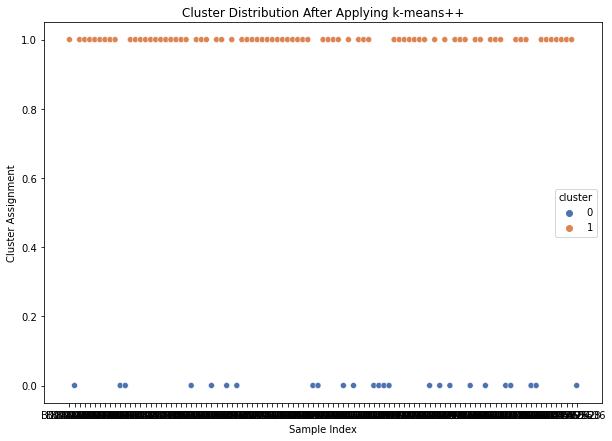

In [33]:
# Kmeans++ still ended up with imbalanced clusters
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Pivot the table to have region_id as columns and run_sample_id as rows
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv") 
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_11052024.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_tcga_filtered_11052024.csv")

# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Apply KMeans clustering with k-means++ initialization and more initialization attempts
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=0)
pivot_df['cluster'] = kmeans.fit_predict(scaled_data)

# Assign the new clusters to the original dataframe
df_kmeans = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)

# Check the results for cluster distribution
print(pivot_df['cluster'].value_counts())

# Visualize the clusters to check if the clusters are well separated
plt.figure(figsize=(10, 7))
sns.scatterplot(x=pivot_df.index, y=kmeans.labels_, hue=pivot_df['cluster'], palette="deep")
plt.title('Cluster Distribution After Applying k-means++')
plt.xlabel('Sample Index')
plt.ylabel('Cluster Assignment')
plt.show()

# # Optional: Try a range of cluster numbers to identify the optimal count using the elbow method
# sse = []
# for k in range(1, 10):
#     kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=0)
#     kmeans.fit(scaled_data)
#     sse.append(kmeans.inertia_)

# # Plot the elbow curve
# plt.figure(figsize=(10, 7))
# plt.plot(range(1, 10), sse, marker='o')
# plt.title('Elbow Method for Optimal Number of Clusters')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Sum of Squared Distances (SSE)')
# plt.show()


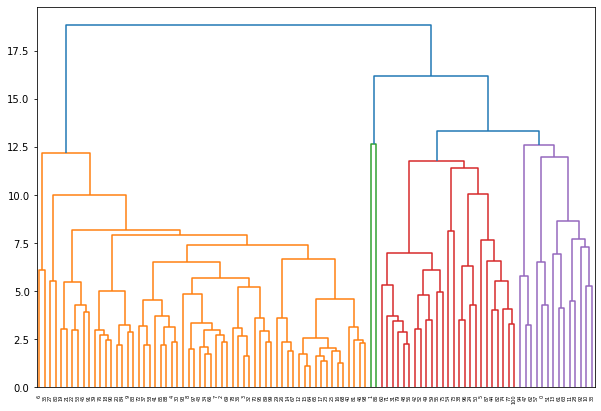

1    60
2    41
Name: cluster, dtype: int64

In [20]:
# hierarchy method with imbalance clusters

import pandas as pd
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import matplotlib.pyplot as plt

# Pivot the table to have region_id as columns and run_sample_id as rows
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv")
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")

# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Perform hierarchical clustering
Z = linkage(scaled_data, method='ward')

# Plot dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z)
plt.show()

# Cut the dendrogram at the level that gives two clusters
pivot_df['cluster'] = fcluster(Z, 2, criterion='maxclust')

# Assign the new clusters to the original dataframe
df = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)
pivot_df.cluster.value_counts()


In [21]:
# GMM method with imbalance clusters
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Pivot the table to have region_id as columns and run_sample_id as rows
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv")
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")


# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Apply Gaussian Mixture Model
gmm = GaussianMixture(n_components=2, random_state=0)
pivot_df['gmm_cluster'] = gmm.fit_predict(scaled_data)

# Assign the clusters back to the original dataframe
df = df.merge(pivot_df[['gmm_cluster']], left_on='run_sample_id', right_index=True)

# Check the new cluster distribution
print(pivot_df['gmm_cluster'].value_counts())


1    89
0    12
Name: gmm_cluster, dtype: int64


In [22]:
# PCA method with imbalance clusters
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Pivot the table to have region_id as columns and run_sample_id as rows
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv")
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")

# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]
pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Perform PCA
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)

# Apply KMeans clustering to the PCA-transformed data
kmeans = KMeans(n_clusters=2, random_state=0)
pivot_df['cluster'] = kmeans.fit_predict(pca_data)

# Assign the new clusters to the original dataframe
df = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)

# Check the results
pivot_df.cluster.value_counts()

1    72
0    29
Name: cluster, dtype: int64

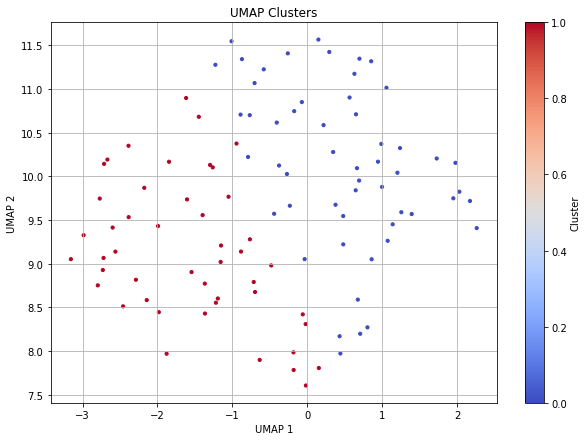

Cluster distribution after UMAP and KMeans: 0    54
1    47
Name: cluster, dtype: int64


In [23]:
# UMAP method gives balanced two clusters straitified based on the 18 healthy-lung-tissue-specific regions
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import umap
import matplotlib.pyplot as plt

# Pivot the table to have region_id as columns and run_sample_id as rows
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv")
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")

# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]
pivot_df_umap = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df_umap)

# Apply UMAP to reduce the dimensions to 2D
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(scaled_data)

# Perform KMeans clustering on the UMAP-reduced data
kmeans = KMeans(n_clusters=2, random_state=0)
pivot_df_umap['cluster'] = kmeans.fit_predict(umap_embedding)

# Assign the new clusters to the original dataframe
df_umap = df.merge(pivot_df_umap[['cluster']], left_on='run_sample_id', right_index=True)

# Plot the UMAP projection with clusters
plt.figure(figsize=(10, 7))
plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=pivot_df_umap['cluster'], cmap='coolwarm', s=10)
plt.title('UMAP Clusters')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()

# Check the distribution of clusters
cluster_counts = pivot_df_umap['cluster'].value_counts()
print("Cluster distribution after UMAP and KMeans:", cluster_counts)


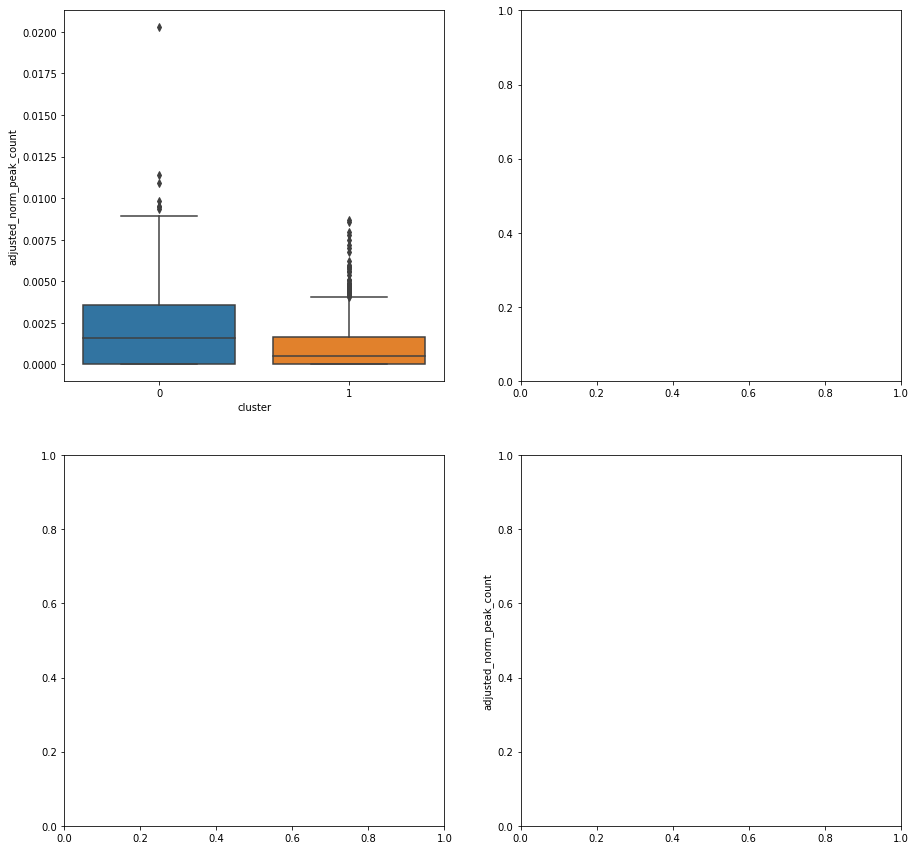

In [34]:
#check each cluster distribution (based on kmeans)
columns_nonPCA = ['adjusted_norm_peak_count']
fig, ax = plt.subplots(2, 2, figsize=(15, 15))
for i in range(0, len(columns_nonPCA)):
    g = sns.boxplot(x="cluster", y=columns_nonPCA[i],
                data=df_kmeans, 
               showfliers = True,
               ax=ax[i//2, i%2])
    plt.ylabel(columns_nonPCA[i])

In [35]:
# All method summary
# Noted after the problematic outlier "B00475983" was removed, all linear methods showed similar classification results
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, fcluster
import umap
from matplotlib_venn import venn2, venn3


# Read in the data 
# Remove the outlier
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_11052024.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_tcga_filtered_11052024.csv")


df = df[df['run_sample_id'] != "B00475983"]

# Pivot the table to have region_id as columns and run_sample_id as rows
pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Initialize an empty dataframe to collect cluster labels
cluster_results = pd.DataFrame(index=pivot_df.index)

# KMeans++ Clustering
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=0)
cluster_results['kmeans_cluster'] = kmeans.fit_predict(scaled_data)

# Hierarchical Clustering
Z = linkage(scaled_data, method='ward')
cluster_results['hierarchical_cluster'] = fcluster(Z, 2, criterion='maxclust')

# Gaussian Mixture Model
gmm = GaussianMixture(n_components=2, random_state=0)
cluster_results['gmm_cluster'] = gmm.fit_predict(scaled_data)

# PCA + KMeans Clustering
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)
kmeans_pca = KMeans(n_clusters=2, random_state=0)
cluster_results['pca_cluster'] = kmeans_pca.fit_predict(pca_data)

# UMAP + KMeans Clustering
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(scaled_data)
kmeans_umap = KMeans(n_clusters=2, random_state=0)
cluster_results['umap_cluster'] = kmeans_umap.fit_predict(umap_embedding)

# Check the cluster results
cluster_results.head()


,kmeans_cluster,hierarchical_cluster,gmm_cluster,pca_cluster,umap_cluster
run_sample_id,,,,,
B00460895,1,2,1,0,0
B00460897,0,2,1,0,0
B00460904,1,1,1,1,0
B00460910,1,1,1,1,0
B00460939,1,1,1,1,0


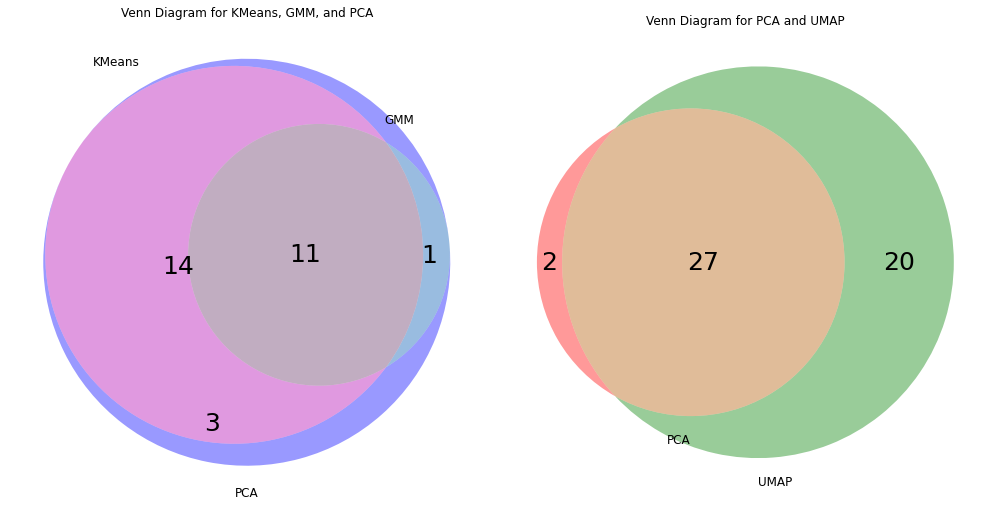

In [36]:
# Check the overlapping condition of all methods 
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_11052024.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_tcga_filtered_11052024.csv")

# Remove the outliers
df = df[df['run_sample_id'] != "B00475983"]

# Pivot the table to have region_id as columns and run_sample_id as rows
pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Initialize an empty dataframe to collect cluster labels
cluster_results = pd.DataFrame(index=pivot_df.index)

# KMeans++ Clustering
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=0)
cluster_results['kmeans_cluster'] = kmeans.fit_predict(scaled_data)

# # Hierarchical Clustering (renaming 1,2 to 0,1)
# Z = linkage(scaled_data, method='ward')
# cluster_results['hierarchical_cluster'] = fcluster(Z, 2, criterion='maxclust') - 1  # Subtract 1 to convert from 1,2 to 0,1

# Gaussian Mixture Model
gmm = GaussianMixture(n_components=2, random_state=0)
cluster_results['gmm_cluster'] = gmm.fit_predict(scaled_data)

# PCA + KMeans Clustering
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)
kmeans_pca = KMeans(n_clusters=2, random_state=0)
cluster_results['pca_cluster'] = kmeans_pca.fit_predict(pca_data)

# UMAP + KMeans Clustering
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(scaled_data)
kmeans_umap = KMeans(n_clusters=2, random_state=0)
cluster_results['umap_cluster'] = kmeans_umap.fit_predict(umap_embedding)

# Step 2: Create a set for each cluster assignment (Cluster 0 from all methods for comparison)
kmeans_set = set(cluster_results.index[cluster_results['kmeans_cluster'] == 0])
# hierarchy_set = set(cluster_results.index[cluster_results['hierarchical_cluster'] == 1])
gmm_set = set(cluster_results.index[cluster_results['gmm_cluster'] == 0])
pca_set = set(cluster_results.index[cluster_results['pca_cluster'] == 0])
umap_set = set(cluster_results.index[cluster_results['umap_cluster'] == 1])

# Step 3: Plot Venn Diagrams for pairwise comparison (Complete with 3 methods at a time)
plt.figure(figsize=(14, 7), facecolor='white')
plt.subplot(121)
v = venn3([kmeans_set, gmm_set, pca_set], set_labels=('KMeans', 'GMM', 'PCA'))
for text in v.subset_labels:
    if text:
        text.set_fontsize(25)  # Increase font size
plt.title('Venn Diagram for KMeans, GMM, and PCA')

plt.subplot(122)
v2 = venn2([pca_set, umap_set], set_labels=('PCA', 'UMAP'))
for text in v2.subset_labels:
    if text:
        text.set_fontsize(25)  # Increase font size
plt.title('Venn Diagram for PCA and UMAP')


plt.tight_layout()
plt.show()


In [37]:
# Select the predicted ILD samples by clustering methods (overlapping of all 3 methods)
# Reset the index 
df_cluster_results = cluster_results.reset_index().rename(columns={"index": "run_sample_id"})

# Get the cluster 0 result (high methylation signal group) of all 3 linear clustering algorithm 
df_cluster_results_overlapped = df_cluster_results[(df_cluster_results['kmeans_cluster'] == 0) & (df_cluster_results['gmm_cluster'] == 0) & (df_cluster_results['pca_cluster'] == 0)]

# # Get the cluster 0 result kmeans algorithm 
# df_cluster_results_overlapped = df_cluster_results[(df_cluster_results['kmeans_cluster'] == 0)]

# Save the sample id for cluster 0
High_peak_count_cluster_samples_by_3_cluster_overlap_ids = df_cluster_results_overlapped.run_sample_id.unique()
print(f'The sample size of cluster 0 treatmnet only # is ' + str(len(High_peak_count_cluster_samples_by_3_cluster_overlap_ids)))


The sample size of cluster 0 treatmnet only # is 11


In [38]:
# Read in the data 
# Remove the outlier
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv")
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_11052024.csv")
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_loosen2_tcga_filtered_11052024.csv")

df_removed_one_outlier = df[df['run_sample_id'] != "B00475983"]

df_removed_one_outlier['sample_type'] = np.where(df_removed_one_outlier['run_sample_id'].isin(High_peak_count_cluster_samples_by_3_cluster_overlap_ids), 'High_peak_count_cluster', "Low_peak_count_cluster")
df_removed_one_outlier.sample_type.value_counts()

Low_peak_count_cluster     1620
High_peak_count_cluster     198
Name: sample_type, dtype: int64

In [39]:
# Generate the input file for heatmap. This is for the R script LR_adjusted_log_norm_peak_count_screen_clustering_all_linear.R (just need to change the input name and output name)
# IMPORTNAT NOTES: giving the two clusters names based on the all the linear clustering algorithm two groups peak counts. Above plot showed cluster 1 has higher peak counts

df_clustering_for_R_heatmap = df_removed_one_outlier.copy()
# IMPORTNAT NOTES: giving the two clusters names based on the clustering peak counts. Above plot showed cluster 1 has higher peak counts
df_clustering_for_R_heatmap['sample_type'] = np.where(df_clustering_for_R_heatmap['run_sample_id'].isin(High_peak_count_cluster_samples_by_3_cluster_overlap_ids), 'High_peak_count_cluster', "Low_peak_count_cluster")
# df_umap['sample_type'] = np.where(df_umap["sample_type"] == "High_peak_count_cluster", 'High_peak_count_cluster', "Low_peak_count_cluster")

# Merge the treatment information back
df_clustering_for_R_heatmap = df_clustering_for_R_heatmap.merge(top_prd_df_sub_4[['run_sample_id', 'treatment']], on = "run_sample_id", how = "left")
df_clustering_for_R_heatmap_base = df_clustering_for_R_heatmap[df_clustering_for_R_heatmap['treatment'] == "Baseline"]
df_clustering_for_R_heatmap_treatment = df_clustering_for_R_heatmap[df_clustering_for_R_heatmap['treatment'] == "Treatment"]

# # Save the data
# df_clustering_for_R_heatmap.to_csv(f"{work_dir}/df_clustering_for_R_heatmap.csv")
# df_clustering_for_R_heatmap_base.to_csv(f"{work_dir}/df_clustering_for_R_heatmap_base.csv")
# df_clustering_for_R_heatmap_treatment.to_csv(f"{work_dir}/df_clustering_for_R_heatmap_treatment.csv")

# # Save the data
# df_clustering_for_R_heatmap.to_csv(f"{work_dir}/df_clustering_for_R_heatmap_loosen2_11052024.csv")
# df_clustering_for_R_heatmap_base.to_csv(f"{work_dir}/df_clustering_for_R_heatmap_base_loosen2_11052024.csv")
# df_clustering_for_R_heatmap_treatment.to_csv(f"{work_dir}/df_clustering_for_R_heatmap_treatment_loosen2_11052024.csv")

# # Save the data
# df_clustering_for_R_heatmap.to_csv(f"{work_dir}/df_clustering_for_R_heatmap_loosen2_tcga_filter_11052024.csv")
# df_clustering_for_R_heatmap_base.to_csv(f"{work_dir}/df_clustering_for_R_heatmap_base_loosen2_tcga_filter_11052024.csv")
# df_clustering_for_R_heatmap_treatment.to_csv(f"{work_dir}/df_clustering_for_R_heatmap_treatment_loosen2_tcga_filter_11052024.csv")

df_clustering_for_R_heatmap.head()

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,treatment
0,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_50884795_50885470,6,20,3,2728.80796,0.000046,0.001099,B00460895,Low_peak_count_cluster,-2.954920,0.001109,Treatment
1,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_63281169_63281518,7,23,6,2584.92647,0.000053,0.002321,B00460895,Low_peak_count_cluster,-2.632430,0.002331,Treatment
2,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_63283795_63284040,2,16,2,2921.87883,0.000015,0.000684,B00460895,Low_peak_count_cluster,-3.158333,0.000694,Treatment
3,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_111875207_111875685,7,13,6,2617.79734,0.000053,0.002292,B00460895,Low_peak_count_cluster,-2.637895,0.002302,Treatment
4,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,4_57521635_57522882,0,0,0,0.00000,0.000000,0.000000,B00460895,Low_peak_count_cluster,-5.000000,0.000010,Treatment


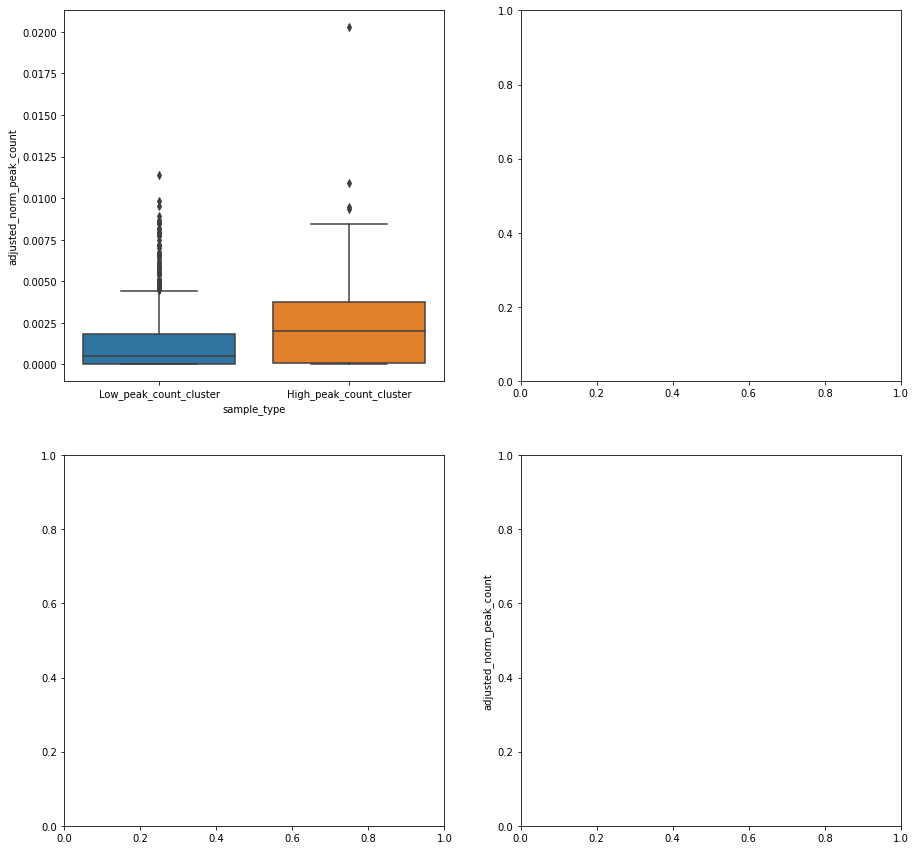

In [40]:
#check each cluster distribution
columns_nonPCA = ['adjusted_norm_peak_count']
fig, ax = plt.subplots(2, 2, figsize=(15, 15))
for i in range(0, len(columns_nonPCA)):
    g = sns.boxplot(x="sample_type", y=columns_nonPCA[i],
                data=df_clustering_for_R_heatmap, 
               showfliers = True,
               ax=ax[i//2, i%2])
    plt.ylabel(columns_nonPCA[i])

In [ ]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_umap_one_batch_with_annotation(df, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'sample_type_umap' categories
    hue_order = df['sample_type_umap'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # hue_order = ['High_peak_count_cluster', 'Low_peak_count_cluster']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="sample_type_umap", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="sample_type_umap", y="cfDNA_ng", hue = "treatment", ax=ax, dodge=True, jitter=0.2, size=6)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # Offset for sample size annotation, adjust as needed
    offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    for plot_type, cancer_group in df.groupby('sample_type_umap'):
        n = cancer_group.shape[0]
        type_pos = hue_order.index(plot_type)
        center = ax.get_xticks()[type_pos]  # Center position of each category
        ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="sample_type_umap", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=20)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample Types', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    ax.legend(fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)


    plt.show()



p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Low_peak_count_cluster vs. High_peak_count_cluster: t-test independent samples, P_val:6.106e-01 t=-5.108e-01


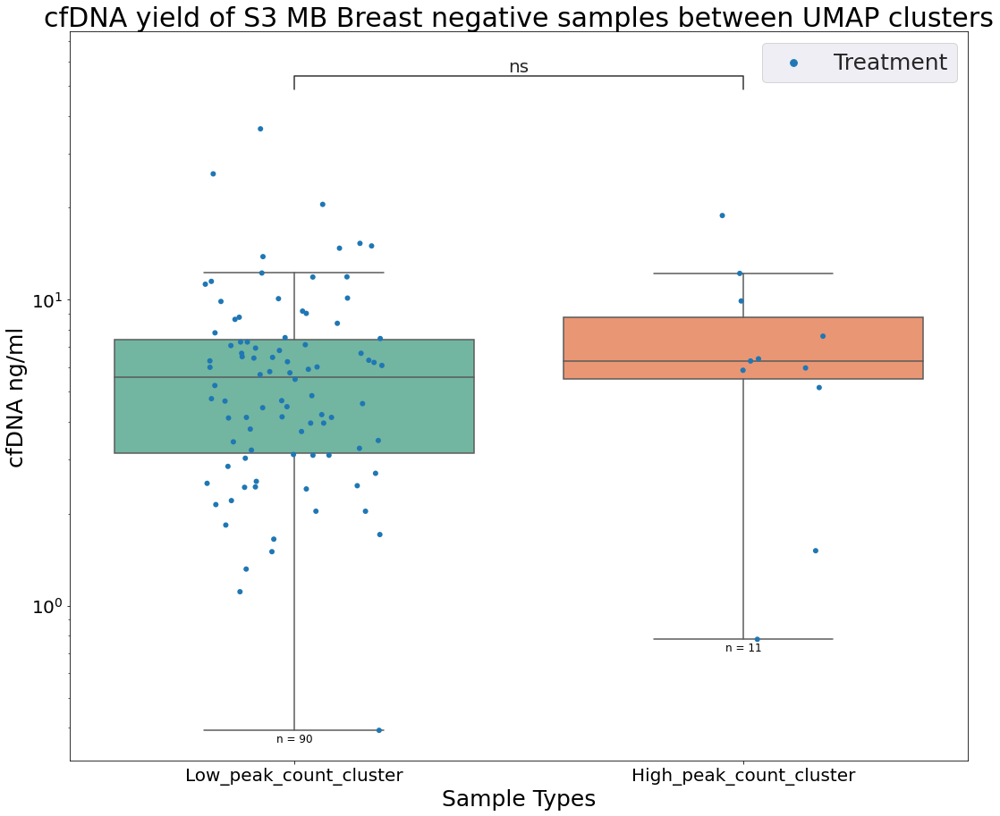

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Low_peak_count_cluster vs. High_peak_count_cluster: t-test independent samples, P_val:6.106e-01 t=-5.108e-01


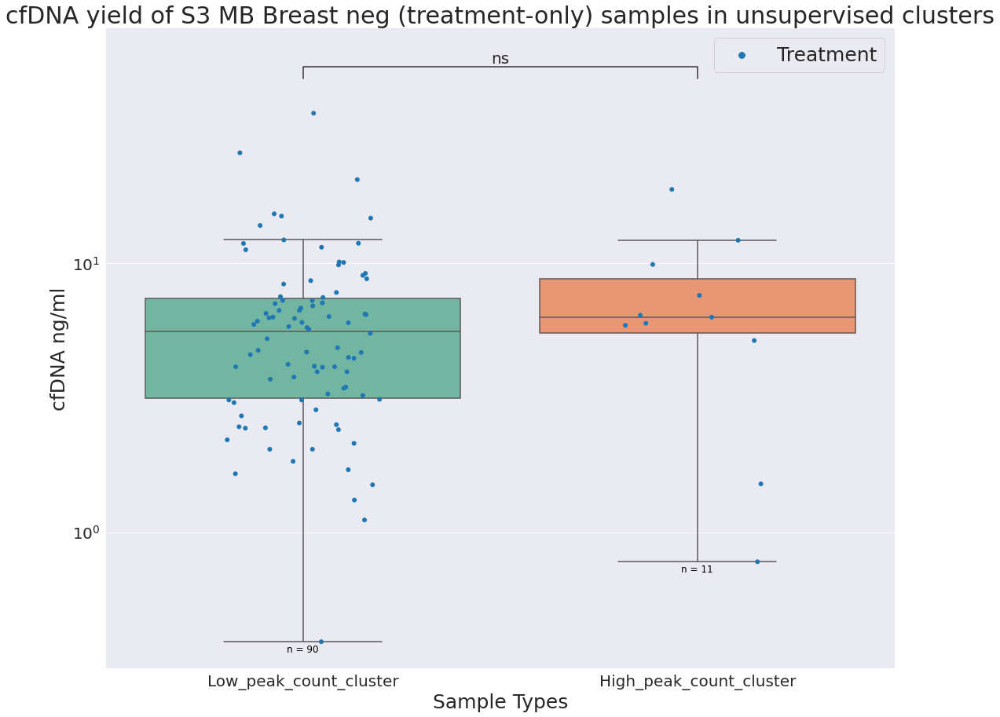

In [42]:
# Check the cfDNA yield 
df_umap_dedup = df_clustering_for_R_heatmap.drop_duplicates(subset = "run_sample_id")
top_prd_df_sub_4_umap_cluster_with_cfDNA = top_prd_df_sub_4.merge(df_umap_dedup[['run_sample_id', 'sample_type']], on = "run_sample_id", how = "left", suffixes=('', '_umap'))
top_prd_df_sub_4_umap_cluster_with_cfDNA = top_prd_df_sub_4_umap_cluster_with_cfDNA[top_prd_df_sub_4_umap_cluster_with_cfDNA['run_sample_id'] != "B00475983"]
top_prd_df_sub_4_umap_cluster_with_cfDNA = top_prd_df_sub_4_umap_cluster_with_cfDNA[~top_prd_df_sub_4_umap_cluster_with_cfDNA['sample_type_umap'].isnull()]

# cfDNA of S3 MB Breast negative samples in Daiichii SOW21
cfDNA_boxplot_by_umap_one_batch_with_annotation(top_prd_df_sub_4_umap_cluster_with_cfDNA, 'cfDNA yield of S3 MB Breast negative samples between UMAP clusters')

# cfDNA of S3 MB Breast negative samples in Daiichii SOW21 (treatment only)
top_prd_df_sub_4_umap_cluster_with_cfDNA_treatment = top_prd_df_sub_4_umap_cluster_with_cfDNA[top_prd_df_sub_4_umap_cluster_with_cfDNA["treatment"] == "Treatment"]
cfDNA_boxplot_by_umap_one_batch_with_annotation(top_prd_df_sub_4_umap_cluster_with_cfDNA_treatment, 'cfDNA yield of S3 MB Breast neg (treatment-only) samples in unsupervised clusters')

In [ ]:
# below cells might not need to run

In [43]:
df_consolidated_sub4_LR_DMR_B00460895_regionid = df_consolidated_sub4_LR_DMR_B00460895[df_consolidated_sub4_LR_DMR_B00460895['region_id'] == '4_57521635_57522882']
df_consolidated_sub4_LR_DMR_B00460895_regionid

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,CHR,START,END
6559,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,4_57521635_57522882,0,0,0,0.0,0.0,0.0,B00460895,Provided Cancer type: breast,-5.0,0.00001,4,57521635,57522882


In [44]:
df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_regionid = df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment[df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment['region_id'] == '4_57521635_57522882']
df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_regionid.shape

(102, 14)

In [45]:
df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_regionid.groupby('sample_type').adjusted_norm_peak_count.mean()

sample_type
CSO_lung_Samples                0.000173
Provided Cancer type: breast    0.000261
Name: adjusted_norm_peak_count, dtype: float64

In [46]:
import pandas as pd
from scipy.stats import ttest_ind

# Assume df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_regionid is your dataframe
# Example of loading the dataframe
df = df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment_regionid.copy()
# Filter the dataframe by sample types
cso_lung_samples = df[df['sample_type'] == 'CSO_lung_Samples']['adjusted_norm_peak_count']
breast_cancer_samples = df[df['sample_type'] == 'Provided Cancer type: breast']['adjusted_norm_peak_count']

# Perform the t-test on these two sets of samples
t_stat, p_value = ttest_ind(cso_lung_samples, breast_cancer_samples)

print("T-statistic:", t_stat)
print("P-value:", p_value)


T-statistic: -0.29762058929646884
P-value: 0.7666101778253949


In [47]:
# Remove the outlier
# df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific.csv")
df = pd.read_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_lung_tissue_specific_treatment.csv")

df_removed_one_outlier = df[df['run_sample_id'] != "B00475983"]

df_clustering_for_confusion_matrix = df_removed_one_outlier.copy()
# IMPORTNAT NOTES: giving the two clusters names based on the clustering peak counts. Above plot showed cluster 1 has higher peak counts
df_clustering_for_confusion_matrix['cluster'] = np.where(df_clustering_for_confusion_matrix['run_sample_id'].isin(High_peak_count_cluster_samples_by_3_cluster_overlap_ids), 1, 0)
# df_umap['sample_type'] = np.where(df_umap["sample_type"] == "High_peak_count_cluster", 'High_peak_count_cluster', "Low_peak_count_cluster")
df_clustering_for_confusion_matrix.head()

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,cluster
0,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_50884795_50885470,6,20,3,2728.80796,0.000046,0.001099,B00460895,Provided Cancer type: breast,-2.954920,0.001109,0
1,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_63281169_63281518,7,23,6,2584.92647,0.000053,0.002321,B00460895,Provided Cancer type: breast,-2.632430,0.002331,0
2,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_63283795_63284040,2,16,2,2921.87883,0.000015,0.000684,B00460895,Provided Cancer type: breast,-3.158333,0.000694,0
3,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_111875207_111875685,7,13,6,2617.79734,0.000053,0.002292,B00460895,Provided Cancer type: breast,-2.637895,0.002302,0
4,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,4_57521635_57522882,0,0,0,0.00000,0.000000,0.000000,B00460895,Provided Cancer type: breast,-5.000000,0.000010,0


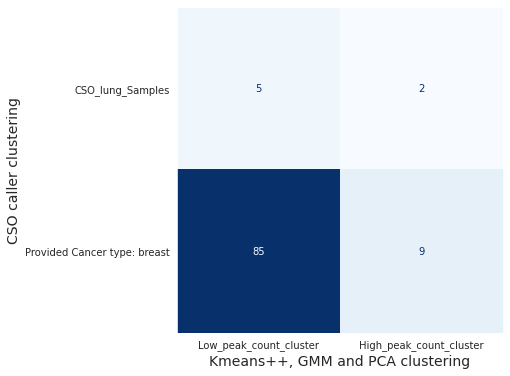

In [48]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

df_umap = df_clustering_for_confusion_matrix.copy()

# For confusion matrix plot 
df_umap_plot = df_umap.drop_duplicates(subset = "run_sample_id")
df_umap_plot['cluster'] = np.where(df_umap_plot["cluster"] == 0, 'CSO_lung_Samples', "Provided Cancer type: breast") # Make sure run the UMAP cell code first to get the column "Sample_type" value as CSO caller classification label

df_umap_plot.head()

# Ensure your DataFrame has the correct columns:
df_umap_plot['sample_type'] = df_umap_plot['sample_type'].astype(str)
df_umap_plot['cluster'] = df_umap_plot['cluster'].astype(str)

# Generate the confusion matrix
cm = confusion_matrix(df_umap_plot['sample_type'], df_umap_plot['cluster'], labels=['CSO_lung_Samples', 'Provided Cancer type: breast'])

# Labels for the UMAP clustering and CSO caller clustering
umap_labels = ['Low_peak_count_cluster', 'High_peak_count_cluster']
cso_caller_labels = ['CSO_lung_Samples', 'Provided Cancer type: breast']

# Plotting the confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=umap_labels)
disp.plot(cmap=plt.cm.Blues, ax=ax, colorbar=False) 

# Turn off gridlines which might be causing white lines
ax.grid(False)

# # Set edge color to none to remove cell borders
# disp.im_.set_edgecolor('none')

ax.set_xlabel('Kmeans++, GMM and PCA clustering', fontsize=14)
ax.set_ylabel('CSO caller clustering', fontsize=14)
ax.set_yticklabels(cso_caller_labels)  # Ensuring y-axis labels are set correctly

plt.show()


In [180]:
df_umap_plot.cluster.value_counts()

CSO_lung_Samples                106
Provided Cancer type: breast     26
Name: cluster, dtype: int64

In [151]:
# Reset the index from the UMAP clustering method
pivot_df_umap = pivot_df_umap.reset_index().rename(columns={"index": "run_sample_id"})
pivot_df_umap.head()

region_id,run_sample_id,14_36993454_36993782,17_12877289_12877530,19_17007412_17008006,19_17008123_17008601,19_17008718_17008838,19_18714725_18715204,1_50884795_50885470,20_21694307_21695105,22_19742853_19743435,22_46368034_46368392,2_111875207_111875685,2_63281169_63281518,2_63283795_63284040,4_57521635_57522882,5_134366914_134367034,5_134367172_134367292,8_72468561_72469244,8_72469349_72469583,cluster
0,B00460895,0.000010,0.006973,0.000010,0.001320,0.002642,0.00001,0.001109,0.004194,0.000010,0.000010,0.002302,0.002331,0.000694,0.00001,0.001405,0.001514,0.002799,0.000707,0
1,B00460897,0.000010,0.007879,0.003914,0.000010,0.000010,0.00001,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.004144,0.00001,0.011378,0.004261,0.004051,0.000010,1
2,B00460904,0.001187,0.000010,0.000542,0.000010,0.000512,0.00001,0.000581,0.001692,0.003935,0.000010,0.000010,0.000010,0.000010,0.00001,0.001699,0.001748,0.001131,0.001153,0
3,B00460910,0.001617,0.000010,0.000010,0.000010,0.000010,0.00001,0.000010,0.002159,0.001597,0.001628,0.000010,0.001622,0.000010,0.00001,0.001713,0.001611,0.003297,0.000010,0
4,B00460939,0.001067,0.000010,0.000010,0.000909,0.000909,0.00001,0.000010,0.001005,0.001023,0.001037,0.001032,0.000010,0.000010,0.00001,0.002123,0.001032,0.001012,0.002035,0


In [152]:
# Generate the input file for heatmap. This is for the R script LR_adjusted_log_norm_peak_count_screen_clustering_umap.R (just need to change the input name and output name)
# IMPORTNAT NOTES: giving the two clusters names based on the UMAP clustering peak counts. Above plot showed cluster 1 has higher peak counts
df_umap['sample_type'] = df_umap['cluster'].combine_first(df_umap['sample_type'])

# IMPORTNAT NOTES: giving the two clusters names based on the UMAP clustering peak counts. Above plot showed cluster 1 has higher peak counts
df_umap['sample_type'] = np.where(df_umap["sample_type"] == 1, 'High_peak_count_cluster', "Low_peak_count_cluster")
# df_umap['sample_type'] = np.where(df_umap["sample_type"] == "High_peak_count_cluster", 'High_peak_count_cluster', "Low_peak_count_cluster")


# Merge the treatment information back
df_umap = df_umap.merge(top_prd_df_sub_4[['run_sample_id', 'treatment']], on = "run_sample_id", how = "left")

df_map_base = df_umap[df_umap['treatment'] == "Baseline"]
df_map_treatment = df_umap[df_umap['treatment'] == "Treatment"]


df_umap.to_csv(f"{work_dir}/df_umap_clustering.csv")
df_map_base.to_csv(f"{work_dir}/df_umap_clustering_baseline.csv")
df_map_treatment.to_csv(f"{work_dir}/df_umap_clustering_treatment.csv")

df_umap.head()

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,cluster_x,cluster_y,cluster,treatment
0,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_50884795_50885470,6,20,3,2728.80796,0.000046,0.001099,B00460895,Low_peak_count_cluster,-2.954920,0.001109,1,1,0,Treatment
1,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_63281169_63281518,7,23,6,2584.92647,0.000053,0.002321,B00460895,Low_peak_count_cluster,-2.632430,0.002331,1,1,0,Treatment
2,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_63283795_63284040,2,16,2,2921.87883,0.000015,0.000684,B00460895,Low_peak_count_cluster,-3.158333,0.000694,1,1,0,Treatment
3,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,2_111875207_111875685,7,13,6,2617.79734,0.000053,0.002292,B00460895,Low_peak_count_cluster,-2.637895,0.002302,1,1,0,Treatment
4,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,4_57521635_57522882,0,0,0,0.00000,0.000000,0.000000,B00460895,Low_peak_count_cluster,-5.000000,0.000010,1,1,0,Treatment


In [153]:
df_umap_test = df_umap.drop_duplicates(subset = "run_sample_id")
df_umap_test.sample_type.value_counts(0)

Low_peak_count_cluster     121
High_peak_count_cluster     37
Name: sample_type, dtype: int64

In [159]:
top_prd_df_sub_4.shape

(159, 60)

In [160]:
# For cfDNA comparsion between these UMAP clusterings
# cfDNA info saved in the top_prd_df_sub_4
df_umap_dedup = df_umap.drop_duplicates(subset = "run_sample_id")
top_prd_df_sub_4_umap_cluster_with_cfDNA = top_prd_df_sub_4.merge(df_umap_dedup[['run_sample_id', 'sample_type']], on = "run_sample_id", how = "left", suffixes=('', '_umap'))
top_prd_df_sub_4_umap_cluster_with_cfDNA.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample,sample_type_umap
0,B00460895_230812_A01810_0184_AH7GK3DSX7,-21.495898,CSO_crc,-18.526176,DS8201-A-U302,A0808355,B00460895,44012006,C04D1,SUCCESS,NaN,53.5600,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.43,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.combined.hdr.tsv,B00460895,Female,Female,digestive,1,Breast,Provided Cancer type: breast,Low_peak_count_cluster
1,B00460897_230812_A01810_0184_AH7GK3DSX7,-22.772365,CSO_lung,-17.368158,DS8201-A-U302,A0808363,B00460897,33262001,C4D1,SUCCESS,NaN,3.8844,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.93,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.combined.hdr.tsv,B00460897,Female,Female,lung,1,Breast,CSO_lung_Samples,High_peak_count_cluster
2,B00460904_230812_A01810_0185_BH7K3TDSX7,-21.805463,CSO_lung,-18.475239,DS8201-A-U302,A0808386,B00460904,44192004,C04D1,SUCCESS,NaN,22.1000,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.00,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0185_BH7K3TDSX7,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0185_BH7K3TDSX7.076c97eb-782b-48a1-9cb3-d30ab38ac636.20230814141422_test,False,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.combined.hdr.tsv,B00460904,Female,Female,lung,1,Breast,CSO_lung_Samples,Low_peak_count_cluster
3,B00460910_230812_A01810_0184_AH7GK3DSX7,-22.681973,CSO_lung,-17.615950,DS8201-A-U302,A0808352,B00460910,34012003,C04D1,SUCCESS,NaN,8.6320,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.23,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-m

In [124]:
# # For cfDNA comparsion between these UMAP clusterings
# # cfDNA info saved in the top_prd_df_sub_4
# df_umap_dedup = df_umap.drop_duplicates(subset = "run_sample_id")
# top_prd_df_sub_4_treat = top_prd_df_sub_4[top_prd_df_sub_4["treatment"] == "Treatment"]
# top_prd_df_sub_4_umap_cluster_with_cfDNA = top_prd_df_sub_4_treat.merge(df_umap_dedup[['run_sample_id', 'sample_type']], on = "run_sample_id", how = "left", suffixes=('', '_umap'))
# top_prd_df_sub_4_umap_cluster_with_cfDNA.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample,sample_type_umap
0,B00460895_230812_A01810_0184_AH7GK3DSX7,-21.495898,CSO_crc,-18.526176,DS8201-A-U302,A0808355,B00460895,44012006,C04D1,SUCCESS,NaN,53.5600,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.43,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.combined.hdr.tsv,B00460895,Female,Female,digestive,1,Breast,Provided Cancer type: breast,Low_peak_count_cluster
1,B00460897_230812_A01810_0184_AH7GK3DSX7,-22.772365,CSO_lung,-17.368158,DS8201-A-U302,A0808363,B00460897,33262001,C4D1,SUCCESS,NaN,3.8844,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.93,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.combined.hdr.tsv,B00460897,Female,Female,lung,1,Breast,CSO_lung_Samples,High_peak_count_cluster
2,B00460904_230812_A01810_0185_BH7K3TDSX7,-21.805463,CSO_lung,-18.475239,DS8201-A-U302,A0808386,B00460904,44192004,C04D1,SUCCESS,NaN,22.1000,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.00,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0185_BH7K3TDSX7,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0185_BH7K3TDSX7.076c97eb-782b-48a1-9cb3-d30ab38ac636.20230814141422_test,False,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.combined.hdr.tsv,B00460904,Female,Female,lung,1,Breast,CSO_lung_Samples,High_peak_count_cluster
3,B00460910_230812_A01810_0184_AH7GK3DSX7,-22.681973,CSO_lung,-17.615950,DS8201-A-U302,A0808352,B00460910,34012003,C04D1,SUCCESS,NaN,8.6320,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.23,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-

In [41]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_umap_one_batch_with_annotation(df, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'sample_type_umap' categories
    hue_order = df['sample_type_umap'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # hue_order = ['High_peak_count_cluster', 'Low_peak_count_cluster']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="sample_type_umap", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="sample_type_umap", y="cfDNA_ng", hue = "treatment", ax=ax, dodge=True, jitter=0.2, size=6)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # Offset for sample size annotation, adjust as needed
    offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    for plot_type, cancer_group in df.groupby('sample_type_umap'):
        n = cancer_group.shape[0]
        type_pos = hue_order.index(plot_type)
        center = ax.get_xticks()[type_pos]  # Center position of each category
        ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="sample_type_umap", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=20)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample Types', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    ax.legend(fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)


    plt.show()



In [165]:
top_prd_df_sub_4_umap_cluster_with_cfDNA = top_prd_df_sub_4_umap_cluster_with_cfDNA[~top_prd_df_sub_4_umap_cluster_with_cfDNA["sample_type_umap"].isnull()]
top_prd_df_sub_4_umap_cluster_with_cfDNA.shape

(158, 61)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Low_peak_count_cluster vs. High_peak_count_cluster: t-test independent samples, P_val:8.965e-01 t=-1.302e-01


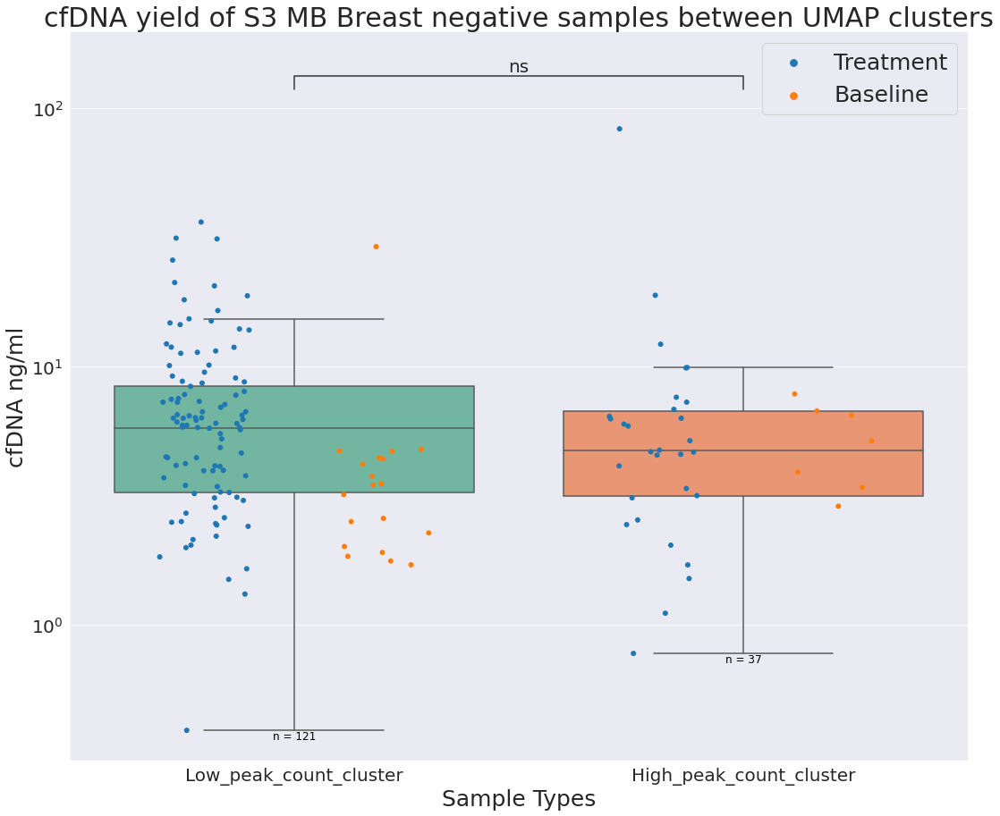

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Low_peak_count_cluster vs. High_peak_count_cluster: t-test independent samples, P_val:8.978e-01 t=-1.286e-01


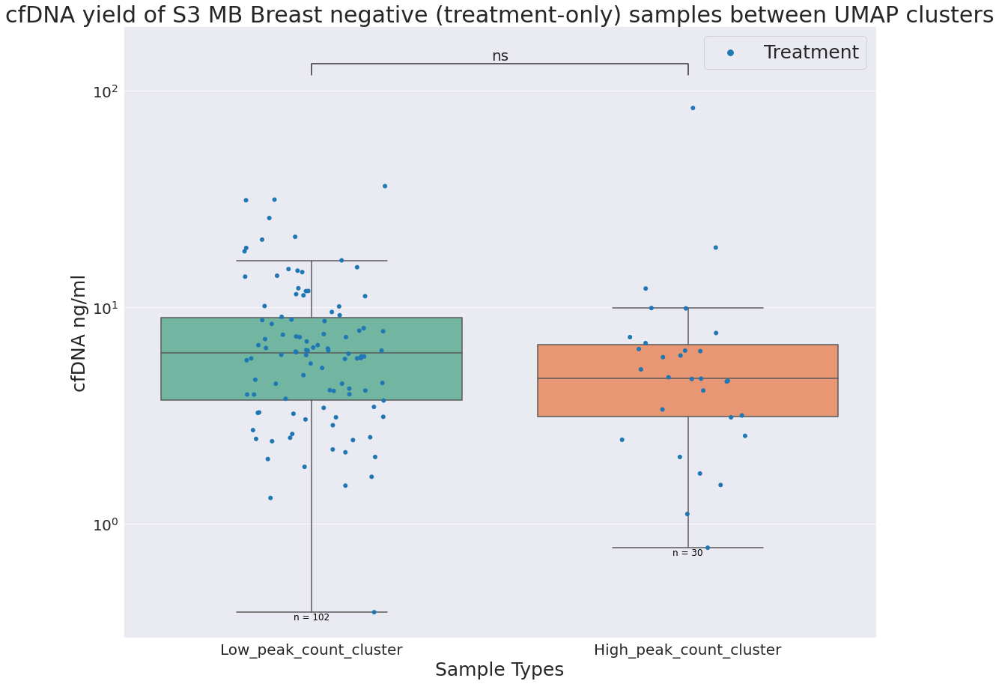

In [166]:
# cfDNA of S3 MB Breast negative samples in Daiichii SOW21
cfDNA_boxplot_by_umap_one_batch_with_annotation(top_prd_df_sub_4_umap_cluster_with_cfDNA, 'cfDNA yield of S3 MB Breast negative samples between UMAP clusters')

# Treatment samples only
top_prd_df_sub_4_umap_cluster_with_cfDNA_treatment = top_prd_df_sub_4_umap_cluster_with_cfDNA[top_prd_df_sub_4_umap_cluster_with_cfDNA["treatment"] == "Treatment"]
cfDNA_boxplot_by_umap_one_batch_with_annotation(top_prd_df_sub_4_umap_cluster_with_cfDNA_treatment, 'cfDNA yield of S3 MB Breast negative (treatment-only) samples between UMAP clusters')


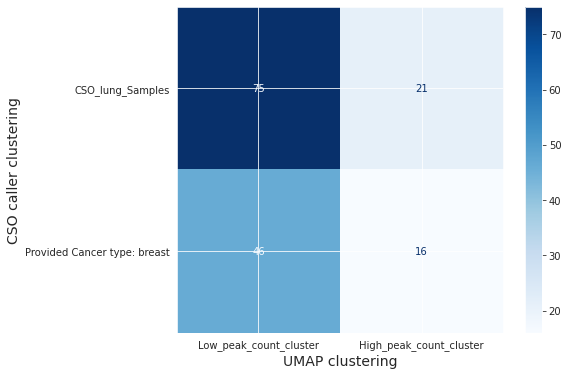

In [169]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# For confusion matrix plot 
df_umap_plot = df_umap.drop_duplicates(subset = "run_sample_id")
df_umap_plot['cluster'] = np.where(df_umap_plot["cluster"] == 0, 'CSO_lung_Samples', "Provided Cancer type: breast") # Make sure run the UMAP cell code first to get the column "Sample_type" value as CSO caller classification label

df_umap_plot.head()

# Ensure your DataFrame has the correct columns:
df_umap_plot['sample_type'] = df_umap_plot['sample_type'].astype(str)
df_umap_plot['cluster'] = df_umap_plot['cluster'].astype(str)

# Generate the confusion matrix
cm = confusion_matrix(df_umap_plot['sample_type'], df_umap_plot['cluster'], labels=['CSO_lung_Samples', 'Provided Cancer type: breast'])

# Labels for the UMAP clustering and CSO caller clustering
umap_labels = ['Low_peak_count_cluster', 'High_peak_count_cluster']
cso_caller_labels = ['CSO_lung_Samples', 'Provided Cancer type: breast']

# Plotting the confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=umap_labels)
disp.plot(cmap=plt.cm.Blues, ax=ax)
ax.set_xlabel('UMAP clustering', fontsize=14)
ax.set_ylabel('CSO caller clustering', fontsize=14)
ax.set_yticklabels(cso_caller_labels)  # Ensuring y-axis labels are set correctly
# plt.title('Confusion Matrix of Sample Type and Cluster', fontsize=16)
plt.show()


#### Screen for non-tumor derived DMR

##### Method 1: by Mingyang and Cataline, select LR DMR that is not positive associates with TF

In [2]:
# Readin data for S3 MB breast caller positive samples 
top_prd_df_sub_5 = pd.read_csv(f"{work_dir}/top_prd_df_sub_5_08122024.csv", header =0)
print(top_prd_df_sub_5.shape)
top_prd_df_sub_5.head()

(440, 60)


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample
0,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-14.140784,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast,Provided Cancer type: breast
1,B00460891_230812_A01810_0184_AH7GK3DSX7,0.392185,CSO_breast,-3.497001,DS8201-A-U302,A0808357,B00460891,32012004,C1D1,SUCCESS,NaN,12.532,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,5.94,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.combined.hdr.tsv,B00460891,Female,Female,breast,1,Breast,Provided Cancer type: breast
2,B00460892_230812_A01810_0184_AH7GK3DSX7,-14.477896,CSO_breast,-11.522599,DS8201-A-U302,A0808359,B00460892,33102003,C1D1,SUCCESS,NaN,6.396,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.74,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.combined.hdr.tsv,B00460892,Female,Female,breast,1,Breast,Provided Cancer type: breast
3,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_breast,1.651901,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8

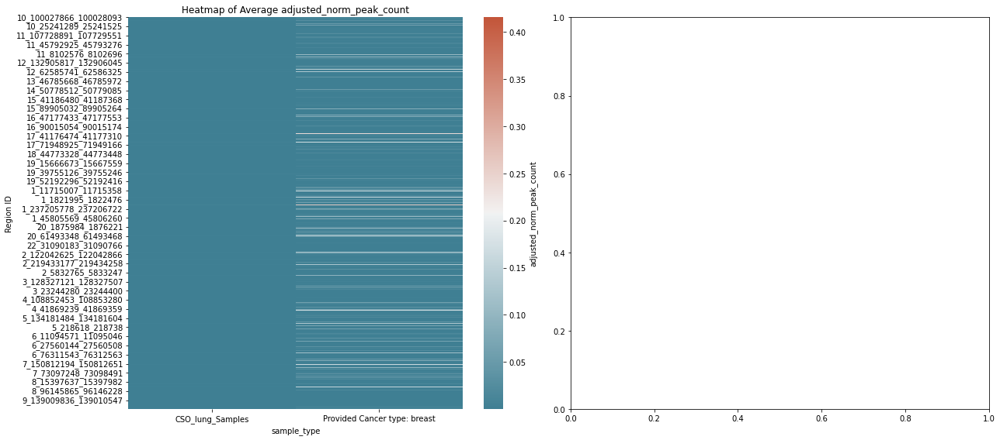

In [15]:
# Check LR panel regions and 1) generate the data (df_consolidated_sub5_LR_DMR) for DMR analysis 2) generate a mean heatmap for brief visualization

# Load data and prepare the dataset
top_prd_df_sub_5_DMR = top_prd_df_sub_5.copy()

# top_prd_df_az_4_DMR_new = top_prd_df_az_4_DMR.head(2)
# Create an empty DataFrame for consolidated data
df_consolidated_sub5_LR_DMR = pd.DataFrame()

# Process each sample
for index, row in top_prd_df_sub_5_DMR.iterrows():
    run_sample_id = row["GHSampleID"]
    fc_dir = row["fc_dir"]
    sample_type = row['CSO_Lung_Sample']
    msre_mr_file = f"{fc_dir}/{run_sample_id}/{run_sample_id}.msre_region_stats.tsv"
    try:
        # Load the data file
        df_temp = pd.read_table(msre_mr_file)
        # Remove control regions in v6
        df_temp_sub = df_temp[~df_temp["region_id"].isin(cso_dmr_remove_coordinate_list)]
        # print(df_temp_sub.shape)

        # Add 'sample_id' and 'sample_type' to the DataFrame
        df_temp_sub['sample_id'] = run_sample_id
        df_temp_sub['sample_type'] = sample_type
        
        # Append to the consolidated DataFrame
        df_consolidated_sub5_LR_DMR = pd.concat([df_consolidated_sub5_LR_DMR, df_temp_sub], ignore_index=True)
    except FileNotFoundError:
        print(f"File not found for sample_id {run_sample_id}: {msre_mr_file}")
        continue

# Get the intermediate component 
df_consolidated_sub5_LR_DMR['adjusted_log_norm_peak_count'] = np.log10(df_consolidated_sub5_LR_DMR["norm_peak_count"] + 1e-5)
df_consolidated_sub5_LR_DMR['adjusted_norm_peak_count'] = df_consolidated_sub5_LR_DMR["norm_peak_count"] + 1e-5


# Group by region_id and sample_type, then calculate the mean of adjusted_log_norm_peak_count
df_mean_sub5 = df_consolidated_sub5_LR_DMR.groupby(['region_id', 'sample_type']).adjusted_norm_peak_count.mean().reset_index()

# Pivot the DataFrame to have 'region_id' as rows, 'sample_type' as columns, and mean 'adjusted_log_norm_peak_count' as values
df_pivot_sub5 = df_mean_sub5.pivot(index='region_id', columns='sample_type', values='adjusted_norm_peak_count')

# Creating the plots with the adjusted data
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Heatmap (assuming df_pivot is already calculated and correct)
sns.heatmap(df_pivot_sub5, cmap=cmap, cbar_kws={'label': 'adjusted_norm_peak_count'}, ax=axes[0])
axes[0].set_title('Heatmap of Average adjusted_norm_peak_count')
axes[0].set_xlabel('sample_type')
axes[0].set_ylabel('Region ID')

# # Boxplot with adjusted log scale
# sns.boxplot(x='sample_type', y='adjusted_log_norm_peak_count', data=df_mean, showfliers=False, ax=axes[1])
# sns.stripplot(data=df_mean, x="sample_type", y="adjusted_log_norm_peak_count", dodge=True, jitter=0.2, ax=axes[1])
# axes[1].set_yscale('log')
# axes[1].set_title('Daichii SOW21', fontsize = 25)
# axes[1].set_xlabel('Sample Type', fontsize = 20)
# axes[1].set_ylabel('Log-scaled Normalized Peak Count', fontsize = 20)

plt.tight_layout()
plt.show()

In [27]:
# Save the data for R script data visualization for LR regions of two groups
df_consolidated_sub5_LR_DMR.to_csv(f"{work_dir}/df_consolidated_sub5_LR_DMR_08122024.csv", index = False)

In [3]:
# Readin the data
df_consolidated_sub5_LR_DMR = pd.read_csv(f"{work_dir}/df_consolidated_sub5_LR_DMR_08122024.csv", header = 0)
df_consolidated_sub5_LR_DMR.head()

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count
0,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_840086_840325,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001
1,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_840443_840684,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001
2,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_856459_856681,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001
3,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_859000_859240,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001
4,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_859359_859837,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001


In [29]:
# Merge the "Tumor_methylation_score" in the df_consolidated_sub5_LR_DMR
df_daiichi_report_rename = df_daiichi_report.rename(columns={'GHSampleID': 'run_sample_id'})

df_daiichi_report_dedup = df_daiichi_report_rename.drop_duplicates(subset = "run_sample_id")


df_consolidated_sub5_LR_DMR_withTF = df_consolidated_sub5_LR_DMR.merge(df_daiichi_report_dedup[['run_sample_id', 'Tumor_methylation_score']],  on='run_sample_id', how='left')
print(df_consolidated_sub5_LR_DMR_withTF.shape)

# Save the data for R script data visualization for LR regions of two groups
df_consolidated_sub5_LR_DMR_withTF.to_csv(f"{work_dir}/df_consolidated_sub5_LR_DMR_withTF_08122024.csv", index = False)

(12213080, 15)


,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,Tumor_methylation_score
0,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_840086_840325,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181
1,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_840443_840684,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181
2,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_856459_856681,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181
3,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_859000_859240,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181
4,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_859359_859837,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181


In [5]:
# Readin the data
df_consolidated_sub5_LR_DMR_withTF = pd.read_csv(f"{work_dir}/df_consolidated_sub5_LR_DMR_withTF_08122024.csv", header = 0)
df_consolidated_sub5_LR_DMR_withTF.head()

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,Tumor_methylation_score
0,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_840086_840325,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181
1,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_840443_840684,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181
2,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_856459_856681,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181
3,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_859000_859240,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181
4,B00460890,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_859359_859837,0,0,0,0.0,0.0,0.0,B00460890,Provided Cancer type: breast,-5.0,0.00001,0.001181


In [7]:
# Filter for S3 MB Breast positive samples (df_consolidated_sub5_LR_DMR_withTF)
print('S3 MB Breast Pos samples for DMR filter: ' + str(df_consolidated_sub5_LR_DMR_withTF.run_sample_id.nunique()))

# Filter 1: TF > 1%
df_NTD_DMR_1 = df_consolidated_sub5_LR_DMR_withTF[df_consolidated_sub5_LR_DMR_withTF['Tumor_methylation_score'] > 0.01]
print('S3 MB Breast Pos samples for DMR filter with TF > 1%: ' + str(df_NTD_DMR_1.run_sample_id.nunique()))


S3 MB Breast Pos samples for DMR filter: 440
S3 MB Breast Pos samples for DMR filter with TF > 1%: 281


In [12]:
# Additional filter: https://docs.google.com/presentation/d/1TvXyWmR7RsA5ZtXkSU3BnsYU9T_JONN4AoGhD--VhPQ/edit#slide=id.g23a3353ae7b_0_9
from scipy.stats import pearsonr, zscore

def calculate_correlation_and_filters(data):
    # Ensure there's enough data to calculate correlation
    if len(data) > 1:
        correlation, p_value = pearsonr(data['Tumor_methylation_score'], data['adjusted_norm_peak_count'])
        # Calculate standardized scores (z-scores)
        data['z_score'] = zscore(data['adjusted_norm_peak_count'])
        return pd.Series({
            'correlation': correlation,
            'p_value': p_value,
            'std_dev': np.std(data['adjusted_norm_peak_count']),
            'mean_z_score': np.mean(data['z_score'])  # mean of z-scores
        })

# Apply the function to group by 'region_id'
results = df_NTD_DMR_1.groupby('region_id').apply(calculate_correlation_and_filters)

# Filter 2: Top 200 regions with SD > 0.7
df_NTD_DMR_2 = results[(results['std_dev'] > 0.7)].nlargest(200, 'std_dev')

# Filter 3: standarized z-score > -1
df_NTD_DMR_3 = df_NTD_DMR_2[df_NTD_DMR_2['mean_z_score'] > -1]

# Filter 4: Absolute Pearson correlation < 0.1
df_NTD_DMR_4 = df_NTD_DMR_3[abs(df_NTD_DMR_3['correlation']) < 0.1]

# Print the results
print('Total # non-cancer-derived DMR in LR panel after filtering is ' + str(df_NTD_DMR_4.shape[0]))
print(df_NTD_DMR_4)

# Checking significant regions based on p-value criteria (I think should based on abs(correlation))
df_significant_regions = results[results['p_value'] < 0.05]
print('Total # cancer-derived DMR in LR panel is ' + str(df_significant_regions.shape[0]))
df_significant_regions.head()

Total # non-cancer-derived DMR in LR panel after filtering is 1
                      correlation   p_value   std_dev  mean_z_score
region_id                                                          
17_19436981_19437779     0.097699  0.102187  0.899194 -1.264311e-17
Total # cancer-derived DMR in LR panel is 10407


,correlation,p_value,std_dev,mean_z_score
region_id,,,,
10_100027866_100028093,0.120304,4.390529e-02,0.010676,-6.321555e-18
10_100028189_100028526,0.214988,2.830581e-04,0.023926,1.264311e-17
10_100206158_100206745,0.275633,2.718221e-06,0.025847,-1.011449e-16
10_100991816_100991936,0.301988,2.460771e-07,0.013190,1.580389e-17
10_100992030_100992494,0.278338,2.148038e-06,0.040975,0.000000e+00


In [32]:
# Just use the correlation
df_significant_regions = results[results['correlation'] < 0.1]
print('Total # cancer-derived DMR in LR panel is ' + str(df_significant_regions.shape[0]))
df_significant_regions.head()

Total # cancer-derived DMR in LR panel is 10199


,correlation,p_value,std_dev,mean_z_score
region_id,,,,
10_100227419_100227757,-0.043930,0.463274,0.006198,-1.896466e-17
10_101190125_101190944,-0.049826,0.405392,0.000032,-1.264311e-17
10_101418869_101419703,0.062994,0.292658,0.000294,0.000000e+00
10_101769599_101770061,0.005846,0.922284,0.000021,5.057244e-17
10_101989128_101989533,-0.018647,0.755643,0.000442,-8.534099e-17


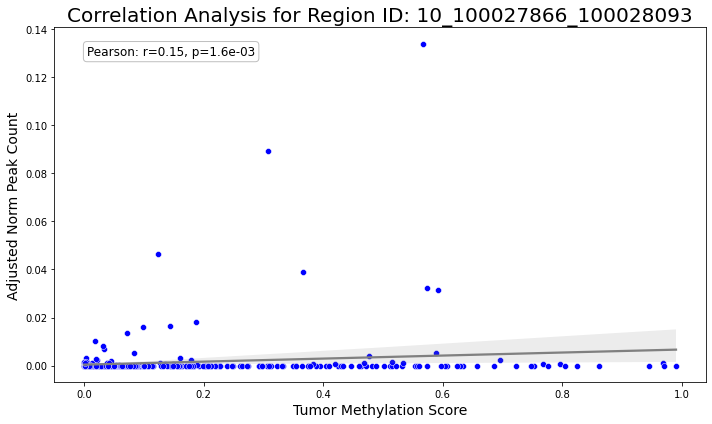

In [14]:
# Plot scatter plot for some example region_id

region_id = '10_100027866_100028093'
subset = df_consolidated_sub5_LR_DMR_withTF[df_consolidated_sub5_LR_DMR_withTF['region_id'] == region_id]

if len(subset) > 1:
    # Calculate Pearson correlation
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(subset['Tumor_methylation_score'], subset['adjusted_norm_peak_count'])
    
    # Create the plot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=subset, x='Tumor_methylation_score', y='adjusted_norm_peak_count', color='blue')
    sns.regplot(data=subset, x='Tumor_methylation_score', y='adjusted_norm_peak_count', scatter=False, color="gray")
    
    plt.xlabel('Tumor Methylation Score', fontsize=14)
    plt.ylabel('Adjusted Norm Peak Count', fontsize=14)
    plt.title(f'Correlation Analysis for Region ID: {region_id}', fontsize=20)
    
    # Annotate the correlation coefficient and p-value
    plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}',
             ha='left', va='top', transform=plt.gca().transAxes, fontsize=12,
             bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))
    
    plt.tight_layout()
    plt.show()
else:
    print("Not enough data to plot.")


In [54]:
# Readin the 145 lung-disease-specific DMR
significant_filtered_region_score_lr = pd.read_csv(f"{work_dir}/significant_filtered_region_score_lr.csv")
print(significant_filtered_region_score_lr.shape)
significant_filtered_region_score_lr.head()

(145, 3)


,region_id,CSO_lung_Samples,Provided Cancer type: breast
0,10_103051073_103051690,0.000113,0.000026
1,10_112836073_112836765,0.000448,0.000196
2,10_114710881_114711363,0.000106,0.000018
3,10_123686908_123688119,0.000087,0.000010
4,10_45455224_45455559,0.000082,0.000016


In [70]:
# Save the non-tumor-derived DMR
significant_filtered_region_score_lr_non_tumor = significant_filtered_region_score_lr[~significant_filtered_region_score_lr['region_id'].isin(df_significant_regions.index.to_list())]
print(significant_filtered_region_score_lr_non_tumor.shape)

# Save the non-tunmor DMR for S3 MB breast nagative samples
df_consolidated_sub4_LR_DMR_88 = df_consolidated_sub4_LR_DMR[df_consolidated_sub4_LR_DMR['region_id'].isin(significant_filtered_region_score_lr_non_tumor.region_id.to_list())]

# Filter 5: remove region_id where the percentage of 1e5 counts is less than or equal to 95%
def filter_zero_counts(group):
    # Calculate the percentage of zero counts in adjusted_norm_peak_count
    zero_count_percentage = (group['adjusted_norm_peak_count'] == 0.00001).mean() * 100
    return zero_count_percentage

# Group by 'region_id' and apply the filter function
zero_count_percentages = df_consolidated_sub4_LR_DMR_88.groupby('region_id').apply(filter_zero_counts)

# Filter to find region_ids where the percentage of zero counts is less than or equal to 95%
valid_region_ids = zero_count_percentages[zero_count_percentages <= 95].index

# Filter the original DataFrame to keep only the valid region_ids
df_consolidated_sub4_LR_DMR_final = df_consolidated_sub4_LR_DMR_88[df_consolidated_sub4_LR_DMR_88['region_id'].isin(valid_region_ids)]

print(f'Removed {len(zero_count_percentages) - len(valid_region_ids)} regions where over 95% of samples have a count of zero.')
print(f'Final non-tumor derived; lung-disease-specfic DMR # is ' + str(df_consolidated_sub4_LR_DMR_final.region_id.nunique()))

# Save the data
df_consolidated_sub4_LR_DMR_final.to_csv(f"{work_dir}/df_consolidated_sub4_LR_DMR_final.csv", index = False)

(88, 3)
Removed 6 regions where over 95% of samples have a count of zero.
Final non-tumor derived; lung-disease-specfic DMR # is 82


In [68]:
# Filter the original DataFrame to keep only the valid region_ids
# To generate heatmap: using this script and run in local (Rserver): /ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/R_scripts/LR_adjusted_log_norm_peak_count.R
df_consolidated_sub4_LR_DMR_final = df_consolidated_sub4_LR_DMR_88[df_consolidated_sub4_LR_DMR_88['region_id'].isin(valid_region_ids)]
df_consolidated_sub4_LR_DMR_final.region_id.nunique()

82

#### Check ChIP association with treatment effect (lung-disease predicted CSO samples)

In [42]:
# Exact ChIP from Mingyang's script

from collections import defaultdict

def get_chip_vars(som_ann_tsv):
  """ get the list of chip variants from a given annotated.somatic.tsv """
  if not os.path.exists(som_ann_tsv):
    # print(f"{som_ann_tsv} doesn't exist")
    return np.nan, np.nan
  som_ann_df = pd.read_csv(som_ann_tsv, sep="\t", low_memory=False)
  
  # get chip
  chip_vars_df = som_ann_df.query('somatic_call == "somatic_putative_ch" & reportable==True').copy()
  chip_vars_dict = defaultdict(float)
  chip_vars_df["mut_aa"] = chip_vars_df["mut_aa"].fillna("NA")
  
  for _, row in chip_vars_df.iterrows():
    gene_mut = "{}_{}".format(row["gene"], row["mut_aa"])
    maf = row["maf"]
    chip_vars_dict[gene_mut] = maf
  
  # get sommatic
  som_vars_df = som_ann_df.query('somatic_call == "somatic" & reportable==True').copy()
  som_vars_cnt = len(som_vars_df)
  
  return chip_vars_dict, som_vars_cnt

In [48]:
top_prd_df_sub_4_chip = top_prd_df_sub_4.copy()
top_prd_df_sub_4_chip.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample
0,B00460895_230812_A01810_0184_AH7GK3DSX7,-21.495898,CSO_crc,-18.526176,DS8201-A-U302,A0808355,B00460895,44012006,C04D1,SUCCESS,NaN,53.5600,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.43,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.combined.hdr.tsv,B00460895,Female,Female,digestive,1,Breast,Provided Cancer type: breast
1,B00460897_230812_A01810_0184_AH7GK3DSX7,-22.772365,CSO_lung,-17.368158,DS8201-A-U302,A0808363,B00460897,33262001,C4D1,SUCCESS,NaN,3.8844,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.93,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.combined.hdr.tsv,B00460897,Female,Female,lung,1,Breast,CSO_lung_Samples
2,B00460904_230812_A01810_0185_BH7K3TDSX7,-21.805463,CSO_lung,-18.475239,DS8201-A-U302,A0808386,B00460904,44192004,C04D1,SUCCESS,NaN,22.1000,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.00,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0185_BH7K3TDSX7,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0185_BH7K3TDSX7.076c97eb-782b-48a1-9cb3-d30ab38ac636.20230814141422_test,False,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.combined.hdr.tsv,B00460904,Female,Female,lung,1,Breast,CSO_lung_Samples
3,B00460910_230812_A01810_0184_AH7GK3DSX7,-22.681973,CSO_lung,-17.615950,DS8201-A-U302,A0808352,B00460910,34012003,C04D1,SUCCESS,NaN,8.6320,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.23,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be2

In [49]:
# Exact ChIP from Mingyang's script

chip_vars_dict_lst = []
som_vars_cnt_lst = []

cnt = 0
for _, row in top_prd_df_sub_4_chip.iterrows():
  if "cram_path" in row:
    this_som_ann_tsv = re.sub(r".pre-realigned.cram$", ".annotated.somatic.tsv", row["cram_path"])
  else: # "fc_dir" in row:
    this_som_ann_tsv = "{}/{}/{}.annotated.somatic.tsv".format(row["fc_dir"], row["run_sample_id"], row["run_sample_id"])
    
  this_chip_vars_dict, this_som_vars_cnt = get_chip_vars(this_som_ann_tsv)
  chip_vars_dict_lst.append(this_chip_vars_dict)
  som_vars_cnt_lst.append(this_som_vars_cnt)
  
  cnt += 1
  if cnt %50 == 0:
    print(f"{cnt} samples processed", end="\r")
  if cnt == len(top_prd_df_sub_4_chip):
    print(f"Finished processing {cnt} samples")

top_prd_df_sub_4_chip["chip_vars_info"] = chip_vars_dict_lst
top_prd_df_sub_4_chip["som_vars_cnt"] = som_vars_cnt_lst

Finished processing 159 samples


In [50]:
# Exact ChIP from Mingyang's script

from statistics import mean, median

top_prd_df_sub_4_chip["chip_vars_cnt"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(lambda x: len(x))
top_prd_df_sub_4_chip["chip_vars_cnt_gene"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(lambda x: len(set([i.split("_")[0] for i in x.keys()])))
top_prd_df_sub_4_chip["chip_vars_mean_maf"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(lambda x: mean(x.values()) if len(x)>0 else 0)
top_prd_df_sub_4_chip["chip_vars_max_maf"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(lambda x: max(x.values()) if len(x)>0 else 0)
top_prd_df_sub_4_chip["chip_vars_sum_maf"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(lambda x: sum(x.values()) if len(x)>0 else 0)
top_prd_df_sub_4_chip["chip_vars_frac"] = top_prd_df_sub_4_chip.apply(lambda x: x["chip_vars_cnt"] / (x["chip_vars_cnt"]+x["som_vars_cnt"]) if (x["chip_vars_cnt"]+x["som_vars_cnt"]) != 0 else np.nan, axis=1)

top_prd_df_sub_4_chip.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample,chip_vars_info,som_vars_cnt,chip_vars_cnt,chip_vars_cnt_gene,chip_vars_mean_maf,chip_vars_max_maf,chip_vars_sum_maf,chip_vars_frac
0,B00460895_230812_A01810_0184_AH7GK3DSX7,-21.495898,CSO_crc,-18.526176,DS8201-A-U302,A0808355,B00460895,44012006,C04D1,SUCCESS,NaN,53.5600,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.43,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.combined.hdr.tsv,B00460895,Female,Female,digestive,1,Breast,Provided Cancer type: breast,"{'NOTCH2_R2400*': 0.000845737, 'DNMT3A_Q362*': 0.00420322, 'RAD21_R478*': 0.00270773}",15,3,3,0.002586,0.004203,0.007757,0.166667
1,B00460897_230812_A01810_0184_AH7GK3DSX7,-22.772365,CSO_lung,-17.368158,DS8201-A-U302,A0808363,B00460897,33262001,C4D1,SUCCESS,NaN,3.8844,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.93,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.combined.hdr.tsv,B00460897,Female,Female,lung,1,Breast,CSO_lung_Samples,{},1,0,0,0.000000,0.000000,0.000000,0.000000
2,B00460904_230812_A01810_0185_BH7K3TDSX7,-21.805463,CSO_lung,-18.475239,DS8201-A-U302,A0808386,B00460904,44192004,C04D1,SUCCESS,NaN,22.1000,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.00,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0185_BH7K3TDSX7,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0185_BH7K3TDSX7.076c97eb-782b-48a1-9cb3-d30ab38ac636.20230814141422_test,False,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.combined.hdr.tsv,B00460904,Female,Female,lung,1,Breast,CSO_lung_Samples,{'TET2_R1440fs': 0.00169033},1,1,1,0.001690,0.001690,0.001690,0.500000
3,B00460910_230812_A01810_0184_AH7GK3DSX7,-22.681973,CSO_lung,-17.615950,DS8201-A-U302,A0808352,B00460910,34012003,C04D1,SUCCESS,NaN,8.6320,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.23,2

In [51]:
from statistics import mean

# Define a helper function to filter entries for specific genes
def filter_genes(variant_dict, genes):
    return {k: v for k, v in variant_dict.items() if any(gene in k for gene in genes)}

# Applying filters to chip variants data for specific genes (DNMT3A and TET2)
genes_of_interest = ["DNMT3A", "TET2"]
top_prd_df_sub_4_chip["chip_vars_cnt_twoGenes"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(
    lambda x: len(filter_genes(x, genes_of_interest))
)
top_prd_df_sub_4_chip["chip_vars_cnt_gene_twoGenes"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(
    lambda x: len(set([i.split("_")[0] for i in filter_genes(x, genes_of_interest).keys()]))
)
top_prd_df_sub_4_chip["chip_vars_mean_maf_twoGenes"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(
    lambda x: mean(filter_genes(x, genes_of_interest).values()) if len(filter_genes(x, genes_of_interest)) > 0 else 0
)
top_prd_df_sub_4_chip["chip_vars_max_maf_twoGenes"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(
    lambda x: max(filter_genes(x, genes_of_interest).values()) if len(filter_genes(x, genes_of_interest)) > 0 else 0
)
top_prd_df_sub_4_chip["chip_vars_sum_maf_twoGenes"] = top_prd_df_sub_4_chip["chip_vars_info"].apply(
    lambda x: sum(filter_genes(x, genes_of_interest).values()) if len(filter_genes(x, genes_of_interest)) > 0 else 0
)
top_prd_df_sub_4_chip["chip_vars_frac_twoGenes"] = top_prd_df_sub_4_chip.apply(
    lambda x: x["chip_vars_cnt_twoGenes"] / (x["chip_vars_cnt_twoGenes"] + x["som_vars_cnt"]) if (x["chip_vars_cnt_twoGenes"] + x["som_vars_cnt"]) != 0 else 0, axis=1
)

# Display the updated DataFrame head
top_prd_df_sub_4_chip.head()


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample,chip_vars_info,som_vars_cnt,chip_vars_cnt,chip_vars_cnt_gene,chip_vars_mean_maf,chip_vars_max_maf,chip_vars_sum_maf,chip_vars_frac,chip_vars_cnt_twoGenes,chip_vars_cnt_gene_twoGenes,chip_vars_mean_maf_twoGenes,chip_vars_max_maf_twoGenes,chip_vars_sum_maf_twoGenes,chip_vars_frac_twoGenes
0,B00460895_230812_A01810_0184_AH7GK3DSX7,-21.495898,CSO_crc,-18.526176,DS8201-A-U302,A0808355,B00460895,44012006,C04D1,SUCCESS,NaN,53.5600,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.43,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460895/B00460895.ghcnv_qc.combined.hdr.tsv,B00460895,Female,Female,digestive,1,Breast,Provided Cancer type: breast,"{'NOTCH2_R2400*': 0.000845737, 'DNMT3A_Q362*': 0.00420322, 'RAD21_R478*': 0.00270773}",15,3,3,0.002586,0.004203,0.007757,0.166667,1,1,0.004203,0.004203,0.004203,0.0625
1,B00460897_230812_A01810_0184_AH7GK3DSX7,-22.772365,CSO_lung,-17.368158,DS8201-A-U302,A0808363,B00460897,33262001,C4D1,SUCCESS,NaN,3.8844,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.93,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,False,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460897/B00460897.ghcnv_qc.combined.hdr.tsv,B00460897,Female,Female,lung,1,Breast,CSO_lung_Samples,{},1,0,0,0.000000,0.000000,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.0000
2,B00460904_230812_A01810_0185_BH7K3TDSX7,-21.805463,CSO_lung,-18.475239,DS8201-A-U302,A0808386,B00460904,44192004,C04D1,SUCCESS,NaN,22.1000,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.00,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0185_BH7K3TDSX7,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7,NaN,NaN,NaN,breast,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0185_BH7K3TDSX7.076c97eb-782b-48a1-9cb3-d30ab38ac636.20230814141422_test,False,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0185_BH7K3TDSX7/B00460904/B00460904.ghcnv_qc.combined.hdr.tsv,B00460904,Female,Female,lung,1,Breast,CSO_lung_Samples,{'TET2_R1440fs': 0.00169033},1,1,1,0.001690,0.001690,0.001690

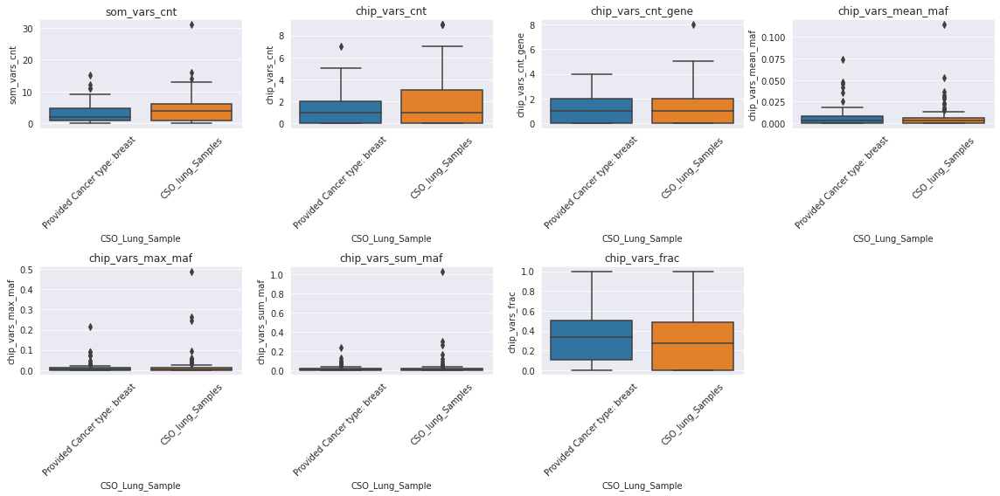

In [52]:
# Set up the matplotlib figure
plt.figure(figsize=(16, 8))

# Variables to plot
variables = ['som_vars_cnt', 'chip_vars_cnt', 'chip_vars_cnt_gene', 'chip_vars_mean_maf', 
             'chip_vars_max_maf', 'chip_vars_sum_maf', 'chip_vars_frac']

# Create a 2 row by 4 column grid of box plots
for i, var in enumerate(variables):
    sns.set_style('darkgrid')
    plt.subplot(2, 4, i + 1)  # Determines the position of the subplot
    sns.boxplot(x='CSO_Lung_Sample', y=var, data=top_prd_df_sub_4_chip)
    plt.title(f'{var}')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()




p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:1.152e-01 t=-1.584e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:9.432e-01 t=-7.135e-02
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:5.165e-01 t=6.503e-01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.0

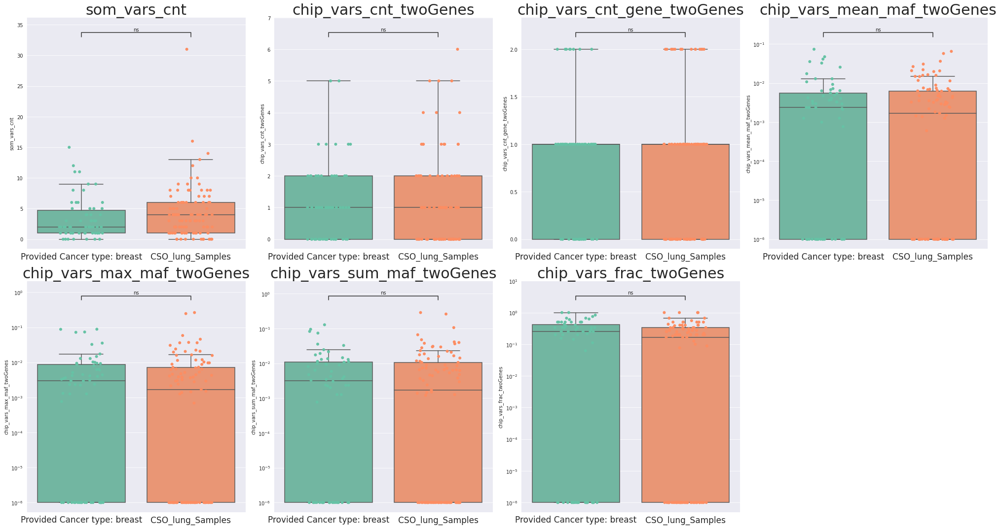

In [61]:
from statannotations.Annotator import Annotator

# Set up the matplotlib figure with a darkgrid style
sns.set_style('darkgrid')
plt.figure(figsize=(28, 15))

# Variables to plot with log scale
log_vars = ['chip_vars_mean_maf_twoGenes', 'chip_vars_max_maf_twoGenes', 'chip_vars_sum_maf_twoGenes', 'chip_vars_frac_twoGenes']

# Variables to plot
variables = ['som_vars_cnt', 'chip_vars_cnt_twoGenes', 'chip_vars_cnt_gene_twoGenes'] + log_vars

# Create a 2 row by 4 column grid of box plots
for i, var in enumerate(variables):
    ax = plt.subplot(2, 4, i + 1)  # Determines the position of the subplot
    if var in log_vars:
        # Adding a small constant to avoid log of zero
        data_to_plot = top_prd_df_sub_4_chip[var] + 1e-6
    else:
        data_to_plot = top_prd_df_sub_4_chip[var]

    hue_order = ['Provided Cancer type: breast', 'CSO_lung_Samples']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    sns.boxplot(x='CSO_Lung_Sample', y=data_to_plot, data=top_prd_df_sub_4_chip, ax=ax, showfliers=False, palette=color_map)
    sns.stripplot(x='CSO_Lung_Sample', y=data_to_plot, data=top_prd_df_sub_4_chip, ax=ax, jitter=0.2, size=6, color='black', palette=color_map)

    # Apply log scale for specified variables
    if var in log_vars:
        ax.set_yscale('log')

    # Set plot labels and title to match the original
    # plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('', fontsize=25)
    # ax.set_ylabel(var, fontsize=25)
    # ax.legend(fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    # ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)
    plt.title(var, fontsize=30)
    plt.xticks(fontsize=17)  # Rotate x-axis labels for better readability
    
    # Annotate statistical test results
    unique_samples = top_prd_df_sub_4_chip['CSO_Lung_Sample'].unique()
    if len(unique_samples) > 1:
        pairs = [(unique_samples[i], unique_samples[j]) for i in range(len(unique_samples)) for j in range(i + 1, len(unique_samples))]
        annotator = Annotator(ax, pairs, data=top_prd_df_sub_4_chip, x='CSO_Lung_Sample', y=data_to_plot)
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=10)
        annotator.apply_and_annotate()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:1.152e-01 t=-1.584e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:3.242e-01 t=-9.890e-01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:3.310e-01 t=-9.752e-01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.

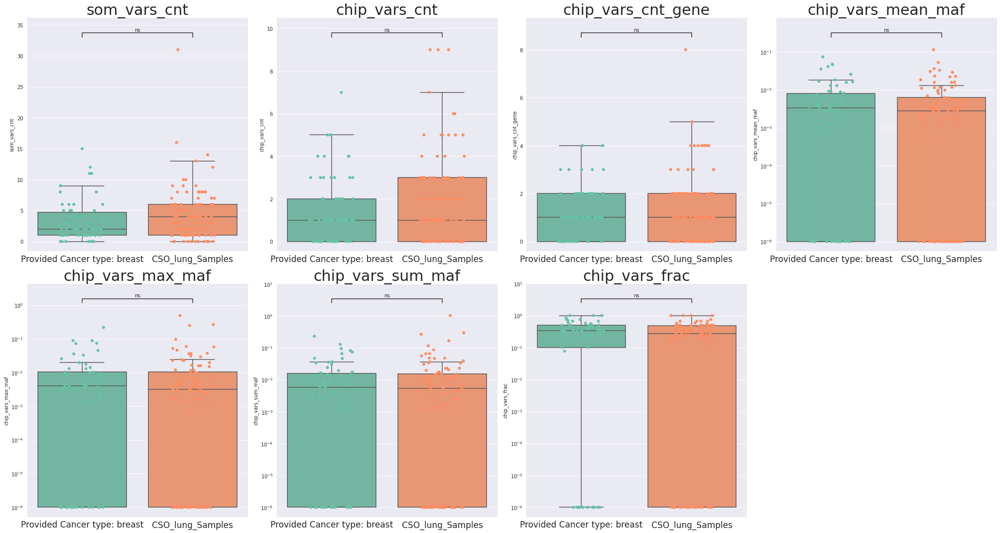

In [59]:
from statannotations.Annotator import Annotator

# Set up the matplotlib figure with a darkgrid style
sns.set_style('darkgrid')
plt.figure(figsize=(28, 15))

# Variables to plot with log scale
log_vars = ['chip_vars_mean_maf', 'chip_vars_max_maf', 'chip_vars_sum_maf', 'chip_vars_frac']

# Variables to plot
variables = ['som_vars_cnt', 'chip_vars_cnt', 'chip_vars_cnt_gene'] + log_vars

# Create a 2 row by 4 column grid of box plots
for i, var in enumerate(variables):
    ax = plt.subplot(2, 4, i + 1)  # Determines the position of the subplot
    if var in log_vars:
        # Adding a small constant to avoid log of zero
        data_to_plot = top_prd_df_sub_4_chip[var] + 1e-6
    else:
        data_to_plot = top_prd_df_sub_4_chip[var]

    hue_order = ['Provided Cancer type: breast', 'CSO_lung_Samples']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    sns.boxplot(x='CSO_Lung_Sample', y=data_to_plot, data=top_prd_df_sub_4_chip, ax=ax, showfliers=False, palette=color_map)
    sns.stripplot(x='CSO_Lung_Sample', y=data_to_plot, data=top_prd_df_sub_4_chip, ax=ax, jitter=0.2, size=6, color='black', palette=color_map)
    
    # Apply log scale for specified variables
    if var in log_vars:
        ax.set_yscale('log')
        
    # Set plot labels and title to match the original
    # plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('', fontsize=25)
    # ax.set_ylabel(var, fontsize=25)
    # ax.legend(fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    # ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)

    plt.title(var, fontsize=30)
    plt.xticks(fontsize=17)  # Rotate x-axis labels for better readability
    
    # Annotate statistical test results
    unique_samples = top_prd_df_sub_4_chip['CSO_Lung_Sample'].unique()
    if len(unique_samples) > 1:
        pairs = [(unique_samples[i], unique_samples[j]) for i in range(len(unique_samples)) for j in range(i + 1, len(unique_samples))]
        annotator = Annotator(ax, pairs, data=top_prd_df_sub_4_chip, x='CSO_Lung_Sample', y=data_to_plot)
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=10)
        annotator.apply_and_annotate()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


##### evaluate how significant between top1 and top2 CSO prediction of pan-cancer negative, treatment CSO lung prediction samples in Daiichi and AZ cohort

In [ ]:
# Select Top2 CSO prediction treatment CSO lung samples in Daiichi SOW21
top_8_prd_df_sub_filtered = top_8_prd_df_sub[(top_8_prd_df_sub['CSO_rank'] < 3) & (top_8_prd_df_sub['Pancancer_call'] == False) & (top_8_prd_df_sub['treatment'] == "Treatment")]
sample_list = top_8_prd_df_sub_filtered[(top_8_prd_df_sub_filtered['CSO_rank'] == 1) & (top_8_prd_df_sub_filtered['cso_prediction'] == 'lung')]['GHSampleID'].values
top_8_prd_df_sub_filtered_1 = top_8_prd_df_sub_filtered[top_8_prd_df_sub_filtered['GHSampleID'].isin(sample_list)]
print('Total treatment CSO lung prediction samples (TOP2) in Daiichi are ' + str(top_8_prd_df_sub_filtered_1.shape[0]))

# Select Top2 CSO prediction treatment CSO lung samples in AZ183

top_8_prd_df_az183_filtered = top_8_prd_df_az183[(top_8_prd_df_az183['CSO_rank'] < 3) & (top_8_prd_df_az183['Pancancer_call'] == False) & (top_8_prd_df_az183['treatment'] == "Treatment")]
sample_list_az = top_8_prd_df_az183_filtered[(top_8_prd_df_az183_filtered['CSO_rank'] == 1) & (top_8_prd_df_az183_filtered['cso_prediction'] == 'lung')]['GHSampleID'].values
top_8_prd_df_az183_filtered_1 = top_8_prd_df_az183_filtered[top_8_prd_df_az183_filtered['GHSampleID'].isin(sample_list_az)]
print('Total treatment CSO lung prediction samples (TOP2) in AZ are ' + str(top_8_prd_df_az183_filtered_1.shape[0]))

In [ ]:
from scipy.stats import ttest_rel, pearsonr, spearmanr

# Load DataFrame
df = top_8_prd_df_sub_filtered_1
# df = top_8_prd_df_az183_filtered_1

# Filter to get only top 1 and top 2 ranks
df_top1 = df[df['CSO_rank'] == 1]
df_top2 = df[df['CSO_rank'] == 2]

# Merge the top 1 and top 2 DataFrames on 'unique_sample_id'
df_merged = pd.merge(df_top1, df_top2, on='unique_sample_id', suffixes=('_top1', '_top2'))

# Calculate the difference between top 1 and top 2 scores
df_merged['score_difference'] = df_merged['cso_score_top1'] - df_merged['cso_score_top2']

# Performing a paired t-test
t_stat, p_value = ttest_rel(df_merged['cso_score_top1'], df_merged['cso_score_top2'])
mean_diff = df_merged['score_difference'].mean()
std_diff = df_merged['score_difference'].std()

# Calculate Pearson and Spearman correlations
pearson_corr, pearson_p_val = pearsonr(df_merged['cso_score_top1'], df_merged['score_difference'])
spearman_corr, spearman_p_val = spearmanr(df_merged['cso_score_top1'], df_merged['score_difference'])

# Print the t-test results, mean difference, and correlation results
print(f"Paired t-test t-statistic: {t_stat}, p-value: {p_value}")
print(f"Mean difference: {mean_diff}, Standard Deviation of differences: {std_diff}")
print(f"Pearson correlation: {pearson_corr} (p-value: {pearson_p_val})")
print(f"Spearman correlation: {spearman_corr} (p-value: {spearman_p_val})")

# Plotting the scatter plot with regression line of score differences vs. top 1 score
plt.figure(figsize=(10, 6))
sns.scatterplot(x='cso_score_top1', y='score_difference', data=df_merged, alpha=0.6, edgecolor='none', color='blue')
sns.regplot(x='cso_score_top1', y='score_difference', data=df_merged, scatter=False, color="gray")
plt.title('Daiichi SOW21 pan-cancer negative, CSO lung treatment subgroup', fontsize = 15)
plt.xlabel('CSO Lung Score', fontsize = 15)
plt.ylabel('Delta of Top1 (lung) and Top2 CSO score', fontsize = 15)
plt.grid(True)

# Annotate correlation results on the plot
plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
         ha='left', va='top', transform=plt.gca().transAxes, fontsize=12,
         bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.5))

plt.tight_layout()
plt.show()


##### check the CSO score distribution for other control cohorts

In [ ]:
# Gilead SOW3
print("Total size of this Gilead SOW3 is " + str(top_8_prd_df_gliead.shape[0]) + "\n") 
top_8_prd_df_gliead.head()

# AZ SOW183
print("Total size of this AZ SOW183 is " + str(top_8_prd_df_az183.shape[0]) + "\n") 

In [ ]:
# Then, assign treatment information to the "treatment" column for Gilead SOW3 only
top_8_prd_df_gliead.loc[top_8_prd_df_gliead['Visit_name'] == "BSLJ", ['treatment']] = ["Baseline"]
top_8_prd_df_gliead.loc[top_8_prd_df_gliead['Visit_name'].isin(['C2D1J']), ['treatment']] = ["Treatment"]

# Remove EOT samples
top_8_prd_df_gliead = top_8_prd_df_gliead[top_8_prd_df_gliead['treatment'] != 'other']
top_8_prd_df_gliead.treatment.value_counts()


In [ ]:
plot_cso_lung_scores(top_8_prd_df_gliead, 'CSO_lung')
plot_cso_lung_scores(top_8_prd_df_gliead, 'CSO_breast')

plot_and_compare_paired_cso_scores(top_8_prd_df_gliead, 'CSO_lung')
plot_and_compare_paired_cso_scores(top_8_prd_df_gliead, 'CSO_breast')


In [ ]:
from scipy.stats import ttest_ind
def perform_ttest(data, CSO_pred_type):
    baseline_scores = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Baseline')]['cso_score']
    treatment_scores = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]['cso_score']
    
    t_stat, p_value = ttest_ind(baseline_scores, treatment_scores, equal_var=False)  # Assuming unequal variances
    print(f'T-test results for {CSO_pred_type} - Baseline vs. Treatment:\nT-Statistic: {t_stat}, P-value: {p_value}')
    # Calculating mean values
    baseline_mean = baseline_scores.mean()
    treatment_mean = treatment_scores.mean()
    print(f'Mean Baseline score: {baseline_mean}, Mean Treatment score: {treatment_mean}')

perform_ttest(top_8_prd_df_gliead, 'CSO_lung')
perform_ttest(top_8_prd_df_gliead, 'CSO_breast')

In [ ]:
# Gilead SOW3
plot_histogram(top_8_prd_df_gliead, 'CSO_lung')
plot_histogram(top_8_prd_df_gliead, 'CSO_breast')
plot_histogram(top_8_prd_df_gliead, 'CSO_hepatocellular')
plot_histogram(top_8_prd_df_gliead, 'CSO_crc')
plot_histogram(top_8_prd_df_gliead, 'CSO_digestive')
plot_histogram(top_8_prd_df_gliead, 'CSO_bladder')
plot_histogram(top_8_prd_df_gliead, 'CSO_prostate')
plot_histogram(top_8_prd_df_gliead, 'CSO_pancreatic')

In [ ]:
def plot_cso_lung_scores_treatment(data, CSO_pred_type):
    sns.set_style('darkgrid')
    # Filter for CSO lung / CSO breast data
    treatment_data = data[(data['cso_model_type'] == CSO_pred_type) & (data['treatment'] == 'Treatment')]
    
    # Define subplot structure
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))
    
    # Determine common y-axis limits based on overall data
    y_min = treatment_data['cso_score'].min() - 1
    y_max = treatment_data['cso_score'].max() + 1

    # Treatment plot
    sns.scatterplot(x='GHSampleID', y='cso_score', data=treatment_data, hue='Pancancer_call', 
                    style=treatment_data['CSO_rank'].apply(lambda x: 'Top' if x == 1 else 'Other'), 
                    markers={'Top': 'X', 'Other': 'o'}, ax=axs[1])
    axs[1].set_title(f'{CSO_pred_type} - Treatment', fontsize = 28)
    axs[1].set_ylim([y_min, y_max])
    axs[1].set_ylabel('CSO score', fontsize=20)
    axs[1].set_xlabel('GHSampleID', fontsize=20)
    axs[1].legend(fontsize=12)

    plt.tight_layout()
    plt.show()

plot_cso_lung_scores_treatment(top_8_prd_df_az183, 'CSO_lung')
plot_cso_lung_scores_treatment(top_8_prd_df_az183, 'CSO_breast')




### cfDNA evaluation evluation

In [64]:
# Run the "Visualization" section "## Basic checking" first
# Define a new column called "CSO_Lung_Sample" to indicate if this sample is High CSO lung prediction for all the sample not just limited to treatment

# target_files = [
#     "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv"
#     # "20221227_GileadSciences_SOW03_750Samples_InfinityReport.csv",
#     # "20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"
#     # "20221007_TheInstituteOfCancerResearch_SOW01_78Samples_InfinityReport.csv"
# ]

target_files = [
    "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv",
    # "20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv",
    "20240625_DaiichiSankyoUS_SOW21_Batch2_177Samples_InfinityReport.csv"
]

top_prd_df_sub = top_prd_df[top_prd_df['csv_file_name'].isin(target_files)]

# Extract the GHSampleIDs from df_lung_cso_treatment
# all_cso_lung_samples = df_lung_cso['GHSampleID'].unique()
all_cso_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# Create a new column that will be True if the sample is in all_cso_lung_samples
top_prd_df_sub['CSO_Lung_Sample'] = top_prd_df_sub['GHSampleID'].isin(all_cso_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_sub['CSO_Lung_Sample'] = top_prd_df_sub.apply(
    lambda row: 'CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_sub = top_prd_df_sub.dropna(subset=['cfDNA_ng'])
top_prd_df_sub = top_prd_df_sub.dropna(subset=['Plasma_ml_input'])

# Remove EOT samples
top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['treatment'] != 'other']

print(top_prd_df_sub.CSO_Lung_Sample.value_counts())

top_prd_df_sub.head()

Provided Cancer type: breast    594
CSO_lung_Samples                 10
Name: CSO_Lung_Sample, dtype: int64


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample
4259,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-11.142988,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast,Provided Cancer type: breast
4260,B00460891_230812_A01810_0184_AH7GK3DSX7,0.392185,CSO_breast,1.418618,DS8201-A-U302,A0808357,B00460891,32012004,C1D1,SUCCESS,NaN,12.532,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,5.94,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.combined.hdr.tsv,B00460891,Female,Female,breast,1,Breast,Provided Cancer type: breast
4261,B00460892_230812_A01810_0184_AH7GK3DSX7,-14.477896,CSO_breast,-10.796222,DS8201-A-U302,A0808359,B00460892,33102003,C1D1,SUCCESS,NaN,6.396,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.74,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.combined.hdr.tsv,B00460892,Female,Female,breast,1,Breast,Provided Cancer type: breast
4262,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_breast,9.851840,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c8

In [65]:
top_prd_df_test = top_prd_df[top_prd_df['Account'] == "DaiichiSankyoUS"]
top_prd_df_test.csv_file_name.value_counts()

20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv           860
20240625_DaiichiSankyoUS_SOW21_Batch2_177Samples_InfinityReport.csv     19
Name: csv_file_name, dtype: int64

In [66]:
# all CSO_lung vs all other pan-cancer negative samples
top_prd_df_sub_1 = top_prd_df_sub[~((top_prd_df_sub['CSO_Lung_Sample'] == 'Provided Cancer type: breast') & (top_prd_df_sub['Pancancer_call'] == True))]
print(top_prd_df_sub_1.groupby('CSO_Lung_Sample').Pancancer_call.value_counts())

# all CSO_lung treatment vs all other pan-cancer negative samples
top_prd_df_sub_2 = top_prd_df_sub_1[~((top_prd_df_sub_1['CSO_Lung_Sample'] == 'CSO_lung_Samples') & (top_prd_df_sub_1['treatment'] == 'Baseline'))]
print(top_prd_df_sub_2.groupby('CSO_Lung_Sample').treatment.value_counts())

# all CSO_lung pan-cancer negative treatment vs all other pan-cancer negative samples
top_prd_df_sub_3 = top_prd_df_sub_2[top_prd_df_sub_2["Pancancer_call"] == False]
top_prd_df_sub_3 = top_prd_df_sub[top_prd_df_sub["Pancancer_call"] == False]

print(top_prd_df_sub_3.groupby('CSO_Lung_Sample').treatment.value_counts())


CSO_Lung_Sample               Pancancer_call
CSO_lung_Samples              False              10
Provided Cancer type: breast  False             201
Name: Pancancer_call, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment     10
Provided Cancer type: breast  Treatment    156
                              Baseline      45
Name: treatment, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment     10
Provided Cancer type: breast  Treatment    156
                              Baseline      45
Name: treatment, dtype: int64


(1143, 56)
Total Daiichi SOW21 S3 MB breast negative is 248
Total Daiichi SOW21 S3 MB breast positive is 890
Not Detected    7
Detected        3
Name: Tumor_methylation_status, dtype: int64


<Axes: >

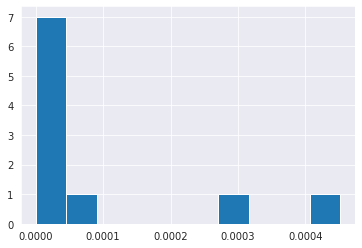

In [67]:
# Readin Daiichi SOW21 with S3 MB breast caller report by Jing (S3 MB 98% and TFv2 beta)
# df_daiichi_report_1 = pd.read_csv("/ghsfa/projects/pharma/customers/DaiichiSankyoUS/Infinity/DSI_SOW21_Infinity/DSI_SOW21_Infinity_01/data/report/20240430_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv", header=1)
# df_daiichi_report_2 = pd.read_csv("/ghsfa/projects/pharma/datawarehouse/Infinity/20240625_DaiichiSankyoUS_SOW21_Batch2_177Samples_InfinityReport.csv", header=1)
# df_daiichi_report = pd.concat([df_daiichi_report_1, df_daiichi_report_2])

# TFv2 rule (Breast MB90 and MB18 TFv2 > 0.05%)
df_daiichi_report = pd.read_csv(f"{work_dir}/20241021_DSI_SOW21_1150Samples_TFv2_InfinityReport.csv")

df_daiichi_report_new = df_daiichi_report[df_daiichi_report['Sample_status'] == 'SUCCESS']
df_daiichi_report_final = df_daiichi_report_new.drop_duplicates(subset = "GHSampleID")
print(df_daiichi_report_final.shape)

target_sample_list_negative = df_daiichi_report_final[df_daiichi_report_final['Tumor_methylation_status'] == 'Not Detected']['GHSampleID'].values
print('Total Daiichi SOW21 S3 MB breast negative is ' + str(len(target_sample_list_negative)))

target_sample_list_positive = df_daiichi_report_final[df_daiichi_report_final['Tumor_methylation_status'] == 'Detected']['GHSampleID'].values
print('Total Daiichi SOW21 S3 MB breast positive is ' + str(len(target_sample_list_positive)))

# Check the precentage of S3 MB breast caller in CSO_lung pancancer negative samples
target_sample_list = top_prd_df_sub_3[top_prd_df_sub_3['CSO_Lung_Sample'] == 'CSO_lung_Samples']['GHSampleID'].values
df_daiichi_report_mb = df_daiichi_report_final[df_daiichi_report_final['GHSampleID'].isin(target_sample_list)]
df_daiichi_report_mb.shape

print(df_daiichi_report_mb.Tumor_methylation_status.value_counts())
df_daiichi_report_mb.Tumor_methylation_score.hist()

In [68]:
# all CSO_lung pan-cancer negative treatment vs all other pan-cancer negative samples by S3 MB breast caller
top_prd_df_sub_4 = top_prd_df_sub[top_prd_df_sub["GHSampleID"].isin(target_sample_list_negative)]
# top_prd_df_sub_4 = top_prd_df_sub_4[top_prd_df_sub_4['treatment'] == 'Treatment']

# all S3 MB breast caller positive samples
top_prd_df_sub_5 = top_prd_df_sub[top_prd_df_sub["GHSampleID"].isin(target_sample_list_positive)]

print(top_prd_df_sub_4.shape)
print(top_prd_df_sub_5.shape)

(117, 60)
(482, 60)


In [93]:
# For later control cohort analysis

# Gilead SOW3
top_prd_df_gliead = top_prd_df[top_prd_df['csv_file_name'].isin(["20221227_GileadSciences_SOW03_750Samples_InfinityReport.csv"])]
print("Total size of this Gilead SOW3 is " + str(top_prd_df_gliead.shape[0]) + "\n") 

# Extract the GHSampleIDs from df_lung_cso
all_cso_lung_samples = df_lung_cso['GHSampleID'].unique()
all_cso_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# Create a new column that will be True if the sample is in all_cso_lung_samples
top_prd_df_gliead['CSO_Lung_Sample'] = top_prd_df_gliead['GHSampleID'].isin(all_cso_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_gliead['CSO_Lung_Sample'] = top_prd_df_gliead.apply(
    lambda row: 'CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_gliead = top_prd_df_gliead.dropna(subset=['cfDNA_ng'])
top_prd_df_gliead = top_prd_df_gliead.dropna(subset=['Plasma_ml_input'])


# Then, assign treatment information to the "treatment" column for Gilead SOW3 only
top_prd_df_gliead.loc[top_prd_df_gliead['Visit_name'] == "BSLJ", ['treatment']] = ["Baseline"]
top_prd_df_gliead.loc[top_prd_df_gliead['Visit_name'].isin(['C2D1J']), ['treatment']] = ["Treatment"]

# Remove EOT samples
top_prd_df_gliead = top_prd_df_gliead[top_prd_df_gliead['treatment'] != 'other']
print("Gilead SOW3 " + str(top_prd_df_gliead.treatment.value_counts()) +  "\n")
print("Gilead SOW3 " + str(top_prd_df_gliead.CSO_Lung_Sample.value_counts()) +  "\n")

Total size of this Gilead SOW3 is 420

Gilead SOW3 Baseline     135
Treatment    125
Name: treatment, dtype: int64

Gilead SOW3 Provided Cancer type: breast    255
CSO_lung_Samples                  5
Name: CSO_Lung_Sample, dtype: int64



In [94]:
# all CSO_lung vs all other pan-cancer negative samples
top_prd_df_gliead_1 = top_prd_df_gliead[~((top_prd_df_gliead['CSO_Lung_Sample'] == 'Provided Cancer type: breast') & (top_prd_df_gliead['Pancancer_call'] == True))]
print(top_prd_df_gliead_1.groupby('CSO_Lung_Sample').Pancancer_call.value_counts())

# all CSO_lung treatment vs all other pan-cancer negative samples
top_prd_df_gliead_2 = top_prd_df_gliead_1[~((top_prd_df_gliead_1['CSO_Lung_Sample'] == 'CSO_lung_Samples') & (top_prd_df_gliead_1['treatment'] == 'Baseline'))]
print(top_prd_df_gliead_2.groupby('CSO_Lung_Sample').treatment.value_counts())

# all CSO_lung treatment pan-cancer negative samples vs all other pan-cancer negative samples
top_prd_df_gliead_3 = top_prd_df_gliead_2[top_prd_df_gliead_2["Pancancer_call"] == False]
top_prd_df_gliead_3.groupby('CSO_Lung_Sample').treatment.value_counts()

CSO_Lung_Sample               Pancancer_call
CSO_lung_Samples              True              3
                              False             2
Provided Cancer type: breast  False             2
Name: Pancancer_call, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    5
Provided Cancer type: breast  Baseline     2
Name: treatment, dtype: int64


CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    2
Provided Cancer type: breast  Baseline     2
Name: treatment, dtype: int64

In [95]:
# Control cohort AZ SOW183 and corresponding paired baseline samples in AZ SOW117

# AZ SOW183
top_prd_df_az183 = top_prd_df[top_prd_df['csv_file_name'].isin(["20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"])]
print("Total size of this AZ SOW183 is " + str(top_prd_df_az183.shape[0]) + "\n") 

# Extract the GHSampleIDs from df_lung_cso_treatment
# all_cso_lung_samples = df_lung_cso['GHSampleID'].unique()
all_cso_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# Create a new column that will be True if the sample is in all_cso_lung_samples
top_prd_df_az183['CSO_Lung_Sample'] = top_prd_df_az183['GHSampleID'].isin(all_cso_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_az183['CSO_Lung_Sample'] = top_prd_df_az183.apply(
    lambda row: 'CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_az183 = top_prd_df_az183.dropna(subset=['cfDNA_ng'])
top_prd_df_az183 = top_prd_df_az183.dropna(subset=['Plasma_ml_input'])


# Remove EOT samples
top_prd_df_az183 = top_prd_df_az183[top_prd_df_az183['treatment'] != 'other']
print("AZ SOW183 " + str(top_prd_df_az183.treatment.value_counts()) +  "\n")
print("AZ SOW183 " + str(top_prd_df_az183.CSO_Lung_Sample.value_counts()) +  "\n")

top_prd_df_az183.head()

Total size of this AZ SOW183 is 876

AZ SOW183 Treatment    876
Name: treatment, dtype: int64

AZ SOW183 Provided Cancer type: breast    707
CSO_lung_Samples                169
Name: CSO_Lung_Sample, dtype: int64



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample
17353,B00640392_240411_A01020_0776_BH37JNDSXC,-0.343106,CSO_breast,-0.544965,D9268C00001,A0988598,B00640392,E7801003,C2D1,SUCCESS,NaN,37.60,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,GAGCAAACCC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988598,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.combined.hdr.tsv,B00640392,Female,Female,breast,1,Breast,Provided Cancer type: breast
17354,B00640395_240411_A01020_0776_BH37JNDSXC,5.092291,CSO_breast,2.605303,D9268C00001,A0988597,B00640395,E7801002,C2D1,SUCCESS,NaN,11.96,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TGGCCTGAGC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988597,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.combined.hdr.tsv,B00640395,Female,Female,breast,1,Breast,Provided Cancer type: breast
17355,B00640398_240411_A01020_0776_BH37JNDSXC,-3.413267,CSO_breast,-7.899741,D9268C00001,A0988596,B00640398,E7002015,C3D1,SUCCESS,NaN,17.73,3.0,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,CCTTTCCGAT,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988596,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.combined.hdr.tsv,B00640398,Female,Female,breast,1,Breast,Provided Cancer type: breast
17356,B00640406_240411_A01020_0776_BH37JNDSXC,4.252119,CSO_breast,2.931992,D9268C00001,A0988591,B00640406,E4105008,C2D1,SUCCESS,NaN,28.29,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TCCTTACCGG,Unknown,Research,2024-04-13 02:43:35-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988591,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640406,True,/ghsfa/ivd/f

In [237]:
# Control cohort AZ SOW183 and corresponding paired baseline samples in AZ SOW117

# Control cohort paired baseline samples in AZ SOW117
# Readin data

# List to store the dataframes for final merge
dfs = []

# List to store the dataframes for final merge
folder = f"{work_dir}/AZ_SOW117"

# List all csv files in the folder
for file in os.listdir(folder):
    try:
        file_path = os.path.join(folder, file)
        df = pd.read_csv(file_path, header=1)

        # Select specified columns, handling cases where some columns might not exist
        columns = ['Study_ID', 'GHRequestID', 'GHSampleID', 'Patient_ID', 'Visit_name', 'Max_percentage', 'Sample_status', 'Sample_comment', 'cfDNA_ng', 'Plasma_ml_input', 'Cancertype']
        df_sub = df.loc[:, df.columns.isin(columns)].copy()

        # Drop duplicates based on 'GHSampleID'
        df_sub_dedup = df_sub.drop_duplicates(subset=["GHSampleID"])

        # Append the processed dataframe to the list
        dfs.append(df_sub_dedup)

    except pd.errors.ParserError:
        print(f"Error reading file: {file_path} - possibly incorrect header.")
    except Exception as e:
        print(f"An unexpected error occurred with file: {file_path} - {str(e)}")



# Merge all dataframes into a final DataFrame
df_az117 = pd.concat(dfs, ignore_index=True)

df_az117 = df_az117[df_az117['Sample_status'] == 'SUCCESS']
df_az117 = df_az117.drop_duplicates(subset=["GHSampleID"])


print('total baseline samples for AZ 117 is ' + str(df_az117.shape[0]))
df_az117.head()

total baseline samples for AZ 117 is 597


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,Max_percentage,cfDNA_ng,Plasma_ml_input,Cancertype
0,D9268C00001,A0629463,B00272543,E0204001,SCRN,SUCCESS,NaN,1.68,18.1350,3.5,Breast
1,D9268C00001,A0629464,B00272546,E0204002,SCRN,SUCCESS,NaN,25.00,27.4950,3.5,Breast
2,D9268C00001,A0629465,B00272548,E0204003,SCRN,SUCCESS,NaN,20.37,27.1700,3.5,Breast
3,D9268C00001,A0629466,B00272551,E0205006,SCRN,SUCCESS,NaN,5.08,29.5750,3.5,Breast
4,D9268C00001,A0629467,B00271714,E0501012,SCRN,SUCCESS,NaN,0.51,3.2435,1.5,Breast


In [238]:
# merge all AZ 183 and AZ 117 SOW data together
# AZ SOW183
top_prd_df_az183 = top_prd_df[top_prd_df['csv_file_name'].isin(["20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"])]
print("Total size of this AZ SOW183 is " + str(top_prd_df_az183.shape[0]) + "\n") 

# Concatenate the dataframes
top_prd_df_az = pd.concat([top_prd_df_az183, df_az117], ignore_index=True, sort=False)

# Add the cancer type and treatment information
top_prd_df_az.loc[top_prd_df_az['Visit_name'] == 'SCRN', ['new_defined_cancer_type']] = ["breast"]
top_prd_df_az.loc[top_prd_df_az['Visit_name'] == 'SCRN', ['treatment']] = ["Baseline"]
top_prd_df_az.loc[top_prd_df_az['Visit_name'].isin(['RETEST', 'RETEST*', 'C5D1', 'C6D1']), ['treatment']] = ["other"]

# Remove uncertained treatment samples
top_prd_df_az = top_prd_df_az[top_prd_df_az['treatment'] != 'other']

# fillna with breast
top_prd_df_az['new_defined_cancer_type'] = top_prd_df_az['new_defined_cancer_type'].fillna("breast")

print('total samples for AZ is ' + str(top_prd_df_az.shape[0]))
top_prd_df_az.head()

Total size of this AZ SOW183 is 876

total samples for AZ is 1459


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother
0,B00640392_240411_A01020_0776_BH37JNDSXC,-0.343106,CSO_breast,-0.544965,D9268C00001,A0988598,B00640392,E7801003,C2D1,SUCCESS,NaN,37.60,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,GAGCAAACCC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988598,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.combined.hdr.tsv,B00640392,Female,Female,breast,1.0,Breast
1,B00640395_240411_A01020_0776_BH37JNDSXC,5.092291,CSO_breast,2.605303,D9268C00001,A0988597,B00640395,E7801002,C2D1,SUCCESS,NaN,11.96,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TGGCCTGAGC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988597,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.combined.hdr.tsv,B00640395,Female,Female,breast,1.0,Breast
2,B00640398_240411_A01020_0776_BH37JNDSXC,-3.413267,CSO_breast,-7.899741,D9268C00001,A0988596,B00640398,E7002015,C3D1,SUCCESS,NaN,17.73,3.0,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,CCTTTCCGAT,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988596,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.combined.hdr.tsv,B00640398,Female,Female,breast,1.0,Breast
3,B00640406_240411_A01020_0776_BH37JNDSXC,4.252119,CSO_breast,2.931992,D9268C00001,A0988591,B00640406,E4105008,C2D1,SUCCESS,NaN,28.29,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TCCTTACCGG,Unknown,Research,2024-04-13 02:43:35-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988591,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640406,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640406/B00640406.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A0102

In [239]:
# Define the CSO lung sample in top_prd_df_az

# Extract the GHSampleIDs from df_lung_cso
# all_cso_lung_samples = df_lung_cso['GHSampleID'].unique()
all_cso_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# Create a new column that will be True if the sample is in all_cso_lung_samples
top_prd_df_az['CSO_Lung_Sample'] = top_prd_df_az['GHSampleID'].isin(all_cso_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_az['CSO_Lung_Sample'] = top_prd_df_az.apply(
    lambda row: 'CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_az = top_prd_df_az.dropna(subset=['cfDNA_ng'])
top_prd_df_az = top_prd_df_az.dropna(subset=['Plasma_ml_input'])


# Remove EOT samples
top_prd_df_az = top_prd_df_az[top_prd_df_az['treatment'] != 'other']
print("AZ SOW183&117 " + str(top_prd_df_az.treatment.value_counts()) +  "\n")
print("AZ SOW183&117 " + str(top_prd_df_az.CSO_Lung_Sample.value_counts()) +  "\n")

top_prd_df_az.head()

AZ SOW183&117 Treatment    876
Baseline     583
Name: treatment, dtype: int64

AZ SOW183&117 Provided Cancer type: breast    1290
CSO_lung_Samples                 169
Name: CSO_Lung_Sample, dtype: int64



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,CSO_Lung_Sample
0,B00640392_240411_A01020_0776_BH37JNDSXC,-0.343106,CSO_breast,-0.544965,D9268C00001,A0988598,B00640392,E7801003,C2D1,SUCCESS,NaN,37.60,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,GAGCAAACCC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988598,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640392/B00640392.ghcnv_qc.combined.hdr.tsv,B00640392,Female,Female,breast,1.0,Breast,Provided Cancer type: breast
1,B00640395_240411_A01020_0776_BH37JNDSXC,5.092291,CSO_breast,2.605303,D9268C00001,A0988597,B00640395,E7801002,C2D1,SUCCESS,NaN,11.96,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TGGCCTGAGC,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988597,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640395/B00640395.ghcnv_qc.combined.hdr.tsv,B00640395,Female,Female,breast,1.0,Breast,Provided Cancer type: breast
2,B00640398_240411_A01020_0776_BH37JNDSXC,-3.413267,CSO_breast,-7.899741,D9268C00001,A0988596,B00640398,E7002015,C3D1,SUCCESS,NaN,17.73,3.0,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,CCTTTCCGAT,Unknown,Research,2024-04-13 02:43:36-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988596,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398,True,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640398/B00640398.ghcnv_qc.combined.hdr.tsv,B00640398,Female,Female,breast,1.0,Breast,Provided Cancer type: breast
3,B00640406_240411_A01020_0776_BH37JNDSXC,4.252119,CSO_breast,2.931992,D9268C00001,A0988591,B00640406,E4105008,C2D1,SUCCESS,NaN,28.29,3.5,NaN,20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv,psreedhar,NaN,2024-05-03,AstraZeneca,SOW183,Other,NaN,NaN,TCCTTACCGG,Unknown,Research,2024-04-13 02:43:35-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,AZN_183,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0988591,cgp,240411_A01020_0776_BH37JNDSXC,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC,NaN,NaN,NaN,breast,Treatment,/ghsfa/ivd/flowcentral/240411_A01020_0776_BH37JNDSXC/B00640406,True,/ghsfa/ivd/flowcentral

In [240]:
# all CSO_lung vs all other pan-cancer negative samples
top_prd_df_az_1 = top_prd_df_az[~((top_prd_df_az['CSO_Lung_Sample'] == 'Provided Cancer type: breast') & (top_prd_df_az['Pancancer_call'] == True))]
print(top_prd_df_az_1.groupby('CSO_Lung_Sample').Pancancer_call.value_counts())

# all CSO_lung treatment vs all other pan-cancer negative samples
top_prd_df_az_2 = top_prd_df_az_1[~((top_prd_df_az_1['CSO_Lung_Sample'] == 'CSO_lung_Samples') & (top_prd_df_az_1['treatment'] == 'Baseline'))]
print(top_prd_df_az_2.groupby('CSO_Lung_Sample').treatment.value_counts())

# all CSO_lung treatment pan-cancer negative samples vs all other pan-cancer negative samples
top_prd_df_az_3 = top_prd_df_az_2[top_prd_df_az_2["Pancancer_call"] == False]
top_prd_df_az_3 = top_prd_df_az[top_prd_df_az["Pancancer_call"] == False]
print(top_prd_df_az_3.groupby('CSO_Lung_Sample').treatment.value_counts())

# Readin AZSOW with S3 MB breast caller binary result
df_az183_S3_MB_breast = pd.read_csv(f'{work_dir}/df_az_183_2.csv', header=0)
target_sample_list_negative_az = df_az183_S3_MB_breast[df_az183_S3_MB_breast['MB_Breast_call'] == 'Not Detected']['run_sample_id'].values
print(len(target_sample_list_negative_az))
top_prd_df_az_4 = top_prd_df_az[top_prd_df_az["GHSampleID"].isin(target_sample_list_negative_az)]
top_prd_df_az_4.shape


CSO_Lung_Sample               Pancancer_call
CSO_lung_Samples              True              88
                              False             81
Provided Cancer type: breast  False             31
Name: Pancancer_call, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    169
Provided Cancer type: breast  Baseline     583
                              Treatment     31
Name: treatment, dtype: int64
CSO_Lung_Sample               treatment
CSO_lung_Samples              Treatment    81
Provided Cancer type: breast  Treatment    31
Name: treatment, dtype: int64
64


(64, 60)

In [77]:
# top_prd_df_sub_4 treatment samples only
top_prd_df_sub_4_treatment = top_prd_df_sub_4[top_prd_df_sub_4['treatment'] == 'Treatment']
top_prd_df_sub_4_treatment.treatment.value_counts()

# Get the Top2 CSO lung samples and replace the original label in top_prd_df_sub_4
paired_data_daichii_lung_top2 = paired_data_daichii_lung[paired_data_daichii_lung['CSO_rank_treatment'] <= 2]
GHSampleID_treatment_ids = paired_data_daichii_lung_top2.GHSampleID_treatment.unique()
top_prd_df_sub_6 = top_prd_df_sub_4.copy()
top_prd_df_sub_6['CSO_Lung_Sample'] = np.where(top_prd_df_sub_6['GHSampleID'].isin(GHSampleID_treatment_ids), "CSO_lung_Samples", "Provided Cancer type: breast")
print(top_prd_df_sub_6.CSO_Lung_Sample.value_counts())

# Top2 treatment sample only
top_prd_df_sub_6_treatment = top_prd_df_sub_6[top_prd_df_sub_6['treatment'] == 'Treatment']
top_prd_df_sub_6_treatment.shape

Provided Cancer type: breast    101
CSO_lung_Samples                 16
Name: CSO_Lung_Sample, dtype: int64


(102, 60)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:3.960e-01 t=8.505e-01


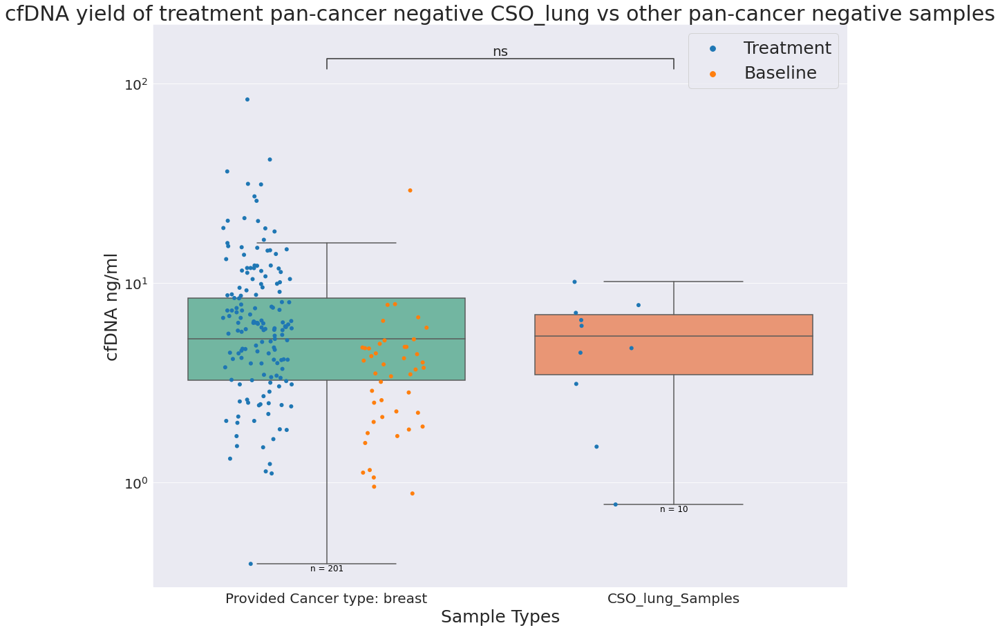

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:5.023e-01 t=6.731e-01


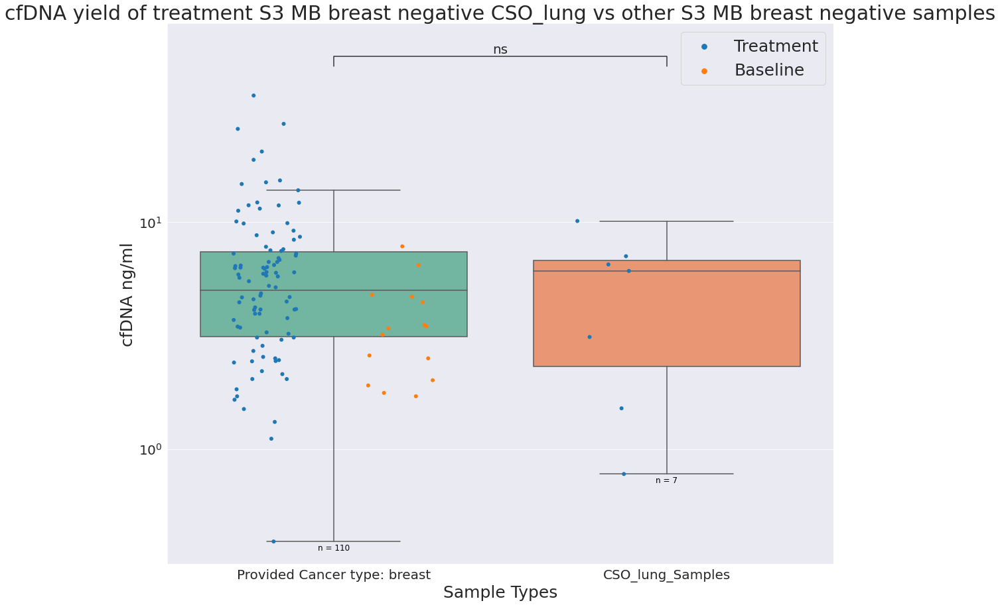

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:3.998e-01 t=8.455e-01


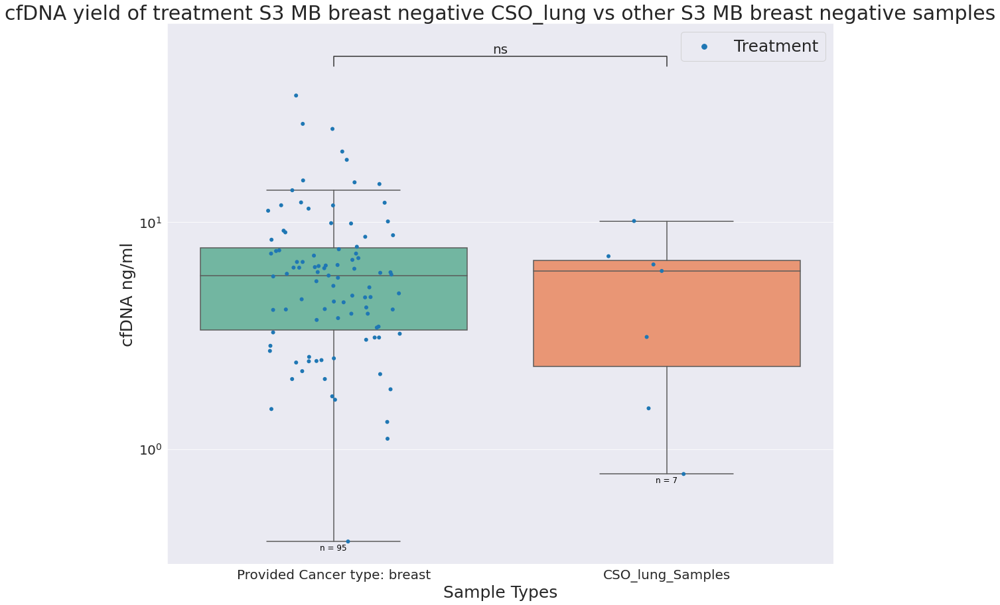

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:3.052e-01 t=1.031e+00


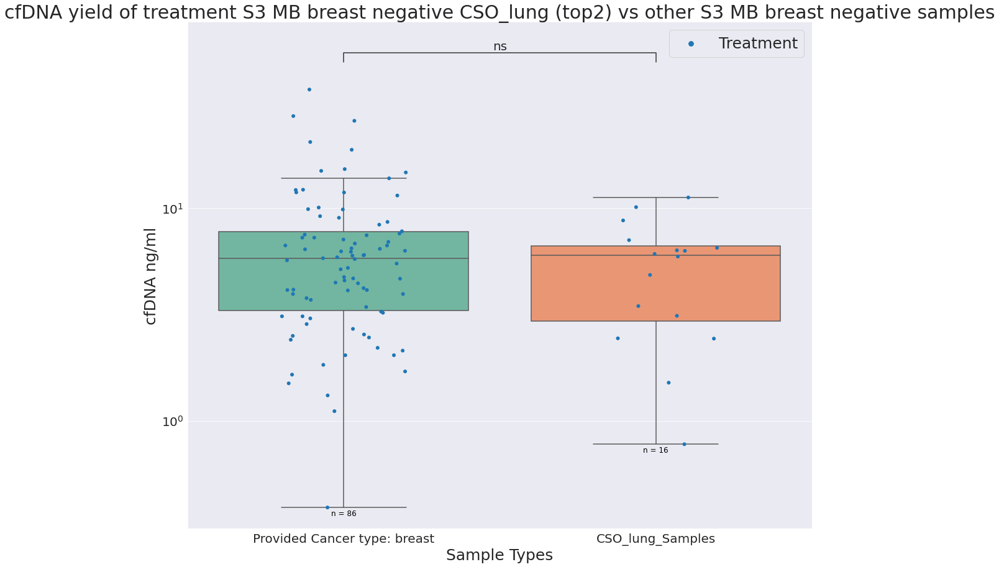

In [78]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(df, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'CSO_Lung_Sample' categories
    hue_order = df['CSO_Lung_Sample'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    hue_order = ['Provided Cancer type: breast', 'CSO_lung_Samples']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    sns.stripplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", hue = "treatment", ax=ax, dodge=True, jitter=0.2, size=6)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # Offset for sample size annotation, adjust as needed
    offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    for plot_type, cancer_group in df.groupby('CSO_Lung_Sample'):
        n = cancer_group.shape[0]
        type_pos = hue_order.index(plot_type)
        center = ax.get_xticks()[type_pos]  # Center position of each category
        ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="CSO_Lung_Sample", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=20)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample Types', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    ax.legend(fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)


    plt.show()

# Daichi sow21
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub, 'cfDNA yield of all CSO_lung vs other samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_1, 'cfDNA yield of all CSO_lung vs other pan-cancer negative samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_2, 'cfDNA yield of treatment CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_3, 'cfDNA yield of treatment pan-cancer negative CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_4, 'cfDNA yield of treatment S3 MB breast negative CSO_lung vs other S3 MB breast negative samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_6, 'cfDNA yield of treatment S3 MB breast negative CSO_lung (top2) vs other S3 MB breast negative samples')

cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_4_treatment, 'cfDNA yield of treatment S3 MB breast negative CSO_lung vs other S3 MB breast negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_6_treatment, 'cfDNA yield of treatment S3 MB breast negative CSO_lung (top2) vs other S3 MB breast negative samples')


In [ ]:

# top_prd_df_gliead_4 = top_prd_df_gliead[~((top_prd_df_gliead['Pancancer_call'] == True) & (top_prd_df_gliead['treatment'] == 'Baseline'))]

# print(top_prd_df_gliead_4.groupby('treatment').Pancancer_call.value_counts())
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead_4, 'cfDNA yield of treatment pan-cancer negative CSO_lung vs other pan-cancer negative samples')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CSO_lung_Samples vs. Provided Cancer type: breast: t-test independent samples, P_val:1.849e-01 t=-1.334e+00


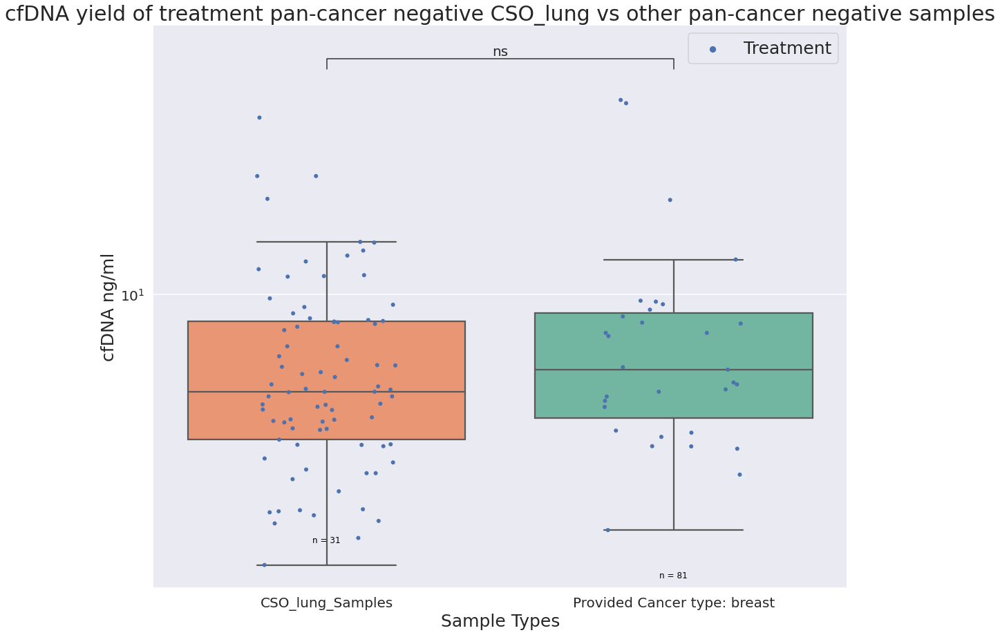

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CSO_lung_Samples vs. Provided Cancer type: breast: t-test independent samples, P_val:8.735e-01 t=-1.599e-01


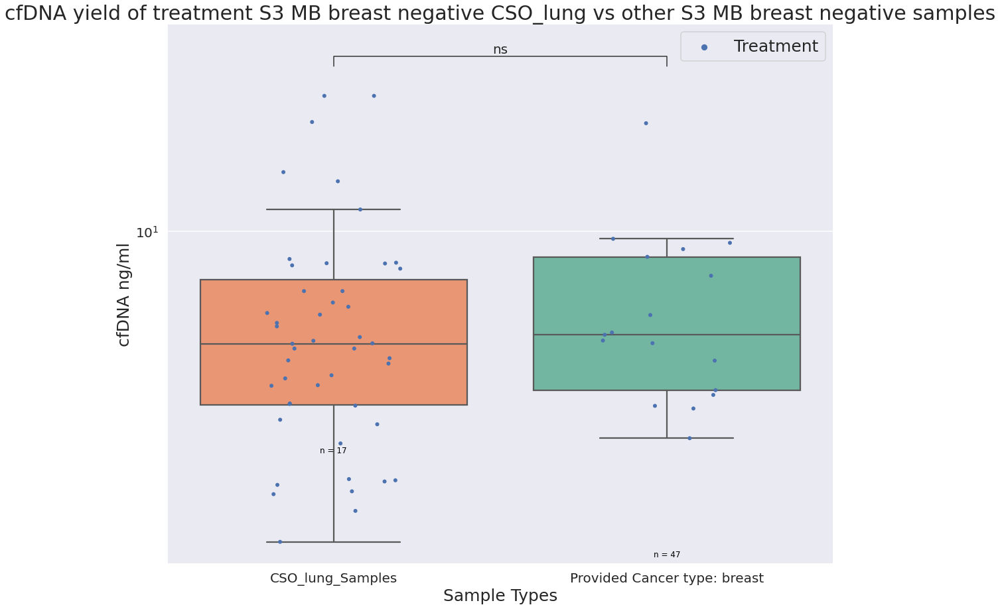

In [170]:
# For Control cohort AZ SOW183 & 117
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az, 'cfDNA yield of all CSO_lung vs other samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az_1, 'cfDNA yield of all CSO_lung vs other pan-cancer negative samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az_2, 'cfDNA yield of treatment CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az_3, 'cfDNA yield of treatment pan-cancer negative CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_az_4, 'cfDNA yield of treatment S3 MB breast negative CSO_lung vs other S3 MB breast negative samples')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Provided Cancer type: breast vs. CSO_lung_Samples: t-test independent samples, P_val:5.032e-01 t=-8.095e-01


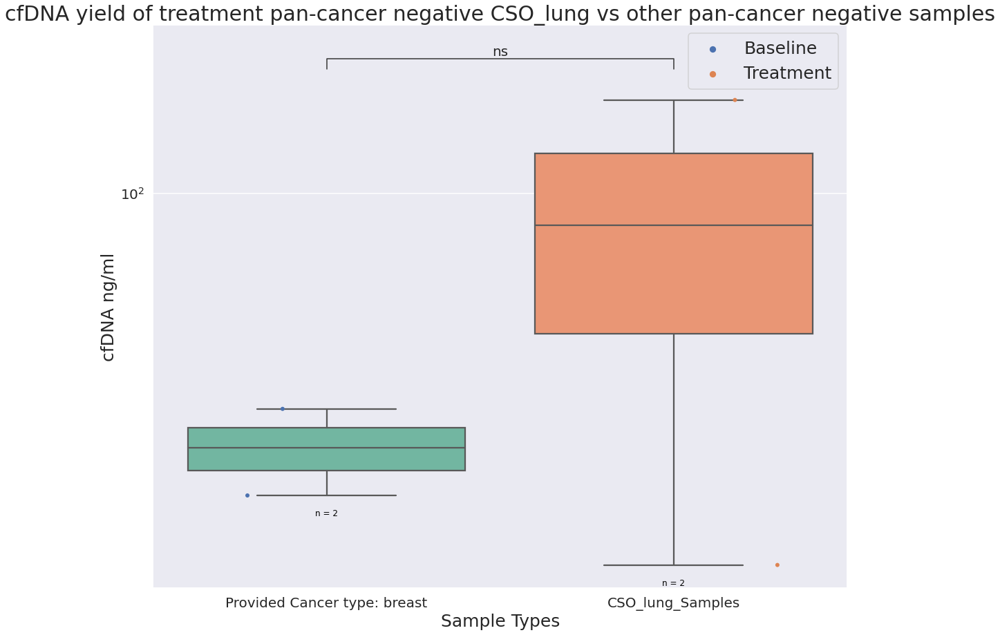

In [171]:
# For control cohort Gilead SOW3
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead, 'cfDNA yield of all CSO_lung vs other samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead_1, 'cfDNA yield of all CSO_lung vs other pan-cancer negative samples')
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead_2, 'cfDNA yield of treatment CSO_lung vs other pan-cancer negative samples')
cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_gliead_3, 'cfDNA yield of treatment pan-cancer negative CSO_lung vs other pan-cancer negative samples')

##### Deprecated plots start here

In [ ]:
# Define a new column called "CSO_Lung_Sample" to indicate if this sample is High CSO lung prediction sample (treatment)

# Prepare the cfDNA plot data by 
## 1. limited to certain cohorts
## 2. Identify the CSO group

# 1. limited to certain cohorts
target_files = [
    "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv", 
    "20240122_GuardantHealthIST_IST01_Batch1_138Samples_InfinityReport.csv"
    # "20240503_AstraZeneca_SOW183_Batch1_881Samples_InfinityReport.csv"
    # "20231219_ParkerInstitutePICI_RP01_Batch2_1458Samples_InfinityReport.csv",
    # "20240108_ParkerInstitutePICI_RP_01_645Samples_InfinityReport.csv"
]

top_prd_df_sub = top_prd_df[top_prd_df['csv_file_name'].isin(target_files)]

# Extract the GHSampleIDs from df_lung_cso
# high_digestive_samples = df_lung_cso['GHSampleID'].unique()
# high_lung_samples = df_lung_cso_baseline['GHSampleID'].unique()
high_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()


# Create a new column that will be True if the sample is in high_lung_samples
top_prd_df_sub['CSO_Lung_Sample'] = top_prd_df_sub['GHSampleID'].isin(high_lung_samples)

# Create a new column for plotting that combines original cancer types and the new category
top_prd_df_sub['CSO_Lung_Sample'] = top_prd_df_sub.apply(
    lambda row: 'High_CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
    axis=1
)

# Remove missing values in cfDNA_ng before plotting
top_prd_df_sub = top_prd_df_sub.dropna(subset=['cfDNA_ng'])
top_prd_df_sub = top_prd_df_sub.dropna(subset=['Plasma_ml_input'])

In [ ]:
# Compare cfDNA between High lung CSO samples and other samples by csv_file_name

def cfDNA_boxplot_cancer_type_csv(df):
    fig, ax0 = plt.subplots(nrows=1, figsize=(18, 15))
    sns.set_style('darkgrid')

    order = df['csv_file_name'].unique().tolist()
    hue_order = df['CSO_Lung_Sample'].unique().tolist()

    sns.boxplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="CSO_Lung_Sample", showfliers=False, 
                ax=ax0, order=order, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="CSO_Lung_Sample",
                  ax=ax0, order=order, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax0.set_yscale('log')

    # Perform and print t-test results for each csv_file_name
    for csv_file in order:
        sub_df = df[df['csv_file_name'] == csv_file]
        types = sub_df['CSO_Lung_Sample'].unique().tolist()
        if len(types) > 1:
            for i in range(len(types)):
                for j in range(i+1, len(types)):
                    group1 = sub_df[sub_df['CSO_Lung_Sample'] == types[i]]['cfDNA_ng']
                    group2 = sub_df[sub_df['CSO_Lung_Sample'] == types[j]]['cfDNA_ng']
                    t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)  # Welch's t-test
                    print(f"T-test between {types[i]} and {types[j]} in {csv_file}: t-statistic = {t_stat:.3f}, p-value = {p_val:.3g}")
    
    # Handle the legend to only show boxplot color coding
    handles, labels = ax0.get_legend_handles_labels()
    l = len(df['CSO_Lung_Sample'].unique())  # Number of unique categories in hue
    ax0.legend(handles[:l], labels[:l], title='CSO_Lung_Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    
    # Labels
    plt.title('cfDNA yield by Batch and Cancer Type of Treatment samples', fontsize=15)
    ax0.set_xlabel('Top2 Batches with high lung CSO predicted and non-lung samples', fontsize=15)
    ax0.set_ylabel('cfDNA_ng', fontsize=15)
    # ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12, rotation=45, ha="right")
    ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12)

    
    plt.show()

# For treatment sample only
top_prd_df_sub_treatment = top_prd_df_sub[top_prd_df_sub["treatment"] == "Treatment"]
cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_treatment)


In [ ]:
# from statannotations.Annotator import Annotator

# def cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(df):
#     # Set up the figure with original size and grid style
#     fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
#     sns.set_style('darkgrid')

#     # Order based on the 'CSO_Lung_Sample' categories
#     hue_order = df['CSO_Lung_Sample'].unique().tolist()

#     # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
#     # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
#     hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
#     default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
#     color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

#     # Create boxplot and stripplot without using csv_file_name
#     sns.boxplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
#     sns.stripplot(data=df, x="CSO_Lung_Sample", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

#     # Log scale for the y-axis
#     ax.set_yscale('log')

#     # Annotate sample sizes with offset
#     # # Offset for sample size annotation, adjust as needed
#     # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
#     # for plot_type, cancer_group in df.groupby('CSO_Lung_Sample'):
#     #     n = cancer_group.shape[0]
#     #     type_pos = hue_order.index(plot_type)
#     #     center = ax.get_xticks()[type_pos]  # Center position of each category
#     #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


#     # Setting up the Annotator with the appropriate pairs
#     if len(hue_order) > 1:
#         pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
#         annotator = Annotator(ax, pairs, data=df, x="CSO_Lung_Sample", y="cfDNA_ng")
#         annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
#         annotator.apply_and_annotate()

#     # # Adjusting the legend to match original settings
#     # handles, labels = ax.get_legend_handles_labels()
#     # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

#     # Set plot labels and title to match the original
#     plt.title('cfDNA yield: High lung CSO treatment vs Treatment samples in Daiichi SOW21', fontsize=25)
#     ax.set_xlabel('CSO Lung Sample Types', fontsize=15)
#     ax.set_ylabel('cfDNA_ng', fontsize=15)
#     ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)

#     plt.show()

# # cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_treatment)

# # For treatment sample only
# top_prd_df_sub_treatment = top_prd_df_sub[top_prd_df_sub["treatment"] == "Treatment"]
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_treatment)

# # # For treatment pan-cancer negative sample only
# # top_prd_df_sub_treatmen_neg = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["Pancancer_call"] == False)]
# # cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_treatmen_neg)

# # For baseline sample only and you will need to change the title
# top_prd_df_sub_baseline = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Baseline") | (top_prd_df_sub["CSO_Lung_Sample"] == "High_CSO_lung_Samples")]
# cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_with_annotation(top_prd_df_sub_baseline)

In [ ]:
# To do an apple-to-apple comparison as Yuval's result: control vs IPF vs ILD. So among all treatment, pan-cancer binary call is used. 
top_prd_df_sub_treatment = top_prd_df_sub[top_prd_df_sub["treatment"] == "Treatment"]
print(top_prd_df_sub_treatment.groupby("CSO_Lung_Sample").Pancancer_call.value_counts())

# Define a function to categorize based on the conditions
def categorize_pan_cancer(row):
    if row['Pancancer_call'] == False:
        return 'pan_cancer_negative'
    elif row['Pancancer_call'] == True:
        if row['CSO_Lung_Sample'] == 'High_CSO_lung_Samples':
            return 'Pan_cancer_positive_High_CSO_lung_Sample'
        else:
            return 'Pan_cancer_positive_Provided_Breast_Sample'

# Apply the function to create the new column
top_prd_df_sub_treatment['pan_cancer_category'] = top_prd_df_sub_treatment.apply(categorize_pan_cancer, axis=1)

top_prd_df_sub_treatment.pan_cancer_category.value_counts()

In [ ]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_byPanCancerCall_with_annotation(df):
    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'pan_cancer_category' categories
    hue_order = df['pan_cancer_category'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    hue_order = ['Pan_cancer_positive_Provided_Breast_Sample', 'Pan_cancer_positive_High_CSO_lung_Sample', 'pan_cancer_negative']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="pan_cancer_category", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    sns.stripplot(data=df, x="pan_cancer_category", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # # Offset for sample size annotation, adjust as needed
    # offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    # for plot_type, cancer_group in df.groupby('pan_cancer_category'):
    #     n = cancer_group.shape[0]
    #     type_pos = hue_order.index(plot_type)
    #     center = ax.get_xticks()[type_pos]  # Center position of each category
    #     ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="pan_cancer_category", y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title('cfDNA yield of Treatment samples: Pan-cancer - treatment vs High lung CSO treatment (pan-cancer +) vs Other treatment (pan-cancer +)', fontsize=25)
    ax.set_xlabel('Pan-cancery call & CSO prediction', fontsize=15)
    ax.set_ylabel('cfDNA_ng', fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)

    plt.show()


cfDNA_boxplot_by_CSOpred_vs_Provided_one_batch_byPanCancerCall_with_annotation(top_prd_df_sub_treatment)


In [ ]:
# Compare cfDNA between High lung CSO samples and other samples by csv_file_name

def cfDNA_boxplot_cancer_type_csv(df):
    fig, ax0 = plt.subplots(nrows=1, figsize=(18, 15))
    sns.set_style('darkgrid')

    order = df['csv_file_name'].unique().tolist()
    hue_order = df['CSO_Lung_Sample'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples', 'Provided Cancer type: pancreatic']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    sns.boxplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="CSO_Lung_Sample", showfliers=False, 
                ax=ax0, order=order, dodge=True, palette='Set2')
    sns.stripplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="CSO_Lung_Sample",
                  ax=ax0, order=order, dodge=True, color='gray', jitter=0.2, size=4)

    # Annotate sample sizes with offset

    # Log scale for the y-axis
    ax0.set_yscale('log')

    # # Offset for sample size annotation, adjust as needed
    # offset = 1  # Adjust the value

    # for (csv_file, plot_type), cancer_group in df.groupby(['csv_file_name', 'CSO_Lung_Sample']):
    #     n = cancer_group.shape[0]
    #     file_pos = order.index(csv_file)
    #     type_pos = hue_order.index(plot_type)
    #     center = ax0.get_xticks()[file_pos] + (type_pos - (len(hue_order) - 1) / 2) * 0.2
    #     ax0.text(center, cancer_group['cfDNA_ng'].min() + offset, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # Perform and print t-test results for each csv_file_name
    for csv_file in order:
        sub_df = df[df['csv_file_name'] == csv_file]
        types = sub_df['CSO_Lung_Sample'].unique().tolist()
        if len(types) > 1:
            for i in range(len(types)):
                for j in range(i+1, len(types)):
                    group1 = sub_df[sub_df['CSO_Lung_Sample'] == types[i]]['cfDNA_ng']
                    group2 = sub_df[sub_df['CSO_Lung_Sample'] == types[j]]['cfDNA_ng']
                    t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)  # Welch's t-test
                    print(f"T-test between {types[i]} and {types[j]} in {csv_file}: t-statistic = {t_stat:.3f}, p-value = {p_val:.3g}")
    
    # Handle the legend to only show boxplot color coding
    handles, labels = ax0.get_legend_handles_labels()
    l = len(df['CSO_Lung_Sample'].unique())  # Number of unique categories in hue
    ax0.legend(handles[:l], labels[:l], title='CSO_Lung_Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    
    # Labels
    plt.title('cfDNA yield by Batch and Cancer Type of all samples (excluded EOT samples) ', fontsize=25)
    ax0.set_xlabel('Top2 Batches with high lung CSO predicted and non-lung samples', fontsize=15)
    ax0.set_ylabel('cfDNA_ng', fontsize=15)
    # ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12, rotation=45, ha="right")
    ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12)

    
    plt.show()

# # For treatment sample only
# top_prd_df_sub_treatment = top_prd_df_sub[top_prd_df_sub["treatment"] == "Treatment"]
# cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_treatment)

# # For baseline sample only and you will need to change the title
# top_prd_df_sub_baseline = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Baseline") | (top_prd_df_sub["CSO_Lung_Sample"] == "High_CSO_lung_Samples")]
# cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_baseline)

# # For treatment sample only pan cancer caller positive
# top_prd_df_sub_treatment_pan_pos = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["Pancancer_call"] == True)]
# cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_treatment_pan_pos)

# # For baseline sample only and you will need to change the title pan cancer caller positive
# top_prd_df_sub_baseline_pan_pos = top_prd_df_sub[((top_prd_df_sub["treatment"] == "Baseline") | (top_prd_df_sub["CSO_Lung_Sample"] == "High_CSO_lung_Samples")) & (top_prd_df_sub["Pancancer_call"] == True)]
# cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_baseline_pan_pos)

# For all sample 
top_prd_df_sub_all = top_prd_df_sub[top_prd_df_sub["treatment"] != "other"]
cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_all)

# For all sample pan cancer caller negative
top_prd_df_sub_all_pan_neg = top_prd_df_sub[(top_prd_df_sub["treatment"] != "other") & (top_prd_df_sub["Pancancer_call"] == False)]
cfDNA_boxplot_cancer_type_csv(top_prd_df_sub_all_pan_neg)

In [ ]:
# Compare cfDNA between High lung CSO samples and other CSO predicted cancer type (only breast and lung) by treatment in Daiichi SOW21

df_cso_breast_lung_daiichi = top_prd_df_sub[(top_prd_df_sub["treatment"].isin(['Baseline', 'Treatment'])) & (top_prd_df_sub["csv_file_name"] == "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv")]
# (top_prd_df_sub["cso_prediction"].isin(['breast', 'lung'])) & 

def cfDNA_boxplot_cso_predict_treatment(df):
    fig, ax0 = plt.subplots(nrows=1, figsize=(20, 20))
    sns.set_style('darkgrid')

    order = df['treatment'].unique().tolist()
    hue_order = df['cso_prediction'].unique().tolist()

    # # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette="color_map"" in the sns.boxplot!!!!!
    # hue_order = ['breast', 'lung']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    sns.boxplot(data=df, x="treatment", y="cfDNA_ng", hue="cso_prediction", showfliers=False, 
                ax=ax0, order=order, dodge=True, palette="Set2")
    sns.stripplot(data=df, x="treatment", y="cfDNA_ng", hue="cso_prediction",
                  ax=ax0, order=order, dodge=True, color='gray', jitter=0.2, size=4)

    # Annotate sample sizes with offset

    # Log scale for the y-axis
    ax0.set_yscale('log')

    # # Offset for sample size annotation, adjust as needed
    # offset = 1  # Adjust the value

    # for (csv_file, plot_type), cancer_group in df.groupby(['treatment', 'cso_prediction']):
    #     n = cancer_group.shape[0]
    #     file_pos = order.index(csv_file)
    #     type_pos = hue_order.index(plot_type)
    #     center = ax0.get_xticks()[file_pos] + (type_pos - (len(hue_order) - 1) / 2) * 0.2
    #     ax0.text(center, cancer_group['cfDNA_ng'].min() + offset, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # # Perform and print t-test results for each treatment
    # for csv_file in order:
    #     sub_df = df[df['treatment'] == csv_file]
    #     types = sub_df['cso_prediction'].unique().tolist()
    #     if len(types) > 1:
    #         for i in range(len(types)):
    #             for j in range(i+1, len(types)):
    #                 group1 = sub_df[sub_df['cso_prediction'] == types[i]]['cfDNA_ng']
    #                 group2 = sub_df[sub_df['cso_prediction'] == types[j]]['cfDNA_ng']
    #                 t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)  # Welch's t-test
    #                 print(f"T-test between {types[i]} and {types[j]} in {csv_file}: t-statistic = {t_stat:.3f}, p-value = {p_val:.3g}")

    # Handle the legend to only show boxplot color coding
    handles, labels = ax0.get_legend_handles_labels()
    l = len(df['cso_prediction'].unique())  # Number of unique categories in hue
    ax0.legend(handles[:l], labels[:l], title='cso_prediction', loc='upper right', bbox_to_anchor=(1.05, 1))

    
    # Labels
    plt.title('cfDNA yield by treatment and CSO prediction in Daiichi SOW21', fontsize=25)
    ax0.set_xlabel('Treatment', fontsize=15)
    ax0.set_ylabel('cfDNA_ng', fontsize=15)
    ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12)
    
    plt.show()

# Call the function with the cleaned DataFrame
cfDNA_boxplot_cso_predict_treatment(df_cso_breast_lung_daiichi)


##### Deprecated plots end here

##### Paired analysis (treatment and baseline) e.g. CSO breast baseline vs CSO breast treatment; CSO breast baseline vs CSO lung treatment

In [ ]:
# # For suspicious high lung CSO treatment samples in Daiichi SOW21, find their paired baseline samples to compare cfDNA yield by using paired t-test

# # # Only run this when selecting pancancer positive samples
# # top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]


# # Identify lung CSO treatment samples
# top_prd_tf_daiichi = top_prd_df_sub[(top_prd_df_sub["csv_file_name"] == "20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv") & (top_prd_df_sub["CSO_Lung_Sample"] == "High_CSO_lung_Samples")]

# # Map corresponding baseline samples based on Paitent_ID
# top_prd_tf_daiichi_patient_id_list = top_prd_tf_daiichi.Patient_ID.unique().tolist()
# top_prd_df_daiichi_lung_pair = top_prd_df[top_prd_df.Patient_ID.isin(top_prd_tf_daiichi_patient_id_list)]
# top_prd_df_daiichi_lung_pair = top_prd_df_daiichi_lung_pair[top_prd_df_daiichi_lung_pair["treatment"] != "other"]
# print(top_prd_df_daiichi_lung_pair.treatment.value_counts())


# # Make sure the sample size n sample when do paired t-test

# # Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
# valid_patients = top_prd_df_daiichi_lung_pair.groupby('Patient_ID').filter(
#     lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
# )

# # Initialize an empty DataFrame to store the matched pairs
# df_daiichi_pair = pd.DataFrame()

# # For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
# for patient_id, group in valid_patients.groupby('Patient_ID'):
#     treatment_samples = group[group['treatment'] == 'Treatment']
#     baseline_samples = group[group['treatment'] == 'Baseline']
    
#     # Ensure that the number of samples from each treatment type is balanced
#     min_samples = min(len(treatment_samples), len(baseline_samples))
    
#     if min_samples > 0:  # If there are samples to add
#         balanced_treatment_samples = treatment_samples.iloc[:min_samples]
#         balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
#         # Append these balanced samples to the filtered DataFrame
#         df_daiichi_pair = pd.concat([df_daiichi_pair, balanced_treatment_samples, balanced_baseline_samples])

# print(df_daiichi_pair['treatment'].value_counts())

# # # Creat a new column "CSO_Lung_Sample" 
# # high_lung_samples = df_lung_cso_treatment['GHSampleID'].unique()

# # # Create a new column that will be True if the sample is in high_lung_samples
# # df_daiichi_pair['CSO_Lung_Sample'] = df_daiichi_pair['GHSampleID'].isin(high_lung_samples)

# # # Create a new column for plotting that combines original cancer types and the new category
# # df_daiichi_pair['CSO_Lung_Sample'] = df_daiichi_pair.apply(
# #     lambda row: 'High_CSO_lung_Samples' if row['CSO_Lung_Sample'] else 'Provided Cancer type: ' + str(row['new_defined_cancer_type']),
# #     axis=1
# # )



In [172]:
# For other paired sample comparison in Daiichi SOW21

# # Only run this when selecting pancancer positive samples
# top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]

# Identify CSO breast treatment samples
top_prd_tf_breast_treat = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["cso_prediction"] == "breast") & (top_prd_df_sub["CSO_rank"] == 1)]

# Map corresponding baseline samples based on Paitent_ID
top_prd_tf_breast_treat_patient_id_list = top_prd_tf_breast_treat.Patient_ID.unique().tolist()
top_prd_df_breast_pair = top_prd_df[top_prd_df.Patient_ID.isin(top_prd_tf_breast_treat_patient_id_list)]
top_prd_df_breast_pair = top_prd_df_breast_pair[top_prd_df_breast_pair["treatment"] != "other"]
print(top_prd_df_breast_pair.treatment.value_counts())


# Make sure the sample size n sample when do paired t-test

# Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
valid_patients = top_prd_df_breast_pair.groupby('Patient_ID').filter(
    lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
)

# Initialize an empty DataFrame to store the matched pairs
top_prd_df_breast_pair = pd.DataFrame()

# For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
for patient_id, group in valid_patients.groupby('Patient_ID'):
    treatment_samples = group[group['treatment'] == 'Treatment']
    baseline_samples = group[group['treatment'] == 'Baseline']
    
    # Ensure that the number of samples from each treatment type is balanced
    min_samples = min(len(treatment_samples), len(baseline_samples))
    
    if min_samples > 0:  # If there are samples to add
        balanced_treatment_samples = treatment_samples.iloc[:min_samples]
        balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
        # Append these balanced samples to the filtered DataFrame
        top_prd_df_breast_pair = pd.concat([top_prd_df_breast_pair, balanced_treatment_samples, balanced_baseline_samples])

print(top_prd_df_breast_pair['treatment'].value_counts())

Treatment    81
Baseline     25
Name: treatment, dtype: int64
Treatment    23
Baseline     23
Name: treatment, dtype: int64


In [179]:
# For other paired sample comparison in Daiichi SOW21

# # Only run this when selecting pancancer positive samples
# top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]


# Identify lung treatment samples
top_prd_df_lung_treat = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["cso_prediction"] == "lung") & (top_prd_df_sub["CSO_rank"] == 1)]
# top_prd_df_lung_treat = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["cso_prediction"] == "lung") & (top_prd_df_sub["CSO_rank"] == 1) & (top_prd_df_sub["Pancancer_call"] == False)]

# Map corresponding baseline samples based on Paitent_ID
top_prd_df_lung_treat_patient_id_list = top_prd_df_lung_treat.Patient_ID.unique().tolist()
top_prd_df_lung_pair = top_prd_df[top_prd_df.Patient_ID.isin(top_prd_df_lung_treat_patient_id_list)]
top_prd_df_lung_pair = top_prd_df_lung_pair[top_prd_df_lung_pair["treatment"] != "other"]

# Make sure the baseline sample prediction is breast
top_prd_df_lung_pair = top_prd_df_lung_pair[~((top_prd_df_lung_pair["cso_prediction"] != "breast") & (top_prd_df_lung_pair["treatment"] == "Baseline"))]

# filter for pan-cancer negative sample for baseline
# top_prd_df_lung_pair = top_prd_df_lung_pair[~((top_prd_df_lung_pair["Pancancer_call"] == True) & (top_prd_df_lung_pair["treatment"] == "Baseline"))]
top_prd_df_lung_pair.groupby('treatment').cso_prediction.value_counts()
print(top_prd_df_lung_pair.treatment.value_counts())

# Make sure the sample size n sample when do paired t-test

# Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
valid_patients = top_prd_df_lung_pair.groupby('Patient_ID').filter(
    lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
)

# Initialize an empty DataFrame to store the matched pairs
top_prd_df_lung_pair = pd.DataFrame()

# For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
for patient_id, group in valid_patients.groupby('Patient_ID'):
    treatment_samples = group[group['treatment'] == 'Treatment']
    baseline_samples = group[group['treatment'] == 'Baseline']
    
    # Ensure that the number of samples from each treatment type is balanced
    min_samples = min(len(treatment_samples), len(baseline_samples))
    
    if min_samples > 0:  # If there are samples to add
        balanced_treatment_samples = treatment_samples.iloc[:min_samples]
        balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
        # Append these balanced samples to the filtered DataFrame
        top_prd_df_lung_pair = pd.concat([top_prd_df_lung_pair, balanced_treatment_samples, balanced_baseline_samples])

print(top_prd_df_lung_pair['treatment'].value_counts())


Treatment    170
Baseline      94
Name: treatment, dtype: int64
Treatment    94
Baseline     94
Name: treatment, dtype: int64


In [174]:
# For other paired sample comparison in AZ SOW183&SWO117

# # Only run this when selecting pancancer positive samples
# top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]

# Identify CSO breast treatment samples
top_prd_tf_breast_treat = top_prd_df_az[(top_prd_df_az["treatment"] == "Treatment") & (top_prd_df_az["cso_prediction"] == "breast") & (top_prd_df_az["CSO_rank"] == 1)]

# Map corresponding baseline samples based on Paitent_ID
top_prd_tf_breast_treat_patient_id_list = top_prd_tf_breast_treat.Patient_ID.unique().tolist()
top_prd_df_breast_pair_az = top_prd_df_az[top_prd_df_az.Patient_ID.isin(top_prd_tf_breast_treat_patient_id_list)]
top_prd_df_breast_pair_az = top_prd_df_breast_pair_az[top_prd_df_breast_pair_az["treatment"] != "other"]
print(top_prd_df_breast_pair_az.treatment.value_counts())


# Make sure the sample size n sample when do paired t-test

# Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
valid_patients = top_prd_df_breast_pair_az.groupby('Patient_ID').filter(
    lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
)

# Initialize an empty DataFrame to store the matched pairs
top_prd_df_breast_pair_az = pd.DataFrame()

# For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
for patient_id, group in valid_patients.groupby('Patient_ID'):
    treatment_samples = group[group['treatment'] == 'Treatment']
    baseline_samples = group[group['treatment'] == 'Baseline']
    
    # Ensure that the number of samples from each treatment type is balanced
    min_samples = min(len(treatment_samples), len(baseline_samples))
    
    if min_samples > 0:  # If there are samples to add
        balanced_treatment_samples = treatment_samples.iloc[:min_samples]
        balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
        # Append these balanced samples to the filtered DataFrame
        top_prd_df_breast_pair_az = pd.concat([top_prd_df_breast_pair_az, balanced_treatment_samples, balanced_baseline_samples])

print(top_prd_df_breast_pair_az['treatment'].value_counts())

Treatment    672
Baseline     372
Name: treatment, dtype: int64
Treatment    371
Baseline     371
Name: treatment, dtype: int64


In [175]:
# For other paired sample comparison in AZ SOW183&SWO117

# # Only run this when selecting pancancer positive samples
# top_prd_df_sub = top_prd_df_sub[top_prd_df_sub['Pancancer_call'] == True]


# Identify lung treatment samples
top_prd_df_lung_treat = top_prd_df_az[(top_prd_df_az["treatment"] == "Treatment") & (top_prd_df_az["cso_prediction"] == "lung") & (top_prd_df_az["CSO_rank"] == 1)]
# top_prd_df_lung_treat = top_prd_df_sub[(top_prd_df_sub["treatment"] == "Treatment") & (top_prd_df_sub["cso_prediction"] == "lung") & (top_prd_df_sub["CSO_rank"] == 1) & (top_prd_df_sub["Pancancer_call"] == False)]

# Map corresponding baseline samples based on Paitent_ID
top_prd_df_lung_treat_patient_id_list = top_prd_df_lung_treat.Patient_ID.unique().tolist()
top_prd_df_lung_pair = top_prd_df_az[top_prd_df_az.Patient_ID.isin(top_prd_df_lung_treat_patient_id_list)]
# top_prd_df_lung_pair = top_prd_df_lung_pair[top_prd_df_lung_pair["treatment"] != "other"]

# Make sure the baseline sample prediction is breast
# top_prd_df_lung_pair = top_prd_df_lung_pair[~((top_prd_df_lung_pair["cso_prediction"] != "breast") & (top_prd_df_lung_pair["treatment"] == "Baseline"))]

# filter for pan-cancer negative sample for baseline
top_prd_df_lung_pair_az = top_prd_df_lung_pair[~((top_prd_df_lung_pair["Pancancer_call"] == True) & (top_prd_df_lung_pair["treatment"] == "Baseline"))]
top_prd_df_lung_pair_az.groupby('treatment').cso_prediction.value_counts()
print(top_prd_df_lung_pair_az.treatment.value_counts())

# Make sure the sample size n sample when do paired t-test

# Filter the DataFrame to include only those patients who have both 'Treatment' and 'Baseline' entries
valid_patients = top_prd_df_lung_pair_az.groupby('Patient_ID').filter(
    lambda x: 'Treatment' in x['treatment'].values and 'Baseline' in x['treatment'].values
)

# Initialize an empty DataFrame to store the matched pairs
top_prd_df_lung_pair_az = pd.DataFrame()

# For each patient with both treatment types, match one 'Treatment' to one 'Baseline'
for patient_id, group in valid_patients.groupby('Patient_ID'):
    treatment_samples = group[group['treatment'] == 'Treatment']
    baseline_samples = group[group['treatment'] == 'Baseline']
    
    # Ensure that the number of samples from each treatment type is balanced
    min_samples = min(len(treatment_samples), len(baseline_samples))
    
    if min_samples > 0:  # If there are samples to add
        balanced_treatment_samples = treatment_samples.iloc[:min_samples]
        balanced_baseline_samples = baseline_samples.iloc[:min_samples]
        
        # Append these balanced samples to the filtered DataFrame
        top_prd_df_lung_pair_az = pd.concat([top_prd_df_lung_pair_az, balanced_treatment_samples, balanced_baseline_samples])

print(top_prd_df_lung_pair_az['treatment'].value_counts())


Treatment    228
Baseline     113
Name: treatment, dtype: int64
Treatment    113
Baseline     113
Name: treatment, dtype: int64


In [ ]:
def cfDNA_boxplot_cancer_type_csv_paired(df):
    fig, ax0 = plt.subplots(nrows=1, figsize=(15, 15))
    sns.set_style('darkgrid')

    order = df['csv_file_name'].unique().tolist()
    hue_order = df['treatment'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    hue_order = ['Baseline', 'Treatment']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    sns.boxplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="treatment", showfliers=False, 
                ax=ax0, order=order, dodge=True, palette=color_map)
    sns.stripplot(data=df, x="csv_file_name", y="cfDNA_ng", hue="treatment",
                  ax=ax0, order=order, dodge=True, color='gray', jitter=0.2, size=4)

    # Annotate sample sizes with offset

    # Log scale for the y-axis
    ax0.set_yscale('log')

    # Offset for sample size annotation, adjust as needed
    offset = 0.1  # Adjust the value

    # Annotate sample sizes with offset
    for (csv_file, treatment_type), group in df.groupby(['csv_file_name', 'treatment']):
        n = group.shape[0]
        file_pos = order.index(csv_file)
        type_pos = hue_order.index(treatment_type)
        center = ax0.get_xticks()[file_pos] + (type_pos - (len(hue_order) - 1) / 2) * 0.2
        ax0.text(center, group['cfDNA_ng'].min() + offset, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # Perform and print paired t-test results for each csv_file_name
    for csv_file in order:
        sub_df = df[df['csv_file_name'] == csv_file]
        types = sub_df['treatment'].unique().tolist()
        if len(types) == 2:  # Ensure there are exactly two groups for a paired t-test
            group1 = sub_df[sub_df['treatment'] == types[0]]['cfDNA_ng']
            group2 = sub_df[sub_df['treatment'] == types[1]]['cfDNA_ng']
            t_stat, p_val = stats.ttest_rel(group1, group2)  # Paired t-test
            print(f"Paired t-test between {types[0]} and {types[1]} in {csv_file}: t-statistic = {t_stat:.3f}, p-value = {p_val:.3g}")

    # Handle the legend to only show boxplot color coding
    handles, labels = ax0.get_legend_handles_labels()
    l = len(df['treatment'].unique())  # Number of unique categories in hue
    ax0.legend(handles[:l], labels[:l], title='treatment', loc='upper right', bbox_to_anchor=(1.05, 1))

    plt.title('cfDNA yield by Cancer Type of Paired Baseline-Treatment samples in Daiichi SOW21', fontsize=25)
    ax0.set_xlabel('Batch name', fontsize=15)
    ax0.set_ylabel('cfDNA_ng', fontsize=15)
    ax0.set_xticklabels(ax0.get_xticklabels(), fontsize=12)
    
    plt.show()

# Call the function with the cleaned DataFrame
cfDNA_boxplot_cancer_type_csv_paired(top_prd_df_lung_pair)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:4.157e-01 t=-8.157e-01


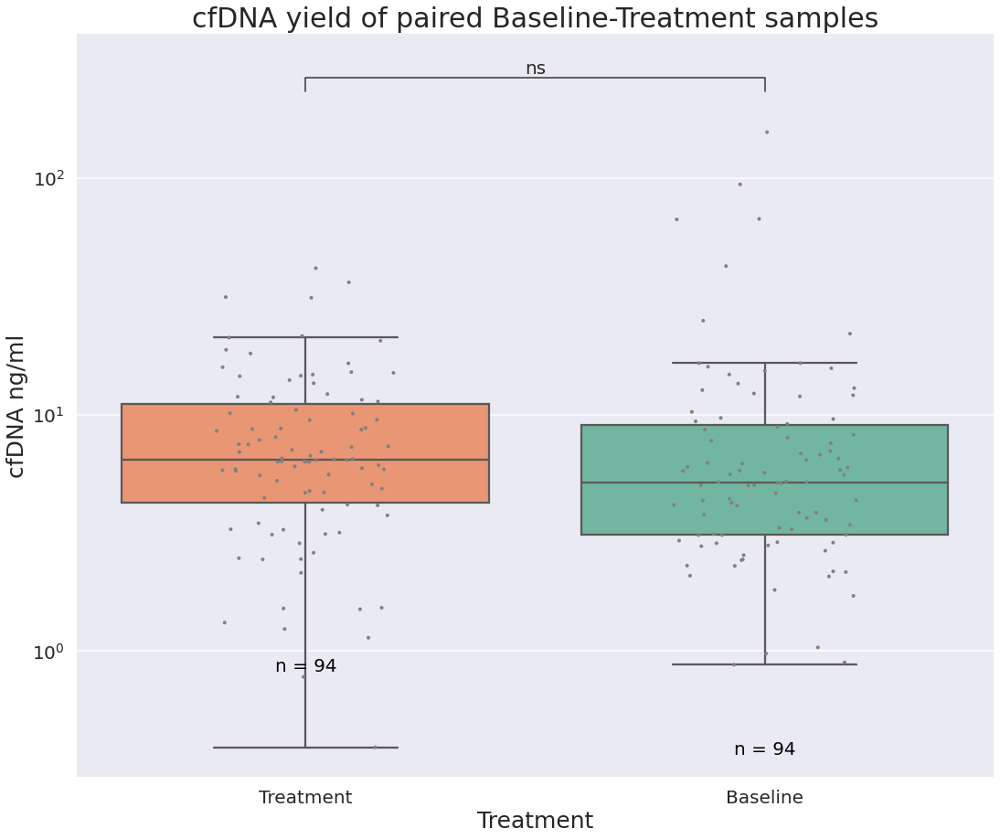

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:9.512e-01 t=-6.154e-02


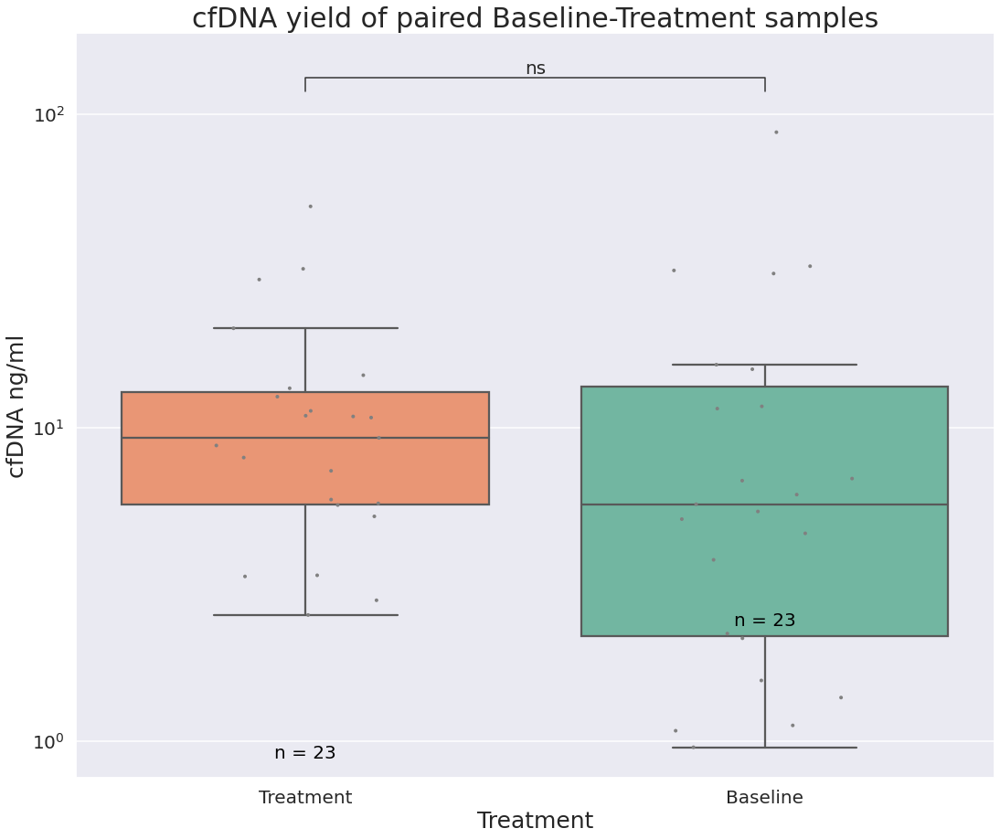

In [180]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(df, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'treatment' categories
    hue_order = df['treatment'].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    hue_order = ['Baseline', 'Treatment']
    default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x="treatment", y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette=color_map)
    sns.stripplot(data=df, x="treatment", y="cfDNA_ng", ax=ax, dodge=True, color='gray', jitter=0.2, size=4)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    for plot_type, cancer_group in df.groupby('treatment'):
        n = cancer_group.shape[0]
        type_pos = hue_order.index(plot_type)
        center = ax.get_xticks()[type_pos]  # Center position of each category
        ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=20, color='black')

    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x="treatment", y="cfDNA_ng", fontsize=20)
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=20)
        annotator.apply_and_annotate()

    # Set plot labels and title to match the original
    suffix_title
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Treatment', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)


    plt.show()


cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_lung_pair, 'cfDNA yield of paired Baseline-Treatment samples')
cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_breast_pair, 'cfDNA yield of paired Baseline-Treatment samples')

128
(144, 59)
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:2.933e-01 t=-1.055e+00


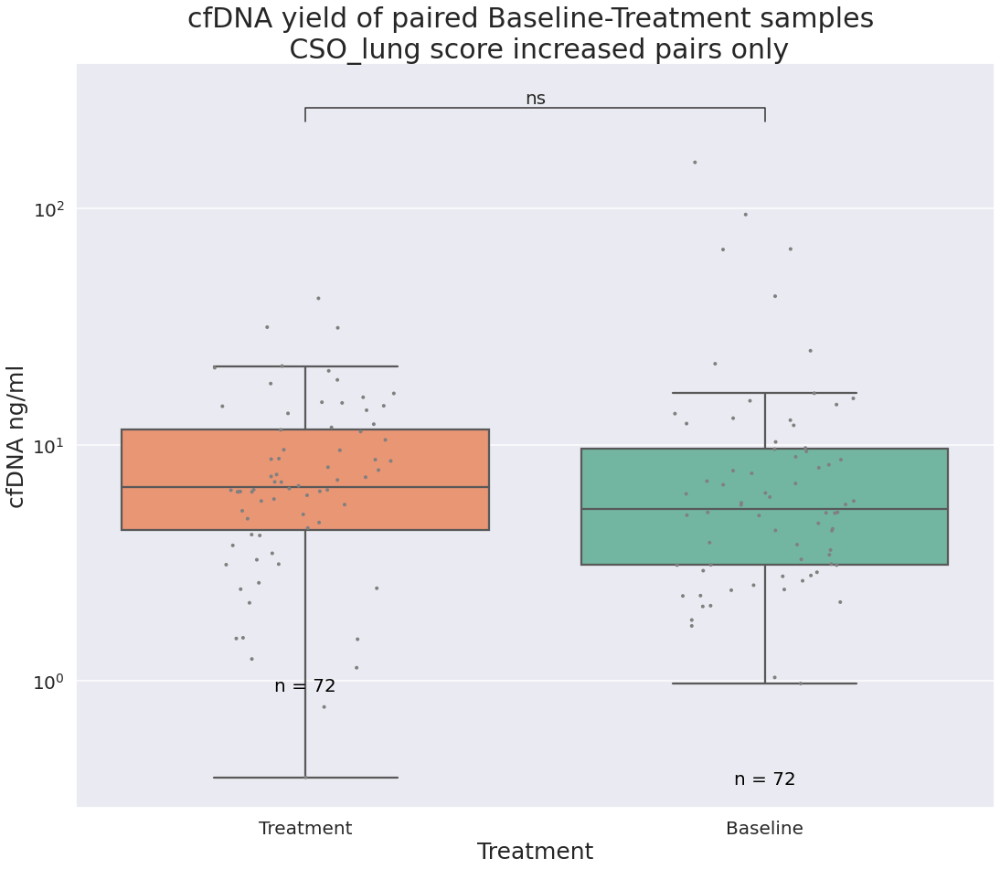

In [181]:

# Compare the cfDNA straifitied by CSO delta
# Lung
paired_data_daichii_lung["cso_lung_score_increased"] = np.where(paired_data_daichii_lung["delta_CSO_lung"] >= 0, 'cso_lung_score_increased', "cso_lung_score_decreased")

paired_data_daichii_lung_increased = paired_data_daichii_lung[paired_data_daichii_lung['cso_lung_score_increased'] == 'cso_lung_score_increased']

list_patient = paired_data_daichii_lung_increased.Patient_ID.tolist()
print(len(list_patient))

top_prd_df_lung_pair_increased = top_prd_df_lung_pair[top_prd_df_lung_pair['Patient_ID'].isin(list_patient)]
print(top_prd_df_lung_pair_increased.shape)
cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_lung_pair_increased, 'cfDNA yield of paired Baseline-Treatment samples \n CSO_lung score increased pairs only')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:3.903e-01 t=-8.608e-01


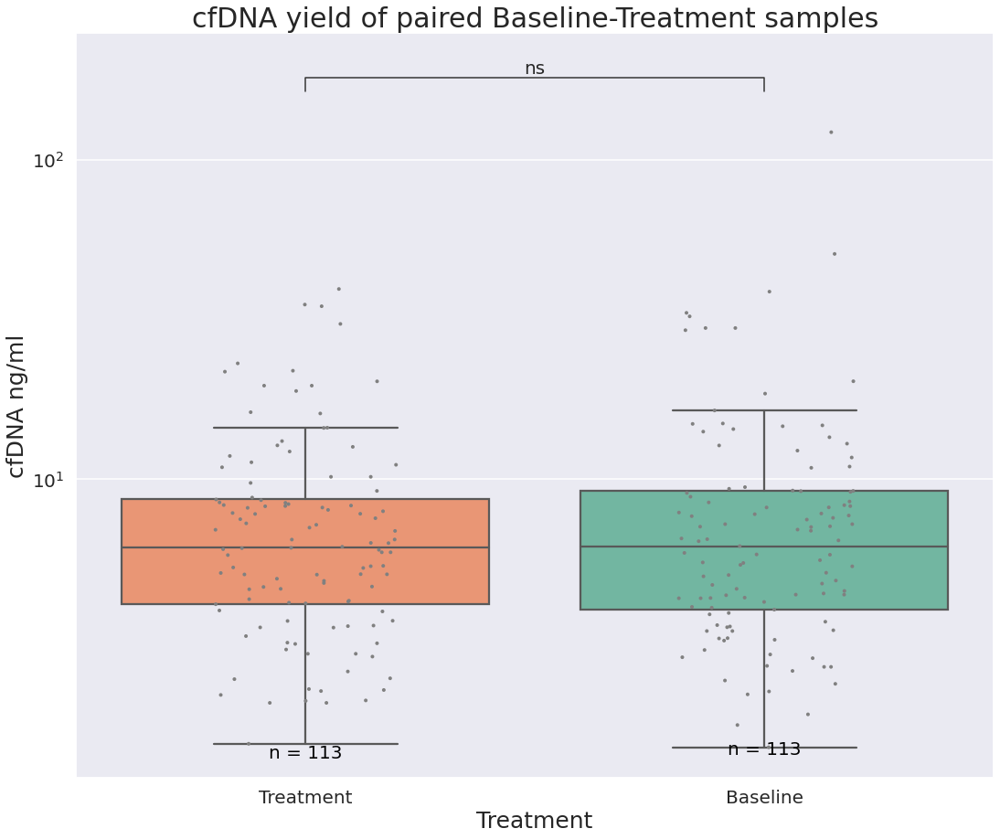

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Treatment vs. Baseline: t-test independent samples, P_val:1.769e-01 t=1.352e+00


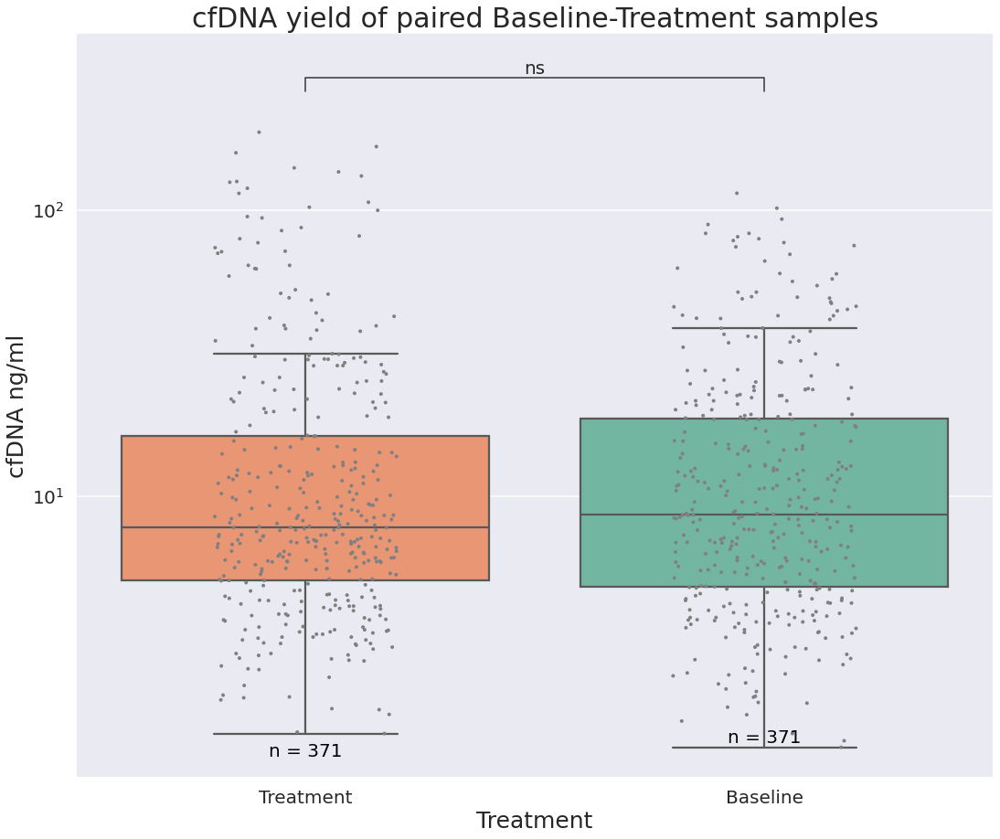

In [182]:
# For control cohort AZ SOW183&117

cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_lung_pair_az, 'cfDNA yield of paired Baseline-Treatment samples')
cfDNA_boxplot_by_paired_CSOpred_TreatmentvsBaseline_one_batch_with_annotation(top_prd_df_breast_pair_az, 'cfDNA yield of paired Baseline-Treatment samples')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

True_Baseline vs. True_Treatment: t-test independent samples, P_val:6.188e-01 t=4.990e-01
False_Baseline vs. False_Treatment: t-test independent samples, P_val:nan t=nan


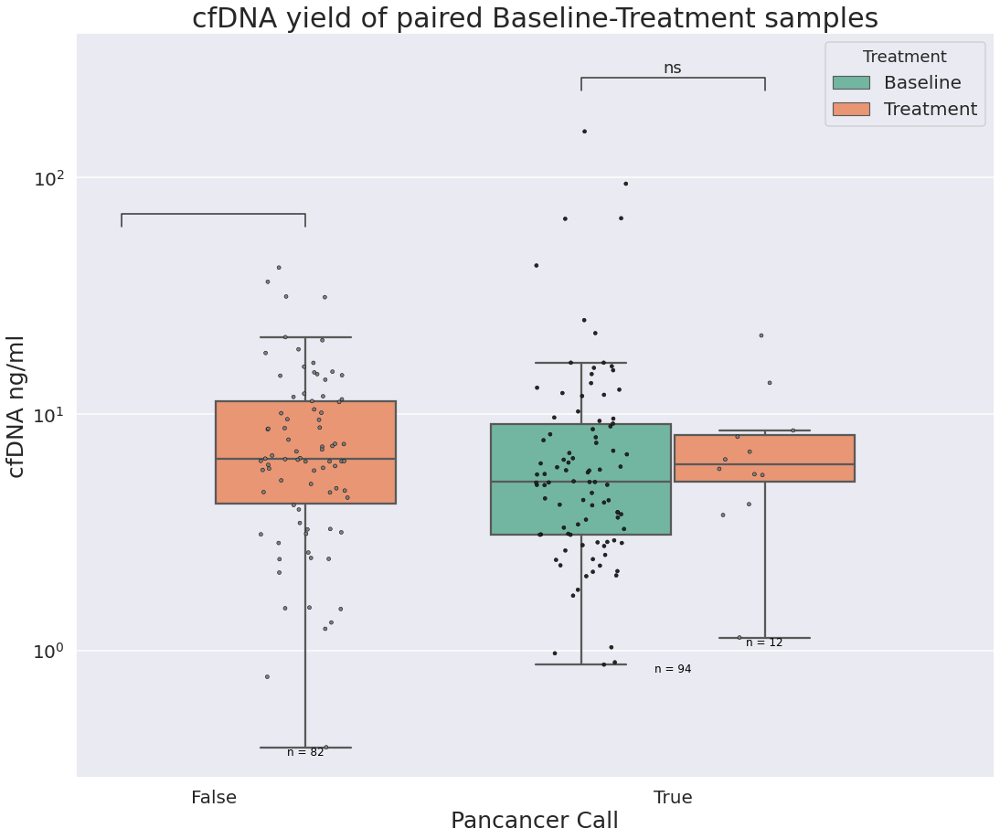

In [183]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_with_Pancancer_call_and_Treatment(df, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))
    sns.set_style('darkgrid')

    # Define order for 'treatment' and 'Pancancer_call'
    treatment_order = ['Baseline', 'Treatment']
    pancancer_order = sorted(df['Pancancer_call'].unique())

    # Create color palette
    treatment_colors = sns.color_palette("Set2", n_colors=len(treatment_order))
    color_map = {treatment: color for treatment, color in zip(treatment_order, treatment_colors)}

    # Create boxplot and stripplot
    box = sns.boxplot(data=df, x="Pancancer_call", y="cfDNA_ng", hue="treatment", hue_order=treatment_order,
                      order=pancancer_order, palette=color_map, ax=ax, dodge=True, showfliers=False)
    sns.stripplot(data=df, x="Pancancer_call", y="cfDNA_ng", hue="treatment", hue_order=treatment_order,
                  order=pancancer_order, color='gray', jitter=0.2, size=4, ax=ax, dodge=True, edgecolor='black', linewidth=0.5)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes, adjusted for hue and position
    for (pancancer_type, treatment_type), group in df.groupby(['Pancancer_call', 'treatment']):
        n = group.shape[0]
        x_pos = pancancer_order.index(pancancer_type) + (0.2 * treatment_order.index(treatment_type))
        y_pos = group['cfDNA_ng'].min() * 0.9
        ax.text(x_pos, y_pos, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # Setting up the Annotator with the appropriate pairs
    pairs = [((pancancer_order[i], treatment_order[0]), (pancancer_order[i], treatment_order[1]))
             for i in range(len(pancancer_order))]
    annotator = Annotator(ax, pairs, data=df, x="Pancancer_call", y="cfDNA_ng", hue="treatment", order=pancancer_order, hue_order=treatment_order)
    annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
    annotator.apply_and_annotate()

    # Fix the legend to display both boxes and strips
    handles, labels = ax.get_legend_handles_labels()
    new_labels, new_handles = [], []
    # Ensure each label appears only once
    for handle, label in zip(handles, labels):
        if label not in new_labels:
            new_labels.append(label)
            new_handles.append(handle)
    ax.legend(new_handles, new_labels, title='Treatment', fontsize=20, loc='best')

    # Set plot labels and title
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Pancancer Call', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.show()

# Example usage
cfDNA_boxplot_with_Pancancer_call_and_Treatment(top_prd_df_lung_pair, 'cfDNA yield of paired Baseline-Treatment samples')
